<a href="https://colab.research.google.com/github/MarkovMarkowitz/MarkovMarkowitz/blob/main/MPT_v554_MARKOV_REGIME.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### PROGRAM START AND INSTRUCTIONS <a name="start_and_instruct"></a>

In [ ]:
CURRENT_T2      = 97672             # FOR BIST 636945

import pandas

MyAssets = [
                      "CANTE.IS",
                   ]

MyShares = [
                        4958

                   ]

GecerliPF = pandas.Series(MyAssets, MyShares)


print(GecerliPF)


4958    CANTE.IS
dtype: object


### LINE NUMBER COUNT <a name="line_number"></a>

In [ ]:
#pandas.set_option('display.max_rows', None)

import os
root = "/Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK"
os.chdir(root)

with open(f"MPT_v553_MARKOV_PROCESS.ipynb", 'r') as fp:
    lines = len(fp.readlines())
    print('Toplam Satır sayısı:', lines)

Toplam Satır sayısı: 27353


In [ ]:
# -------------------------
#     CONFIGURATION PARAMS
# -------------------------

version = "553"



directory_path = os.getcwd()
print("Bulunulan dizin : " + directory_path)
from IPython.display import Image

# get the image
Image(url="MARKOVMAR5.1.png")




Bulunulan dizin : /Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK


In [ ]:
from IPython.display import Markdown as md

string = " BinPortföy V1.{} Portföy Yönetim Sistemi  ".format(version)

md(string)

 BinPortföy V1.553 Portföy Yönetim Sistemi  

<h1>BinPortföy &reg; AI Tabanlı Portföy Yönetim Sistemi </h1>
<h2>Yapay Zeka Tabanlı Portföy Tasarımı & Performans Raporlama Yazılımı </h2>
<h2>Markov Markowitz&reg; Şirketi 2022 - 2023 </h2>
<h4>Python ve Markdown kodlama : Alper Ülkü</h4>
<h4>Raporlama tarihi: Sys.Date() </h4>



In [ ]:

# -------------------------
#     EXCHANGE PARAMETERS
# -------------------------

risk_free_rate  = 0.25                  # FOR BIST
#risk_free_rate = 0.05                  # FOR S&P
#risk_free_rate = 0.065                 # FOR NSE

#CURRENT_T2     = 35970              00         # FOR S&P
#currency       = "INR"              0        # FOR NSE
currency        = "TL"                         # FOR BIST
#currency       = "USD"                       # FOR S&P

# ------------------------------
#     FILTER PARAMETERS
# ------------------------------

Tedbirli_Filtering   = True
Sharpe_Std_Filtering = True
Corr_Filtering       = True

SHARPE_LIMIT   = -2                     # FOR BIST 153
STD_LIMIT      = 4                     # FOR BIST  3.5
CORR_FILTER    = 0.75

# ------------------------------
#     FLOATING POINT CONVENTION
# ------------------------------

pandas.options.display.float_format = "{:,.3f}".format  # << INPUT

# ------------------------------
#     SIMULATION PARAMETERS
# ------------------------------
P_BOUND_HI = 1   # 0.19416                           # << 1 disinda bir degere sinirlayinca getiri azaliyor
P_BOUND_LO = 0   # 0.19416                           # << SIFIR KALMASI GEREKIYOR OPTIMIZASYON CONVERGE EDEMIYOR
LENGTH     = 100                                         # << INPUT for seperator length
CASES      = 50000                                       # << INPUT for $ of cases in the Montecarlo simulation
START_DAYS_AGO  = 140    # calibrated for 28.04.2022 on 7.09.22                           # << INPUT for forward testing period
BACKTEST_PERIOD = 140    # calibrated for 28.04.2022 on 7.09.22                          # << INPUT for backward testing period
FW_TEST_PERIOD  = 0  # calibrated for 28.04.2022 on 7.09.22
FW_TEST_LIMIT = 0

# ------------------------------
#     LIBRARY SETTINGS
# ------------------------------
# Installing and Importing the libraries

#!pip3 install pandas
#!pip3 install numpy
#!pip3 install matplotlib
#!pip3 install seaborn
#!pip3 install scipy
#!pip3 install nsepy
#!pip3 install yfinance


# Convert every TL entry to USD in dataframe
# pf_data[pf_data.columns].apply(lambda x: x/pf_data['TRY=X'])


In [ ]:
# from IPython.display import IFrame, display, HTML
# your_variable = 100
# html_skin = f"  <h2 style='color:blue'>Customer Name : {name}</h2>"
# html_skin = f"  <h2>Customer Name : {name}</h2>"
# display(HTML(html_skin))

### İçindekiler
1. [Import Libraries](#import_lib)
2. [Compare Assets for Best Sharpe Ratio](#Select_dataset)
3. [Set Working Directories ***CHANGE***](#Set_working_dir)
4. [Read Raw data file for assets ***CHANGE***](#Read_Raw_Datafile)
4. [Read TEDBIRLI HISSELER LISTESI from GEDIK](#Read_Banned)
5. [Set Ready-To-Go and Exclusion Lists](#Ready_Asset_List)
6. [Clean the Raw Asset List](#Clean_Asset_List)
7. [Initialize Global Inputs ***CHANGE***](#Initialize_Globals)
8. [Select Backtesting and Forward Testing Dates](#select_dates)
9. [Download Data for Backtesting and Prefilter Assets for SR > 3](#Download_BackTest)
10. [Filter Correlated Assets with Correlation more than 0.6](#filter_corr)
11. [STOCK_LIST BYPASS HERE](#STOCK_LIST_BY_PASS)
12. [DOWNLOAD_ASSETS FOR GIVEN DATES](#Download_Assets_For_Dates)
13. [Merge All CSV Files to form DF:li](#Merge_All_CSV_Files)
14. [Analyzing Data for Backtesting](#Analyze_BackTest)
15. [Generate random Markowitz portfolios via Montecarlo for Sharpe Analysis](#Generate_Markowitz)
15. [Find Optimal weights For Highest Sharpe Ratio and Least Drawdown](#Least_MDD)
16. [Find Optimal weights For Highest Sharpe Ratio](#Optimal_Sharpe)
17. [Present Optimal Portfolio For Highest Sharpe Ratio](#Optimal_Portfolio)
18. [Present Backtesting Performance](#Backtest_perf)
19. [Download Data for Forward Testing Performance](#download_fwtest)
20. [Present Forward Testing Performance](#present_fwtest)
21. [My Own Manual Portfolio Performance](#my_own)
22. [Present My Own Manual Portfolio Performance](#present_own)
23. [Create Shopping List for migration to Ideal PF](#shop_list)
24. [Send Ideal PF by Gmail](#send_gmail)
25. [IDEAL.csv PORTFOLIO PERFORMANCE](#ideal_csv)
25. [MYPF.csv PORTFOLIO PERFORMANCE](#mypf.csv_perf)
25. [Plot Sector Graph for Ideal PF](#sector_graph)
26. [Write Ideal PF to Yahoo Portfolio Compatible CSV file](#yahoo_pf)
27. ========= PROGRAM PAUSES HERE for you to export imported yahoo PF into EXPORT.csv ===
28. [Read PF From yahoo Portfolio again to calculate Last-Day-Weights of Selected PF](#Update_weights)
29. [Portföy Alpha ve Beta Parametrelerinin Hesabı](#alpha_beta)
30. [Index ve Portföyümüzün Risk ve Maksimum Çöküş Değerlerinin Hesaplanması](#vol_mdd)
31. [Send Ideal PF by Gmail](#send_gmail)
31. [IDEAL PORTFÖY PERFORMANSI GÖSTERİMİ](#ideal_pf_perf)
32. [My Own Portfolio (EXPORT.CSV) Performance](#my_pf_perf)
33. [MYPF.csv PORTFOLIO PERFORMANCE](#mypf.csv_perf)
34. [ALPHA BETA CALCULATIONS FOR MYPF](#alphabeta)
35. [SHAPIRO-WILK test for NORMALITY](#shapiro)
36. [ACF and PACF tests for Stationarity](#acf_pacf)
37. [TREND DETECTION AND BUY-SELL SIGNAL GENERATION FOR MYPF](#trend_detect)
38. [TIME SERIES STATISTICAL MODELS](#time_series)
39. [AUTOREGRESSIVE MODEL OPS](#autoregressive)
40. [MICROALPHAS TRAINING](#microalphas)
41. [TA-LIB OPERATIONS](#talib_ops)
42. [SQL OPERATIONS](#sql_ops)
43. [LINE NUMBER COUNT](#line_number)
44. [READ ALL PORTFOLIOS FROM YF PAGE](#read_portfolios)
45. [READ CUSTOMER INFOS FROM EXCEL FILE](#read_customers)
46. [CREATE REPORT FOR PROFORMA INVOICE (BORA)](#bora_invoice)
47. [CREATE REPORT FOR PROFORMA INVOICE (COŞKUN)](#coskun_invoice)
48. [CREATE REPORT FOR PROFORMA INVOICE (MURAT)](#murat_invoice)
49. [CREATE REPORT FOR PROFORMA INVOICE (ALPER)](#alper_invoice)
50. [CHECK IF BANNED ASSETS ARE INSIDE CURRENT PF](#BAN_CHECK)
60. [SEND_EMAIL_THRU_GMAIL](#SEND_GMAIL)





### BİTİRİLEN İŞLER LİSTESİ:
1. BinPortföy: En yüksek Sharpe Oranlı portföyün bulunması (12-13)
2. BinPortföy: Exchange'deki asset isimlerinin CSV dosyasından okunması ve filtrelenmesi (5-9)
3. BinPortföy: Önerilen Portföyün Yahoo Portfolio CSV'e dönüşümü (23'e eklendi)
4. BinPortföy: XU100 indexi ile hem grafik hen de beta hesabı yaparak karşılaştır (24)
5. BinPortföy: Hindistan borsası NSE eklendi.(4)
6. MM: BES'leri bozdur. (8.08.2022)
7. MM: Quantinsti Toplantı (10.08.2022)
8. MM ile konuş ve şirket kuruluş başvurusunu tamamla (Eylül 2022)
9. BinPortföy: XU100 ile portföy performans karşılaştırma tablosu (IDEAL.csv yi XU100 olarak sec)
10. BinPortföy: Alış Tarihi, Bugün Tarihi ve grafik dosyalarını eklenmesi, aslında tümü PDF rapor olarak daha iyi görünecek.
12. YAHOO PF'den tüm portföy listesinin indirilmesi ve liste halinde incelenmesi (temizleme islemleri halledilecek)
13. Baştan sona Markdown Raporunun Word ya da PDF olarak hazırlanması (HTML olarak tamam) şu komut ile halledildi. (7.01.2023) https://wkhtmltopdf.org/downloads.html den macos için yüklemek gerekti. Sonra bunları command line a yazıcaz:

!pip install jupyter_contrib_nbextensions
!os.chdir(root)
!jupyter nbconvert --no-input --to html MPT_v547_PROFORMA_OK.ipynb
!wkhtmltopdf MPT_v547_PROFORMA_OK.html MPT_v547_PROFORMA_OK.pdf


14. gmail i otomatik gondermede sorun olmamasi icin asagidaki adimlari zaman zaman yapmak gerekir?:

Create & use app passwords
Important: To create an app password, you need 2-Step Verification on your Google Account.

If you use 2-Step-Verification and get a "password incorrect" error when you sign in, you can try to use an app password.

Go to your Google Account.
Select Security
Under "Signing in to Google," select 2-Step Verification.
At the bottom of the page, select App passwords.
Enter a name that helps you remember where you’ll use the app password.
Select Generate.
To enter the app password, follow the instructions on your screen. The app password is the 16-character code that generates on your device.
Select Done.
If you’ve set up 2-Step Verification but can’t find the option to add an app password, it might be because:

https://myaccount.google.com/apppasswords?utm_source=google-account&utm_medium=myaccountsecurity&utm_campaign=tsv-settings&rapt=AEjHL4NP9qzMEQu5QY6i5d07rZ75hTfoYLvMJSjbsv7MbgBKgC7t866q25VxcHMWZXxxwmdp03CuHqoxMsBEkkpnGzaGqbcBpA

Your Google Account has 2-Step Verification set up only for security keys.
You’re logged into a work, school, or another organization account.
Your Google Account has Advanced Protection.
Tip: Usually, you’ll need to enter an app password once per app or device.


15. Quantinsti ile anlaşma imzası (associate member)
16. Marka başvurusu parasının yatır 1020 TL (15.01.2023)
17. BinPortföy: TL Dolara tum pf_data'nın bölünmesi
18. Iki python dosyasinin karşılaştırılması için

pip install nbdime

!nbdiff-web MPT_v550_REPORTLAB_WITH_FUNCTIONS.ipynb MPT_v550A_RELOCATED_MYPF.ipynb

### ÖNEMLİ HINDISTAN ELEŞTIRISI:
Temel eleştiri reel getirinin hesaplanması gerektiğine yönelik oldu. Onun için ilk olarak
tüm pf_data kolonlarının dolar fiyatına bölünmesini sağlamak gerek. 16 maddede halledildi (16.01.2023)

### ÖNEMLİ NOT:
S&P de BIST te olduğu gibi bir edge yakalanması mümkü değil gibi görünüyor. 100D-140D-183D-365D BK değeri için FW test sonuçları hiç iyi değil => bu durumda pasif olarak sadece %20 civarında spot dolar alıp bekletmek yeterli olacaktır.

### TO-DO LIST:
01. BinPortföy: CORRELATION FILTER sirasinda en iyi return getirenin seçilmesi
02. BinPortföy: RAPOR: Markdown Raporlama metninin hazırlanması (tipik bir raporu indir)
03. BinPortföy: RAPOR: Tedbirli hisselerin mevcut MYPF'den ayiklanmasi ve RAPORA eklenmesi
04. BinPortföy: RAPOR: Tüm Markdown'un renklendirilmesi
05. BinPortföy: RAPOR: Yahoo PF nın scrape edilmesi
06. BinPortföy: Tüm programın baştan fonksiyonlara dönüşümü OOP ye uygun olarak
07. BinPortföy: Django entegrasyonu



<!-- To START this JUPYTER FILE:

cd "/Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK"
conda activate MyPythonEnv
jupyter lab --allow-root

To CONVERT this PDF file without code:

jupyter nbconvert /Users/alperulku/EPAT-99-FINAL\ PROJECT/EPAT\ PROJECT\ WORK/MPT_v523_522_S\&P500.ipynb --to=pdf --TemplateExporter.exclude_input=True    
 -->

### Import Libraries <a name="import_lib"></a>

In [ ]:


# to measure exec time
from timeit import default_timer as timer
from datetime import date
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import minimize
from nsepy import *

#pd.set_option('display.max_rows', None)

import os
directory_path = os.getcwd()
print("Bulunulan dizin : " + directory_path)
folder_name = os.path.basename(directory_path)
print("Dosya ismi: " + folder_name)

from datetime import datetime
import time
import yfinance as yf

start_time = datetime.now()




Bulunulan dizin : /Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK
Dosya ismi: EPAT PROJECT WORK


In [ ]:
def AddToStockList(alist,item):
    a = []
    for i in alist:
        a.append(i)
    a.append(item)
    return (a)

def ConvertOunceToGram( a, b):
    multiply = []
    for number1, number2 in zip(a,b):
        multiply.append(number1 * number2 / 31.103477)
    return(multiply)


### Compare BIST500 Assets for Best Sharpe Ratio <a name="Select_dataset"></a>

In [ ]:


#start = datetime.date.today() - datetime.timedelta(DELTA)
#end   = datetime.date.today()

def InvestCompare(startTime, endTime, tickers, STD_LIMIT, SHARPE_LIMIT, START_DAYS_AGO, FW_TEST_PERIOD):
    # pull price data from yahoo -- (list(tickers.keys())) = ['^GSPC','^RUT']
    import datetime

    prices = pd.DataFrame()
    #prices = web.DataReader(tickers, "yahoo", startTime, endTime)["Adj Close"]
    # prices = web.DataReader(SELECTED_EXCHANGE, "yahoo", startTime, endTime)["Close"]
    print(f"======================================")
    print(f"Comparing assets for Sharpe and Std Dev")
    # prices = pdr.get_data_yahoo(SELECTED_EXCHANGE, startTime, endTime)
    # cols = ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
    # prices.reindex(columns=cols)

    names = []

    for tick in SELECTED_EXCHANGE:
        print(f"Downloading {tick}")
        yf_tick = yf.Ticker(tick)
        df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
        df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
        df.dropna(how='all', inplace=True)
        prices = pd.concat([prices,df['Close']],axis=1, ignore_index=False)
        #st_name = tick.split('.',maxsplit = 1)
        names.append(tick)

    prices.columns = names
    prices= prices.dropna()

    # USDTRY CONVERSION
    if 'TRY=X' in prices.columns:
        for i in prices.columns :
            if i != 'GC=F' and i != 'CL=F':
                prices[i] = pd.Series(prices[i] / prices['TRY=X'])

    returns = np.log(prices) - np.log(prices.shift(1))
    returns = returns.iloc[1:, 0:]

    investments = pd.DataFrame(returns.std()*100, columns=["Standart Sapma %"])
    investments["Ortalama Günlük Getiri %"] = pd.DataFrame(100 * returns.mean())
    investments["Sharpe Oranı"] = pd.DataFrame( 100 * (returns.mean() - Rfr_g ) / returns.std())
    investments["Net Dönem Getirisi %"] = pd.DataFrame(100 * (returns.sum() - Rfr))
    print(investments)
    filtered_inv = investments[ (investments['Standart Sapma %'] <= STD_LIMIT   ) &
                                (investments['Sharpe Oranı']     >= SHARPE_LIMIT)
                              ].sort_values(by=["Sharpe Oranı"], ascending=[False])

    return prices, filtered_inv



In [ ]:
def plot_sector_counts(sector_counts):

    bar = plt.subplot2grid((15,24), (0,0), rowspan=12, colspan=12)
    pie = plt.subplot2grid((15,24), (0,12), rowspan=12, colspan=12)

    # Bar chart
    sector_counts.plot(
        kind='bar',
        color='b',
        rot=45,
        ax=bar,
    )

    bar.set_title('Markov Markovitz PF %')

    # Pie chart
    sector_counts.plot(
        kind='pie',
        colormap='Set3',
        autopct='%.1f %%',
        fontsize=8,
        ax=pie,
    )
    pie.set_ylabel('')  # This overwrites default ylabel, which is None :(
    pie.set_title('Markov Markowitz PF %')

### Set Working Directories <a name="Set_working_dir"></a>

In [ ]:




#exchange = "BIST500"                   # << INPUT for exchange
#exchange = "SP500"                      # << INPUT
#exchange = "NSE"                      # << INPUT
#exchange = "CRYPTOS"                      # << INPUT
exchange = "BIST30"

dl = "/Users/alper/Downloads"           # << INPUT
root = f"E:\\ALL_FILES\\100_FINANCE\\EPAT\\ALL MODULES\\EPAT-99-FINAL PROJECT\\EPAT PROJECT WORK" # << INPUT
drv_path = f"{root}/chromedriver"       # << INPUT
url = 'https://www.tefas.gov.tr/TarihselVeriler.aspx' # << INPUT

dl = "/Users/alperulku/Downloads"
root = "/Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK"
drv_path = f"{root}/chromedriver"
url = 'https://www.tefas.gov.tr/TarihselVeriler.aspx'
wd = f"{root}/{exchange}"
out = f"{wd}" # << INPUT


os.chdir(root)
f1 = f"{wd}.csv" # << INPUT
print("filename =", f1)
root




filename = /Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK/BIST30.csv


'/Users/alperulku/EPAT-99-FINAL PROJECT/EPAT PROJECT WORK'

### Read TEDBIRLI HISSELER LISTESI from GEDIK <a name="Read_Banned"></a>

Write a new python program to read the table with selector = '#overlay-wrapper > div.row.subcontent > div.large-8.end.medium-6.small-12.columns > div > table' , on the web page "https://www.gedik.com/bilgi-egitimler/tedbirli-hisseler", display this table as a dataframe and save this dataframe as csv file. Show comments in your program, show me the most efficient code.

In [ ]:
# # Import the required libraries
# import requests
# import pandas as pd
# from bs4 import BeautifulSoup

# # Send an HTTP GET request to the web page
# response = requests.get("https://www.gedik.com/bilgi-egitimler/tedbirli-hisseler")

# # Parse the HTML content
# soup = BeautifulSoup(response.content, "html.parser")

# # Find the table element with the specified selector
# table = soup.select_one("#overlay-wrapper > div.row.subcontent > div.large-8.end.medium-6.small-12.columns > div > table")

# # Extract the data from the table and store it in a list of rows
# data = []
# for row in table.find_all("tr"):
#     cells = row.find_all("td")
#     cells = [cell.text.strip() for cell in cells]
#     data.append(cells)

# # Create a Pandas DataFrame from the data
# TEDBIRLI_DF = pd.DataFrame(data[1:], columns=data[0])

# # Display the DataFrame
# #print(df)

# # Save the DataFrame as a CSV file
# TEDBIRLI_HISSELER = TEDBIRLI_DF['TEDBİRLİ HİSSE']+".IS"
# TEDBIRLI_DF['TEDBİRLİ HİSSE'] += ".IS"
# TEDBIRLI_DF.to_csv("tedbirli_hisseler.csv", index=False)
# TEDBIRLI_DF

### Set Ready-To-Go and Exclusion Lists <a name="Ready_Asset_List"></a>

In [ ]:
# "RYSAS.IS" in TEDBIRLI_HISSELER.values

In [ ]:

stock_list = [ "AKCNS.IS",  "AKSA.IS" ,"AKSEN.IS", "ALARK.IS","ARDYZ.IS", "ARENA.IS", "ARSAN.IS","ASELS.IS",
             "BERA.IS" ,"BIMAS.IS","BRYAT.IS", "CLEBI.IS", "DOHOL.IS", "EKGYO.IS","FROTO.IS",
             "GLYHO.IS","GUBRF.IS","GARAN.IS", "GSDHO.IS", "HDFGS.IS", "HALKB.IS",
             "HEKTS.IS","IPEKE.IS","INDES.IS", "INFO.IS" , "ISMEN.IS",
             "KAREL.IS","KRDMD.IS", "KORDS.IS", "KARSN.IS",
             "KOZAA.IS","MGROS.IS", "ODAS.IS" , "OTKAR.IS", "PGSUS.IS", "PKART.IS","PETKM.IS",
             "SASA.IS" ,"SKTAS.IS", "SKBNK.IS", "SOKM.IS" ,
             "TAVHL.IS","TTRAK.IS","TCELL.IS", "TOASO.IS", "TSKB.IS" , "TURSG.IS", "TKFEN.IS",
             "TUPRS.IS","VESBE.IS", "VAKBN.IS", "VESTL.IS", "YKBNK.IS", "YATAS.IS", "AEFES.IS"]

BIST100 = [

           "AEFES.IS", "AKSEN.IS","ALARK.IS", "ARCLK.IS", "ARDYZ.IS", "ARSAN.IS", "BIMAS.IS",
           "GARAN.IS","GSDHO.IS","HDFGS.IS", "INFO.IS" , "ISCTR.IS", "ISMEN.IS", "BRYAT.IS", "DOHOL.IS",
           "KAREL.IS","KCHOL.IS","KRDMD.IS", "SISE.IS" , "SKTAS.IS",  "EKGYO.IS", "ENJSA.IS",
           "THYAO.IS","TUPRS.IS","VESBE.IS", "BERA.IS" , "XU100.IS", "CLEBI.IS", "GLYHO.IS", "GUBRF.IS",
           "HEKTS.IS","INDES.IS","SASA.IS" , "TTRAK.IS", "PKART.IS", "FROTO.IS", "HALKB.IS", "IPEKE.IS",
           "KORDS.IS","EREGL.IS", "KCHOL.IS", "ASELS.IS", "YKBNK.IS", "PETKM.IS",
           "INDES.IS","ARENA.IS","KOZAA.IS", "KOZAL.IS", "MGROS.IS", "ODAS.IS" , "OTKAR.IS", "PGSUS.IS",
           "SAHOL.IS","SKBNK.IS","SOKM.IS" , "TCELL.IS", "TOASO.IS", "TSKB.IS" , "TTKOM.IS", "TURSG.IS",
           "VAKBN.IS","VESTL.IS","ADESE.IS", "AEFES.IS", "AKSA.IS" , "ALGYO.IS", "ALKIM.IS",
           "AYDEM.IS","BAGFS.IS",
           "ALGYO.IS", "BRMEN.IS", "CANTE.IS", "CCOLA.IS", "CEMAS.IS", "CIMSA.IS",
           "CMENT.IS", "DEVA.IS",  "DOAS.IS",  "DOHOL.IS", "ENKAI.IS",
           "ERBOS.IS", "ETILR.IS", "GOZDE.IS", "ISBIR.IS",
           "ISDMR.IS", "ISFIN.IS", "ISYAT.IS", "IZMDC.IS", "KARTN.IS", "KERVT.IS", #GCM'de sorunlu - TBORG ve KENT
           "KLNMA.IS", "MAVI.IS",  "NTHOL.IS",  "OYAKC.IS",
           "PARSN.IS", "PETKM.IS", "QNBFL.IS", "QUAGR.IS", "RTALB.IS", "SARKY.IS",
           "SELEC.IS", "TKNSA.IS", "TRGYO.IS", "ULKER.IS", #"UTPYA.IS",
           "VERUS.IS", "YATAS.IS", "ZOREN.IS",
           "AKBNK.IS", "EGEEN.IS", "TAVHL.IS", "KARSN.IS", "ECILC.IS", "TKFEN.IS",
          # "TRY=X"   , "GC=F"
            ]

MINUS = [ "ISGYO.IS"  ]

TI3 = [
        # "ANHYT.IS",
        "ANSGR.IS",
        "ISCTR.IS",
        "ISFIN.IS",
        # "ISGSY.IS",
        "ISGYO.IS",
        "ISMEN.IS",
        "ISYAT.IS",
        "SISE.IS",
        "TSGYO.IS",
        "TSKB.IS",
      ]

DOW30 =[
         "AXP","AMGN","AAPL","BA","CAT","CSCO","CVX","GS","HD","HON","IBM","INTC",
          "JNJ","KO","JPM","MCD","MMM","MRK","MSFT","NKE","PG","TRV","UNH","CRM",
          "VZ","V","WBA","WMT","DIS","DOW"]

NASDAQ30 = [
                "AMGN",
                "MAR",
                "ATVI",
                "SBUX",
                "DLTR",
                "PCAR",
                "MDLZ",
                "SIRI",
                "KDP",
                "HON",
                "FISV",
                "VRSK",
                "VRSN",
                "AZN",
                "BIDU",
                "AMAT",
                "MRNA",
                "FTNT",
                "CEG",
                "ZS",
                "ZM",
                "JD",
                "MCH",
                "AAPL",
                "MRVL",
                "INTU",
                "DOCU",
                "MELI",
                "ILMN",
                "TSLA"
            ]

CRYPTOS = [

"BTC-USD",
"ETH-USD",
"USDT-USD",
"BNB-USD",
"USDC-USD",
"XRP-USD",
"SOL-USD",
"LUNA1-USD",
"ADA-USD",
"HEX-USD",
"AVAX-USD",
"UST-USD",
#"DOT-USD",
"DOGE-USD",
"BUSD-USD",
"SHIB-USD",
"WBTC-USD",
"MATIC-USD",
"STETH-USD",
"NEAR-USD",
"CRO-USD",
"DAI-USD",
"LTC-USD",
"TRX-USD",
#"WTRX-USD",
"ATOM-USD",
"LINK-USD",
"UNI1-USD",
"BCH-USD",
"LEO-USD"

          ]

USD_EUR = ["TRY=X", "EURTRY=X"]
USDTR_GOLD = ["GC=F", "TRY=X", "EURTRY=X"]
Metals = ["GC=F", "TRY=X",  "SI=F"]
Metals_Oil = ["GC=F",  "SI=F", "CL=F"]
Gold_Oil_ETFS = ["AAAU",  "GDX", "OIL"]


Exotics = [ "BTC-USD", "ETH-USD" ]
'''
UTILITY U=017 : SET_WORKING_AND DOWNLOADS_DIR_PATHS
--------------------------------------------
- SETS variables for working directory (as may change from compuet to computer)
- SETS downloads directory (as may change from compuet to computer)
- SETS download web site
'''
# stock_list = Filtered_Stocks

BIST500_A = [ "OYAYO.IS", "KLKIM.IS", "LINK.IS", "IDEAS.IS", "KRGYO.IS", "PINSU.IS","MNDRS.IS",
              "PEGYO.IS", "OLMK.IS", "ULUUN.IS", "MARTI.IS", "TIRE.IS",
              "SANFM.IS", "BLCYT.IS", "IZFAS.IS", "FONET.IS","KAPLM.IS", "YAYLA.IS", "KONYA.IS"]

Exclusion_SP500 = [ "XLNX", "WYN", "WLTW", "HCN","VIAB", "VAR", "UTX", "TSS", "TMK", "TWX", "TIF",
                    "SYMC", "STI", "SNI", "SCG", "COL", "RHT", "RTN", "PCLN", "PBCT", "NBL",
                    "NFX", "MYL", "KORS", "LUK", "LB", "KSU", "JEC", "INFO", "HRS", "GGP",
                    "FLIR", "ESRX", "EVHC", "ETFC", "DPS", "DWDP", "DISCK", "DISCA", "CSRA",
                    "CXO", "XEC", "CTL", "CELG", "CBS", "CBG", "COG", "CA", "BF.B", "BRK.B",
                    "BBT", "BHGE", "ANDV", "ADS", "AGN", "ALXN", "AET", "APC", "CERN", "MON",
                    "NWSA", "WBA", "ANTM", "BLL", "BRK.B", "BF.B"
                 ]

EX = [
                     "ADANA.IS", "ADBGR.IS", "ADNAC.IS", "AFMAS.IS","AKFEN.IS", "AKGUV.IS", "AKPAZ.IS", "ALNTF.IS",
                     "ALTIN.IS", "ALYAG.IS", "ANACM.IS", "ANSA.IS" ,"ARFYO.IS", "ARTOG.IS", "ASLAN.IS", "ASYAB.IS",
                     "ATAC.IS",  "ATPET.IS", "AVIVA.IS", "BAYRD.IS", "BISAS.IS", "BMEKS.IS", "BOLUC.IS",
                     "BOYNR.IS", "BROVA.IS", "BSHEV.IS", "CARFA.IS", "CARFB.IS", "CBSBO.IS",
                     "COMDO.IS", "DENCM.IS", "DENIZ.IS", "DENTA.IS", "DNZYO.IS", "DYHOL.IS",
                     "ECBYO.IS", "ECYAP.IS", "EGLYO.IS", "EGYO.IS", "EMBYO.IS", "ESEMS.IS",
                     "EUROM.IS", "FFKRL.IS", "FINBN.IS", "FNSYO.IS", "FONFK.IS", "FVORI.IS",
                     "GDKGS.IS", "GDKYO.IS", "GUSGR.IS", "HITIT.IS", "HZNDR.IS", "ICGYH.IS",
                     "IDAS.IS",  "IHMAD.IS", "ISGSY.IS", "ISKUR.IS", "ISYHO.IS", "KARKM.IS",
                     "KILER.IS", "KLBMO.IS", "KOMHL.IS", "KPHOL.IS", "KRATL.IS", "KRSAN.IS",
                     "KSTUR.IS", "LATEK.IS", "LTHOL.IS", "MANGO.IS", "MATAS.IS", "MCTAS.IS",
                     "MRDIN.IS", "MRTGG.IS", "MUTLU.IS", "NTTUR.IS", "OLMIP.IS", "OZBAL.IS",
                     "PIMAS.IS", "PRTAS.IS", "PTOFS.IS", "RANLO.IS", "SAFGY.IS", "SODA.IS",
                     "TACTR.IS", "TARAF.IS", "TATKS.IS", "TCRYO.IS", "TEBNK.IS", "TEKST.IS",
                     "TEPAS.IS", "TKURU.IS", "TRKCM.IS", "TRNSK.IS", "TUDDF.IS", "UCAK.IS",
                     "UNYEC.IS", "UYUM.IS", "VKBYO.IS",  "YKGYO.IS", "YKSGR.IS",
                     "DGZTE.IS", "SKPLC.IS", "YAZIC.IS", "YKBYO.IS", "ADEL.IS",  "ASCEL.IS",
     ]




Exclusion_BIST500 = [
                     "ATSYH.IS",
                     "ADANA.IS", "ADBGR.IS", "ADNAC.IS", "AFMAS.IS","AKFEN.IS", "AKGUV.IS", "AKPAZ.IS", "ALNTF.IS",
                     "ALTIN.IS", "ALYAG.IS", "ANACM.IS", "ANSA.IS" ,"ARFYO.IS", "ARTOG.IS", "ARTI.IS",  "ASLAN.IS", "ASYAB.IS",
                     "ATAC.IS",  "ATPET.IS", "AVIVA.IS", "BAYRD.IS", "BISAS.IS", "BMEKS.IS","BOLUC.IS", "BMELK.IS",
                     "BOYNR.IS", "BROVA.IS", "BSHEV.IS", "CARFA.IS", "CARFB.IS", "CBSBO.IS", "CASA.IS",
                     "COMDO.IS", "DENCM.IS", "DENIZ.IS", "DENTA.IS", "DNZYO.IS", "DYHOL.IS", "DARDL.IS", "DIRIT.IS",
                     "ECBYO.IS", "ECYAP.IS", "EGLYO.IS", "EGYO.IS",  "EMBYO.IS", "ESEMS.IS", "EGCEY.IS", "EGCYO.IS", "EGCYH.IS", "EPLAS.IS",
                     "EUROM.IS", "FFKRL.IS", "FINBN.IS", "FNSYO.IS", "FONFK.IS", "FVORI.IS", "EKIZ.IS",
                     "GDKGS.IS", "GDKYO.IS", "GUSGR.IS", "HITIT.IS", "HZNDR.IS", "ICGYH.IS",
                     "IDAS.IS",  "IHMAD.IS", "ISGSY.IS", "ISKUR.IS", "ISYHO.IS", "KARKM.IS",
                     "KILER.IS", "KLBMO.IS", "KOMHL.IS", "KPHOL.IS", "KRATL.IS", "KRSAN.IS",
                     "KSTUR.IS", "LATEK.IS", "LTHOL.IS", "MANGO.IS", "MATAS.IS", "MCTAS.IS",
                     "MRDIN.IS", "MRTGG.IS", "MUTLU.IS", "NTTUR.IS", "OLMIP.IS", "OZBAL.IS",
                     "PIMAS.IS", "PRTAS.IS", "PTOFS.IS", "RANLO.IS", "SAFGY.IS", "SODA.IS",
                     "TACTR.IS", "TARAF.IS", "TATKS.IS", "TCRYO.IS", "TEBNK.IS", "TEKST.IS",
                     "TEPAS.IS", "TKURU.IS", "TRKCM.IS", "TRNSK.IS", "TUDDF.IS", "UCAK.IS",
                     "UNYEC.IS", "UYUM.IS", "VKBYO.IS",  "YKGYO.IS", "YKSGR.IS", "ISATR.IS",
                     "DGZTE.IS", "SKPLC.IS", "YAZIC.IS", "YKBYO.IS", "ADEL.IS",  "ASCEL.IS", "ACSEL.IS",
                     "FENER.IS", "GSRAY.IS", "TSPOR.IS", "COSMO.IS", "BRKO.IS",  "SELGD.IS", #TAKIM HİSSELERİNE GÜVENMIYORUZ
                     "EUKYO.IS", "ORMA.IS", "DURDO.IS", "CMENT.IS",  "MERKO.IS", "BFREN.IS", "YBTAS.IS", "TIRE.IS", "BAKAB.IS", "MERIT.IS"
                    ]


    # son 4 ü yine alımda risk formu istiyor





YASAKLI_BIST500 = [   "ADESE.IS", "KRTEK.IS",
                     "ATSYH.IS", "AKSUE.IS", "ARASE.IS", "ASUZU.IS", "ATAGY.IS", "ATSYH.IS", "AVOD.IS", "BAKAB.IS"
                     "BRMEN.IS", "BRYAT.IS", "CRDFA.IS", "DERHL.IS", "DESA.IS", "DOGUB.IS", "DYOBY.IS", "ELITE.IS",
                     "FADE.IS",  "GLBMD.IS",  "GRNYO.IS",  "HEDEF.IS", "HKTM.IS", "HUNER.IS", "IEYHO.IS", "IHAAS.IS",
                     "INVEO.IS", "ISFIN.IS", "KAPLM.IS", "KIMMR.IS", "KMPUR.IS", "KZBGY.IS", "MEGAP.IS", "MERKO.IS",
                     "MTRKS.IS", "NTGAZ.IS", "NTHOL.IS", "PAGYO.IS", "PETUN.IS", "PINSU.IS", "RODRG.IS", "ROYAL.IS",
                     "SUWEN.IS", "TEKTU.IS", "ULUFA.IS", "UNLU.IS",  "ZOREN.IS", "ZRGYO.IS",
                     "TSKB.IS",  "SKBNK.IS", "ISGYO.IS", "SERVE.IS", "UTPYA.IS", "XU100.IS",

                    ]


Exclusion_NSE = [ 'MOTHERSUMI.NS','RUCHI.NS', 'MINDAIND.NS', 'SUPPETRO.NS', 'COSMOFILMS.NS',
                  'SHIL.NS', 'SHIL.NS', 'KPIGLOBAL.NS', 'EMAMIPAP.NS', 'EMAMIPAP.NS',
                  'ARTEMISMED.NS', 'KOKUYOCMLN.NS', 'BETA.NS', 'ZUARIGLOB.NS', 'BBTCL.NS',
                  'INNOVANA.NS', 'CEBBCO.NS','KNAGRI.NS','NRL.NS','ROHITFERRO.NS',
                  'EMKAYTOOLS.NS', 'PENTAGOLD.NS', 'KOTYARK.NS', 'EUROBOND.NS','SIGMA.NS',
                  'BEWLTD.NS','SHIGAN.NS','MADHAVBAUG.NS','OSIAHYPER.NS','PAVNAIND.NS',
                  'JAINAM.NS',



                ]

BIST30YENI = [ 'AKBNK.IS', 'ASTOR.IS','ALARK.IS','ARCLK.IS','ASELS.IS', 'BIMAS.IS', 'BRMEN.IS', 'CMENT.IS','EKGYO.IS',
           'ENKAI.IS', 'EREGL.IS', 'FROTO.IS', 'GARAN.IS', 'GUBRF.IS', 'HEKTS.IS','ISCTR.IS', 'ISBIR.IS', 'KENT.IS',
           'KOZAA.IS', 'KOZAL.IS', 'KCHOL.IS', 'KLNMA.IS', 'KRDMD.IS', 'ODAS.IS', 'PETKM.IS', 'PGSUS.IS', 'QNBFB.IS','IZINV.IS',
           'SAHOL.IS', 'SASA.IS', 'SISE.IS', 'SNKRN.IS','TAVHL.IS', 'TBORG.IS','TCELL.IS', 'THYAO.IS', 'TOASO.IS',
           'TUPRS.IS', 'YKBNK.IS']


BIST30 = [ 'AKBNK.IS', 'AKSEN.IS','ALARK.IS','ARCLK.IS','ASELS.IS','BIMAS.IS','EKGYO.IS',
           'ENKAI.IS', 'EREGL.IS', 'FROTO.IS', 'GARAN.IS', 'GUBRF.IS', 'HEKTS.IS','ISCTR.IS',
           'KOZAA.IS', 'KOZAL.IS', 'KCHOL.IS', 'KRDMD.IS', 'ODAS.IS', 'PETKM.IS', 'PGSUS.IS',
           'SAHOL.IS', 'SISE.IS', 'TAVHL.IS', 'TCELL.IS', 'THYAO.IS', 'TOASO.IS',
           'TUPRS.IS', 'YKBNK.IS']

BIST30YENI = [ 'AKBNK.IS', 'ASTOR.IS','ALARK.IS','ARCLK.IS','ASELS.IS', 'BIMAS.IS', 'BRMEN.IS', 'CMENT.IS','EKGYO.IS',
           'ENKAI.IS', 'EREGL.IS', 'FROTO.IS', 'GARAN.IS', 'GUBRF.IS', 'HEKTS.IS','ISCTR.IS', 'ISBIR.IS', 'KENT.IS',
           'KOZAA.IS', 'KOZAL.IS', 'KCHOL.IS', 'KLNMA.IS', 'KRDMD.IS', 'ODAS.IS', 'PETKM.IS', 'PGSUS.IS', 'QNBFB.IS','IZINV.IS',
           'SAHOL.IS', 'SASA.IS', 'SISE.IS', 'SNKRN.IS','TAVHL.IS', 'TBORG.IS','TCELL.IS', 'THYAO.IS', 'TOASO.IS',
           'TUPRS.IS', 'YKBNK.IS']


#ILAVE = [ 'PRZMA.IS',	"CANTE", 'PEGYO.IS', 'ANSGR.IS',	'VAKKO.IS',	'QUAGR.IS','MGROS.IS',	'AKCNS.IS' ] #,   'CANTE.IS' ]
ILAVE = [ 	'QUAGR.IS' , "TURSG.IS"] # 'CANTE.IS', "EUPWR.IS","AEFES.IS", "TRGYO.IS"  ]


TR_ADDITIONS= [ "EURTRY=X", "TRY=X"]
#TR_ADDITIONS= ["QUAGR.IS", "CANTE.IS"]
US_ADDITIONS= [ "CL=F", "GC=F"]

BIST30 = BIST30 + ILAVE


# USDTRY CONVERSION

def AddTRYXToStockList(sl):
    if exchange == "BIST500" or exchange == "BIST30":
        if 'TRY=X' not in sl:
            sl = AddToStockList(sl, 'TRY=X')
            return sl

In [ ]:
def SelectExchange(exchange):

    # "CANTE.IS",

    if  "BIST500" in f1:
        df = pd.read_csv(f1, delimiter = ";")
        df.Kod = df.Kod + ".IS"
        BIST500 = df.Kod      # << INPUT
        #s_row = pd.Series(["XU100.IS", "CANTE.IS", "QUAGR.IS", "TRY=X", "EURTRY=X", "GC=F"])    # INPUT eğer dolar euro altın eklenecek ise
        s_row = pd.Series(TR_ADDITIONS)
        BIST500 = BIST500.append(s_row,ignore_index=True)
        SELECTED_EXCHANGE = BIST500

    elif  "BIST30" in f1:
        SELECTED_EXCHANGE = BIST30

    elif "SP500" in f1:
        # df = pd.read_csv(f1)
        # SP500 = df.Symbol      # << INPUT
        url = r'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
        #url = r'https://www.wikiwand.com/en/List_of_companies_listed_on_the_National_Stock_Exchange_of_India'
        tables = pd.read_html(url) # Returns list of all tables on page
        sp500_table = tables[0] # Select table of interest
        SELECTED_EXCHANGE = sp500_table.Symbol
        s_row = pd.Series(US_ADDITIONS)
        SELECTED_EXCHANGE = SELECTED_EXCHANGE.append(s_row,ignore_index=True)


    elif "NSE" in f1:
        df = pd.read_excel("MCAP31032022.xlsx")
        df.Symbol = df.Symbol + ".NS"
        NSE500 = df.Symbol      # << INPUT
        SELECTED_EXCHANGE = NSE500.sample(500)


    elif "CRYPTOS" in f1:
        SELECTED_EXCHANGE = CRYPTOS

    return(SELECTED_EXCHANGE)

SELECTED_EXCHANGE = SelectExchange(exchange)


### Clean the Raw Asset Lists using Exclusion Lists <a name="Clean_Asset_List"></a>

In [ ]:
type(SELECTED_EXCHANGE)

list

In [ ]:
len(SELECTED_EXCHANGE)

31

In [ ]:
def Clean_List(my_list, exclusion_list):
    new_list = []
    count = 0
    for i in my_list:
        if i in exclusion_list:
            continue
        else:
            new_list.append(i)
    return new_list


In [ ]:
def flatten(input):
    new_list = []
    for i in input:
        for j in i:
            new_list.append(j)
    return new_list


if  exchange == "BIST500":
    if Tedbirli_Filtering:
        temp = list(Clean_List( pd.DataFrame(SELECTED_EXCHANGE).values,   pd.DataFrame(Exclusion_BIST500).values ))
        temp = list(Clean_List( pd.DataFrame(temp).values,                pd.DataFrame(YASAKLI_BIST500).values ))
        # temp = list(Clean_List( pd.DataFrame(temp).values,                pd.DataFrame(TEDBIRLI_HISSELER).values ))
        SELECTED_EXCHANGE = flatten(temp)

#     SELECTED_EXCHANGE = Clean_List(   SELECTED_EXCHANGE, Exclusion_BIST500  )
#     SELECTED_EXCHANGE = Clean_List(   SELECTED_EXCHANGE, YASAKLI_BIST500    )
#     SELECTED_EXCHANGE = Clean_List(   SELECTED_EXCHANGE, TEDBIRLI_HISSELER  )

elif exchange == "SP500":
    temp = Clean_List( SELECTED_EXCHANGE,   Exclusion_SP500 )
    SELECTED_EXCHANGE = temp
elif exchange == "NSE":
    temp = Clean_List( SELECTED_EXCHANGE,   Exclusion_NSE )





In [ ]:
"GDKGS.IS" in SELECTED_EXCHANGE

False

In [ ]:
np.shape(SELECTED_EXCHANGE)

(31,)

In [ ]:
len(SELECTED_EXCHANGE)

31

In [ ]:
# "BAKAB.IS" in pd.DataFrame(TEDBIRLI_HISSELER).values

In [ ]:
# !pip install fix_yahoo_finance
# !pip install yfinance --upgrade --no-cache-dir

#import fix_yahoo_finance

def FilterCorrelated(SELECTED_EXCHANGE, CORR_FILTER, startTime, endTime):

    prices = pd.DataFrame()
    print(f"======================================")
    print(f"Comparing assets for Cross Correlation")
    # prices = pdr.get_data_yahoo(SELECTED_EXCHANGE, startTime, endTime)
    # cols = ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
    # prices.reindex(columns=cols)

    names = []

    for tick in SELECTED_EXCHANGE:
        print(f"Downloading {tick}")
        yf_tick = yf.Ticker(tick)
        df = yf_tick.history(interval='1d', auto_adjust=True, start=startTime, end=endTime, back_adjust = True, rounding=True)
        df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
        df.dropna(how='all', inplace=True)
        prices = pd.concat([prices,df['Close']],axis=1, ignore_index=False)
        #st_name = tick.split('.',maxsplit = 1)
        names.append(tick)

    prices.columns = names
    prices= prices.dropna()

    returns = np.log(prices) - np.log(prices.shift(1))
    returns = returns.iloc[1:, 0:]
    p_return = prices.iloc[-1] / prices.iloc[0] - 1

    LR = returns.dropna()
    correlation = LR.corr()
    numeric_columns = LR.columns

    #plt.figure(figsize=(22,22))
    #sns.heatmap(correlation>= CORR_FILTER,linecolor='white',linewidths=1,annot=True)

    high_corr = [ ]

    for c1 in LR.columns:
        for c2 in LR.columns:
            if c1 != c2 and c1 not in high_corr and correlation[c1][c2] > CORR_FILTER and p_return[c1] < p_return[c2]:
                  high_corr.append(c1)

    print("\nHighly Correlated Assets = ", high_corr)
    SELECTED_EXCHANGE = list(set(SELECTED_EXCHANGE) - set(high_corr))
    print("\nNew asset list = ", SELECTED_EXCHANGE)
    SELECTED_EXCHANGE
    print('\nNew asset count =', len(SELECTED_EXCHANGE))
    return SELECTED_EXCHANGE


### Initialize Global Inputs <a name="Initialize_Globals"></a>\

In [ ]:


look_back       = START_DAYS_AGO
Rfr_g = risk_free_rate / 365 # << INPUT calculate daily rfr
Rfr = Rfr_g * START_DAYS_AGO                        # << INPUT calculate rfr for the period
#stock_list = pd.DataFrame(SELECTED_EXCHANGE)                      # << INPUT for asset list to be processed# << INPUT for asset list to be processed
stock_list = SELECTED_EXCHANGE



In [ ]:
type(stock_list)


list

### Select Backtesting and Forward Testing Dates <a name="select_dates"></a>

In [ ]:
len(stock_list)


31

In [ ]:
'''
UTILITY U=006 : RETRO_DAY_CALCULATOR WITH SELECTING WEEKDAY ONLY
---------------------------------------------------------------
- OUTPUTS n days later or before with argument inside the timedelta() function
-

4 Temmuz PAZARTESI GUNDUZ ISLETILEN PROGRAMIN PARAMETRELERI
=================================================
8/3/5 de 5 te 4 tane tavan kagidi yakaladi
8/3/5 de 3 te 3 tavan kagidi yakaladi

Current Date:   2022-07-04
T0 Start date:  2022-06-26
T0 End date:    2022-06-30
T1 Start date:  2022-07-01
T1 End date:    2022-07-03
END_DATE_M1:    2022-07-01


9/3/6 da 4 te 4 yakaladi
7/3/4 da 2 te 2 yakaladi
7/3/5 de 7 de 6 yakaladi
9/4/5 hic olmadi

'''


def CalculateStartEndTimes(look_back, BACKTEST_PERIOD, FW_TEST_PERIOD):
    from datetime import date, timedelta

    def prev_weekday(adate):
        adate -= timedelta(days=1)
        while adate.weekday() > 4: # Mon-Fri are 0-4
            adate -= timedelta(days=1)
        return adate

    current_date = date.today().isoformat()


    T0_START = ( date.today() - timedelta( days = look_back))
    T0_END   = ( T0_START + timedelta( days = BACKTEST_PERIOD ))
    T1_START = ( T0_END   + timedelta( days = 1 ))
    T1_END   = ( T1_START + timedelta( days = FW_TEST_PERIOD ))

    END_DATE_M1 =  prev_weekday(T1_END)

    print(70*'=')
    print("SIMULATION DATES")
    print(70*'=')
    print("Current Date:  ",current_date)
    print("T0 Start date: ", T0_START)
    print("T0 End date:   ", T0_END)
    print("T1 Start date: ", T1_START)
    print("T1 End date:   ", T1_END)
    print("END_DATE_M1:   ", END_DATE_M1)
    print(70*'-')
    return T0_START, T0_END, T1_START, T1_END, END_DATE_M1

T0_START, T0_END, T1_START, T1_END, END_DATE_M1 = CalculateStartEndTimes(look_back, BACKTEST_PERIOD, FW_TEST_PERIOD)

SIMULATION DATES
Current Date:   2023-08-06
T0 Start date:  2023-03-19
T0 End date:    2023-08-06
T1 Start date:  2023-08-07
T1 End date:    2023-08-07
END_DATE_M1:    2023-08-04
----------------------------------------------------------------------


### Download Data for Backtesting and Prefilter Assets for SR > SHARPE_LIMIT <a name="Download_BackTest"></a>

In [ ]:
'GC=F' in SELECTED_EXCHANGE

False

In [ ]:

def FilterAssetsForSharpe(SELECTED_EXCHANGE):
    import pandas_datareader.data as web
    if Sharpe_Std_Filtering:

        print(LENGTH*"*")
        print(f"STAGE-1: {len(SELECTED_EXCHANGE)} {exchange} assets being filtered for Sharpe Ratio > {SHARPE_LIMIT} and Std Dev < %{STD_LIMIT} ...")
        print(LENGTH*"*")
        PRICES, BEST = InvestCompare( T0_START, T0_END, SELECTED_EXCHANGE, STD_LIMIT, SHARPE_LIMIT, START_DAYS_AGO, FW_TEST_PERIOD )  # << INPUT T1_END idi T0_END olması gerekli
        print(PRICES)

    # applying filter function
        list1 = BEST.filter([   "Net Dönem Getirisi %",
                                "Standart Sapma %",
                                "Ortalama Günlük Getiri %",
                                "Sharpe Oranı"])
        list1.to_csv(f"BEST_{exchange}_{look_back}D.csv")
        stock_list = list1.index

    #else:
        # os.chdir(root)
        # filename = f"BEST_{exchange}_{look_back}D.csv"
        # list1 = pd.read_csv(filename)
        # stock_list = list1['Unnamed: 0']
    print(stock_list)
    return(stock_list)

#stock_list = FilterAssetsForSharpe(SELECTED_EXCHANGE)
stock_list

['AKBNK.IS',
 'AKSEN.IS',
 'ALARK.IS',
 'ARCLK.IS',
 'ASELS.IS',
 'BIMAS.IS',
 'EKGYO.IS',
 'ENKAI.IS',
 'EREGL.IS',
 'FROTO.IS',
 'GARAN.IS',
 'GUBRF.IS',
 'HEKTS.IS',
 'ISCTR.IS',
 'KOZAA.IS',
 'KOZAL.IS',
 'KCHOL.IS',
 'KRDMD.IS',
 'ODAS.IS',
 'PETKM.IS',
 'PGSUS.IS',
 'SAHOL.IS',
 'SISE.IS',
 'TAVHL.IS',
 'TCELL.IS',
 'THYAO.IS',
 'TOASO.IS',
 'TUPRS.IS',
 'YKBNK.IS',
 'QUAGR.IS',
 'TURSG.IS']

### Filter Correlated Assets with Correlation more than 0.6 <a name="filter_corr"></a>

### TAM BURADA KALDIK DATAFRAME DOLARA CEVRILMIS DURUMDA TEKRAR CEVRIME GEREK KALMADAN ILERLE !!!

In [ ]:
def FilterAssetsForCorrelation(stock_list):

    print(LENGTH*"*")
    print(f"STAGE-2: {len(stock_list)} {exchange} assets being filtered for Correlation < {CORR_FILTER} ...")
    print(LENGTH*"*")
    stock_list = FilterCorrelated(stock_list, CORR_FILTER, T0_START, T0_END)

    print(70*'-')
    print(f"\n{T0_START} ... {T0_END} arası {exchange}'in en iyi {len(stock_list)} hissesi\n ")
    print(f"Dönem vadeli mevduat getirisi= %{np.round(Rfr*100,2)}\n ")
    #stock_list.append("CANTE.IS")

    print("\nyeni hisse listesi")
    print("\n==================\n")

    print(stock_list)
    return(stock_list)

# stock_list = [ "SNGYO.IS", "SILVR.IS", "BANVT.IS", "MNDRS.IS", "INFO.IS", "CANTE.IS", "PGSUS.IS", "DAGHL.IS",
#                "MEPET.IS", "ODAS.IS", "ACSEL.IS", "HEKTS.IS",  "BLCYT.IS", "OYAYO.IS", "LKMNH.IS", "ARMDA.IS" ]

stock_list




['AKBNK.IS',
 'AKSEN.IS',
 'ALARK.IS',
 'ARCLK.IS',
 'ASELS.IS',
 'BIMAS.IS',
 'EKGYO.IS',
 'ENKAI.IS',
 'EREGL.IS',
 'FROTO.IS',
 'GARAN.IS',
 'GUBRF.IS',
 'HEKTS.IS',
 'ISCTR.IS',
 'KOZAA.IS',
 'KOZAL.IS',
 'KCHOL.IS',
 'KRDMD.IS',
 'ODAS.IS',
 'PETKM.IS',
 'PGSUS.IS',
 'SAHOL.IS',
 'SISE.IS',
 'TAVHL.IS',
 'TCELL.IS',
 'THYAO.IS',
 'TOASO.IS',
 'TUPRS.IS',
 'YKBNK.IS',
 'QUAGR.IS',
 'TURSG.IS']

In [ ]:

if Corr_Filtering:
    stock_list = FilterAssetsForCorrelation(stock_list)
else:
    print("\nCAUTION: NO CORRELATION FILTERING DONE !")

****************************************************************************************************
STAGE-2: 31 BIST30 assets being filtered for Correlation < 0.75 ...
****************************************************************************************************
Comparing assets for Cross Correlation

Highly Correlated Assets =  ['AKBNK.IS', 'ARCLK.IS', 'EREGL.IS', 'ISCTR.IS', 'KOZAL.IS', 'PETKM.IS', 'PGSUS.IS', 'SAHOL.IS', 'SISE.IS', 'YKBNK.IS']

New asset list =  ['THYAO.IS', 'GUBRF.IS', 'HEKTS.IS', 'ODAS.IS', 'TOASO.IS', 'AKSEN.IS', 'KRDMD.IS', 'QUAGR.IS', 'BIMAS.IS', 'TUPRS.IS', 'FROTO.IS', 'KCHOL.IS', 'ALARK.IS', 'EKGYO.IS', 'KOZAA.IS', 'ENKAI.IS', 'TURSG.IS', 'ASELS.IS', 'TCELL.IS', 'TAVHL.IS', 'GARAN.IS']

New asset count = 21
----------------------------------------------------------------------

2023-03-19 ... 2023-08-06 arası BIST30'in en iyi 21 hissesi
 
Dönem vadeli mevduat getirisi= %9.59
 

yeni hisse listesi


['THYAO.IS', 'GUBRF.IS', 'HEKTS.IS', 'ODAS.IS', 'TOASO

In [ ]:


stock_list = AddTRYXToStockList(stock_list)

In [ ]:
print(stock_list)

['THYAO.IS', 'GUBRF.IS', 'HEKTS.IS', 'ODAS.IS', 'TOASO.IS', 'AKSEN.IS', 'KRDMD.IS', 'QUAGR.IS', 'BIMAS.IS', 'TUPRS.IS', 'FROTO.IS', 'KCHOL.IS', 'ALARK.IS', 'EKGYO.IS', 'KOZAA.IS', 'ENKAI.IS', 'TURSG.IS', 'ASELS.IS', 'TCELL.IS', 'TAVHL.IS', 'GARAN.IS', 'TRY=X']


In [ ]:
def WriteStockListToCSV():
    pd.DataFrame(stock_list).to_csv(f"BEST_OF_{exchange}.csv")
    len(stock_list)

WriteStockListToCSV()

## STOCK_LIST BYPASS HERE <a name="STOCK_LIST_BY_PASS"></a>

In [ ]:
# stock_list = [
#                       "ASELS.IS",
#                       "BIMAS.IS",
#                       "FROTO.IS",
#                       "KRDMD.IS",
#                       "SASA.IS" ,
#                       "SISE.IS",
#                       "THYAO.IS",
#                       "TOASO.IS",
#                       # "TRILC.IS",
#                       "VESBE.IS",
#                       "EREGL.IS",
#                       "TUPRS.IS",
#                   ]

#stock_list = CRYPTOS


# GZN PORTFOLIO
# stock_list =  [ "GARAN.IS",  "BIMAS.IS", "ALARK.IS",  "KOZAL.IS",
#               "THYAO.IS"]


# stock_list =  [ "ALARK.IS",  "KOZAL.IS", "QUAGR.IS",
#                 "THYAO.IS",  "CANTE.IS", "TUPRS.IS",
#                 "TOASO.IS",  ]
#stock_list = BIST100
#stock_list = Clean_List( stock_list, Exclusion_BIST500)
#stock_list = Clean_List( stock_list, YASAKLI_BIST500)
#stock_list = FilterCorrelated(stock_list, CORR_FILTER, T0_START, T0_END)


In [ ]:
stock_list

['THYAO.IS',
 'GUBRF.IS',
 'HEKTS.IS',
 'ODAS.IS',
 'TOASO.IS',
 'AKSEN.IS',
 'KRDMD.IS',
 'QUAGR.IS',
 'BIMAS.IS',
 'TUPRS.IS',
 'FROTO.IS',
 'KCHOL.IS',
 'ALARK.IS',
 'EKGYO.IS',
 'KOZAA.IS',
 'ENKAI.IS',
 'TURSG.IS',
 'ASELS.IS',
 'TCELL.IS',
 'TAVHL.IS',
 'GARAN.IS',
 'TRY=X']

## ADD USDTRY TO STOCK_LIST <a name="Add USDTRY to stock_list"></a>

In [ ]:
stock_list

['THYAO.IS',
 'GUBRF.IS',
 'HEKTS.IS',
 'ODAS.IS',
 'TOASO.IS',
 'AKSEN.IS',
 'KRDMD.IS',
 'QUAGR.IS',
 'BIMAS.IS',
 'TUPRS.IS',
 'FROTO.IS',
 'KCHOL.IS',
 'ALARK.IS',
 'EKGYO.IS',
 'KOZAA.IS',
 'ENKAI.IS',
 'TURSG.IS',
 'ASELS.IS',
 'TCELL.IS',
 'TAVHL.IS',
 'GARAN.IS',
 'TRY=X']

## DOWNLOAD_ASSETS_FOR SELECTED DATES <a name="Download_Assets_For_Dates"></a>

In [ ]:
'''
UTILITY U=020 : DOWNLOAD_ASSETS_&_WRITE_DF BY SELECTING WEEKDAY DATA ONLY
--------------------------------------------
- CHANGES WORKING DIRECTORY
- SET FLAG TO NEW_DOWNLOAD
- GETS DATA FOR ALL ASSETS IN stock_list FROM YAHOO FINANCE
- FILTERS WEEKEND DATA OUT
- WRITES DATA IN df and price_list
- WRITES DATA IN CSV FILES

DIKKAT: stock_list in dataframe degil list olmasi gerekli !!!

'''
def DownloadAssetsAndWriteToCSVs(stock_list):
    new_download = True
    price_list = []
    if new_download:
        print(LENGTH*"*")
        print(f"Starting Download of filtered {len(stock_list)} {exchange} assets")
        print(LENGTH*"*")
        for tick in stock_list:
            try:   # added 1/07/22
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                #df = web.DataReader(tick, "yahoo", T0_START, T0_END)["Adj Close"]
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(f" DOWNLOADED {len(stock_list)} TICKERS from {exchange}")
        print(LENGTH*"*")

        # exclude weekends


        #df = df[df.index.dayofweek < 5]

        ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{stock_list[i]}.csv")



    # UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
    # --------------------------------------------
    # - CHANGES WORKING DIRECTORY
    # - SET FLAG TO NEW_DOWNLOAD
    # - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
    # - PUTS DATA in df
    #


    else:
        price = {}
        print(LENGTH*"*")
        print("Fetching Downloaded CSV Files ...")
        print(LENGTH*"*")
        for tick in stock_list:
            print(f"Fetching {tick}")
            filename = f"{tick}.csv"
            df = pd.read_csv(filename)
            price[tick] = df
        print(LENGTH*"*")
        #print('Done ...Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
        print(LENGTH*"*")

DownloadAssetsAndWriteToCSVs(stock_list)


****************************************************************************************************
Starting Download of filtered 22 BIST30 assets
****************************************************************************************************
****************************************************************************************************
 DOWNLOADED 22 TICKERS from BIST30
****************************************************************************************************


In [ ]:
# import pandas as pd
# from datetime import datetime, timedelta

# def omit_dates(df, list_years, list_dates, omit_days_near=3, omit_weekends=False):
#     '''
#     Given a Pandas dataframe with a DatetimeIndex, remove rows that have a date
#     near a given list of dates and/or a date on a weekend.

#     Parameters:
#     ----------

#     df : Pandas dataframe

#     list_years : list of str
#         Contains a list of years in string form
#     list_dates : list of str
#         Contains a list of dates in string form encoded as MM-DD
#     omit_days_near : int
#         Threshold of days away from list_dates to remove. For example, if
#         omit_days_near=3, then omit all days that are 3 days away from
#         any date in list_dates.
#     omit_weekends : bool
#         If true, omit dates that are on weekends.

#     Returns:
#     -------
#     Pandas dataframe
#         New resulting dataframe with dates omitted.
#     '''

#     if not isinstance(df, pd.core.frame.DataFrame):
#         raise ValueError("df is expected to be a Pandas dataframe, not %s" % type(df).__name__)

#     if not isinstance(df.index, pd.tseries.index.DatetimeIndex):
#         raise ValueError("Dataframe is expected to have an index of DateTimeIndex, not %s" %
#                          type(df.index).__name__)

#     if not isinstance(list_years, list):
#         list_years = [list_years]

#     if not isinstance(list_dates, list):
#         list_dates = [list_dates]

#     result = df.copy()

#     if omit_weekends:
#         result = result.loc[result.index.dayofweek < 5]

#     omit_dates = [ '%s-%s' % (year, date) for year in list_years for date in list_dates ]

#     for date in omit_dates:
#         result = result.loc[abs(result.index.date - datetime.strptime(date, '%Y-%m-%d').date()) > timedelta(omit_days_near)]

#     return result



In [ ]:
def omit_dates(df, omit_weekends=False):
#     '''
#     Given a Pandas dataframe with a DatetimeIndex, remove rows that have a date
#     near a given list of dates and/or a date on a weekend.

#     Parameters:
#     ----------

#     df : Pandas dataframe

#     list_years : list of str
#         Contains a list of years in string form
#     list_dates : list of str
#         Contains a list of dates in string form encoded as MM-DD
#     omit_days_near : int
#         Threshold of days away from list_dates to remove. For example, if
#         omit_days_near=3, then omit all days that are 3 days away from
#         any date in list_dates.
#     omit_weekends : bool
#         If true, omit dates that are on weekends.

#     Returns:
#     -------
#     Pandas dataframe
#         New resulting dataframe with dates omitted.
#     '''

#    if not isinstance(df, pd.core.frame.DataFrame):
#         raise ValueError("df is expected to be a Pandas dataframe, not %s" % type(df).__name__)

#    if not isinstance(df.index, pd.tseries.index.DatetimeIndex):
#         raise ValueError("Dataframe is expected to have an index of DateTimeIndex, not %s" %
#                          type(df.index).__name__)

#     if not isinstance(list_years, list):
#         list_years = [list_years]

#     if not isinstance(list_dates, list):
#         list_dates = [list_dates]

    result = df.copy()

    if omit_weekends:

        result['day-of-week'] = result.index.weekday()
        result = result.loc[result['day-of-week'] < 5]

#     omit_dates = [ '%s-%s' % (year, date) for year in list_years for date in list_dates ]

#     for date in omit_dates:
#         result = result.loc[abs(result.index.date - datetime.strptime(date, '%Y-%m-%d').date()) > timedelta(omit_days_near)]

    return result




## Merge All CSV Files to form DF: li <a name="Merge_All_CSV_Files"></a>

In [ ]:
'''
UTILITY U=001A : CSV_MERGER_DATE_REVERSED
--------------------------------------------
- FUNCTION NAME: def CSV_2_DF_REV_ORDER()
- input: exhange name, stocklist
- output: sorted (DF)
- READS desired assets from csv files
- APPENDS the 'close' columns required in a single df name `li`
- SORTS dataframe in reversed order
- WRITES to csv file

'''

def MergeCSVFiles(stock_list):
    import pandas as pd
    import os

    pf_data = pd.DataFrame()
    li = pd.DataFrame() # my real portfolio dataframe
    rets = pd.DataFrame()
    names = []
    count = len(stock_list)

    #os.chdir(wd)
    #for file in sorted2.Stock:
    for file in stock_list:

        pf_data = pd.read_csv(f"{file}.csv", index_col='Date', parse_dates=True, keep_date_col = True, infer_datetime_format=True, dayfirst=True, decimal=",")
        li = pd.concat( [li,pf_data['Close']],axis=1) #, ignore_index=True)
        st_name = file.split('.',maxsplit = 1)
        names.append(st_name[0])

    li.columns = names

    #USDTRY CONVERSION


    li = li.rename_axis(index="Date")
    sorted = li.sort_values(by=['Date'], ascending=[False])
    # exclude weekends

    #sorted = sorted[sorted.index.dayofweek < 5]
    #sorted = omit_dates(sorted, omit_weekends=True)
    sorted.to_csv(f"{exchange}_Close.csv")

    print("CSV files merged")
    return(f"{exchange}_Close.csv")


csv = MergeCSVFiles(stock_list)

CSV files merged


Saving the Stock data in csv file (Code commented after use)

In [ ]:
def ReadMergedCSVToPfData(CSVfilename):
    pf_data=pd.read_csv(CSVfilename)
    pf_data.set_index("Date", inplace = True)
    pf_data = pf_data.sort_values(by=['Date'], ascending=[True])
    pf_data.dropna(inplace=True)
    return pf_data
    # exclude weekends

    #pf_date = pf_data[pf_data.index.dayofweek < 5]
    #pf_data["GC=F"] = ConvertOunceToGram( pf_data["TRY=X"].astype(float), pf_data["GC=F"].astype(float))
    #pf_data["Close"] = pf_data["GC=F"]
    #pf_data["Close"].to_csv('GC=F.csv')
    #pf_data.drop("Close", axis=1, inplace=True)
    #pf_data.tail(20)


pf_data = ReadMergedCSVToPfData(f"{exchange}_Close.csv")
pf_data

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-20 00:00:00,126.100,199.500,28.540,6.740,177.000,30.060,18.780,5.860,141.860,76.190,...,70.410,6.590,39.100,28.770,9.500,55.450,31.020,76.800,24.060,19.008
2023-03-21 00:00:00,123.900,197.900,28.460,6.750,178.800,29.240,18.240,5.580,138.600,75.870,...,69.870,6.360,38.560,28.080,9.530,53.300,30.560,75.700,23.300,19.009
2023-03-22 00:00:00,127.900,207.000,28.980,6.820,184.500,30.440,19.420,5.460,138.800,78.360,...,70.160,6.500,38.860,28.240,9.700,55.000,31.520,77.100,24.270,19.033
2023-03-23 00:00:00,129.400,206.600,29.900,6.830,183.700,30.520,19.760,5.720,139.390,78.100,...,70.560,6.750,40.100,29.150,9.730,56.600,32.180,77.600,25.440,19.044
2023-03-24 00:00:00,128.400,210.100,30.260,6.720,187.100,31.160,19.420,5.680,140.090,76.260,...,69.620,6.670,40.980,28.910,9.920,56.300,31.680,76.500,25.010,19.057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31 00:00:00,234.300,311.600,30.620,11.940,302.000,39.540,25.320,7.480,216.100,103.400,...,104.100,8.690,60.950,33.620,16.560,74.600,51.700,112.300,43.900,26.840
2023-08-01 00:00:00,231.000,311.400,31.780,11.550,301.400,38.680,24.640,7.500,214.800,101.300,...,108.000,8.570,58.700,34.360,18.210,74.550,50.500,110.100,42.720,26.926
2023-08-02 00:00:00,236.500,311.900,31.280,11.300,300.800,38.580,24.000,7.510,220.200,101.800,...,106.800,8.620,58.000,33.780,17.890,78.700,51.850,110.500,45.580,26.974


## CONVERT ALL FIGURES TO USD TRY <a name="Convert_To_USD"></a>

In [ ]:
def ConvertTimeseriesToUSD(PFDATA):
    if exchange == "BIST500" or exchange == "BIST30" :
        new_names = []
        for i in stock_list:
            sl = i.split('.',maxsplit = 1)
            new_names.append(sl[0])
        for i in new_names:
            if i != 'GC=F' and i != 'CL=F':
                PFDATA[i] = pd.Series(PFDATA[i] / PFDATA['TRY=X'])
        return PFDATA

pf_data = ConvertTimeseriesToUSD(pf_data)

In [ ]:

pf_data


,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-20 00:00:00,6.634,10.496,1.501,0.355,9.312,1.581,0.988,0.308,7.463,4.008,...,3.704,0.347,2.057,1.514,0.500,2.917,1.632,4.040,1.266,1.000
2023-03-21 00:00:00,6.518,10.411,1.497,0.355,9.406,1.538,0.960,0.294,7.291,3.991,...,3.676,0.335,2.029,1.477,0.501,2.804,1.608,3.982,1.226,1.000
2023-03-22 00:00:00,6.720,10.876,1.523,0.358,9.694,1.599,1.020,0.287,7.293,4.117,...,3.686,0.342,2.042,1.484,0.510,2.890,1.656,4.051,1.275,1.000
2023-03-23 00:00:00,6.795,10.849,1.570,0.359,9.646,1.603,1.038,0.300,7.319,4.101,...,3.705,0.354,2.106,1.531,0.511,2.972,1.690,4.075,1.336,1.000
2023-03-24 00:00:00,6.738,11.025,1.588,0.353,9.818,1.635,1.019,0.298,7.351,4.002,...,3.653,0.350,2.150,1.517,0.521,2.954,1.662,4.014,1.312,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31 00:00:00,8.729,11.609,1.141,0.445,11.252,1.473,0.943,0.279,8.051,3.852,...,3.878,0.324,2.271,1.253,0.617,2.779,1.926,4.184,1.636,1.000
2023-08-01 00:00:00,8.579,11.565,1.180,0.429,11.194,1.437,0.915,0.279,7.977,3.762,...,4.011,0.318,2.180,1.276,0.676,2.769,1.876,4.089,1.587,1.000
2023-08-02 00:00:00,8.768,11.563,1.160,0.419,11.152,1.430,0.890,0.278,8.164,3.774,...,3.959,0.320,2.150,1.252,0.663,2.918,1.922,4.097,1.690,1.000


In [ ]:
pf_data.shape[0]

94

### Analyzing Data for Backtesting <a name="Analyze_BackTest"></a>look_back

In [ ]:
pf_data.describe()

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
count,94.000,94.000,94.000,94.000,94.000,94.000,94.000,94.000,94.000,94.000,...,94.000,94.000,94.000,94.000,94.000,94.000,94.000,94.000,94.000,94.000
mean,7.332,11.338,1.323,0.322,9.987,1.468,0.880,0.338,7.498,3.546,...,3.260,0.322,2.057,1.322,0.512,2.471,1.683,3.897,1.371,1.000
std,0.742,0.640,0.134,0.046,0.627,0.109,0.079,0.037,0.572,0.324,...,0.335,0.024,0.184,0.155,0.057,0.291,0.142,0.288,0.117,0.000
min,6.180,10.352,1.086,0.246,9.003,1.217,0.685,0.278,6.568,3.046,...,2.608,0.271,1.610,1.119,0.420,1.999,1.398,3.338,1.188,1.000
25%,6.723,10.876,1.219,0.285,9.561,1.406,0.829,0.302,7.026,3.308,...,2.996,0.304,1.946,1.201,0.473,2.195,1.592,3.653,1.285,1.000
50%,7.086,11.218,1.297,0.322,9.831,1.450,0.884,0.342,7.423,3.452,...,3.245,0.321,2.095,1.262,0.510,2.437,1.673,3.976,1.359,1.000
75%,8.033,11.745,1.450,0.349,10.263,1.540,0.934,0.367,7.970,3.828,...,3.476,0.342,2.175,1.488,0.534,2.744,1.780,4.130,1.419,1.000
max,9.227,13.042,1.588,0.445,11.724,1.668,1.038,0.413,8.952,4.272,...,4.187,0.368,2.556,1.643,0.726,2.972,1.987,4.376,1.743,1.000


#### Finding Daily returns

Formulas used -> Ratio of present Day's return to Yesterday's return

In [ ]:
pf_data.pct_change().describe()

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
count,93.000,93.000,93.000,93.000,93.000,93.000,93.000,93.000,93.000,93.000,...,93.000,93.000,93.000,93.000,93.000,93.000,93.000,93.000,93.000,93.000
mean,0.004,0.002,-0.002,0.002,0.002,-0.001,-0.001,-0.000,0.002,0.000,...,0.002,0.000,0.001,-0.002,0.004,0.000,0.002,0.001,0.004,0.000
std,0.032,0.028,0.036,0.040,0.033,0.034,0.035,0.031,0.030,0.031,...,0.033,0.034,0.041,0.030,0.029,0.034,0.033,0.031,0.039,0.000
min,-0.065,-0.089,-0.076,-0.080,-0.081,-0.088,-0.072,-0.100,-0.103,-0.099,...,-0.056,-0.074,-0.069,-0.057,-0.077,-0.066,-0.102,-0.074,-0.103,0.000
25%,-0.017,-0.013,-0.026,-0.027,-0.017,-0.020,-0.022,-0.023,-0.016,-0.021,...,-0.020,-0.020,-0.029,-0.026,-0.014,-0.021,-0.017,-0.017,-0.022,0.000
50%,-0.000,-0.000,-0.003,-0.004,0.001,-0.001,-0.008,0.001,0.004,-0.004,...,-0.002,-0.004,0.001,-0.003,-0.000,-0.005,0.001,-0.003,0.000,0.000
75%,0.022,0.016,0.017,0.026,0.025,0.018,0.016,0.019,0.018,0.022,...,0.022,0.016,0.024,0.020,0.014,0.022,0.028,0.016,0.031,0.000
max,0.110,0.064,0.103,0.105,0.104,0.090,0.096,0.078,0.099,0.099,...,0.105,0.090,0.108,0.071,0.096,0.099,0.067,0.097,0.098,0.000


#### In finance, we generally use logarithmic returns for analysis

<Figure size 1500x1000 with 0 Axes>

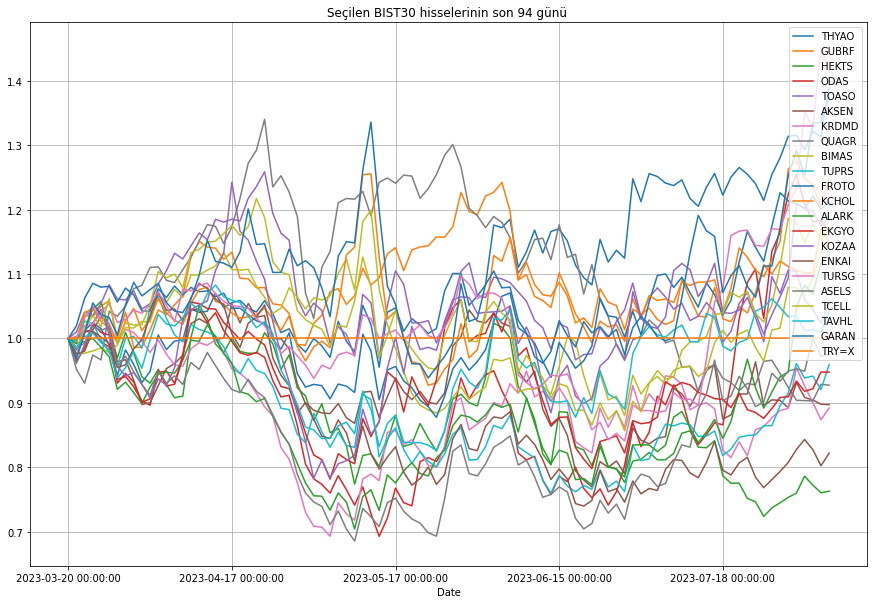

In [ ]:
def DrawSelectedAssetsPerformance(pf_data):
    from PIL import Image as im
    fig = plt.figure(dpi=250) # plt.figure()
    #(pf_data[Metals]/pf_data[Metals].iloc[0]).plot(figsize = (15,30))
    (pf_data/pf_data.iloc[-pf_data.shape[0]]).tail(pf_data.shape[0]).plot(figsize = (15,10))
    plt.grid(True)
    plt.title(f"Seçilen {exchange} hisselerinin son {pf_data.shape[0]} günü ")
    plt.savefig("Fig_001_BIST30_Selected.jpg", format='jpg', dpi=300)
    from IPython.display import Image
    Image(url="Fig_001_BIST30_Selected.jpg")


DrawSelectedAssetsPerformance(pf_data)

In [ ]:
pf_data.isnull().sum()

THYAO    0
GUBRF    0
HEKTS    0
ODAS     0
TOASO    0
AKSEN    0
KRDMD    0
QUAGR    0
BIMAS    0
TUPRS    0
FROTO    0
KCHOL    0
ALARK    0
EKGYO    0
KOZAA    0
ENKAI    0
TURSG    0
ASELS    0
TCELL    0
TAVHL    0
GARAN    0
TRY=X    0
dtype: int64

In [ ]:
pf_data

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-20 00:00:00,6.634,10.496,1.501,0.355,9.312,1.581,0.988,0.308,7.463,4.008,...,3.704,0.347,2.057,1.514,0.500,2.917,1.632,4.040,1.266,1.000
2023-03-21 00:00:00,6.518,10.411,1.497,0.355,9.406,1.538,0.960,0.294,7.291,3.991,...,3.676,0.335,2.029,1.477,0.501,2.804,1.608,3.982,1.226,1.000
2023-03-22 00:00:00,6.720,10.876,1.523,0.358,9.694,1.599,1.020,0.287,7.293,4.117,...,3.686,0.342,2.042,1.484,0.510,2.890,1.656,4.051,1.275,1.000
2023-03-23 00:00:00,6.795,10.849,1.570,0.359,9.646,1.603,1.038,0.300,7.319,4.101,...,3.705,0.354,2.106,1.531,0.511,2.972,1.690,4.075,1.336,1.000
2023-03-24 00:00:00,6.738,11.025,1.588,0.353,9.818,1.635,1.019,0.298,7.351,4.002,...,3.653,0.350,2.150,1.517,0.521,2.954,1.662,4.014,1.312,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31 00:00:00,8.729,11.609,1.141,0.445,11.252,1.473,0.943,0.279,8.051,3.852,...,3.878,0.324,2.271,1.253,0.617,2.779,1.926,4.184,1.636,1.000
2023-08-01 00:00:00,8.579,11.565,1.180,0.429,11.194,1.437,0.915,0.279,7.977,3.762,...,4.011,0.318,2.180,1.276,0.676,2.769,1.876,4.089,1.587,1.000
2023-08-02 00:00:00,8.768,11.563,1.160,0.419,11.152,1.430,0.890,0.278,8.164,3.774,...,3.959,0.320,2.150,1.252,0.663,2.918,1.922,4.097,1.690,1.000


In [ ]:
pf_data

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-20 00:00:00,6.634,10.496,1.501,0.355,9.312,1.581,0.988,0.308,7.463,4.008,...,3.704,0.347,2.057,1.514,0.500,2.917,1.632,4.040,1.266,1.000
2023-03-21 00:00:00,6.518,10.411,1.497,0.355,9.406,1.538,0.960,0.294,7.291,3.991,...,3.676,0.335,2.029,1.477,0.501,2.804,1.608,3.982,1.226,1.000
2023-03-22 00:00:00,6.720,10.876,1.523,0.358,9.694,1.599,1.020,0.287,7.293,4.117,...,3.686,0.342,2.042,1.484,0.510,2.890,1.656,4.051,1.275,1.000
2023-03-23 00:00:00,6.795,10.849,1.570,0.359,9.646,1.603,1.038,0.300,7.319,4.101,...,3.705,0.354,2.106,1.531,0.511,2.972,1.690,4.075,1.336,1.000
2023-03-24 00:00:00,6.738,11.025,1.588,0.353,9.818,1.635,1.019,0.298,7.351,4.002,...,3.653,0.350,2.150,1.517,0.521,2.954,1.662,4.014,1.312,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31 00:00:00,8.729,11.609,1.141,0.445,11.252,1.473,0.943,0.279,8.051,3.852,...,3.878,0.324,2.271,1.253,0.617,2.779,1.926,4.184,1.636,1.000
2023-08-01 00:00:00,8.579,11.565,1.180,0.429,11.194,1.437,0.915,0.279,7.977,3.762,...,4.011,0.318,2.180,1.276,0.676,2.769,1.876,4.089,1.587,1.000
2023-08-02 00:00:00,8.768,11.563,1.160,0.419,11.152,1.430,0.890,0.278,8.164,3.774,...,3.959,0.320,2.150,1.252,0.663,2.918,1.922,4.097,1.690,1.000


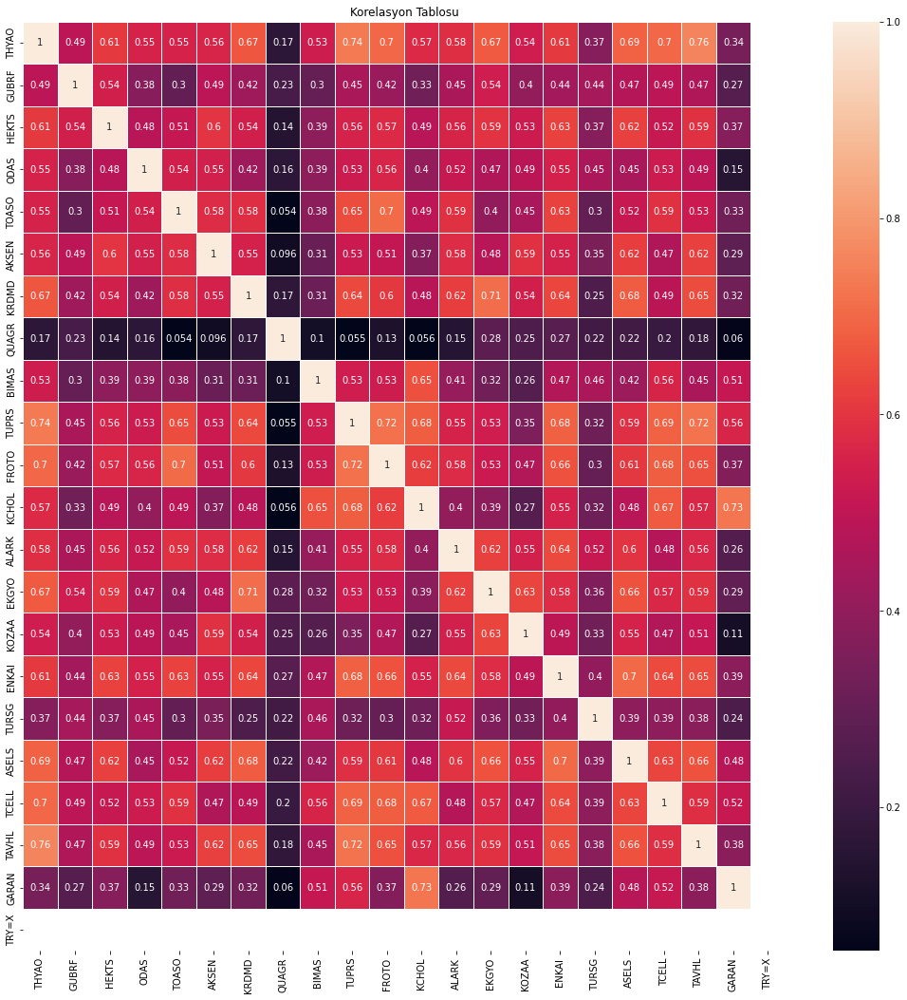

In [ ]:
def ConvertTimeSeriesToReturns(pf_data):
    log_returns = np.log(pf_data/pf_data.shift(1))
    return log_returns


def PlotCorrelations(log_returns, figname):
    plt.figure(figsize=(18,18))
    plt.title(f"Korelasyon Tablosu")
    sns.heatmap(log_returns.corr(),linecolor='white',linewidths=1,annot=True)
    plt.savefig(f"{figname}_Coorelations.jpg", format='jpg', dpi=300)
    from IPython.display import Image
    Image(url=f"{figname}_Coorelations.jpg")

log_returns = ConvertTimeSeriesToReturns(pf_data)
PlotCorrelations(log_returns, "Fig_004")


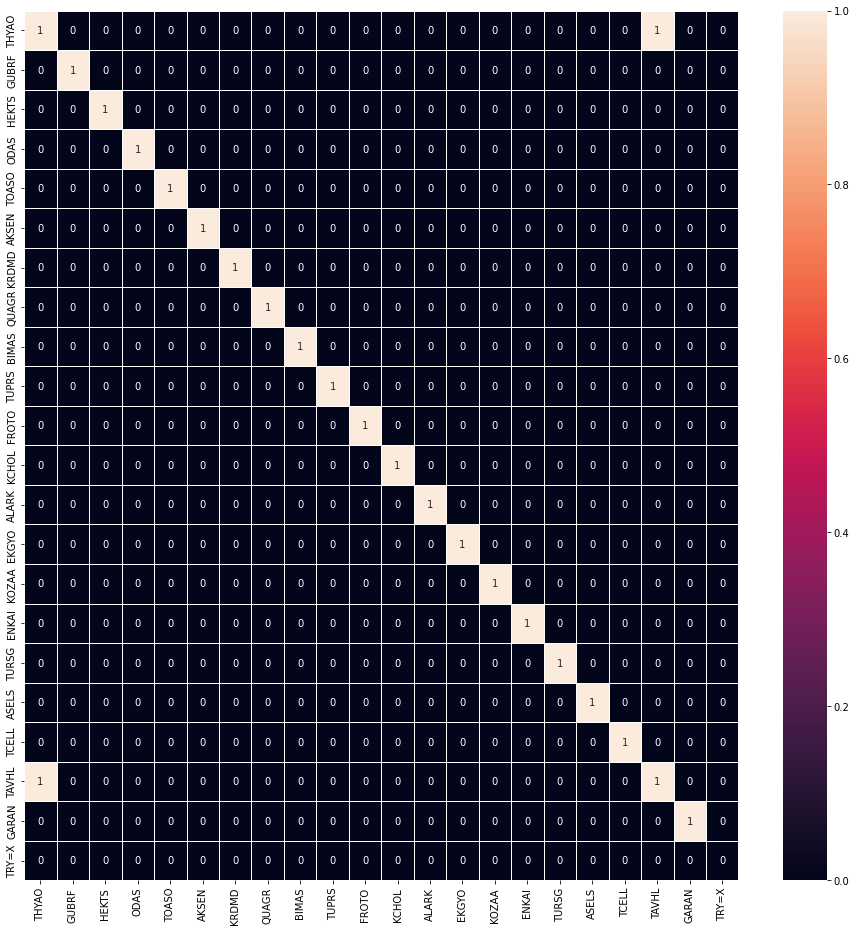

In [ ]:
def PlotCorrelationsLessThanCorrFilter(log_returns, CORR_FILTER):
    plt.figure(figsize=(16,16))
    c = log_returns.corr()
    sns.heatmap((c >= CORR_FILTER) ,linecolor='white',linewidths=1,annot = True)
    plt.show()


PlotCorrelationsLessThanCorrFilter(log_returns, CORR_FILTER)

In [ ]:
# log_returns.drop(index=log_returns.index[0], axis=0, inplace=True)
# log_returns

# pd.isnull(log_returns).sum()[pd.isnull(log_returns).sum() > 0]

def ReplaceLogReturns():
    log_returns.drop(index=log_returns.index[0], axis=0, inplace=True)

ReplaceLogReturns()


def CheckForNull():
    pd.isnull(log_returns).sum()[pd.isnull(log_returns).sum() > 0]

CheckForNull()

In [ ]:
# min_val = (log_returns.sum()*100).min() # returns within lookbakc period


def FindMinOfSeries(log_returns):
    min_val = (log_returns.sum()*100).min() # returns within lookbakc period
    return min_val

min_val = FindMinOfSeries(log_returns)

In [ ]:
# max_val = (log_returns.sum()*100).max() # returns within lookbakc period


def FindMaxOfSeries(log_returns):
    max_val = (log_returns.sum()*100).max() # returns within lookbakc period
    return max_val


max_val = FindMaxOfSeries(log_returns)

Let's calculate the annual average return

In [ ]:
np.round(log_returns.mean() *100,4).tail(60).max() # Stock market is open for almost 250 days in an year

0.3728

In [ ]:
np.round(log_returns.std().mean(),4)

0.0316

In [ ]:
# log_returns[['ARCLK','XU100']].cov()

In [ ]:
# log_returns[['XU100']].var()

In [ ]:
# beta = log_returns[['ARCLK','XU100']].cov() / log_returns[['XU100']].var()
# beta.iloc[0][1]
log_returns.index

Index(['2023-03-21 00:00:00', '2023-03-22 00:00:00', '2023-03-23 00:00:00',
       '2023-03-24 00:00:00', '2023-03-27 00:00:00', '2023-03-28 00:00:00',
       '2023-03-29 00:00:00', '2023-03-30 00:00:00', '2023-03-31 00:00:00',
       '2023-04-03 00:00:00', '2023-04-04 00:00:00', '2023-04-05 00:00:00',
       '2023-04-06 00:00:00', '2023-04-07 00:00:00', '2023-04-10 00:00:00',
       '2023-04-11 00:00:00', '2023-04-12 00:00:00', '2023-04-13 00:00:00',
       '2023-04-14 00:00:00', '2023-04-17 00:00:00', '2023-04-18 00:00:00',
       '2023-04-19 00:00:00', '2023-04-20 00:00:00', '2023-04-24 00:00:00',
       '2023-04-25 00:00:00', '2023-04-26 00:00:00', '2023-04-27 00:00:00',
       '2023-04-28 00:00:00', '2023-05-02 00:00:00', '2023-05-03 00:00:00',
       '2023-05-04 00:00:00', '2023-05-05 00:00:00', '2023-05-08 00:00:00',
       '2023-05-09 00:00:00', '2023-05-10 00:00:00', '2023-05-11 00:00:00',
       '2023-05-12 00:00:00', '2023-05-15 00:00:00', '2023-05-16 00:00:00',
       '2023

In [ ]:
len(log_returns.mean()*100)

22

In [ ]:
def PrintSharpePerformance():
    yearly_rets = np.round(log_returns.mean() * 252,2) # Mean returns annualized for year
    yearly_rets
    vol = np.round(log_returns.std()*np.sqrt(252),3) # annualized version of std deviation
    vol
    sharpe = (yearly_rets - risk_free_rate)/vol
    sharpe
    max_sr_vol = vol[sharpe.argmax()] # risk corresponding to maximum sharpe ratio
    max_sr_ret = yearly_rets[sharpe.argmax()] # return corresponding to maximum sharpe ratio
    # plt.figure(figsize=(10,10))
    # plt.scatter(vol, log_returns.mean()*100, c=sharpe, cmap='viridis')
    # plt.colorbar(label='Sharpe Ratio')
    # plt.xlabel('Volatility')
    # plt.ylabel('Return')
    # plt.title('Some BIST assets')
    # plt.scatter(max_sr_vol, max_sr_ret,c='red', s=50) # red dot

    # plt.text(vol, log_returns.mean()*100, s=log_returns.mean().index)
    ASSETS = log_returns.mean().index

    #plt.text(vol, log_returns.mean()*100, ASSETS)

    # labels = ['Variable {0}'.format(i+1) for i in np.arange(len(ASSETS))]
    # for i in np.arange (0,len(ASSETS)):

    print(f"Sharpe Ratio = {sharpe[1]}")
    print(f"Max Sharpe Ratio = {sharpe.max()}")
    print(f"Max Sharpe Ratio Return = {max_sr_ret}")
    print(f"Max Sharpe Ratio Volatility = {max_sr_vol}")
    return vol, ASSETS,sharpe

vol, ASSETS,sharpe = PrintSharpePerformance()

Sharpe Ratio = 0.27210884353741494
Max Sharpe Ratio = 1.503267973856209
Max Sharpe Ratio Return = 0.94
Max Sharpe Ratio Volatility = 0.459


In [ ]:
def plot_with_labels(coord, labels, sharpe):
    assert len(coord) == len(labels), 'coord len is not equal to labels len'
    plt.figure(figsize=(10, 10))  # in inches
    for i, label in enumerate(labels): #get (0, label)
        x, y = coord[i] #2 dim
        #plt.scatter(x, y)
        # yearly_rets = np.round(log_returns.mean() * 252,2) # Mean returns annualized for year
        # vol = np.round(log_returns.std()*np.sqrt(252),3) # annualized version of std deviation

        #sharpe = (y - risk_free_rate)/x
        plt.scatter(x, y, c=sharpe[i], cmap='viridis')
        plt.annotate(label,
                xy=(x, y), #show point
                xytext=(5, 2), #show annotate
                textcoords='offset points',
                ha='left',
                va='bottom')

    plt.colorbar(label='Sharpe Ratio')
    plt.xlabel('Volatility %')
    plt.ylabel('Return')
    plt.grid(True)
    plt.title(f'Best {len(log_returns.mean())} of BIST R-R Map')
    plt.savefig("Fig_002_R-R_Map.jpg", format='jpg', dpi=300)
    plt.show()
    return "Fig_002_R-R_Map.jpg"




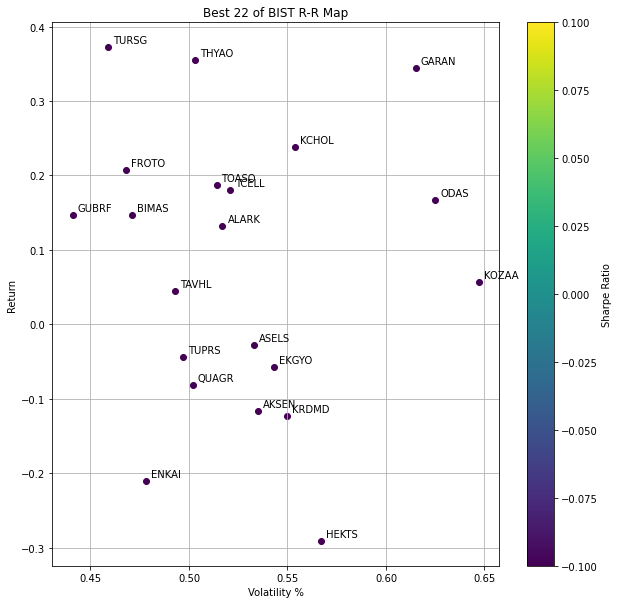

In [ ]:
def PlotRRMap():
    coord = list(zip(vol, log_returns.mean()*100))
    labels = ASSETS
    aa = plot_with_labels(coord, labels, sharpe)
    from IPython.display import Image
    Image(url=aa)

PlotRRMap()

#### Plotting Correlation HeatMap

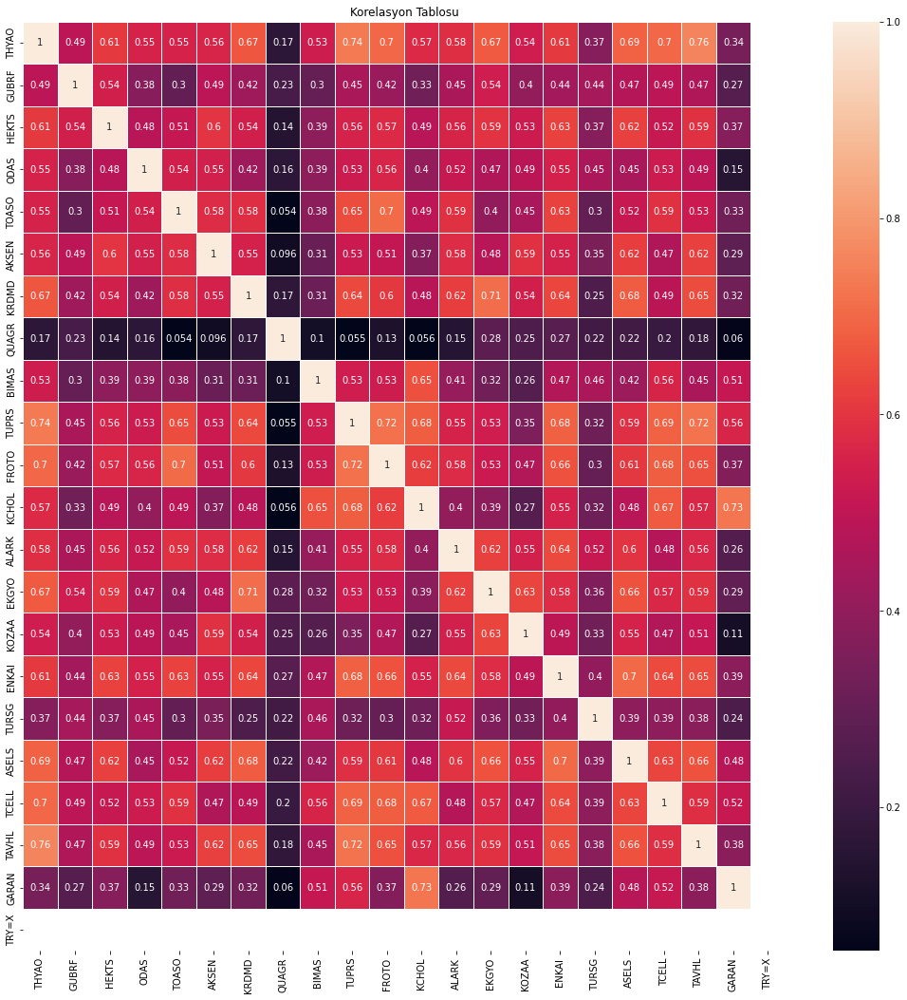

In [ ]:

# plt.figure(figsize=(15,8))
# sns.heatmap(log_returns.corr(),linecolor='white',linewidths=1,annot=True)
# plt.title("correlation heatmap of stocks")
# plt.show()
# len(sharpe)

PlotCorrelations(log_returns, figname="Fig+008")



#### Using heatmap to find strongly positive or strongly negative correlated stocks

In [ ]:
stock_list

['THYAO.IS',
 'GUBRF.IS',
 'HEKTS.IS',
 'ODAS.IS',
 'TOASO.IS',
 'AKSEN.IS',
 'KRDMD.IS',
 'QUAGR.IS',
 'BIMAS.IS',
 'TUPRS.IS',
 'FROTO.IS',
 'KCHOL.IS',
 'ALARK.IS',
 'EKGYO.IS',
 'KOZAA.IS',
 'ENKAI.IS',
 'TURSG.IS',
 'ASELS.IS',
 'TCELL.IS',
 'TAVHL.IS',
 'GARAN.IS',
 'TRY=X']

In [ ]:
# # plt.figure(figsize=(15,8))
# c = log_returns.corr()
# sns.heatmap((c < -0.51) ,linecolor='white',linewidths=1,annot = True)
# plt.show()

- From the heatmaps, we can observe that there is no pair with negative correlation
- We only have some pairs of stocks from banking sector with  high positive correlation

In [ ]:
# sns.pairplot(pf_data,palette='coolwarm')
# plt.show()

- The pair plots also signify the same result that there is no pair of stocks with high negative correlation. We don't find any pair-plot with upper-left to lower-right pattern.
- The pairs with high positive correlation have scatter plot with lower-left to upper-right pattern .
- Other pairs don't form any pattern.

### Markowitz Model







- We model our assets by their expected return, $E[R]$ and their risk, which is expressed as their standard deviation, $\sigma$

- Our investment decisions are expressed by investing 100% of our wealth in assets( here, stocks), where each particular investment represents a proportion of our total wealth.


- We will now implement Markowitz Model. This model assists in the selection of the most efficient portfolios by analyzing various possible portfolios of the selected stocks.

- We invest $w_i$ in $stock_i$ for every i, such that

- The expected return of the portfolio constructed would be

<h2>
$$E[R_p] = \Sigma^{n}_{i=1} w_i E[R_i]$$</h2>

and the risk associated with the portfolio would be


$$ S = \frac{E[R_p] - R_f}{\sigma(R_p)} $$

Here, $R_f$ is the risk free rate of return. we have taken risk free rate yearly government interest rate of Turkey on July 2022, i.e %14.

In [ ]:
# A function for generating a numpy array containing random weights that add upto 1
def RandWeights(size):
    weight = np.random.dirichlet(alpha = np.ones(size))
    # BURAYA MAKSIMUM AGIRLIGIN %20 OLABILECEGI KOSULU EKLE
    return weight

In [ ]:
a = RandWeights(10)
a

array([0.19432066, 0.0011074 , 0.09268237, 0.07455739, 0.09651384,
       0.05155121, 0.14899875, 0.26080768, 0.06498275, 0.01447796])

In [ ]:


# A function to generate the avg return, risk and the sharpe ratio of the portfolio
# correponding to the weight array passed
def portfolio_stats(weight):

    # Convert to array in case list was passed instead.
    weight = np.array(weight)
    port_return = np.sum(log_returns.mean() * weight) * 252
    #port_return = log_returns.mean() * weight
    port_risk = np.sqrt(np.dot(weight.T, np.dot(log_returns.cov() * 252, weight)))
    #port_risk = np.sqrt(np.dot(weight.T, np.dot(log_returns.cov() * 252, weight))) / np.sqrt(252)
    sharpe = (port_return - risk_free_rate)/port_risk

    return {'return': port_return, 'risk': port_risk, 'sharpe': sharpe}

In [ ]:
# Trying to generate random weights

# length = len(log_returns.columns)
# weight = RandWeights(length)
# weight


def CalculateRandomWeights():
    length = len(log_returns.columns)
    weight = RandWeights(length)
    return length, weight

length, weight = CalculateRandomWeights()

In [ ]:
# Generating Portfolio Statistics
# pf_stats = portfolio_stats(weight)

# pf_return = pf_stats['return']
# pf_risk = pf_stats['risk']
# pf_sharpe = pf_stats['sharpe']

# pf_stats

# Generating Portfolio Statistics
def EvaluatePortfolio(weight):

    pf_stats = portfolio_stats(weight)
    pf_return = pf_stats['return']
    pf_risk = pf_stats['risk']
    pf_sharpe = pf_stats['sharpe']
    return pf_stats


pf_stats = EvaluatePortfolio(weight)

#### We will now run a monte carlo simulation to generate random portfolios. We will use the results of simulation to draw an efficient frontier

In [ ]:

def Monte_Carlo(iterations):
    portfolio_returns = []
    portfolio_risks = []
    for x in range (iterations):
        weight = RandWeights(length)
        pf_stats = portfolio_stats(weight)
        portfolio_returns.append(pf_stats['return'])
        portfolio_risks.append(pf_stats['risk'])

    portfolio_returns = np.array(portfolio_returns)
    portfolio_risks = np.array(portfolio_risks)
    return portfolio_returns, portfolio_risks



### Generate random Markowitz portfolios via Montecarlo for Sharpe Analysis <a name="Generate_Markowitz"></a>

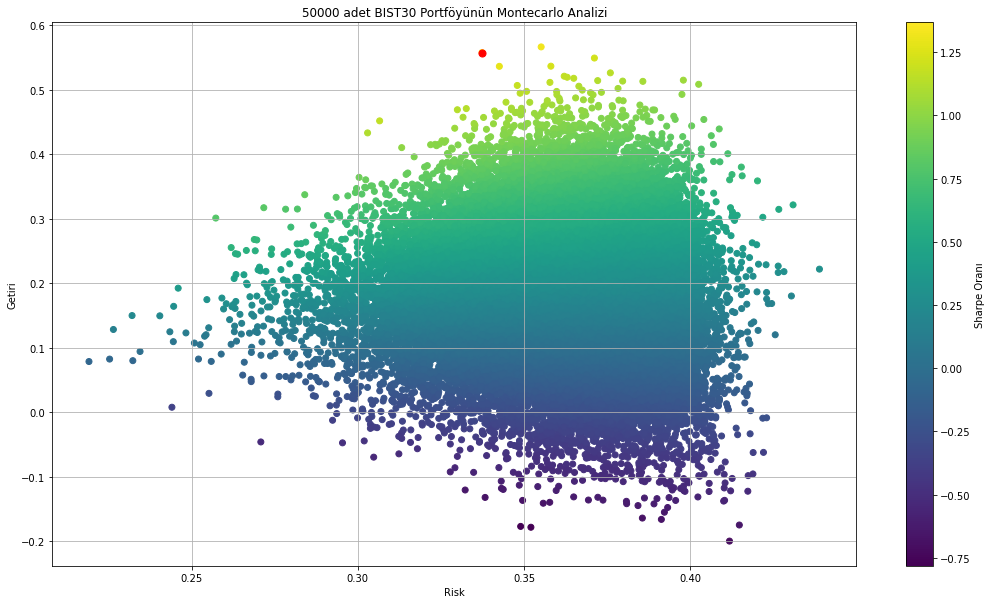

max Sharpe Ratio = 1.368538933127454
max Sharpe Ratio return = 0.5575793761128874
max Sharpe Ratio volatility = 0.33735902865321377


In [ ]:
def MonteCarloAnalysis():
    portfolio_returns, portfolio_risks = Monte_Carlo(CASES)
    sharpe = (portfolio_returns - Rfr) / portfolio_risks
    max_sr_ret = portfolio_returns[sharpe.argmax()] # return corresponding to maximum sharpe ratio
    max_sr_vol = portfolio_risks[sharpe.argmax()] # risk corresponding to maximum sharpe ratio
    plt.figure(figsize=(18,10))
    plt.scatter(portfolio_risks, portfolio_returns, c=sharpe, cmap='viridis')
    plt.colorbar(label='Sharpe Oranı')
    plt.title(f"{CASES} adet {exchange} Portföyünün Montecarlo Analizi")
    plt.xlabel('Risk')
    plt.ylabel('Getiri')
    plt.scatter(max_sr_vol, max_sr_ret,c='red', s=50) # red dot
    plt.grid(True)
    plt.savefig("Fig_003_Montecarlo.jpg", format='jpg', dpi=300)
    plt.show()

    from IPython.display import Image
    Image(url="Fig_003_Montecarlo.jpg")

    print(f"max Sharpe Ratio = {sharpe.max()}")
    print(f"max Sharpe Ratio return = {max_sr_ret}")
    print(f"max Sharpe Ratio volatility = {max_sr_vol}")
    return portfolio_returns, portfolio_risks, sharpe

portfolio_returns, portfolio_risks, sharpe = MonteCarloAnalysis()

In [ ]:

def OptimizationWithSharpeRatio():

    def FindNegSharpe(weight):
        return (-1)*portfolio_stats(weight)['sharpe']

    res = minimize(
          FindNegSharpe,
          RandWeights(length),
          method = 'SLSQP',
          constraints=[
            {'type': 'eq', 'fun': lambda w: np.sum(w) - 1.},
          ],
          bounds=[(P_BOUND_LO, P_BOUND_HI) for i in range(length)]
        )

    return res


Think like Harry Markowitz. Write python code for generation of best Sharpe Ratio and the least drawdown portfolio out of all input assets  

In [ ]:
def OptimizationWithLDD(rets):

    def FindNegSharpe(weight):
        neg_sharpe = (-1)*portfolio_stats(weight)['sharpe']
        drawdown = (1 + weight * rets).cumprod().apply(np.log).cummin()
        drawdown = (1 - drawdown.iloc[-1]) * 100
        return neg_sharpe, drawdown

    res = minimize(
          FindNegSharpe,
          RandWeights(length),
          method = 'SLSQP',
          constraints=[
            {'type': 'eq', 'fun': lambda w: np.sum(w) - 1.},
          ],
          bounds=[(P_BOUND_LO, P_BOUND_HI) for i in range(length)]
        )

    return res




In [ ]:
# def OptimizationWithLeastDrawdown(returns):

#     from scipy.optimize import minimize
#     def portfolio_performance(weights, returns):
#         portfolio_return = np.sum(returns.mean() * weights) * 252
#         portfolio_variance = np.sqrt(np.dot(weights.T, np.dot(returns.cov() * 252, weights)))
#         sharpe_ratio = portfolio_return / portfolio_variance
#         drawdown = (1 + weights * returns).cumprod().apply(np.log).cummin()
#         drawdown = (1 - drawdown.iloc[-1]) * 100
#         return -sharpe_ratio, drawdown

#     def optimize_portfolio(returns):
#         num_assets = returns.shape[1]
#         args = (returns,)
#         constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
#         bounds = tuple((0, 1) for asset in range(num_assets))
#         initial_guess = num_assets * [1. / num_assets,]
#         opt_results = minimize(portfolio_performance, initial_guess, args=args, method='SLSQP', bounds=bounds, constraints=constraints)
#         return opt_results.x

#     # Use the Markowitz optimization method to find the portfolio with the highest Sharpe ratio and the least drawdown
#     weights = optimize_portfolio(returns)

#     # Print the weights of the optimized portfolio
#     return(weights)


In [ ]:

def OptimizationForAGivenReturn(target_return):

    def fun(weight):
        pf_stats = portfolio_stats(weight)
        _risk = pf_stats['risk']
        return _risk

    res = minimize(
      fun,
      RandWeights(length),
      method = 'SLSQP',
      constraints=[{'type':'eq','fun': lambda x: portfolio_stats(x)['return']-target_return},
                   {'type':'eq','fun': lambda x: np.sum(x)-1}],
      bounds=[(P_BOUND_LO, P_BOUND_HI) for i in range(length)]
    )

    return res


In [ ]:
# OptimizationForAGivenReturn(max_sr_ret)

- For a return of 40%, we can find the optimal portfolio corresponding to the weights generated above

#### Finding portfolio that provide the minimum risk

In [ ]:

def OptimizingWithMinRisk():

    def fun(weight):
        pf_stats = portfolio_stats(weight)
        _risk = pf_stats['risk']
        return _risk




    res = minimize(
      fun,
      RandWeights(length),
      method = 'SLSQP',
      constraints=[
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1.},
      ],
      bounds=[(P_BOUND_LO, P_BOUND_HI) for i in range(length)]
    )

    return res

In [ ]:
OptimizingWithMinRisk()

     fun: 1.0188021610540076e-15
     jac: array([ 0.50283738,  0.44101105,  0.5671422 ,  0.62517543,  0.51406405,
        0.53483345,  0.54985928,  0.50180209,  0.47136594,  0.49684142,
        0.46771536,  0.5539065 ,  0.51700924,  0.54255677,  0.6467317 ,
        0.47750014,  0.45881203,  0.53335241,  0.52097811,  0.49298301,
        0.61494447, -0.        ])
 message: 'Optimization terminated successfully'
    nfev: 92
     nit: 4
    njev: 4
  status: 0
 success: True
       x: array([0.00000000e+00, 3.88578059e-16, 1.03710602e-16, 8.90375905e-18,
       2.51578645e-16, 8.36857528e-17, 1.80324705e-17, 6.93889390e-16,
       2.89698820e-16, 0.00000000e+00, 1.64426735e-16, 0.00000000e+00,
       0.00000000e+00, 1.04536684e-16, 1.33407475e-16, 2.30576209e-17,
       6.93889390e-16, 0.00000000e+00, 0.00000000e+00, 1.09841606e-16,
       1.88828788e-16, 1.00000000e+00])

### Plotting the efficient Frontier

- The efficient frontier is the set of optimal portfolios that offer the highest expected return for a defined level of risk or the lowest risk for a given level of expected return. Portfolios that lie below the efficient frontier are sub-optimal because they do not provide enough return for the level of risk.





- We will plot the efficient frontier by taking the optimal portfolios for all possible returns

### Find Optimal weights For Highest Sharpe Ratio and Least Drawdown <a name="Least_MDD"></a>

In [ ]:
log_returns

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-21 00:00:00,-0.018,-0.008,-0.003,0.001,0.010,-0.028,-0.029,-0.049,-0.023,-0.004,...,-0.008,-0.036,-0.014,-0.024,0.003,-0.040,-0.015,-0.014,-0.032,0.000
2023-03-22 00:00:00,0.030,0.044,0.017,0.009,0.030,0.039,0.061,-0.023,0.000,0.031,...,0.003,0.020,0.006,0.004,0.016,0.030,0.030,0.017,0.040,0.000
2023-03-23 00:00:00,0.011,-0.002,0.031,0.001,-0.005,0.002,0.017,0.046,0.004,-0.004,...,0.005,0.037,0.031,0.031,0.003,0.028,0.020,0.006,0.047,0.000
2023-03-24 00:00:00,-0.008,0.016,0.011,-0.017,0.018,0.020,-0.018,-0.008,0.004,-0.025,...,-0.014,-0.013,0.021,-0.009,0.019,-0.006,-0.016,-0.015,-0.018,0.000
2023-03-27 00:00:00,-0.026,0.008,-0.043,-0.007,0.027,-0.011,-0.008,0.075,-0.007,-0.020,...,-0.015,-0.004,-0.038,-0.010,0.012,0.005,0.041,-0.011,-0.004,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31 00:00:00,0.001,-0.005,0.009,0.025,0.099,0.043,0.069,-0.022,-0.001,0.049,...,0.099,0.026,-0.002,0.025,0.023,0.004,-0.005,0.002,0.031,0.000
2023-08-01 00:00:00,-0.017,-0.004,0.034,-0.036,-0.005,-0.025,-0.030,-0.001,-0.009,-0.024,...,0.034,-0.017,-0.041,0.019,0.092,-0.004,-0.027,-0.023,-0.030,0.000
2023-08-02 00:00:00,0.022,-0.000,-0.018,-0.024,-0.004,-0.004,-0.028,-0.000,0.023,0.003,...,-0.013,0.004,-0.014,-0.019,-0.019,0.052,0.025,0.002,0.063,0.000


In [ ]:
#OptimizationWithLDD(log_returns)

In [ ]:
#Optimal_Weights_For_Least_Drawdown = OptimizationWithLeastDrawdown(log_returns).x

In [ ]:
# target_returns = np.linspace(portfolio_returns.min(), portfolio_returns.max(),20)

# minimal_risks = []
# for target_return in target_returns:
#     optimal = OptimizationForAGivenReturn(target_return)
#     minimal_risks.append(optimal['fun'])

# minimal_risks = np.array(minimal_risks)
# print(minimal_risks)

### Find Optimal weights For Highest Sharpe Ratio <a name="Optimal_Sharpe"></a>

In [ ]:
# plt.figure(figsize=(18,10))

# plt.scatter(portfolio_risks, portfolio_returns,
#             c = ( portfolio_returns / portfolio_risks),
#             marker = 'o', cmap='viridis')



# # # Plotting the efficient frontier
# # plt.scatter(minimal_risks,
# #             target_returns,
# #             c = (target_returns / minimal_risks),
# #             marker = 'x')


# # Plotting the portfolio that has highest Sharpe Ratio
# Optimal_weights_For_Highest_Sharpe_Ratio = OptimizationWithSharpeRatio().x
# print(f"Optimal_weights_For_Highest_Sharpe_Ratio = {Optimal_weights_For_Highest_Sharpe_Ratio}")
# plt.plot(portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['risk'],
#          portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['return'],
#          'r*',
#          markersize = 25.0, label = "Portfolio corresponding to max sharpe")



# # # Plotting the optimal portfolio that has lowest risk
# Optimal_weights_For_Lowest_Risk = OptimizingWithMinRisk().x
# print(f"Optimal_weights_For_Lowest_Risk = {Optimal_weights_For_Lowest_Risk}")

# plt.plot(portfolio_stats(Optimal_weights_For_Lowest_Risk)['risk'],
#          portfolio_stats(Optimal_weights_For_Lowest_Risk)['return'],
#          'g*',
#          markersize = 25.0, label = "Portfolio corresponding to lowest risk")

# #Plotting the optimal portfolio for 250% annual returns
# Optimal_weights_for_Percent_Returns = OptimizationForAGivenReturn(3).x
# Optimal_weights_for_twenty_five_percent_returns = OptimizationForAGivenReturn(1).x
# Optimal_weights_for_Percent_Returns
# plt.plot(portfolio_stats(Optimal_weights_for_twenty_five_percent_returns)['risk'],
#          portfolio_stats(Optimal_weights_for_twenty_five_percent_returns)['return'],
#          'b*',
#          markersize = 25.0, label = "Optimal Portfolio corresponding to 100% return")


# # Plotting the optimal portfolio for 150% annual returns
# Optimal_weights_for_thirty_five_percent_returns = OptimizationForAGivenReturn(1.5).x

# plt.plot(portfolio_stats(Optimal_weights_for_thirty_five_percent_returns)['risk'],
#          portfolio_stats(Optimal_weights_for_thirty_five_percent_returns)['return'],
#          'm*',
#          markersize = 25.0, label = "Optimal Portfolio corresponding to 150% return")

# plt.title("Risk Return Map",fontsize = 25)
# plt.grid(True)
# plt.xlabel('Portfolio Risk',fontsize = 20)
# plt.ylabel('Portfolio Return', fontsize = 20)

# plt.legend(prop={'size': 10})
# plt.colorbar(label='Sharpe ratio')

# plt.savefig("Fig_005_RRMAP.jpg", format='jpg', dpi=300)

# from IPython.display import Image
# Image(url="Fig_005_RRMAP.jpg")
# plt.show()


Optimal_weights_For_Highest_Sharpe_Ratio = [2.98296693e-01 2.16384269e-12 3.73828178e-12 3.61648680e-12
 0.00000000e+00 2.33080716e-13 2.08223286e-12 0.00000000e+00
 1.52826246e-12 1.46951763e-12 6.55920139e-13 8.89208651e-13
 1.75130357e-13 7.30607335e-13 3.21365816e-12 2.05870035e-12
 5.28325915e-01 3.92064632e-12 3.04097978e-12 7.00027326e-13
 1.73377392e-01 0.00000000e+00]
Optimal_weights_For_Lowest_Risk = [4.73400688e-17 0.00000000e+00 3.44733442e-18 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.33268690e-16 1.31348468e-16
 0.00000000e+00 5.56762023e-18 0.00000000e+00 2.95237260e-17
 0.00000000e+00 5.47344090e-17 7.59932460e-17 0.00000000e+00
 0.00000000e+00 1.00000000e+00]


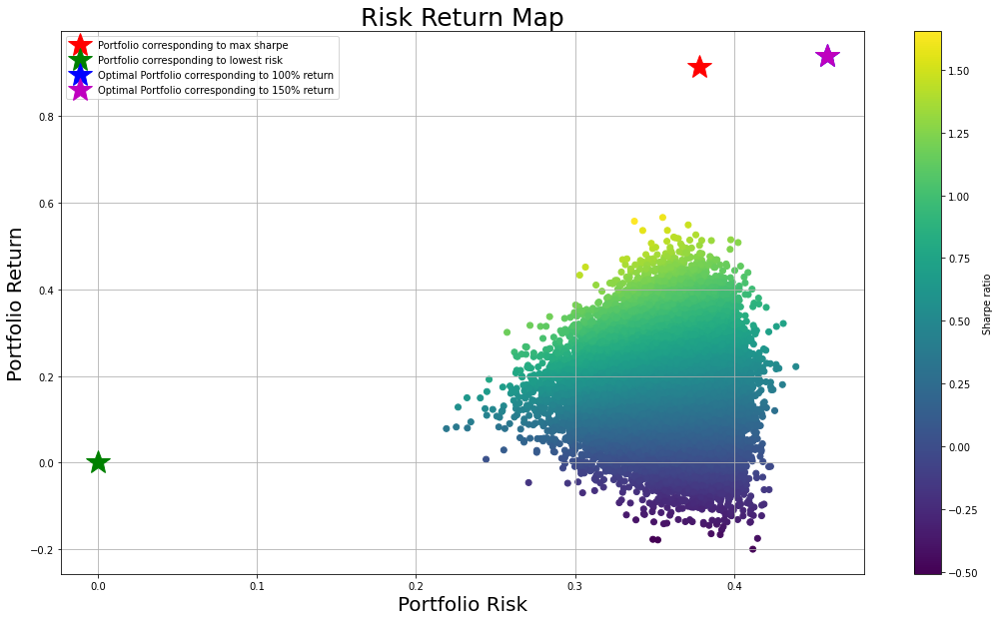

In [ ]:
def PlotandOptimizeWeightsForReturns():
    plt.figure(figsize=(18,10))
    plt.scatter(portfolio_risks, portfolio_returns,
                c = ( portfolio_returns / portfolio_risks),
                marker = 'o', cmap='viridis')



    # # Plotting the efficient frontier
    # plt.scatter(minimal_risks,
    #             target_returns,
    #             c = (target_returns / minimal_risks),
    #             marker = 'x')


    # Plotting the portfolio that has highest Sharpe Ratio
    Optimal_weights_For_Highest_Sharpe_Ratio = OptimizationWithSharpeRatio().x
    print(f"Optimal_weights_For_Highest_Sharpe_Ratio = {Optimal_weights_For_Highest_Sharpe_Ratio}")
    plt.plot(portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['risk'],
             portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['return'],
             'r*',
             markersize = 25.0, label = "Portfolio corresponding to max sharpe")



    # # Plotting the optimal portfolio that has lowest risk
    Optimal_weights_For_Lowest_Risk = OptimizingWithMinRisk().x
    print(f"Optimal_weights_For_Lowest_Risk = {Optimal_weights_For_Lowest_Risk}")

    plt.plot(portfolio_stats(Optimal_weights_For_Lowest_Risk)['risk'],
             portfolio_stats(Optimal_weights_For_Lowest_Risk)['return'],
             'g*',
             markersize = 25.0, label = "Portfolio corresponding to lowest risk")

    #Plotting the optimal portfolio for 250% annual returns
    Optimal_weights_for_Percent_Returns = OptimizationForAGivenReturn(3).x
    Optimal_weights_for_twenty_five_percent_returns = OptimizationForAGivenReturn(1).x
    Optimal_weights_for_Percent_Returns
    plt.plot(portfolio_stats(Optimal_weights_for_twenty_five_percent_returns)['risk'],
             portfolio_stats(Optimal_weights_for_twenty_five_percent_returns)['return'],
             'b*',
             markersize = 25.0, label = "Optimal Portfolio corresponding to 100% return")


    # Plotting the optimal portfolio for 150% annual returns
    Optimal_weights_for_thirty_five_percent_returns = OptimizationForAGivenReturn(1.5).x

    plt.plot(portfolio_stats(Optimal_weights_for_thirty_five_percent_returns)['risk'],
             portfolio_stats(Optimal_weights_for_thirty_five_percent_returns)['return'],
             'm*',
             markersize = 25.0, label = "Optimal Portfolio corresponding to 150% return")

    plt.title("Risk Return Map",fontsize = 25)
    plt.grid(True)
    plt.xlabel('Portfolio Risk',fontsize = 20)
    plt.ylabel('Portfolio Return', fontsize = 20)

    plt.legend(prop={'size': 10})
    plt.colorbar(label='Sharpe ratio')

    plt.savefig("Fig_005_RRMAP.jpg", format='jpg', dpi=300)

    from IPython.display import Image
    Image(url="Fig_005_RRMAP.jpg")
    plt.show()
    return Optimal_weights_For_Highest_Sharpe_Ratio

Optimal_weights_For_Highest_Sharpe_Ratio = PlotandOptimizeWeightsForReturns()

In [ ]:
#portfolio_stats(Optimal_weights_for_Percent_Returns)

In [ ]:
#portfolio_stats(Optimal_weights_For_Lowest_Risk)

In [ ]:
portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)

{'return': 0.9133213294146985,
 'risk': 0.37826002770678796,
 'sharpe': 1.753612015089468}

In [ ]:
# WEIGHT_HSR = portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['return']
# STDDEV_HSR = portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['risk']/np.sqrt(252)

In [ ]:
def FindWeights():
    WEIGHT_HSR = portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['return']
    STDDEV_HSR = portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)['risk']/np.sqrt(252)
    Optimal_weights_for_Percent_Returns = OptimizationForAGivenReturn(WEIGHT_HSR).x
    print(portfolio_stats(Optimal_weights_for_Percent_Returns))
    print(np.round(Optimal_weights_For_Highest_Sharpe_Ratio,4))
    return np.round(Optimal_weights_For_Highest_Sharpe_Ratio,4)


Optimal_weights_for_Percent_Returns = FindWeights()

{'return': 0.9133213294218083, 'risk': 0.3782600276689908, 'sharpe': 1.7536120152834918}
[0.2983 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.5283 0.     0.     0.
 0.1734 0.    ]


In [ ]:
# Optimal_weights_for_Percent_Returns = OptimizationForAGivenReturn(WEIGHT_HSR).x
# portfolio_stats(Optimal_weights_for_Percent_Returns)

### Present Optimal Portfolio For Highest Sharpe Ratio <a name="Optimal_Portfolio"></a>

In [ ]:

#w = np.round(Optimal_weights_for_Percent_Returns,4)
#w = np.round(Optimal_weights_For_Lowest_Risk,4)


# BEST_PF = pd.Series(w*100, stock_list)
# print("% weights of BEST PF")
# index = w>=0.01
# Final_TEFAS_PF = pd.DataFrame(BEST_PF[index].round(3),  columns=['%'] )
# Portfolio_Weights = w[index].round(4)
# Portfolio_Assets = BEST_PF[index]
# Portfolio_Amounts = Portfolio_Weights*CURRENT_T2
# Final_TEFAS_PF[f"Amount in {CURRENT_T2} {currency}"] = np.round(Portfolio_Amounts,2)
# pf_stats = portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)
# print(portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio))
# Final_TEFAS_PF.sort_values(by=['%'], ascending=[False], inplace = True)
# Final_TEFAS_PF

w = np.round(Optimal_weights_For_Highest_Sharpe_Ratio,4)

def OptimizeWeights(w,stock_list):

    BEST_PF = pd.Series(w*100, stock_list)
    print("% weights of BEST PF")
    index = w>=0.01
    a = pd.DataFrame(BEST_PF[index].round(3),  columns=['%'] )
    Portfolio_Weights = w[index].round(4)
    Portfolio_Assets = BEST_PF[index]
    Portfolio_Amounts = Portfolio_Weights*CURRENT_T2
    a[f"Amount in {CURRENT_T2} {currency}"] = np.round(Portfolio_Amounts,2)
    pf_stats = portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio)
    print(portfolio_stats(Optimal_weights_For_Highest_Sharpe_Ratio))
    a.sort_values(by=['%'], ascending=[False], inplace = True)
    print(a[f"Amount in {CURRENT_T2} {currency}"])
    return a

Final_TEFAS_PF = OptimizeWeights(Optimal_weights_for_Percent_Returns, stock_list)


% weights of BEST PF
{'return': 0.9133213294146985, 'risk': 0.37826002770678796, 'sharpe': 1.753612015089468}
TURSG.IS   51,600.120
THYAO.IS   29,135.560
GARAN.IS   16,936.320
Name: Amount in 97672 TL, dtype: float64


In [ ]:
#! pip install openpyxl
import openpyxl

Kurallar = pd.DataFrame()
Kural_1 = "Bu excelin size gönderildigi gün içerisinde saat en erken 17:00, en geç 17:50'de BIST'te alim talimatlarının verilmesi gerekmektedir."
# Kural_2 = "Mevcut portföyde 2 kere üstüste %9-10 tavan kapatmış hisse varsa ertesi gün açılışa tüm PF için satış yazılacaktır."
# Kural_3 = "Mevcut portföyde 2 kere üstüste -(%9-10) taban kapatmış hisse varsa ertesi gün açılışa tüm PF için satış yazılacaktır."
Kural_2 = "Mevcut Portfoyde herhangibir hissede %1.5 ve üzeri kar varsa + yeni portfoyde bu hisse yoksa, karin izlendigi hisseye en geç saat 11:00'de satış talimatı verilir "
Kural_3 = "Mevcut portfoyde herhangibir hissede %1.5 ve üzeri kar varsa + Yeni portfoyde daha düşük miktarda ayni hisseden varsa, karin izlendigi hisseye fark adet kadar satış talimatı en geç saat 11:00'de verilir"
Kural_4 = "Mevcut portfoyde herhangibir hissede %1.5 ve üzeri kar varsa + Yeni portfoyde daha yüksek miktarda ayni hisseden varsa, karin izlendigi hisseye fark adet kadar aliş talimatı en erken saat 17:00'de verilir"
Kural_5 = "Mevcut portfoyde herhangibir hissede %1.5 in altinda kar/zarar varsa + PF karda degilse, hissede %1.5 gelen kadar beklenir, gelince sadece hisseye en geç saat 11:00'de satış talimatı verilir"
Kural_6 = "Mevcut portfoyde herhangibir hissede %1.5 in altinda kar/zarar varsa + PF %1.5 karda ise, hissede %1.5 gelen kadar beklenmeksizin tüm PF'ye en geç saat 11:00'de satış talimatı verilir"
Kural_7 = "Işbu dosya kullanıcıya özeldir, başka kişilerle paylaşılamaz."

Kurallar= {'No':[1,2,3,4,5,6,7],'Kural':[Kural_1,Kural_2, Kural_3, Kural_4,Kural_5,Kural_6,Kural_7]}



In [ ]:
Kurallar

{'No': [1, 2, 3, 4, 5, 6, 7],
 'Kural': ["Bu excelin size gönderildigi gün içerisinde saat en erken 17:00, en geç 17:50'de BIST'te alim talimatlarının verilmesi gerekmektedir.",
  "Mevcut Portfoyde herhangibir hissede %1.5 ve üzeri kar varsa + yeni portfoyde bu hisse yoksa, karin izlendigi hisseye en geç saat 11:00'de satış talimatı verilir ",
  "Mevcut portfoyde herhangibir hissede %1.5 ve üzeri kar varsa + Yeni portfoyde daha düşük miktarda ayni hisseden varsa, karin izlendigi hisseye fark adet kadar satış talimatı en geç saat 11:00'de verilir",
  "Mevcut portfoyde herhangibir hissede %1.5 ve üzeri kar varsa + Yeni portfoyde daha yüksek miktarda ayni hisseden varsa, karin izlendigi hisseye fark adet kadar aliş talimatı en erken saat 17:00'de verilir",
  "Mevcut portfoyde herhangibir hissede %1.5 in altinda kar/zarar varsa + PF karda degilse, hissede %1.5 gelen kadar beklenir, gelince sadece hisseye en geç saat 11:00'de satış talimatı verilir",
  "Mevcut portfoyde herhangibir hissede 

In [ ]:
#names = Final_TEFAS_PF.index



In [ ]:
# USDTRY CONVERSION
# if 'TRY=X' not in names:
#     names = AddToStockList(names, 'TRY=X')

#names

In [ ]:
pf_return = np.round(pf_stats['return'],2)
pf_risk = pf_stats['risk']
pf_sharpe = np.round(pf_stats['sharpe'],2)

In [ ]:


Performance = pd.DataFrame()
Performance = {'Performans':["Sharpe Oranı","Standard Sapma","Yıl Getiri %", "Hf Getiri %"],
               'Deger':[pf_sharpe,
                        np.round(pf_risk/np.sqrt(252),4),
                        np.round(pf_return*100,4),
                        np.round(pf_return/252*100*5,4)]} # returns within lookbakc period ] }
Performance


{'Performans': ['Sharpe Oranı',
  'Standard Sapma',
  'Yıl Getiri %',
  'Hf Getiri %'],
 'Deger': [-0.23, 0.0228, 17.0, 0.3373]}

In [ ]:
filename_statement = f"{exchange}_v{version}_HI{P_BOUND_HI*100}_LO{P_BOUND_LO*100}_BK{BACKTEST_PERIOD}D-FW{FW_TEST_PERIOD}D-SH{pf_sharpe}-ON{T1_START}"

filename = filename_statement + ".xlsx"
#os.chdir(out)

with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
    Final_TEFAS_PF.to_excel(writer, sheet_name = 'Portföy')
    df = pd.DataFrame(Kurallar)
    df.to_excel(writer, sheet_name='Kurallar')
    df = pd.DataFrame(Performance)
    df.to_excel(writer, sheet_name='Performans')


In [ ]:
Final_TEFAS_PF['sharpe']=np.round(pf_sharpe, 2)

In [ ]:
Final_TEFAS_PF['Std Dev %']=pf_risk/np.sqrt(252)*100

In [ ]:

Final_TEFAS_PF['Yearly Return %'] = np.round(pf_stats['return']*100,4)
Final_TEFAS_PF['Weekly Return %'] = np.round(Final_TEFAS_PF['Yearly Return %'] / 52, 4)
#Final_TEFAS_PF['Max Drawdown %'] = np.round((1.0-OrderedTable['PF_Value']/OrderedTable['PF_Value'].cummax()).max(),4)
Final_TEFAS_PF.to_csv(filename_statement+".csv")

Email service provider	SMTP address	SMTP port
Gmail	smtp.gmail.com	587
Outlook	smtp-mail.outlook.com	587
yahoo	smtp.mail.yahoo.com	587
Office365	smtp.office365.com	587
AWS SES	email-smtp.region-1.amazonaws.com	587

In [ ]:
print(Final_TEFAS_PF.info())

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, TURSG.IS to GARAN.IS
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   %                   3 non-null      float64
 1   Amount in 97672 TL  3 non-null      float64
 2   sharpe              3 non-null      float64
 3   Std Dev %           3 non-null      float64
 4   Yearly Return %     3 non-null      float64
 5   Weekly Return %     3 non-null      float64
dtypes: float64(6)
memory usage: 168.0+ bytes
None


In [ ]:
'''
UTILITY U=015 : PORTFOLIO_GENERATOR_NO_REBALANCE
--------------------------------------------
- DOWNLOADS selected assets and order them inside `Ordered` dataframe
- GETS Initl=ial prices
- SETS PF Weights Manually
- CALCULATES Amount of each asset = UPdate_Captial * Weights
- CALCULATES chares of each asset
- CALCULATES PF Value by dot product operation of shares and prices
- CALCULATE Residue cash that we cannot buy any shares
- ADDS Residue cash to the PF

'''

Residue_Cash = CURRENT_T2
#os.chdir(wd)
OrderedTable = pd.DataFrame()
df = pd.DataFrame()
names = Final_TEFAS_PF.index
filename = f"{names[0]}.csv"
df = pd.read_csv(filename) #change 1
#df = pd.read_csv(filename, index_col='Date', parse_dates=True, keep_date_col = True, infer_datetime_format=True, dayfirst=True, decimal=",")

OrderedTable["Date"] = df.iloc[:,0] #change 3

# init_weight = np.round(1/len(names),5)
# Portfolio_Weights = [ init_weight for i in range(len(names))]

Portfolio_Weights = Final_TEFAS_PF['%']/100

In [ ]:
Portfolio_Weights



TURSG.IS   0.528
THYAO.IS   0.298
GARAN.IS   0.173
Name: %, dtype: float64

In [ ]:
# names = AddTRYXToStockList(names)

for tick in names:
    print(f"Fetching {tick}")
    filename = f"{tick}.csv"
    df = pd.read_csv(filename)
    #df = pd.read_csv(filename, index_col='Date', parse_dates=True, keep_date_col = True, infer_datetime_format=True, dayfirst=True, decimal=",") #change 2
    OrderedTable[f"{tick}"] = df['Close']  # get each ETFs column write inside OrderedTable

OrderedTable.dropna(inplace=True)

OrderedTable

Fetching TURSG.IS
Fetching THYAO.IS
Fetching GARAN.IS


,Date,TURSG.IS,THYAO.IS,GARAN.IS
0,2023-03-20,9.500,126.100,24.060
1,2023-03-21,9.530,123.900,23.300
2,2023-03-22,9.700,127.900,24.270
3,2023-03-23,9.730,129.400,25.440
4,2023-03-24,9.920,128.400,25.010
...,...,...,...,...
89,2023-07-31,16.560,234.300,43.900
90,2023-08-01,18.210,231.000,42.720
91,2023-08-02,17.890,236.500,45.580
92,2023-08-03,19.580,235.000,45.580


In [ ]:
# USDTRY CONVERSION
# if 'TRY=X' in OrderedTable.columns:
#     for i in OrderedTable.columns:
#         if i != 'GC=F' and i != 'CL=F' and i != 'Date':
#             OrderedTable[i] = pd.Series(OrderedTable[i] / OrderedTable['TRY=X'])

OrderedTable

,Date,TURSG.IS,THYAO.IS,GARAN.IS
0,2023-03-20,9.500,126.100,24.060
1,2023-03-21,9.530,123.900,23.300
2,2023-03-22,9.700,127.900,24.270
3,2023-03-23,9.730,129.400,25.440
4,2023-03-24,9.920,128.400,25.010
...,...,...,...,...
89,2023-07-31,16.560,234.300,43.900
90,2023-08-01,18.210,231.000,42.720
91,2023-08-02,17.890,236.500,45.580
92,2023-08-03,19.580,235.000,45.580


In [ ]:
TodaysPrices = OrderedTable.iloc[-1,0:]
PurchasePrices = TodaysPrices
print(f"\n Final prices: \n{TodaysPrices} \n")


 Final prices: 
Date        2023-08-04
TURSG.IS        19.060
THYAO.IS       248.800
GARAN.IS        47.000
Name: 93, dtype: object 



In [ ]:
InitialPrices = OrderedTable.iloc[0,1:]
#InitialPrices = OrderedTable.iloc[-23,1:]

print(f"\n Initial prices: \n{InitialPrices} \n")


 Initial prices: 
TURSG.IS     9.500
THYAO.IS   126.100
GARAN.IS    24.060
Name: 0, dtype: object 



In [ ]:
OrderedTable.tail(30)

,Date,TURSG.IS,THYAO.IS,GARAN.IS
64,2023-06-21,10.110,169.400,30.100
65,2023-06-22,10.240,180.300,30.360
66,2023-06-23,10.480,184.700,31.600
67,2023-06-26,10.790,191.000,32.500
68,2023-06-27,10.910,193.700,32.040
69,2023-07-03,11.390,210.500,32.720
70,2023-07-04,11.480,208.100,33.860
71,2023-07-05,11.530,216.500,33.600
72,2023-07-06,11.540,216.600,33.100
73,2023-07-07,11.590,215.200,32.960


In [ ]:
Update_Capital = Residue_Cash # add the cash not used for stocks

Portfolio_Amounts = np.multiply(Update_Capital, Portfolio_Weights )
print(f" Portfolio amounts: \n{Portfolio_Amounts} \n")


Final_TEFAS_PF




 Portfolio amounts: 
TURSG.IS   51,600.118
THYAO.IS   29,135.558
GARAN.IS   16,936.325
Name: %, dtype: float64 



,%,Amount in 97672 TL,sharpe,Std Dev %,Yearly Return %,Weekly Return %
TURSG.IS,52.830,"51,600.120",-0.230,2.278,16.818,0.323
THYAO.IS,29.830,"29,135.560",-0.230,2.278,16.818,0.323
GARAN.IS,17.340,"16,936.320",-0.230,2.278,16.818,0.323


In [ ]:
display(Final_TEFAS_PF)
#Final_TEFAS_PF = Final_TEFAS_PF.append({ index: 'TRY=X', '%':0, 'Amount in 100000 TL':0, 'sharpe':0 , 'Std Dev %':0 , 'Yearly Return %':0 , 'Weekly Return %':0}, ignore_index=True)
#Final_TEFAS_PF.loc[len(Final_TEFAS_PF.index)] = ['TRY=X',"0","0","0","0","0","0"]

,%,Amount in 97672 TL,sharpe,Std Dev %,Yearly Return %,Weekly Return %
TURSG.IS,52.830,"51,600.120",-0.230,2.278,16.818,0.323
THYAO.IS,29.830,"29,135.560",-0.230,2.278,16.818,0.323
GARAN.IS,17.340,"16,936.320",-0.230,2.278,16.818,0.323


In [ ]:
Portfolio_Shares = np.trunc((Portfolio_Amounts / InitialPrices)) # determine shares
print(f" Portfolio shares: \n{Portfolio_Shares} \n")

 Portfolio shares: 
TURSG.IS    5431
THYAO.IS     231
GARAN.IS     703
dtype: object 



In [ ]:
Prices = OrderedTable.iloc[:,1:]
Prices

,TURSG.IS,THYAO.IS,GARAN.IS
0,9.500,126.100,24.060
1,9.530,123.900,23.300
2,9.700,127.900,24.270
3,9.730,129.400,25.440
4,9.920,128.400,25.010
...,...,...,...
89,16.560,234.300,43.900
90,18.210,231.000,42.720
91,17.890,236.500,45.580
92,19.580,235.000,45.580


In [ ]:
FirstPrices = OrderedTable.iloc[0,0:len(names)]
FirstPrices

Date        2023-03-20
TURSG.IS         9.500
THYAO.IS       126.100
Name: 0, dtype: object

In [ ]:
OrderedTable['PF_Value'] = np.dot(Portfolio_Shares, Prices.T)  # PF_VALUE = dot product of shares and their prices !!!!
OrderedTable

,Date,TURSG.IS,THYAO.IS,GARAN.IS,PF_Value
0,2023-03-20,9.500,126.100,24.060,"97,637.780"
1,2023-03-21,9.530,123.900,23.300,"96,758.230"
2,2023-03-22,9.700,127.900,24.270,"99,287.410"
3,2023-03-23,9.730,129.400,25.440,"100,619.350"
4,2023-03-24,9.920,128.400,25.010,"101,117.950"
...,...,...,...,...,...
89,2023-07-31,16.560,234.300,43.900,"174,922.360"
90,2023-08-01,18.210,231.000,42.720,"182,291.670"
91,2023-08-02,17.890,236.500,45.580,"183,834.830"
92,2023-08-03,19.580,235.000,45.580,"192,666.720"


In [ ]:

# OrderedTable = ConvertTimeSeriesToUSD(OrderedTable)

In [ ]:
Residue_Cash = Update_Capital - OrderedTable.PF_Value.iloc[0] # !!!
print(f" Residue cash: {Residue_Cash} \n")



 Residue cash: 34.220000000001164 



In [ ]:
OrderedTable['PF_Value'] += Residue_Cash

Update_Capital = OrderedTable.PF_Value.iloc[-1] # Update_Captial =  value of the PF at the end of every quarter

print(f" Portfolio capital at the end of period: {Update_Capital} \n")
print(" Ordered Table: \n")



 Portfolio capital at the end of period: 194062.87999999998 

 Ordered Table: 



In [ ]:
OrderedTable['pct_change'] = OrderedTable['PF_Value'].pct_change()

In [ ]:
OrderedTable['pct_change'].mean()

0.007653328720631571

In [ ]:
OrderedTable.set_index("Date", inplace = True)

In [ ]:
OrderedTable.index= pd.to_datetime(OrderedTable.index)  # PYFOLIO nun düzgün çalışması icin bu gerekli

### Present Backtesting Performance <a name="Backtest_perf"></a>

********* PORTFOLIO TEARSHEET *************** 


/opt/homebrew/lib/python3.9/site-packages/pyfolio/pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(


Start date,2023-03-21
End date,2023-08-04
Total months,4
,Backtest
Annual return,542.615%
Cumulative returns,98.688%
Annual volatility,35.498%
Sharpe ratio,5.43
Calmar ratio,57.47
Stability,0.81
Max drawdown,-9.442%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.44,2023-04-12,2023-05-05,2023-05-11,22
1,7.14,2023-06-15,2023-06-21,2023-06-26,8
2,6.65,2023-05-12,2023-05-24,2023-05-30,13
3,3.30,2023-03-24,2023-03-28,2023-04-03,7
4,3.06,2023-04-04,2023-04-06,2023-04-10,5


********* end of TEARSHEET **************



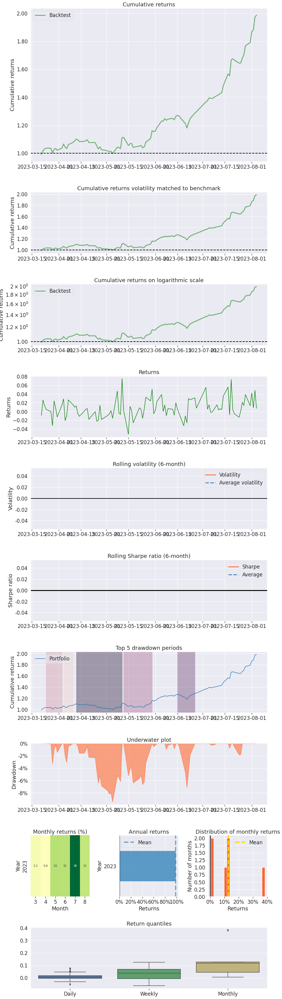

In [ ]:
# !pip install pyfolio
import pyfolio
print(f"********* PORTFOLIO TEARSHEET *************** ")

try:
    returns_tear_sheet = pyfolio.create_returns_tear_sheet(OrderedTable['pct_change'].dropna(),return_fig=True)
except Exception as e:
    print("Error generating returns tear sheet:", e)
    returns_tear_sheet = None

print("********* end of TEARSHEET **************\n")



CHATGPT: Write python script to create an html file that can visualize all output data created by pyfolio.create_returns_tear_sheet(OrderedTable['pct_change'].dropna()) command.

In [ ]:
returns_tear_sheet.savefig("Fig_006_Ret_Tear_sheet.jpg", format='jpg', dpi=300)

from IPython.display import Image
Image(url="Fig_006_Ret_Tear_sheet.jpg")



In [ ]:
L = len(OrderedTable['PF_Value'])

In [ ]:
L


94

In [ ]:
MaxDrawdown=(1.0-OrderedTable['PF_Value']/OrderedTable['PF_Value'].cummax()).max()
MaxDrawdown

0.09442404785638625

<Figure size 432x288 with 0 Axes>

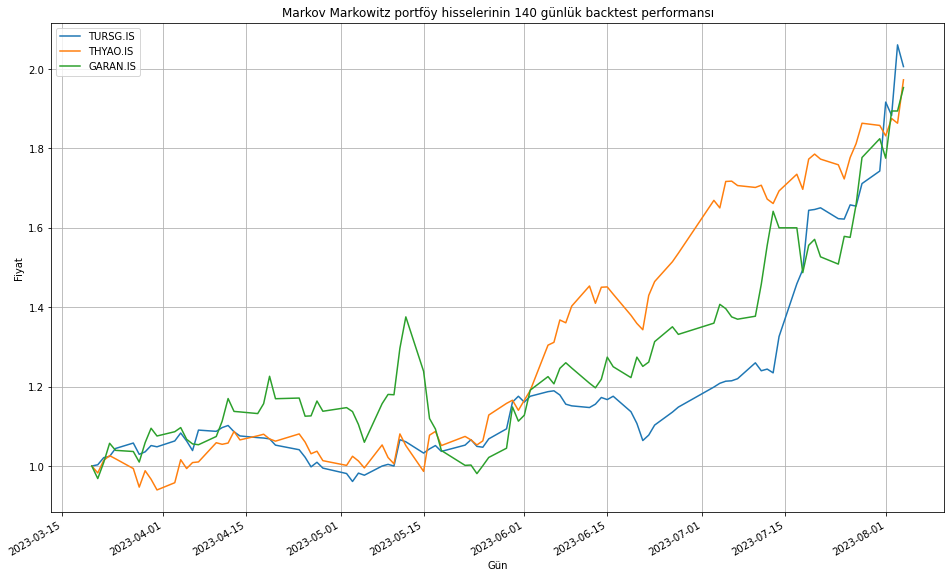

In [ ]:
plt.figure()

PLOTTED =  names

(OrderedTable[PLOTTED] / OrderedTable[PLOTTED].iloc[0]).plot(figsize = (16,10))
plt.xlabel('Gün')
plt.ylabel('Fiyat')
plt.grid(True)
plt.title(f"Markov Markowitz portföy hisselerinin {BACKTEST_PERIOD} günlük backtest performansı")
plt.show()




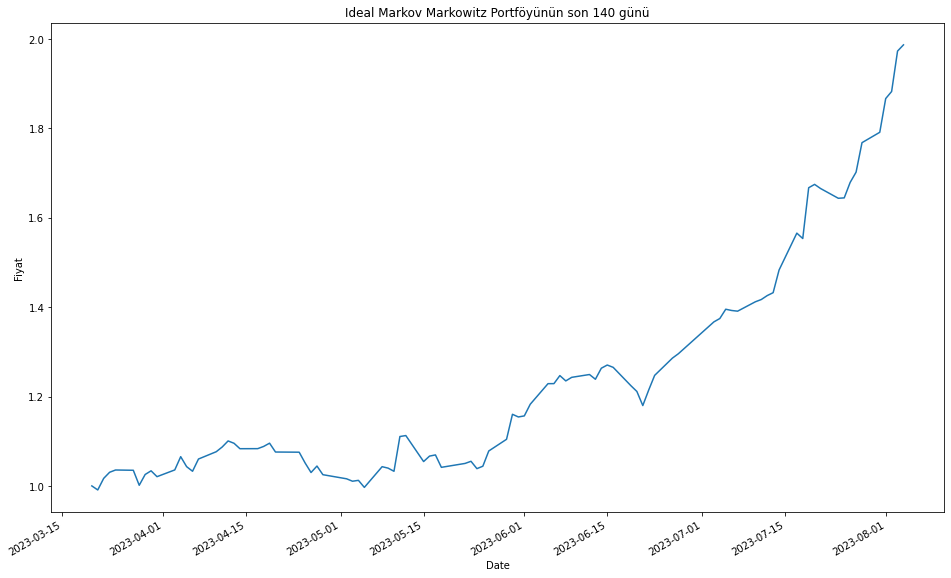

In [ ]:
plt.figure()
plt.title(f'Ideal Markov Markowitz Portföyünün son {look_back} günü')
plt.xlabel('Tarih')
plt.ylabel('Fiyat')
(OrderedTable['PF_Value'] / OrderedTable['PF_Value'].iloc[0]).plot(figsize = (16,10))
plt.savefig('PF_grafik')
plt.show()

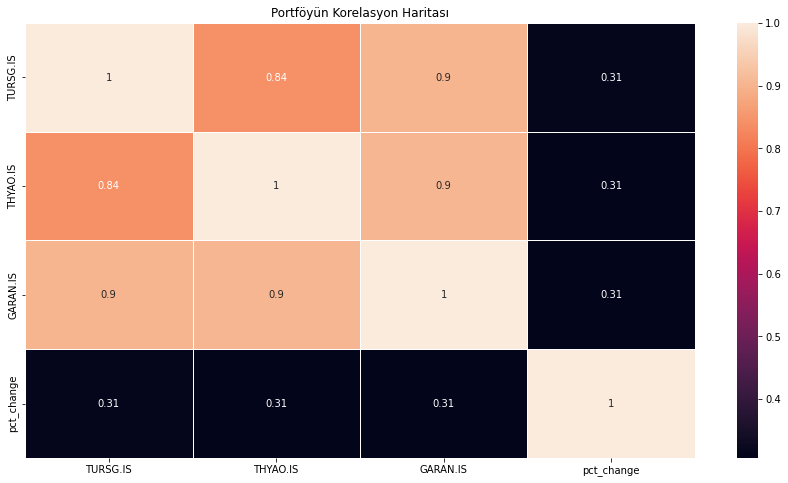

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(15,8))
sns.heatmap(OrderedTable.corr(),linecolor='white',linewidths=1,annot=True)
plt.title("Portföyün Korelasyon Haritası")
plt.show()
plt.savefig("korelasyon.png")

In [ ]:
MaxDrawdown

0.09442404785638625

In [ ]:
Portfolio_Weights * 100

TURSG.IS   52.830
THYAO.IS   29.830
GARAN.IS   17.340
Name: %, dtype: float64

In [ ]:
Portfolio_Weights*CURRENT_T2
Ideal_PF_Weights = Portfolio_Weights
Ideal_PF_Weights

TURSG.IS   0.528
THYAO.IS   0.298
GARAN.IS   0.173
Name: %, dtype: float64

In [ ]:
### Download Data for Forward Testing Performance <a name="download_fwtest"></a>

In [ ]:
names




Index(['TURSG.IS', 'THYAO.IS', 'GARAN.IS'], dtype='object')

In [ ]:
# NOW DOWNLOAD START FROM today-look_back, FOR FW TESTING UNTIL TODAY

'''
UTILITY U=020 : DOWNLOAD_ASSETS_&_WRITE_DF_FOR_FW_TESTING
--------------------------------------------
- CHANGES WORKING DIRECTORY
- SET FLAG TO NEW_DOWNLOAD
- GETS DATA FOR ALL ASSETS IN stock_list FROM YAHOO FINANCE
- WRITES DATA IN df and price_list
- WRITES DATA IN CSV FILES

'''


# T1_START = date.today() - timedelta( days = 30)
# T1_END   = date.today() - timedelta( days = 1)



LENGTH = 64
#os.chdir(wd)

new_download = True

price_list = []
if FW_TEST_PERIOD > FW_TEST_LIMIT :
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in names:
            try:   # added 2/07/22
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 2/07/22
                print(e, tick)        # added 2/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")
        if "GC=F" in names: # added 3/07/22
            tick = "TRY=X"
            try:   # added 3/07/22
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
            except Exception as e:    # added 3/07/22
                print(e, tick)        # added 3/07/22

    ## Save datafiles to disk

        for i,dframe in enumerate(price_list):
            dframe.to_csv(f"{names[i]}.csv")
        if "GC=F" in names: # added 3/07/22
            df.to_csv("TRY=X.csv")

    #
    # UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
    # --------------------------------------------
    # - CHANGES WORKING DIRECTORY
    # - SET FLAG TO NEW_DOWNLOAD
    # - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
    # - PUTS DATA in df
    #

    else:
        price = {}
        print(LENGTH*"*")
        print("Fetching Downloaded CSV Files ...")
        print(LENGTH*"*")
        for tick in names:
            print(f"Fetching {tick}")
            filename = f"{tick}.csv"
            df = pd.read_csv(filename)
            price[tick] = df
        print(LENGTH*"*")
        #print('Done ...Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
        print(LENGTH*"*")

else:
    print("FW TEST NOT PERFORMED")
len(names)

FW TEST NOT PERFORMED


3

In [ ]:
'''
UTILITY U=001 : CSV_MERGER_FOR_FW_TESTING
--------------------------------------------
- READS desired assets from csv files
- APPENDS the 'close' columns required in a single df name `li`
- DROPS NA rows
'''
Portfolio_Assets = names

li = pd.DataFrame() # my real portfolio dataframe

rets = pd.DataFrame()

names = []

count = len(Portfolio_Assets)
import os
#os.chdir(wd)
#for file in sorted2.Stock:
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    for file in Portfolio_Assets:
        df = pd.read_csv(f"{file}.csv", index_col='Date', parse_dates=True, infer_datetime_format=True)
        li = pd.concat([li,df['Close']],axis=1, ignore_index=False)
        st_name = file.split('.',maxsplit = 1)
        names.append(st_name[0])

    li.columns = names
    li = li.dropna()

    if "GC=F" in Portfolio_Assets: # added 3/07/22
        df = pd.read_csv("TRY=X.csv", index_col='Date', parse_dates=True, infer_datetime_format=True)
        li["GC=F"] = ConvertOunceToGram( df["Close"].astype(float), li["GC=F"].astype(float))



In [ ]:
Portfolio_Assets
Best_Assets =  Portfolio_Assets

In [ ]:
Portfolio_Assets


Index(['TURSG.IS', 'THYAO.IS', 'GARAN.IS'], dtype='object')

In [ ]:
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    Final_TEFAS_PF.index = names

In [ ]:
'''
UTILITY U=003 : SET_DRX-AI_PORTFOLIO_PROPERTIES_FOR_FORWARD_TESTING
-------------------------------------------------------------------
- SETS desired assets names
- SETS number of shares for each asset
- SETS extra cash value
- PRINTS these as a table
'''
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    import pandas as pd
    Portfolio_Assets = Final_TEFAS_PF.index
    import math
    #Portfolio_Shares = int(Final_TEFAS_PF[f"Amount in {CURRENT_T2} {currency}"] / li.iloc[0,0:])
    Portfolio_Shares = np.trunc(Final_TEFAS_PF[f"Amount in {CURRENT_T2} {currency}"] / li.iloc[0,0:])

    #print(f"\n Initial prices: \n{InitialPrices} \n")
    Portfolio_Shares



In [ ]:
#Final_TEFAS_PF['Amount in 100000 TL']
#1/li.iloc[0,0:]
#Portfolio_Shares = np.multiply(Final_TEFAS_PF['Amount in 100000 TL'], 1/li.iloc[0,0:])



In [ ]:
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    Cash_Plus_MFs = 0# cash + fon + temettü
    Current_PF = pd.Series(Portfolio_Shares, Portfolio_Assets)
    print(Current_PF)

In [ ]:
Portfolio_Shares
Best_Shares = Portfolio_Shares

In [ ]:
import os
os.chdir(root)

In [ ]:
# GENERATE YAHOO PORTFOLIO COMPATIBLE IMPORTABLE CSV FILE
#read_PF=pd.DataFrame(pd.read_csv('YF_PROTOTYPE.csv')) # read a prototype
read_PF=pd.DataFrame(pd.read_csv('YF_PROTOTYPE_XU100.csv')) # read a prototype

protoype_len = len(read_PF)

read_PF

,Symbol,Current Price,Date,Time,Change,Open,High,Low,Volume,Trade Date,Purchase Price,Quantity,Commission,High Limit,Low Limit,Comment
0,XU100.IS,"3,649.210",2022/09/12,18:10 TRST,127.830,"3,557.670","3,650.070","3,543.920",0,NaN,"3,000.000",0.000,NaN,NaN,NaN,NaN
1,CCOLA.IS,154.500,2022/09/12,18:09 TRST,-1.000,156.000,157.100,154.100,560613,"20,220,427.000",78.500,"1,432.000",NaN,NaN,NaN,NaN
2,CANTE.IS,80.000,2022/09/12,18:08 TRST,-0.200,80.200,81.500,78.400,95244,"20,220,427.000",10.510,"10,330.000",NaN,NaN,NaN,NaN
3,AKSUE.IS,38.100,2022/09/12,18:09 TRST,3.100,35.940,38.400,35.240,823208,"20,220,427.000",6.630,"6,597.000",NaN,NaN,NaN,NaN
4,ERBOS.IS,122.800,2022/09/12,18:09 TRST,1.300,122.800,124.300,120.900,661427,"20,220,427.000",101.600,272.000,NaN,NaN,NaN,NaN
5,ENKAI.IS,19.530,2022/09/12,18:09 TRST,0.460,19.310,19.950,19.240,6704734,"20,220,427.000",8.050,"3,732.000",NaN,NaN,NaN,NaN
6,QUAGR.IS,28.340,2022/09/12,18:09 TRST,-0.360,29.180,29.260,28.300,1035239,"20,220,427.000",13.200,"1,988.000",NaN,NaN,NaN,NaN
7,EREGL.IS,33.400,2022/09/12,18:09 TRST,0.940,33.060,34.000,32.540,217099954,"20,220,427.000",15.910,"1,510.000",NaN,NaN,NaN,NaN
8,BLCYT.IS,11.570,2022/09/12,18:09 TRST,-0.030,11.600,11.700,11.530,964812,NaN,11.340,"1,477.000",NaN,NaN,NaN,NaN


In [ ]:
best_len = len(Best_Assets)
diff = best_len - protoype_len
diff

-6

In [ ]:
np.round(Best_Shares,0)

In [ ]:
lastCloses = PurchasePrices
len(lastCloses)

4

ERROR! Session/line number was not unique in database. History logging moved to new session 5181


In [ ]:
df_line = {}
if diff>0:
    for i in np.arange(0,diff):  # add number of rows = diff to prototype portfolio dataframe
        read_PF = read_PF.append(df_line, ignore_index = True)
elif diff<0:
    while diff<0:
        read_PF = read_PF.iloc[:-1 , :] # delete number of rows = diff from pr ototype portfolio dataframe
        diff  +=1


In [ ]:
read_PF

,Symbol,Current Price,Date,Time,Change,Open,High,Low,Volume,Trade Date,Purchase Price,Quantity,Commission,High Limit,Low Limit,Comment
0,XU100.IS,"3,649.210",2022/09/12,18:10 TRST,127.830,"3,557.670","3,650.070","3,543.920",0,NaN,"3,000.000",0.000,NaN,NaN,NaN,NaN
1,CCOLA.IS,154.500,2022/09/12,18:09 TRST,-1.000,156.000,157.100,154.100,560613,"20,220,427.000",78.500,"1,432.000",NaN,NaN,NaN,NaN
2,CANTE.IS,80.000,2022/09/12,18:08 TRST,-0.200,80.200,81.500,78.400,95244,"20,220,427.000",10.510,"10,330.000",NaN,NaN,NaN,NaN


In [ ]:
lastCloses

Date        2023-08-04
TURSG.IS        19.060
THYAO.IS       248.800
GARAN.IS        47.000
Name: 93, dtype: object

In [ ]:
FirstPrices

Date        2023-03-20
TURSG.IS         9.500
THYAO.IS       126.100
Name: 0, dtype: object

In [ ]:
i = 0
for ba in Best_Assets:
    read_PF.Symbol[i] = ba
    i=i+1
i = 0
for bs in Best_Shares:
    read_PF.Quantity[i] = np.round(bs,0)
    i=i+1

# for i in np.arange(0,len(lastCloses)-1):
#     #read_PF['Purchase Price'][i] = lastCloses[i+1]
#     read_PF['Purchase Price'][i] = FirstPrices[i]
#     i=i+1
for i in np.arange(0,len(FirstPrices)-1):
    read_PF['Purchase Price'][i] = FirstPrices[i+1]
    i=i+1




/var/folders/fw/kcckd0xj57gb2qc72smx1m7r0000gn/T/ipykernel_22656/1654563101.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  read_PF.Symbol[i] = ba
/var/folders/fw/kcckd0xj57gb2qc72smx1m7r0000gn/T/ipykernel_22656/1654563101.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  read_PF.Quantity[i] = np.round(bs,0)
/var/folders/fw/kcckd0xj57gb2qc72smx1m7r0000gn/T/ipykernel_22656/1654563101.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-c

In [ ]:
i

2

In [ ]:
read_PF

,Symbol,Current Price,Date,Time,Change,Open,High,Low,Volume,Trade Date,Purchase Price,Quantity,Commission,High Limit,Low Limit,Comment
0,TURSG.IS,"3,649.210",2022/09/12,18:10 TRST,127.830,"3,557.670","3,650.070","3,543.920",0,NaN,9.500,"5,431.000",NaN,NaN,NaN,NaN
1,THYAO.IS,154.500,2022/09/12,18:09 TRST,-1.000,156.000,157.100,154.100,560613,"20,220,427.000",126.100,231.000,NaN,NaN,NaN,NaN
2,GARAN.IS,80.000,2022/09/12,18:08 TRST,-0.200,80.200,81.500,78.400,95244,"20,220,427.000",10.510,703.000,NaN,NaN,NaN,NaN


In [ ]:
if  exchange == "BIST500":
    read_PF = read_PF.append({'Symbol':'XU100.IS', 'Quantity':0.00001, 'Purchase Price':'3000'}, ignore_index=True)


In [ ]:
read_PF

,Symbol,Current Price,Date,Time,Change,Open,High,Low,Volume,Trade Date,Purchase Price,Quantity,Commission,High Limit,Low Limit,Comment
0,TURSG.IS,"3,649.210",2022/09/12,18:10 TRST,127.830,"3,557.670","3,650.070","3,543.920",0,NaN,9.500,"5,431.000",NaN,NaN,NaN,NaN
1,THYAO.IS,154.500,2022/09/12,18:09 TRST,-1.000,156.000,157.100,154.100,560613,"20,220,427.000",126.100,231.000,NaN,NaN,NaN,NaN
2,GARAN.IS,80.000,2022/09/12,18:08 TRST,-0.200,80.200,81.500,78.400,95244,"20,220,427.000",10.510,703.000,NaN,NaN,NaN,NaN


In [ ]:
read_PF.to_csv("YF_IDEAL.csv")

### Present Forward Testing Performance <a name="present_fwtest"></a>

In [ ]:
'''
UTILITY U=002 : PORTFOLIO_CALCULATOR
--------------------------------------------
- READS column of individual assets
- CALCULATES the portfolio value as `li[Portfolio]` appended to df `li`
- CALCULATES daily log returns for every column of li and writes to `rets`
- CALCULATES daily PF Index and writes to `li[Portfolio_Index] and normal daily returns and writes to `li[PF_Returns]`
- PRINTS the tear sheet of varios statistics
'''
import matplotlib.pyplot as plt
import pyfolio as pf
import numpy as np
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    totals = []
    ADD = 0
    for i in np.arange(0,count):
        ADD +=  li[f"{names[i]}"] * Portfolio_Shares[i]
        totals.append(li[f"{names[i]}"] * Portfolio_Shares[i])

    ADD += Cash_Plus_MFs # FONLARI EKLEDIK

    #li = pd.concat([li, ADD], axis=1, ignore_index=False)
    li['My Portfolio'] = ADD
    print(f"Stocks selected = {names}")
    print(f"Number of stocks selected = {len(names)}")

    for file in li.columns:
        a = np.log(li[f"{file}"] / (li[f"{file}"].shift(1)))
        rets[f"{file}"]= a

    print(" My Portfolio", li.round(2))

    print(" Returns", rets.round(6))

    plt.plot(li['My Portfolio'])

    # li['Portfolio'] = ADD # cash added
    li['Index'] = li['My Portfolio'] / li['My Portfolio'].iloc[0]
    li['PF_Returns'] = ((li['My Portfolio']-li['My Portfolio'].shift(1)) / li['My Portfolio'].shift(1)).fillna(method="ffill").round(6)
    li.dropna()

    print(f"\n======= PF Weights======================")
    print(Portfolio_Weights * 100)
    print(f"********* FW TESTING RESULTS *************** ")
    print(f"********* PORTFOLIO TEARSHEET *************** ")
    #pf.create_simple_tear_sheet(li['PF_Returns'].dropna())
    pf.create_returns_tear_sheet(li['PF_Returns'].dropna())
    print("********* end of TEARSHEET **************\n")

    pystats_df = pf.timeseries.perf_stats(li['PF_Returns'])



In [ ]:
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    TodaysPrices = li.iloc[-1,0:]
    print(f"\n Todays prices: \n{TodaysPrices} \n")

#CURRENT_T2 = TodaysPrices['Portfolio']

### My Own Manual Portfolio Performance <a name="my_own"></a>

In [ ]:
'''
UTILITY U=003 : SET_CURRENT_PORTFOLIO_PROPERTIES of MY MANUAL PF
-----------------------------------------------------------------
- SETS desired assets names
- SETS number of shares for each asset
- SETS extra cash value
- PRINTS these as a table
'''

import pandas as pd    #TI3 mimic as for 29 April 2022

Portfolio_Assets = MyAssets

Portfolio_Shares = MyShares

Cash_Plus_MFs = 0 # cash + fon + temettü


Current_PF = pd.Series(Portfolio_Shares, Portfolio_Assets)
print(Current_PF)



CANTE.IS    4958
dtype: int64


In [ ]:
'''
UTILITY U=020 : DOWNLOAD_ASSETS_&_WRITE_DF_FOR_FW_TESTING FOR MY MANUAL PF
--------------------------------------------
- CHANGES WORKING DIRECTORY
- SET FLAG TO NEW_DOWNLOAD
- GETS DATA FOR ALL ASSETS IN stock_list FROM YAHOO FINANCE
- WRITES DATA IN df and price_list
- WRITES DATA IN CSV FILES

'''

LENGTH = 64
#os.chdir(wd)

new_download = True

price_list = []

if FW_TEST_PERIOD <= FW_TEST_LIMIT:
    T1_START = T0_START
    T1_END = T0_END

if new_download:
    print(LENGTH*"*")
    print("Starting Download ...")
    print(LENGTH*"*")
    for tick in Portfolio_Assets:
        try:
            print(f"Downloading {tick}")
            yf_tick = yf.Ticker(tick)
            df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
            df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
            df.dropna(how='all', inplace=True)
            price_list.append(df)
        except Exception as e:    # added 1/07/22
            print(e, tick)        # added 1/07/22

    print(LENGTH*"*")
    if "GC=F" in Portfolio_Assets: # added 3/07/22
        tick = "TRY=X"
        try:
            print(f"Downloading {tick}")
            yf_tick = yf.Ticker(tick)
            df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
            df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
            df.dropna(how='all', inplace=True)
            price_list.append(df)
        except Exception as e:    # added 1/07/22
            print(e, tick)        # added 1/07/22
    print(LENGTH*"*")
    print(LENGTH*"*")

## Save datafiles to disk

    for i,df in enumerate(price_list):
        df.to_csv(f"{Portfolio_Assets[i]}.csv")

#
# UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
# --------------------------------------------
# - CHANGES WORKING DIRECTORY
# - SET FLAG TO NEW_DOWNLOAD
# - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
# - PUTS DATA in df
#

else:
    price = {}
    print(LENGTH*"*")
    print("Fetching Downloaded CSV Files ...")
    print(LENGTH*"*")
    for tick in names:
        print(f"Fetching {tick}")
        filename = f"{tick}.csv"
        df = pd.read_,csv(filename)
        price[tick] = df
    print(LENGTH*"*")
    #print('Done ...Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
    print(LENGTH*"*")

len(Portfolio_Assets)



****************************************************************
Starting Download ...
****************************************************************
****************************************************************
****************************************************************
****************************************************************


1

In [ ]:
'''
UTILITY U=001 : MY MANUAL PF CSV_MERGER_FOR_FW_TESTING
--------------------------------------------
- READS desired assets from csv files
- APPENDS the 'close' columns required in a single df name `li`
- DROPS NA rows
'''
# Portfolio_Assets = names

# if FW_TEST_PERIOD !=0:
mypf = pd.DataFrame() # my real portfolio dataframe

rets = pd.DataFrame()

names = []

# if 'TRY=X' not in Portfolio_Assets:
#     Portfolio_Assets = AddToStockList(Portfolio_Assets, 'TRY=X')

count = len(Portfolio_Assets)
import os
#os.chdir(wd)
#for file in sorted2.Stock:
for file in Portfolio_Assets:
    df = pd.read_csv(f"{file}.csv", index_col='Date', parse_dates=True, infer_datetime_format=True)
    mypf = pd.concat([mypf,df['Close']],axis=1, ignore_index=False)
    st_name = file.split('.',maxsplit = 1)
    names.append(st_name[0])

mypf.columns = names
mypf = mypf.dropna(axis=0)



# if 'TRY=X' in mypf.columns:
#     for i in mypf.columns:
#         if i != 'GC=F' and i != 'CL=F':
#             mypf[i] = pd.Series(mypf[i] / mypf['TRY=X'])

mypf

,CANTE
2023-03-20,24.420
2023-03-21,24.160
2023-03-22,25.120
2023-03-23,25.940
2023-03-24,23.360
...,...
2023-07-31,21.540
2023-08-01,20.740
2023-08-02,20.420
2023-08-03,20.040


### Present My Own Portfolio Performance <a name="present_own"></a>

In [ ]:
mypf

,CANTE
2023-03-20,24.420
2023-03-21,24.160
2023-03-22,25.120
2023-03-23,25.940
2023-03-24,23.360
...,...
2023-07-31,21.540
2023-08-01,20.740
2023-08-02,20.420
2023-08-03,20.040


Stocks selected = ['CANTE']
Number of stocks selected = 1
 My Portfolio                      CANTE  My Portfolio
2023-05-09 00:00:00 18.680             0
2023-05-10 00:00:00 17.400             0
2023-05-11 00:00:00 17.410             0
2023-05-12 00:00:00 17.430             0
2023-05-15 00:00:00 17.000             0
2023-05-16 00:00:00 17.090             0
2023-05-17 00:00:00 17.240             0
2023-05-18 00:00:00 17.600             0
2023-05-22 00:00:00 19.360             0
2023-05-23 00:00:00 21.280             0
2023-05-24 00:00:00 23.400             0
2023-05-25 00:00:00 24.400             0
2023-05-26 00:00:00 23.080             0
2023-05-29 00:00:00 22.580             0
2023-05-30 00:00:00 22.640             0
2023-05-31 00:00:00 21.520             0
2023-06-01 00:00:00 21.540             0
2023-06-02 00:00:00 21.720             0
2023-06-05 00:00:00 21.920             0
2023-06-06 00:00:00 21.820             0
2023-06-07 00:00:00 21.880             0
2023-06-08 00:00:00 22.600

/opt/homebrew/lib/python3.9/site-packages/scipy/stats/stats.py:1107: RuntimeWarning: Mean of empty slice.
  mean = a.mean(axis, keepdims=True)
/opt/homebrew/lib/python3.9/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/opt/homebrew/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/homebrew/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/homebrew/lib/python3.9/site-packages/scipy/stats/stats.py:1216: RuntimeWarning: Mean of empty slice.
  mean = a.mean(axis, keepdims=True)


,Backtest
Annual return,nan%
Cumulative returns,nan%
Annual volatility,nan%
Sharpe ratio,NaN
Calmar ratio,NaN
Stability,NaN
Max drawdown,nan%
Omega ratio,NaN
Sortino ratio,NaN
Skew,NaN


********* end of TEARSHEET **************



nan

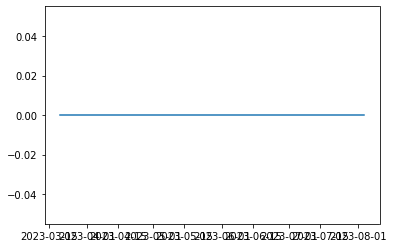

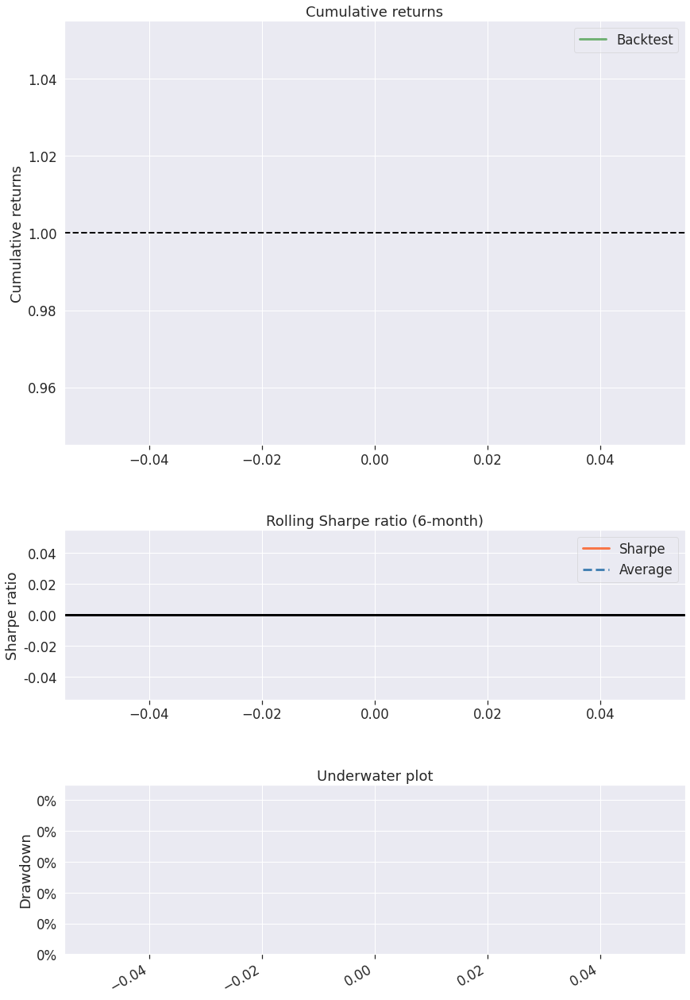

In [ ]:
'''
UTILITY U=002 : MY MANUAL PORTFOLIO_CALCULATOR (li. ==> mypf.)
--------------------------------------------
- READS column of individual assets
- CALCULATES the portfolio value as `li[Portfolio]` appended to df `li`
- CALCULATES daily log returns for every column of li and writes to `rets`
- CALCULATES daily PF Index and writes to `li[Portfolio_Index] and normal daily returns and writes to `li[PF_Returns]`
- PRINTS the tear sheet of varios statistics
'''
import matplotlib.pyplot as plt
import pyfolio as pf
import numpy as np
# if FW_TEST_PERIOD !=0:
totals = []
ADD = 0
#for i in np.arange(0,count):
for i in np.arange(0,len(mypf.columns)-1):
    if names[i] == "GC=F":
        ADD +=  mypf[f"{names[i]}"] * mypf["TRY=X"] * Portfolio_Shares[i]
    else:
        ADD +=  mypf[f"{names[i]}"] * Portfolio_Shares[i]
        totals.append(mypf[f"{names[i]}"] * Portfolio_Shares[i])

ADD += Cash_Plus_MFs # FONLARI EKLEDIK
ADD += 0# FONLARI EKLEDIK
#li = pd.concat([li, ADD], axis=1, ignore_index=False)
mypf['My Portfolio'] = ADD
print(f"Stocks selected = {names}")
print(f"Number of stocks selected = {len(names)}")

# for file in li.columns:
#     a = np.log(li[f"{file}"] / (li[f"{file}"].shift(1)))
#     rets[f"{file}"]= a

for file in mypf.columns:
    a = np.log(mypf[f"{file}"] / (mypf[f"{file}"].shift(1)))
    rets[f"{file}"]= a

print(" My Portfolio", mypf.round(2).tail(60))

print(" Returns", rets.round(5).tail(60))

plt.plot(mypf['My Portfolio'])

# li['Portfolio'] = ADD # cash added
mypf['Index'] = mypf['My Portfolio'] / mypf['My Portfolio'].iloc[0]
mypf['PF_Returns'] = ((mypf['My Portfolio']-mypf['My Portfolio'].shift(1)) / mypf['My Portfolio'].shift(1)).fillna(method="ffill").round(6)

print(f"\n======= PF Weights======================")
print(f"********* PORTFOLIO TEARSHEET *************** ")
#pf.create_returns_tear_sheet(mypf['PF_Returns'].dropna())
pf.create_simple_tear_sheet(mypf['PF_Returns'].dropna())
print("********* end of TEARSHEET **************\n")
mypf.index = pd.DatetimeIndex(mypf.index)
mypf['My Portfolio'].pct_change().mean()

In [ ]:
totals

[]

In [ ]:
# TodaysPrices = mypf.iloc[-1,:-3]
# PurchasePrices = mypf.iloc[0,:-3]
# print(f"\n Purchase prices: \n{PurchasePrices} \n")
# print(f"\n Final prices: \n{TodaysPrices} \n")
# Best_Assets =  names
# len(Best_Assets)
# TOTALPFVAL = mypf.iloc[-1,-3]
# Best_Shares = Portfolio_Shares
# Portfolio_Weights = np.multiply(Best_Shares ,TodaysPrices) / TOTALPFVAL
# Portfolio_Weights

In [ ]:
Portfolio_Weights

TURSG.IS   0.528
THYAO.IS   0.298
GARAN.IS   0.173
Name: %, dtype: float64

In [ ]:
len(Best_Shares)

3

In [ ]:
#mypf['My Portfolio'].pct_change().mean()

In [ ]:
#result['day-of-week'] = result.index.weekday()
#        result = result.loc[result['day-of-week'] < 5]



In [ ]:
Ideal_PF_Weights

TURSG.IS   0.528
THYAO.IS   0.298
GARAN.IS   0.173
Name: %, dtype: float64

In [ ]:
Ideal_PF_Weights

TURSG.IS   0.528
THYAO.IS   0.298
GARAN.IS   0.173
Name: %, dtype: float64

In [ ]:
# !pip install xlsxwriter
# import xlsxwriter

# workbook = xlsxwriter.Workbook('ShoppingList.xlsx')
# worksheet = workbook.add_worksheet()

# row = 0
# col = 0

# for key in SHOPPING_LIST.keys():
#     row += 1
#     worksheet.write(row, col, key)
#     for item in SHOPPING_LIST.items():
#         worksheet.write(row, col, item)
#         row += 1

# workbook.close()




In [ ]:
# ShoppingList

In [ ]:
# from PIL import Image

# file_in = "PF_grafik.png"
# img = Image.open(file_in)
# file_out = 'test1.bmp'
# print(len(img.split())) # test
# if len(img.split()) == 4:
#     # prevent IOError: cannot write mode RGBA as BMP
#     r, g, b, a = img.split()
#     img = Image.merge("RGB", (r, g, b))
#     img.save(file_out)
# else:
#     img.save(file_out)

# !pip install xlwt
# from xlwt import Workbook
# w = Workbook()
# ws = w.add_sheet('Grafikler')
# ws.insert_bitmap(file_out, 0, 0)
# w.save(filename)

In [ ]:
### Plot Sector Graph for Ideal PF <a name="sector_graph"></a>

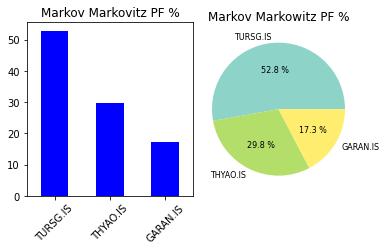

In [ ]:


    #plt.tight_layout()
plot_sector_counts(Portfolio_Weights*100)


### Write Ideal PF to Yahoo Portfolio Compatible CSV file <a name="yahoo_pf"></a>

In [ ]:

print(70*'-')
print(70*'-')
print(70*'-')
print(70*'-')
#input("Any key to continue")

----------------------------------------------------------------------
----------------------------------------------------------------------
----------------------------------------------------------------------
----------------------------------------------------------------------


### Read PF From yahoo Portfolio again to calculate Last-Day-Weights of Selected PF <a name="Update_weights"></a>

In [ ]:
TodaysPrices = mypf.iloc[-1,:-3]
PurchasePrices = mypf.iloc[0,:-3]
TOTALPFVAL = mypf.iloc[-1,-3]
print(f"\n Purchase prices: \n{PurchasePrices} \n")
print(f"\n Final prices: \n{TodaysPrices} \n")


 Purchase prices: 
CANTE   24.420
Name: 2023-03-20 00:00:00, dtype: float64 


 Final prices: 
CANTE   19.920
Name: 2023-08-04 00:00:00, dtype: float64 



In [ ]:
Best_Assets =  Portfolio_Assets
Best_Shares = Portfolio_Shares

Portfolio_Weights = np.multiply(Best_Shares, TodaysPrices) / TOTALPFVAL
Portfolio_Weights.index += '.IS'
plot_sector_counts(Portfolio_Weights*100)

/opt/homebrew/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3052: RuntimeWarning: invalid value encountered in true_divide
  x = x / sx
posx and posy should be finite values
posx and posy should be finite values


ValueError: need at least one array to concatenate

<Figure size 432x288 with 2 Axes>

In [ ]:
read_PF=pd.DataFrame(pd.read_csv('YF_PROTOTYPE_XU100.csv')) # read a prototype

protoype_len = len(read_PF)

protoype_len

9

In [ ]:
best_len = len(PurchasePrices)
diff = best_len - protoype_len
diff

-8

In [ ]:
df_line = {}
if diff>0:
    for i in np.arange(0,diff):  # add number of rows = diff to prototype portfolio dataframe
        read_PF = read_PF.append(df_line, ignore_index = True)
elif diff<0:
    while diff<0:
        read_PF = read_PF.iloc[:-1 , :] # delete number of rows = diff from pr ototype portfolio dataframe
        diff  +=1


In [ ]:
i = 0
for ba in Portfolio_Weights.index:
    read_PF.Symbol[i] = ba
    i=i+1
i = 0
for bs in Best_Shares:
    read_PF.Quantity[i] = np.round(bs,0)
    i=i+1

for i in np.arange(0,len(PurchasePrices)-1):
    read_PF['Purchase Price'][i] = PurchasePrices[i+1]
    i=i+1




In [ ]:
read_PF = read_PF.append({'Symbol':'XU100.IS', 'Quantity':0.00001, 'Purchase Price':'3000'}, ignore_index=True)
read_PF

,Symbol,Current Price,Date,Time,Change,Open,High,Low,Volume,Trade Date,Purchase Price,Quantity,Commission,High Limit,Low Limit,Comment
0,CANTE.IS,"3,649.210",2022/09/12,18:10 TRST,127.830,"3,557.670","3,650.070","3,543.920",0.000,NaN,"3,000.000","4,958.000",NaN,NaN,NaN,NaN
1,XU100.IS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3000,0.000,NaN,NaN,NaN,NaN


In [ ]:
read_PF.to_csv("YF_MYPF.csv")

In [ ]:

print(70*'-')
print(70*'-')
print(70*'-')
print(70*'-')
#input("Any key to continue")

----------------------------------------------------------------------
----------------------------------------------------------------------
----------------------------------------------------------------------
----------------------------------------------------------------------


In [ ]:
#PF = pd.DataFrame(pd.read_csv(f"EXPORT_{exchange}_MPT_v520D_BK100D-FW200D-SH17.86-ST2022-01-04.csv"))
os.chdir(root)
PF = pd.DataFrame(pd.read_csv("IDEAL.csv"))


In [ ]:
PF['Purchased Value'] = PF['Purchase Price'] * PF['Quantity']

In [ ]:
PF['Market Value'] = PF['Current Price'] * PF['Quantity']

In [ ]:
PF['PnL %'] = (PF['Market Value'] - PF['Purchased Value']) / PF['Purchased Value'] *100

In [ ]:
PF.index = PF.Symbol

In [ ]:
PF['Start PF %'] = np.round((PF['Purchased Value'] / PF['Purchased Value'].sum()) *100, 5)
PF['End PF %'] = np.round((PF['Market Value'] / PF['Market Value'].sum()) *100, 5)

In [ ]:
PF.sort_values( by=["Start PF %"], ascending=[False], inplace = True)


In [ ]:
IDEALPF = PF[['Quantity','Purchase Price','Purchased Value','Current Price','Market Value',  'Start PF %', 'End PF %', 'PnL %']]

In [ ]:
IDEALPF['Market Value'].sum()
CURRENT_T2

97672

In [ ]:
PV = IDEALPF['Purchased Value'].sum()
FV = IDEALPF['Market Value'].sum()

IDEALPF['Purchase Amount'] = np.trunc(IDEALPF['End PF %']*CURRENT_T2/100)
IDEALPF['End Quantity'] = np.trunc(IDEALPF['Purchase Amount'] / IDEALPF['Current Price'])
IDEALPF



/var/folders/fw/kcckd0xj57gb2qc72smx1m7r0000gn/T/ipykernel_22656/356176331.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IDEALPF['Purchase Amount'] = np.trunc(IDEALPF['End PF %']*CURRENT_T2/100)
/var/folders/fw/kcckd0xj57gb2qc72smx1m7r0000gn/T/ipykernel_22656/356176331.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IDEALPF['End Quantity'] = np.trunc(IDEALPF['Purchase Amount'] / IDEALPF['Current Price'])


,Quantity,Purchase Price,Purchased Value,Current Price,Market Value,Start PF %,End PF %,PnL %,Purchase Amount,End Quantity
Symbol,,,,,,,,,,
QUAGR.IS,"1,195.000",12.470,"14,901.650",85.000,"101,575.000",35.225,38.774,581.636,"37,871.000",445.000
HEKTS.IS,"2,916.000",4.290,"12,509.640",32.400,"94,478.400",29.571,36.065,655.245,"35,225.000","1,087.000"
AKSEN.IS,"1,117.000",11.030,"12,320.510",34.640,"38,692.880",29.124,14.770,214.053,"14,426.000",416.000
ALARK.IS,388.000,6.630,"2,572.440",70.150,"27,218.200",6.081,10.390,958.069,"10,148.000",144.000
XU100.IS,0.000,"3,000.000",0.030,"5,372.660",0.054,0.000,0.000,79.089,0.000,0.000


Start PF value = 42304.27
Total PF value = 261964.53
Total Revenue =  219660.26
Total Revenue =  %519.239


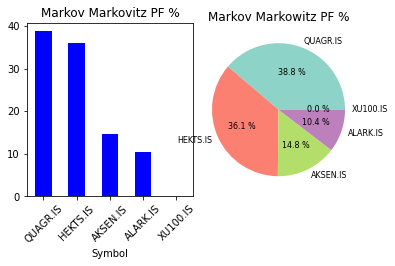

In [ ]:
plot_sector_counts(IDEALPF['End PF %'].dropna())

print(f"Start PF value = {PV:.2f}")
print(f"Total PF value = {FV:.2f}")
print(f"Total Revenue =  {FV-PV:.2f}")
print(f"Total Revenue =  %{(FV-PV)/PV*100:.3f}")



In [ ]:
IDEALPF[['Current Price','End PF %','Purchase Amount','End Quantity']]

,Current Price,End PF %,Purchase Amount,End Quantity
Symbol,,,,
QUAGR.IS,85.000,38.774,"37,871.000",445.000
HEKTS.IS,32.400,36.065,"35,225.000","1,087.000"
AKSEN.IS,34.640,14.770,"14,426.000",416.000
ALARK.IS,70.150,10.390,"10,148.000",144.000
XU100.IS,"5,372.660",0.000,0.000,0.000


In [ ]:
TOTAL_PURCHASED = IDEALPF['Purchase Amount'].sum()
print(f"TO BE PURCHASED =  {TOTAL_PURCHASED:.2f} TL")
print(f"CASH REMAINING =  {CURRENT_T2 - TOTAL_PURCHASED:.2f} TL")



TO BE PURCHASED =  97670.00 TL
CASH REMAINING =  2.00 TL


In [ ]:
'''
UTILITY U=003 : SET_CURRENT_PORTFOLIO_PROPERTIES of MY MANUAL PF
-----------------------------------------------------------------
- SETS desired assets names
- SETS number of shares for each asset
- SETS extra cash value
- PRINTS these as a table
'''

import pandas as pd    #TI3 mimic as for 29 April 2022


Portfolio_Assets = IDEALPF.index
Portfolio_Shares = IDEALPF['Quantity']
Cash_Plus_MFs = 0 # cash + fon + temettü

Current_PF = pd.Series(Portfolio_Shares, Portfolio_Assets)
print(Current_PF)
print('Number of stocks =',len(Current_PF))


Symbol
QUAGR.IS   1,195.000
HEKTS.IS   2,916.000
AKSEN.IS   1,117.000
ALARK.IS     388.000
XU100.IS       0.000
Name: Quantity, dtype: float64
Number of stocks = 5


In [ ]:
'''
UTILITY U=020 : DOWNLOAD_ASSETS_&_WRITE_DF_FOR_FW_TESTING FOR MY MANUAL PF
--------------------------------------------
- CHANGES WORKING DIRECTORY
- SET FLAG TO NEW_DOWNLOAD
- GETS DATA FOR ALL ASSETS IN stock_list FROM YAHOO FINANCE
- WRITES DATA IN df and price_list
- WRITES DATA IN CSV FILES

'''

LENGTH = 64
#os.chdir(wd)

new_download = True

price_list = []
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in Portfolio_Assets:
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22

        print(LENGTH*"*")
        if "GC=F" in Portfolio_Assets: # added 3/07/22
            tick = "TRY=X"
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")

    ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{Portfolio_Assets[i]}.csv")

    #
    # UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
    # --------------------------------------------
    # - CHANGES WORKING DIRECTORY
    # - SET FLAG TO NEW_DOWNLOAD
    # - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
    # - PUTS DATA in df
    #
else:
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in Portfolio_Assets:
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22

        print(LENGTH*"*")
        if "GC=F" in Portfolio_Assets: # added 3/07/22
            tick = "TRY=X"
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")

    ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{Portfolio_Assets[i]}.csv")



****************************************************************
Starting Download ...
****************************************************************
****************************************************************
****************************************************************
****************************************************************


In [ ]:
'''
UTILITY U=001 : MY MANUAL PF CSV_MERGER_FOR_FW_TESTING
--------------------------------------------
- READS desired assets from csv files
- APPENDS the 'close' columns required in a single df name `li`
- DROPS NA rows
'''
# Portfolio_Assets = names

mypf = pd.DataFrame() # my real portfolio dataframe

rets = pd.DataFrame()

names = []

count = len(Portfolio_Assets)
import os
#os.chdir(wd)
#for file in sorted2.Stock:
for file in Portfolio_Assets:
    df = pd.read_csv(f"{file}.csv", index_col='Date', parse_dates=True, infer_datetime_format=True)
    mypf = pd.concat([mypf,df['Close']],axis=1, ignore_index=False)
    st_name = file.split('.',maxsplit = 1)
    names.append(st_name[0])

mypf.columns = names
#mypf = mypf.dropna(inplace=True)
mypf



,QUAGR,HEKTS,AKSEN,ALARK,XU100
2023-03-20,5.860,28.540,30.060,70.410,"4,975.500"
2023-03-21,5.580,28.460,29.240,69.870,"4,906.600"
2023-03-22,5.460,28.980,30.440,70.160,"5,001.100"
2023-03-23,5.720,29.900,30.520,70.560,"5,062.000"
2023-03-24,5.680,30.260,31.160,69.620,"5,032.000"
...,...,...,...,...,...
2023-07-31,7.480,30.620,39.540,104.100,"7,217.000"
2023-08-01,7.500,31.780,38.680,108.000,"7,168.500"
2023-08-02,7.510,31.280,38.580,106.800,"7,258.500"
2023-08-03,7.720,30.780,38.280,111.600,"7,221.500"


Stocks selected = ['QUAGR', 'HEKTS', 'AKSEN', 'ALARK', 'XU100']
Number of stocks selected = 5
 My Portfolio                      QUAGR  HEKTS  AKSEN   ALARK     XU100  My Portfolio
2023-05-09 00:00:00  7.320 24.400 27.040  53.870 4,536.200   131,003.090
2023-05-10 00:00:00  7.320 22.680 26.800  50.910 4,494.500   124,571.000
2023-05-11 00:00:00  7.400 24.000 28.320  54.610 4,848.000   131,649.170
2023-05-12 00:00:00  7.180 24.120 28.400  55.440 4,795.600   132,147.590
2023-05-15 00:00:00  7.520 23.620 27.220  53.280 4,501.200   128,939.750
2023-05-16 00:00:00  7.580 24.860 28.300  57.460 4,589.700   135,455.490
2023-05-17 00:00:00  7.550 26.080 29.280  56.670 4,661.700   139,765.300
2023-05-18 00:00:00  7.640 24.700 28.680  58.150 4,501.700   135,752.810
2023-05-22 00:00:00  7.650 24.880 28.360  59.230 4,466.200   136,351.230
2023-05-23 00:00:00  7.450 25.860 28.800  58.100 4,471.000   139,022.950
2023-05-24 00:00:00  7.550 25.200 28.300  57.860 4,424.900   136,566.270
2023-05-25 00:00

Start date,2023-03-21
End date,2023-08-04
Total months,4
,Backtest
Annual return,75.032%
Cumulative returns,22.948%
Annual volatility,44.04%
Sharpe ratio,1.49
Calmar ratio,3.43
Stability,0.50
Max drawdown,-21.88%


********* end of TEARSHEET **************



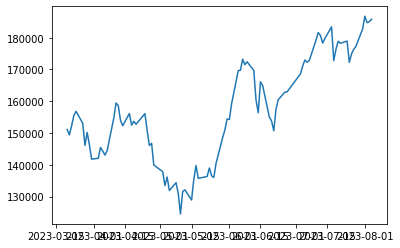

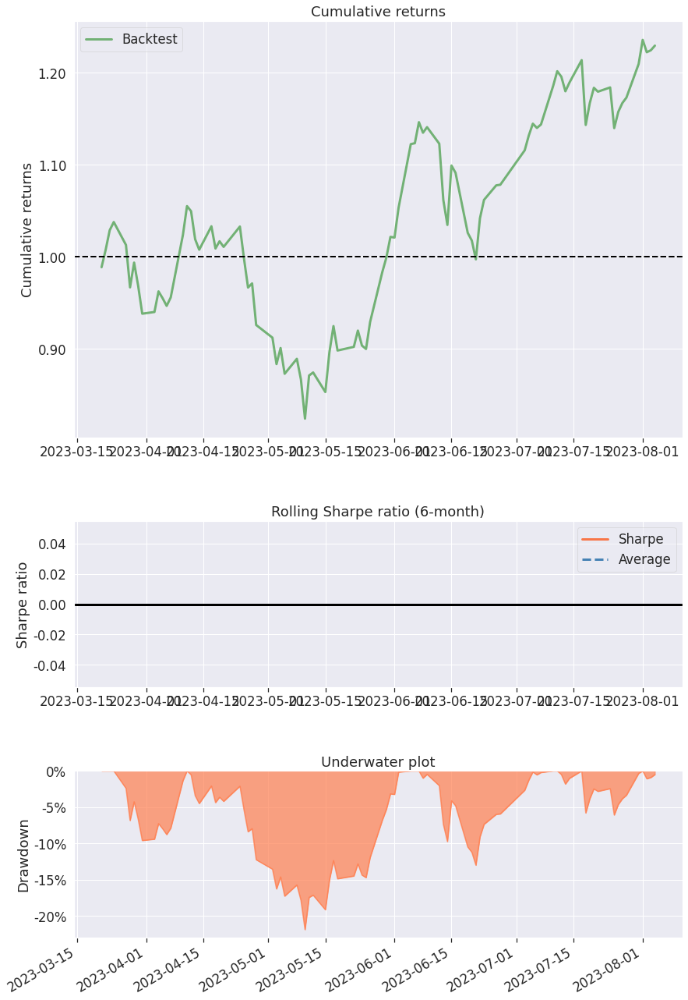

In [ ]:
'''
UTILITY U=002 : MY MANUAL PORTFOLIO_CALCULATOR (li. ==> mypf.)
--------------------------------------------
- READS column of individual assets
- CALCULATES the portfolio value as `li[Portfolio]` appended to df `li`
- CALCULATES daily log returns for every column of li and writes to `rets`
- CALCULATES daily PF Index and writes to `li[Portfolio_Index] and normal daily returns and writes to `li[PF_Returns]`
- PRINTS the tear sheet of varios statistics
'''
import matplotlib.pyplot as plt
import pyfolio as pf
import numpy as np

totals = []
ADD = 0
for i in np.arange(0,count):
    if names[i] == "GC=F":
        ADD +=  mypf[f"{names[i]}"] * mypf["TRY=X"] * Portfolio_Shares[i]
    else:
        ADD +=  mypf[f"{names[i]}"] * Portfolio_Shares[i]
        totals.append(mypf[f"{names[i]}"] * Portfolio_Shares[i])

ADD += Cash_Plus_MFs # FONLARI EKLEDIK
#li = pd.concat([li, ADD], axis=1, ignore_index=False)
mypf['My Portfolio'] = ADD
print(f"Stocks selected = {names}")
print(f"Number of stocks selected = {len(names)}")



# for file in li.columns:
#     a = np.log(li[f"{file}"] / (li[f"{file}"].shift(1)))
#     rets[f"{file}"]= a

for file in mypf.columns:
    a = np.log(mypf[f"{file}"] / (mypf[f"{file}"].shift(1)))
    rets[f"{file}"]= a

print(" My Portfolio", mypf.round(2).tail(60))

print(" Returns", rets.round(5).tail(60))

plt.plot(mypf['My Portfolio'])

# li['Portfolio'] = ADD # cash added
mypf['Index'] = mypf['My Portfolio'] / mypf['My Portfolio'].iloc[0]
mypf['PF_Returns'] = ((mypf['My Portfolio']-mypf['My Portfolio'].shift(1)) / mypf['My Portfolio'].shift(1)).fillna(method="ffill").round(6)


print(f"\n======= PF Weights======================")
print(f"********* PORTFOLIO TEARSHEET *************** ")
pf.create_simple_tear_sheet(mypf['PF_Returns'].dropna())
#pf.create_returns_tear_sheet(mypf['PF_Returns'].dropna())
print("********* end of TEARSHEET **************\n")
mypf.index = pd.DatetimeIndex(mypf.index)



In [ ]:
mypf

,QUAGR,HEKTS,AKSEN,ALARK,XU100,My Portfolio,Index,PF_Returns
2023-03-20,5.860,28.540,30.060,70.410,"4,975.500","151,121.490",1.000,NaN
2023-03-21,5.580,28.460,29.240,69.870,"4,906.600","149,428.149",0.989,-0.011
2023-03-22,5.460,28.980,30.440,70.160,"5,001.100","152,253.990",1.007,0.019
2023-03-23,5.720,29.900,30.520,70.560,"5,062.000","155,491.971",1.029,0.021
2023-03-24,5.680,30.260,31.160,69.620,"5,032.000","156,844.090",1.038,0.009
...,...,...,...,...,...,...,...,...
2023-07-31,7.480,30.620,39.540,104.100,"7,217.000","182,783.572",1.210,0.031
2023-08-01,7.500,31.780,38.680,108.000,"7,168.500","186,742.612",1.236,0.022
2023-08-02,7.510,31.280,38.580,106.800,"7,258.500","184,719.263",1.222,-0.011
2023-08-03,7.720,30.780,38.280,111.600,"7,221.500","185,039.512",1.224,0.002


## Portföy Alpha ve Beta Parametrelerinin Hesabı <a name="alpha_beta"></a>

$$
    Stock\ returns_i = \alpha + \beta * Market\ returns_i
$$

## Reference
[Beta Calculations](https://financetrain.com/calculating-beta-using-market-model-regression-slope/)

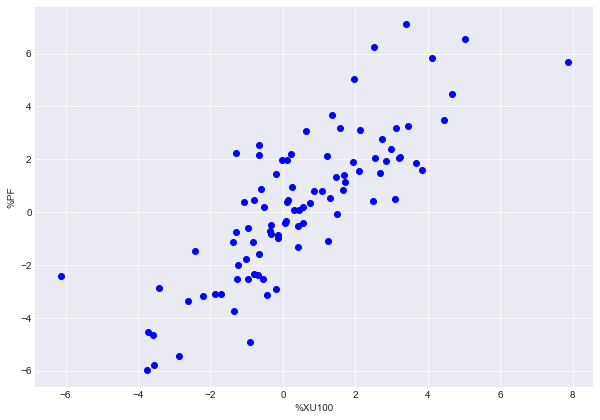

BETA = %XU100   0.979
dtype: float64


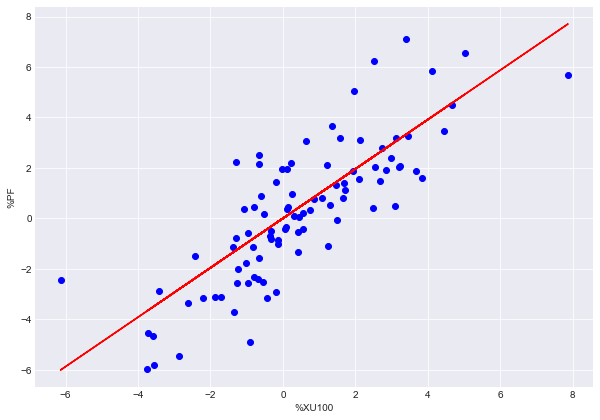

        2023-03-21  2023-03-22  2023-03-23  2023-03-24  2023-03-27  \
%XU100      -1.385       1.926       1.218      -0.593      -0.680   
%PF         -1.121       1.891       2.127       0.870      -2.399   

        2023-03-28  2023-03-29  2023-03-30  2023-03-31  2023-04-03  ...  \
%XU100      -3.728       2.737      -0.953      -1.699       0.553  ...   
%PF         -4.546       2.780      -2.544      -3.120       0.199  ...   

        2023-07-24  2023-07-25  2023-07-26  2023-07-27  2023-07-28  \
%XU100       0.109      -1.346       2.103       1.664       3.080   
%PF          0.390      -3.730       1.549       0.825       0.509   

        2023-07-31  2023-08-01  2023-08-02  2023-08-03  2023-08-04  
%XU100       2.118      -0.672       1.255      -0.510       2.480  
%PF          3.109       2.166      -1.083       0.173       0.412  

[2 rows x 93 columns]


In [ ]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
%matplotlib inline
import pandas as pd

import warnings
warnings.simplefilter("ignore")

from data import get_stock_data

start_date = T1_START
end_date = T1_END

data = pd.DataFrame()
data['XU100'] = mypf.XU100
data['PORTFOLIO'] = mypf['My Portfolio']

data

data_pc = data.pct_change().dropna()*100
data_pc.columns = (["%XU100", "%PF"])
data_pc.tail(30)
plt.figure(figsize=(10,7))
plt.scatter(data_pc["%XU100"], data_pc["%PF"],color='b')
plt.ylabel("%PF")
plt.xlabel("%XU100")
plt.show()
import statsmodels.api as sm
model = sm.OLS( data_pc["%PF"], data_pc["%XU100"])
line = model.fit()
beta = line.params[0]
print("BETA =", line.params)
#print(line.t_test([1]))
plt.figure(figsize=(10,7))
plt.scatter(data_pc['%XU100'], data_pc['%PF'],color='b')
x = data_pc['%XU100']
y = data_pc['%PF']
plt.plot(x, beta*x, color='r')
plt.ylabel('%PF')
plt.xlabel('%XU100')
plt.show()
m_x = x.mean()
m_y = y.mean()
s_x = x.std()
s_y = y.std()

Mean = pd.DataFrame([m_x,m_y])
StDev = pd.DataFrame([s_x,s_y])

# print(Mean.T)
# print(StDev.T)

# Zscore calc
# z_x = (x - m_x) / s_x
# print(z_x)
# z_y = (y - m_y) / s_y
# print(z_y)

Z = pd.DataFrame([x,y])
print(Z)

r_xy = data_pc.corr()

r_xy
r_xy.iloc[1,0]
#beta = r_xy.iloc[1,0] * s_y / s_x
alpha = m_y - beta * m_x

IDEALPF['Alpha'] = alpha
IDEALPF['Beta'] = beta

### Index ve Portföyümüzün Risk ve Maksimum Çöküş Değerlerinin Hesaplanması <a name="vol_mdd"></a>

In [ ]:
# Calculate rolling standard deviation of SPY and Tesla
# data['volatility XU100'] = data['XU100'].pct_change().rolling(10).std()
# data['volatility PF']    = data['PORTFOLIO'].pct_change().rolling(10).std()
# data['PF Index'] = data['PORTFOLIO'] * 0.00000016

# data['PnL'] = data['PF Index'].diff()

# data = data.dropna()

In [ ]:
# Plot Volatility of SPY and Tesla
# data[['volatility XU100', 'volatility PF']].plot(figsize=(15, 15))

# # Set the title and axes labels
# plt.title('Volatility', fontsize=14)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Standard Deviation of Returns', fontsize=12)
# plt.show()

In [ ]:
def calc_drawdown(price):

    # Calculate the running maximum
    running_max = np.maximum.accumulate(price.dropna())

    # Ensure the value never drops below 1
    running_max[running_max < 1] = 1

    # Calculate the drawdown
    drawdown = (price)/running_max - 1
    return drawdown


def plot_drawdown(drawdown, graph_title):

    # Plot drawdown
    plt.figure(figsize=(15, 7))
    drawdown.plot(color='r')
    plt.ylabel('Drawdown', fontsize=12)
    plt.xlabel('Year-Month', fontsize=12)
    plt.title(graph_title, fontsize=14)
    plt.fill_between(drawdown.index, drawdown.values, color='red')
    plt.grid(which="major", color='k', linestyle='-.', linewidth=0.2)

    plt.show()

In [ ]:

# drawdown_spy = calc_drawdown(data['XU100'])

# # Calculate maximum drawdown of SPY
# max_dd_spy = drawdown_spy.min()*100
# print("The maximum drawdown of XU100 is %.2f" % max_dd_spy)

# # Plot SPY drawdown
# plot_drawdown(drawdown_spy, 'XU100 Drawdown')

In [ ]:

# drawdown_tsla = calc_drawdown(data['PORTFOLIO'])

# # Calculate maximum drawdown of Tesla
# max_dd_tsla = drawdown_tsla.min()*100
# print("The maximum drawdown of PF is %.2f" % max_dd_tsla)

# # Plot Tesla drawdown
# plot_drawdown(drawdown_tsla, 'PF Drawdown')

### IDEAL.csv PORTFOLIO PERFORMANCE <a name="ideal_csv"></a>

In [ ]:
IDEALPF = IDEALPF.dropna()

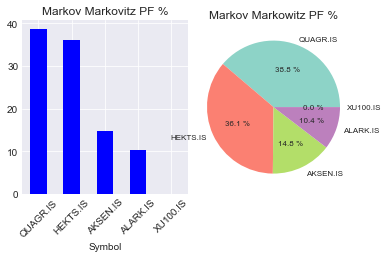

In [ ]:
plot_sector_counts(IDEALPF['End PF %'].dropna())

In [ ]:
Portfolio_Assets = IDEALPF.index
Portfolio_Shares = IDEALPF.Quantity


In [ ]:
'''
UTILITY U=020 : DOWNLOAD_ASSETS_&_WRITE_DF_FOR_FW_TESTING
--------------------------------------------
- CHANGES WORKING DIRECTORY
- SET FLAG TO NEW_DOWNLOAD
- GETS DATA FOR ALL ASSETS IN stock_list FROM YAHOO FINANCE
- WRITES DATA IN df and price_list
- WRITES DATA IN CSV FILES

'''

LENGTH = 64
#os.chdir(wd)

new_download = True

price_list = []
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in Portfolio_Assets:
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22

        print(LENGTH*"*")
        if "GC=F" in Portfolio_Assets: # added 3/07/22
            tick = "TRY=X"
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")

    ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{Portfolio_Assets[i]}.csv")

    #
    # UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
    # --------------------------------------------
    # - CHANGES WORKING DIRECTORY
    # - SET FLAG TO NEW_DOWNLOAD
    # - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
    # - PUTS DATA in df
    #

    else:
        price = {}
        print(LENGTH*"*")
        print("Fetching Downloaded CSV Files ...")
        print(LENGTH*"*")
        for tick in names:
            print(f"Fetching {tick}")
            filename = f"{tick}.csv"
            df = pd.read_,csv(filename)
            price[tick] = df
        print(LENGTH*"*")
        #print('Done ...Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
        print(LENGTH*"*")

    len(Portfolio_Assets)
else :
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in Portfolio_Assets:
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22

        print(LENGTH*"*")
        if "GC=F" in Portfolio_Assets: # added 3/07/22
            tick = "TRY=X"
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")

    ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{Portfolio_Assets[i]}.csv")

    #
    # UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
    # --------------------------------------------
    # - CHANGES WORKING DIRECTORY
    # - SET FLAG TO NEW_DOWNLOAD
    # - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
    # - PUTS DATA in df
    #

    else:
        price = {}
        print(LENGTH*"*")
        print("Fetching Downloaded CSV Files ...")
        print(LENGTH*"*")
        for tick in names:
            print(f"Fetching {tick}")
            filename = f"{tick}.csv"
            df = pd.read_,csv(filename)
            price[tick] = df
        print(LENGTH*"*")
        #print('Done ...Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
        print(LENGTH*"*")

    len(Portfolio_Assets)




****************************************************************
Starting Download ...
****************************************************************
****************************************************************
****************************************************************
****************************************************************


In [ ]:
'''
UTILITY U=001 : CSV_MERGER_FOR_FW_TESTING
--------------------------------------------
- READS desired assets from csv files
- APPENDS the 'close' columns required in a single df name `li`
- DROPS NA rows
'''
# Portfolio_Assets = names

li = pd.DataFrame() # my real portfolio dataframe

rets = pd.DataFrame()

names = []

count = len(Portfolio_Assets)
import os
#os.chdir(wd)
#for file in sorted2.Stock:
for file in Portfolio_Assets:
    df = pd.read_csv(f"{file}.csv", index_col='Date', parse_dates=True, infer_datetime_format=True)
    li = pd.concat([li,df['Close']],axis=1, ignore_index=False)
    st_name = file.split('.',maxsplit = 1)
    names.append(st_name[0])

li.columns = names
li = li.dropna(axis=0)

li

,QUAGR,HEKTS,AKSEN,ALARK,XU100
2023-03-20,5.860,28.540,30.060,70.410,"4,975.500"
2023-03-21,5.580,28.460,29.240,69.870,"4,906.600"
2023-03-22,5.460,28.980,30.440,70.160,"5,001.100"
2023-03-23,5.720,29.900,30.520,70.560,"5,062.000"
2023-03-24,5.680,30.260,31.160,69.620,"5,032.000"
...,...,...,...,...,...
2023-07-31,7.480,30.620,39.540,104.100,"7,217.000"
2023-08-01,7.500,31.780,38.680,108.000,"7,168.500"
2023-08-02,7.510,31.280,38.580,106.800,"7,258.500"
2023-08-03,7.720,30.780,38.280,111.600,"7,221.500"


Stocks selected = ['QUAGR', 'HEKTS', 'AKSEN', 'ALARK', 'XU100']
Number of stocks selected = 5
 My Portfolio                      QUAGR  HEKTS  AKSEN   ALARK     XU100  My Portfolio
2023-05-09 00:00:00  7.320 24.400 27.040  53.870 4,536.200   131,003.090
2023-05-10 00:00:00  7.320 22.680 26.800  50.910 4,494.500   124,571.000
2023-05-11 00:00:00  7.400 24.000 28.320  54.610 4,848.000   131,649.170
2023-05-12 00:00:00  7.180 24.120 28.400  55.440 4,795.600   132,147.590
2023-05-15 00:00:00  7.520 23.620 27.220  53.280 4,501.200   128,939.750
2023-05-16 00:00:00  7.580 24.860 28.300  57.460 4,589.700   135,455.490
2023-05-17 00:00:00  7.550 26.080 29.280  56.670 4,661.700   139,765.300
2023-05-18 00:00:00  7.640 24.700 28.680  58.150 4,501.700   135,752.810
2023-05-22 00:00:00  7.650 24.880 28.360  59.230 4,466.200   136,351.230
2023-05-23 00:00:00  7.450 25.860 28.800  58.100 4,471.000   139,022.950
2023-05-24 00:00:00  7.550 25.200 28.300  57.860 4,424.900   136,566.270
2023-05-25 00:00

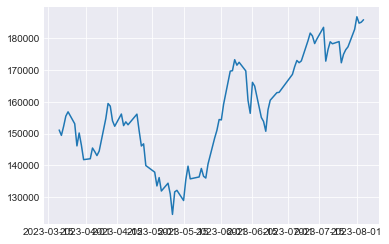

In [ ]:
'''
UTILITY U=002 : PORTFOLIO_CALCULATOR
--------------------------------------------
- READS column of individual assets
- CALCULATES the portfolio value as `li[Portfolio]` appended to df `li`
- CALCULATES daily log returns for every column of li and writes to `rets`
- CALCULATES daily PF Index and writes to `li[Portfolio_Index] and normal daily returns and writes to `li[PF_Returns]`
- PRINTS the tear sheet of varios statistics
'''
import matplotlib.pyplot as plt
import pyfolio as pf
import numpy as np

totals = []
ADD = 0
for i in np.arange(0,count):
    if names[i] == "GC=F":
        ADD +=  li[f"{names[i]}"] * li["TRY=X"] * Portfolio_Shares[i]
    else:
        ADD +=  li[f"{names[i]}"] * Portfolio_Shares[i]
        totals.append(li[f"{names[i]}"] * Portfolio_Shares[i])

ADD += Cash_Plus_MFs # FONLARI EKLEDIK
#li = pd.concat([li, ADD], axis=1, ignore_index=False)
li['My Portfolio'] = ADD
print(f"Stocks selected = {names}")
print(f"Number of stocks selected = {len(names)}")

for file in li.columns:
    a = np.log(li[f"{file}"] / (li[f"{file}"].shift(1)))
    rets[f"{file}"]= a

print(" My Portfolio", li.round(2).tail(60))
print(" Returns", rets.round(5).tail(60))
plt.plot(li['My Portfolio'])

# li['Portfolio'] = ADD # cash added


print(li['My Portfolio'])



In [ ]:
li

,QUAGR,HEKTS,AKSEN,ALARK,XU100,My Portfolio
2023-03-20,5.860,28.540,30.060,70.410,"4,975.500","151,121.490"
2023-03-21,5.580,28.460,29.240,69.870,"4,906.600","149,428.149"
2023-03-22,5.460,28.980,30.440,70.160,"5,001.100","152,253.990"
2023-03-23,5.720,29.900,30.520,70.560,"5,062.000","155,491.971"
2023-03-24,5.680,30.260,31.160,69.620,"5,032.000","156,844.090"
...,...,...,...,...,...,...
2023-07-31,7.480,30.620,39.540,104.100,"7,217.000","182,783.572"
2023-08-01,7.500,31.780,38.680,108.000,"7,168.500","186,742.612"
2023-08-02,7.510,31.280,38.580,106.800,"7,258.500","184,719.263"
2023-08-03,7.720,30.780,38.280,111.600,"7,221.500","185,039.512"


In [ ]:

li['Index'] = li['My Portfolio'] / li['My Portfolio'].iloc[0]
li['PF_Returns'] = ((li['My Portfolio']-li['My Portfolio'].shift(1)) / li['My Portfolio'].shift(1)).fillna(method="ffill").round(6)
MDD = (1.0-li['My Portfolio']/li['My Portfolio'].cummax()).max()
li['Max Drawdown'] = MDD

pystats_df = pf.timeseries.perf_stats(li['PF_Returns'])




======= PF Weights======================
********* PORTFOLIO TEARSHEET *************** 


Start date,2023-03-21
End date,2023-08-04
Total months,4
,Backtest
Annual return,75.032%
Cumulative returns,22.948%
Annual volatility,44.04%
Sharpe ratio,1.49
Calmar ratio,3.43
Stability,0.50
Max drawdown,-21.88%


********* end of TEARSHEET **************



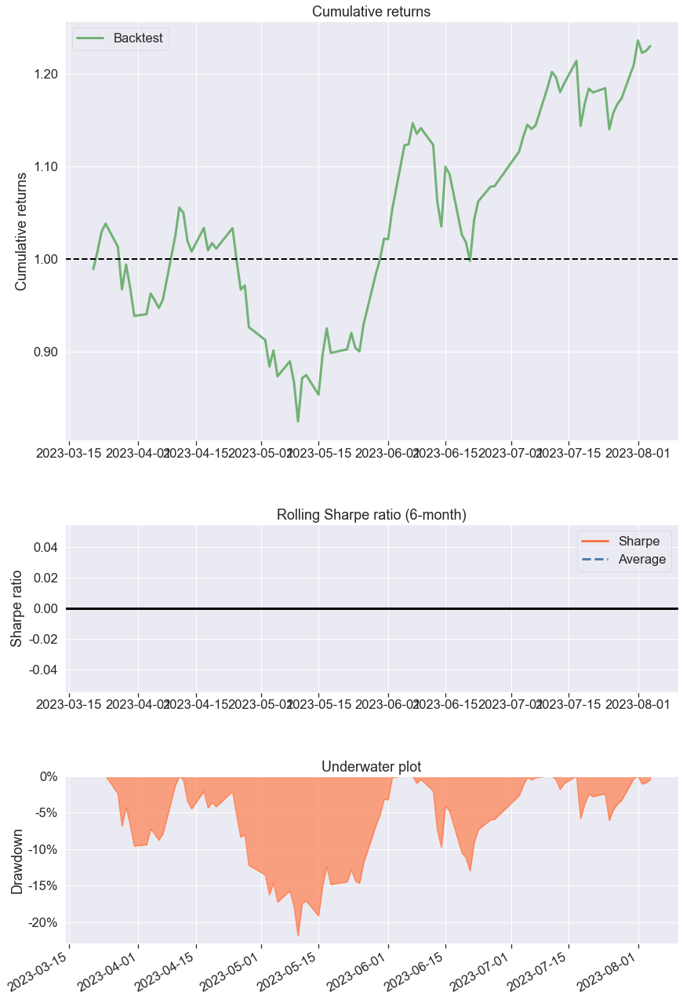

In [ ]:

print(f"\n======= PF Weights======================")
print(f"********* PORTFOLIO TEARSHEET *************** ")
pf.create_simple_tear_sheet(li['PF_Returns'].dropna())
#pf.create_returns_tear_sheet(li['PF_Returns'].dropna())
print("********* end of TEARSHEET **************\n")

In [ ]:
os.chdir(out)
# Move last 5 columns to first

temp_cols=li.columns.tolist()
new_cols=temp_cols[-4:] + temp_cols[:-4]
li=li[new_cols]
print(li)

            My Portfolio  Index  PF_Returns  Max Drawdown  QUAGR  HEKTS  \
2023-03-20   151,121.490  1.000         NaN         0.219  5.860 28.540   
2023-03-21   149,428.149  0.989      -0.011         0.219  5.580 28.460   
2023-03-22   152,253.990  1.007       0.019         0.219  5.460 28.980   
2023-03-23   155,491.971  1.029       0.021         0.219  5.720 29.900   
2023-03-24   156,844.090  1.038       0.009         0.219  5.680 30.260   
...                  ...    ...         ...           ...    ...    ...   
2023-07-31   182,783.572  1.210       0.031         0.219  7.480 30.620   
2023-08-01   186,742.612  1.236       0.022         0.219  7.500 31.780   
2023-08-02   184,719.263  1.222      -0.011         0.219  7.510 31.280   
2023-08-03   185,039.512  1.224       0.002         0.219  7.720 30.780   
2023-08-04   185,801.224  1.229       0.004         0.219  7.710 30.880   

            AKSEN   ALARK     XU100  
2023-03-20 30.060  70.410 4,975.500  
2023-03-21 29.240  69.8

In [ ]:
filename = "DashBoard_Ideal_PF.xlsx"
IDEALPF['Filename'] = filename_statement
with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
#    df = pd.DataFrame(Current_PF)
#    df.to_excel(writer, sheet_name='Mevcut PF')
    df = pd.DataFrame(li)
    df.to_excel(writer, sheet_name='PF Close')
#    mypf.to_excel(writer, sheet_name='My PF')
    pystats_df.to_excel(writer, sheet_name = 'PF STATS')
    IDEALPF.to_excel(writer, sheet_name = 'Ideal PF')
    # if FW_TEST_PERIOD > FW_TEST_LIMIT :
    #     ShoppingList.to_excel(writer, sheet_name = 'Shopping List')



In [ ]:

li

,My Portfolio,Index,PF_Returns,Max Drawdown,QUAGR,HEKTS,AKSEN,ALARK,XU100
2023-03-20,"151,121.490",1.000,NaN,0.219,5.860,28.540,30.060,70.410,"4,975.500"
2023-03-21,"149,428.149",0.989,-0.011,0.219,5.580,28.460,29.240,69.870,"4,906.600"
2023-03-22,"152,253.990",1.007,0.019,0.219,5.460,28.980,30.440,70.160,"5,001.100"
2023-03-23,"155,491.971",1.029,0.021,0.219,5.720,29.900,30.520,70.560,"5,062.000"
2023-03-24,"156,844.090",1.038,0.009,0.219,5.680,30.260,31.160,69.620,"5,032.000"
...,...,...,...,...,...,...,...,...,...
2023-07-31,"182,783.572",1.210,0.031,0.219,7.480,30.620,39.540,104.100,"7,217.000"
2023-08-01,"186,742.612",1.236,0.022,0.219,7.500,31.780,38.680,108.000,"7,168.500"
2023-08-02,"184,719.263",1.222,-0.011,0.219,7.510,31.280,38.580,106.800,"7,258.500"
2023-08-03,"185,039.512",1.224,0.002,0.219,7.720,30.780,38.280,111.600,"7,221.500"


In [ ]:
# '''
# UTILITY U=022 : COMPARE_TWO_PORTFOLIOS_AND_CREATE_SHOPPING_LIST
# ----------------------------------------------------------------
# - READS TWO PORTFOLIOS as DICTIONARY
# - CREATES SHOPPING_LIST dictionary for as difference
# '''

# #WAS = pd.DataFrame(totals)

# WAS.T

# WAS_DICT = np.round(WAS.T.iloc[-1],2).to_dict()
# WAS_DICT = { k.replace('.IS', ''): v for k, v in WAS_DICT.items() }
# WAS_DICT

# #sum = sum(WAS_DICT.values())
# #WILL = np.round(Portfolio_Weights*CURRENT_T2,2)
# WILL = pd.DataFrame(totals)

# WILL_DICT = { k.replace('.IS', ''): v for k, v in WILL.items() }
# WILL_DICT

# SHOPPING_LIST = {}
# for key in WAS_DICT.keys():
#     if key in WILL_DICT:
#         SHOPPING_LIST[key] = np.round(WILL_DICT[key] - WAS_DICT[key],2)

# for key in WAS_DICT.keys():
#     if key in WAS_DICT and not key in WILL_DICT:
#         SHOPPING_LIST[key] = -np.round(WAS_DICT[key],2)

# for key in WILL_DICT.keys():
#     if not key in WAS_DICT and key in WILL_DICT:
#         SHOPPING_LIST[key] = np.round(WILL_DICT[key],2)

# SHOPPING_LIST

# ShoppingList = pd.DataFrame([SHOPPING_LIST]).T

# ShoppingList.to_csv('ShoppingList.csv')
# ShoppingList

In [ ]:
print(70*'-')
print(70*'-')
print(70*'-')
print(70*'-')
#input("Any key to continue")
CORR_FILTER

----------------------------------------------------------------------
----------------------------------------------------------------------
----------------------------------------------------------------------
----------------------------------------------------------------------


0.75

### MYPF.csv PORTFOLIO PERFORMANCE <a name="mypf.csv_perf"></a>


In [ ]:
#PF = pd.DataFrame(pd.read_csv(f"EXPORT_{exchange}_MPT_v520D_BK100D-FW200D-SH17.86-ST2022-01-04.csv"))
os.chdir(root)
pf = pd.DataFrame(pd.read_csv("MYPF.csv"))

In [ ]:
pf['Purchased Value'] = pf['Purchase Price'] * pf['Quantity']

In [ ]:
pf['Market Value'] = pf['Current Price'] * pf['Quantity']

In [ ]:
pf['PnL %'] = (pf['Market Value'] - pf['Purchased Value']) / pf['Purchased Value'] *100

In [ ]:
pf.index = pf.Symbol

In [ ]:
pf['Start PF %'] = np.round((pf['Purchased Value'] / pf['Purchased Value'].sum()) *100, 5)
pf['End PF %'] = np.round((pf['Market Value'] / pf['Market Value'].sum()) *100, 5)

In [ ]:
pf.sort_values( by=["Start PF %"], ascending=[False], inplace = True)


In [ ]:
MYPF = pf[['Quantity','Purchase Price','Purchased Value','Current Price','Market Value',  'Start PF %', 'End PF %', 'PnL %']]

In [ ]:
MYPF['Market Value'].sum()

97672.67067279998

In [ ]:
PV = MYPF['Purchased Value'].sum()
FV = MYPF['Market Value'].sum()

MYPF['Purchase Amount'] = np.trunc(MYPF['End PF %']*CURRENT_T2/100)
MYPF['End Quantity'] = np.trunc(MYPF['Purchase Amount'] / MYPF['Current Price'])
MYPF



,Quantity,Purchase Price,Purchased Value,Current Price,Market Value,Start PF %,End PF %,PnL %,Purchase Amount,End Quantity
Symbol,,,,,,,,,,
CANTE.IS,"4,958.000","3,000.000","14,874,000.000",19.700,"97,672.600",100.000,100.000,-99.343,"97,671.000","4,957.000"
XU100.IS,0.000,"3,000.000",0.030,"7,067.280",0.071,0.000,0.000,135.576,0.000,0.000


In [ ]:
MYPF['End PF %']

Symbol
CANTE.IS   100.000
XU100.IS     0.000
Name: End PF %, dtype: float64

In [ ]:
'''
UTILITY U=022 : COMPARE_TWO_PORTFOLIOS_AND_CREATE_SHOPPING_LIST
----------------------------------------------------------------
- READS TWO PORTFOLIOS as DICTIONARY
- CREATES SHOPPING_LIST dictionary for as difference
'''
#if FW_TEST_PERIOD > FW_TEST_LIMIT:
WAS = np.round(MYPF['End PF %']/100*CURRENT_T2,2)

# WAS_DICT = np.round(WAS.T.iloc[-1],2).to_dict()
WAS_DICT = { k.replace('.IS', ''): v for k, v in WAS.items() }
WAS_DICT

#sum = sum(WAS_DICT.values())
WILL = np.round(Ideal_PF_Weights*CURRENT_T2,2)
WILL_DICT = { k.replace('.IS', ''): v for k, v in WILL.items() }
WILL_DICT

SHOPPING_LIST = {}
for key in WAS_DICT.keys():
    if key in WILL_DICT:
        SHOPPING_LIST[key] = np.round(WILL_DICT[key] - WAS_DICT[key],2)

for key in WAS_DICT.keys():
    if key in WAS_DICT and not key in WILL_DICT:
        SHOPPING_LIST[key] = -np.round(WAS_DICT[key],2)

for key in WILL_DICT.keys():
    if not key in WAS_DICT and key in WILL_DICT:
        SHOPPING_LIST[key] = np.round(WILL_DICT[key],2)

SHOPPING_LIST

ShoppingList = pd.DataFrame([SHOPPING_LIST]).T
ShoppingList.to_csv('ShoppingList.csv')
ShoppingList

,0
CANTE,"-97,671.930"
XU100,-0.070
TURSG,"51,600.120"
THYAO,"29,135.560"
GARAN,"16,936.320"


Start PF value = 14874000.03
Total PF value = 97672.67
Total Revenue =  -14776327.36
Total Revenue =  %-99.343


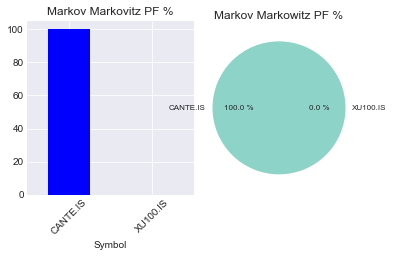

In [ ]:
plot_sector_counts(MYPF['End PF %'].dropna())

print(f"Start PF value = {PV:.2f}")
print(f"Total PF value = {FV:.2f}")
print(f"Total Revenue =  {FV-PV:.2f}")
print(f"Total Revenue =  %{(FV-PV)/PV*100:.3f}")



In [ ]:
MYPF[['Current Price','End PF %','Purchase Amount','End Quantity']]

,Current Price,End PF %,Purchase Amount,End Quantity
Symbol,,,,
CANTE.IS,19.700,100.000,"97,671.000","4,957.000"
XU100.IS,"7,067.280",0.000,0.000,0.000


In [ ]:
TOTAL_PURCHASED = MYPF['Purchase Amount'].sum()
print(f"TO BE PURCHASED =  {TOTAL_PURCHASED:.2f} TL")
print(f"CASH REMAINING =  {CURRENT_T2 - TOTAL_PURCHASED:.2f} TL")



TO BE PURCHASED =  97671.00 TL
CASH REMAINING =  1.00 TL


In [ ]:
'''
UTILITY U=003 : SET_CURRENT_PORTFOLIO_PROPERTIES of MY MANUAL PF
-----------------------------------------------------------------
- SETS desired assets names
- SETS number of shares for each asset
- SETS extra cash value
- PRINTS these as a table
'''

import pandas as pd    #TI3 mimic as for 29 April 2022


Portfolio_Assets = MYPF.index
Portfolio_Shares = MYPF['Quantity']
Cash_Plus_MFs = 0 # cash + fon + temettü

Current_PF = pd.Series(Portfolio_Shares, Portfolio_Assets)
print(Current_PF)
print('Number of stocks =',len(Current_PF))


Symbol
CANTE.IS   4,958.000
XU100.IS       0.000
Name: Quantity, dtype: float64
Number of stocks = 2


In [ ]:
'''
UTILITY U=020 : DOWNLOAD_ASSETS_&_WRITE_DF_FOR_FW_TESTING FOR MY MANUAL PF
--------------------------------------------
- CHANGES WORKING DIRECTORY
- SET FLAG TO NEW_DOWNLOAD
- GETS DATA FOR ALL ASSETS IN stock_list FROM YAHOO FINANCE
- WRITES DATA IN df and price_list
- WRITES DATA IN CSV FILES

'''

LENGTH = 64
#os.chdir(wd)

new_download = True

price_list = []
if FW_TEST_PERIOD > FW_TEST_LIMIT:
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in Portfolio_Assets:
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22

        print(LENGTH*"*")
        if "GC=F" in Portfolio_Assets: # added 3/07/22
            tick = "TRY=X"
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")

    ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{Portfolio_Assets[i]}.csv")
else:
    if new_download:
        print(LENGTH*"*")
        print("Starting Download ...")
        print(LENGTH*"*")
        for tick in Portfolio_Assets:
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        if "GC=F" in Portfolio_Assets: # added 3/07/22
            tick = "TRY=X"
            try:
                print(f"Downloading {tick}")
                yf_tick = yf.Ticker(tick)
                df = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)
                df['Close'] = df['Close'].mask( (tick == "XU100.IS" or tick == "XU030.IS") & (df['Close'] > 10000), other = df['Close'] / 100.0)
                df.dropna(how='all', inplace=True)
                price_list.append(df)
            except Exception as e:    # added 1/07/22
                print(e, tick)        # added 1/07/22
        print(LENGTH*"*")
        print(LENGTH*"*")

    ## Save datafiles to disk

        for i,df in enumerate(price_list):
            df.to_csv(f"{Portfolio_Assets[i]}.csv")

    #
    # UTILITY U=021 : FETCH_ASSETS_FROM_CSV_FILES_&_WRITE_DF
    # --------------------------------------------
    # - CHANGES WORKING DIRECTORY
    # - SET FLAG TO NEW_DOWNLOAD
    # - GETS DATA FOR ALL ASSETS IN stock_list FROM CSV FILES
# - PUTS DATA in df
#


****************************************************************
Starting Download ...
****************************************************************
****************************************************************
****************************************************************
****************************************************************


In [ ]:
'''
UTILITY U=001 : MY MANUAL PF CSV_MERGER_FOR_FW_TESTING
--------------------------------------------
- READS desired assets from csv files
- APPENDS the 'close' columns required in a single df name `li`
- DROPS NA rows
'''
# Portfolio_Assets = names

mypf = pd.DataFrame() # my real portfolio dataframe

rets = pd.DataFrame()

names = []

count = len(Portfolio_Assets)
import os
#os.chdir(wd)
#for file in sorted2.Stock:
for file in Portfolio_Assets:
    df = pd.read_csv(f"{file}.csv", index_col='Date', parse_dates=True, infer_datetime_format=True)
    mypf = pd.concat([mypf,df['Close']],axis=1, ignore_index=False)
    st_name = file.split('.',maxsplit = 1)
    names.append(st_name[0])

mypf.columns = names
#mypf = mypf.dropna(inplace=True)
mypf



,CANTE,XU100
2023-03-20,24.420,"4,975.500"
2023-03-21,24.160,"4,906.600"
2023-03-22,25.120,"5,001.100"
2023-03-23,25.940,"5,062.000"
2023-03-24,23.360,"5,032.000"
...,...,...
2023-07-31,21.540,"7,217.000"
2023-08-01,20.740,"7,168.500"
2023-08-02,20.420,"7,258.500"
2023-08-03,20.040,"7,221.500"


Stocks selected = ['CANTE', 'XU100']
Number of stocks selected = 2
 My Portfolio             CANTE     XU100  My Portfolio
2023-03-20 24.420 4,975.500   121,074.410
2023-03-21 24.160 4,906.600   119,785.330
2023-03-22 25.120 5,001.100   124,545.010
2023-03-23 25.940 5,062.000   128,610.570
2023-03-24 23.360 5,032.000   115,818.930
...           ...       ...           ...
2023-07-31 21.540 7,217.000   106,795.390
2023-08-01 20.740 7,168.500   102,828.990
2023-08-02 20.420 7,258.500   101,242.430
2023-08-03 20.040 7,221.500    99,358.390
2023-08-04 19.920 7,400.600    98,763.430

[94 rows x 3 columns]
 Returns             CANTE  XU100  My Portfolio
2023-03-20    NaN    NaN           NaN
2023-03-21 -0.011 -0.014        -0.011
2023-03-22  0.039  0.019         0.039
2023-03-23  0.032  0.012         0.032
2023-03-24 -0.105 -0.006        -0.105
...           ...    ...           ...
2023-07-31  0.089  0.021         0.089
2023-08-01 -0.038 -0.007        -0.038
2023-08-02 -0.016  0.012        

Start date,2023-03-21
End date,2023-08-04
Total months,4
,Backtest
Annual return,-42.415%
Cumulative returns,-18.428%
Annual volatility,81.059%
Sharpe ratio,-0.28
Calmar ratio,-0.90
Stability,0.21
Max drawdown,-47.046%


********* end of TEARSHEET **************



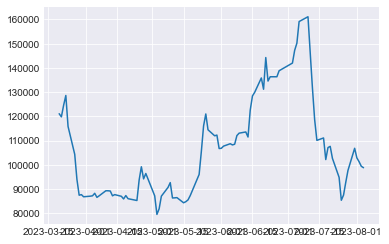

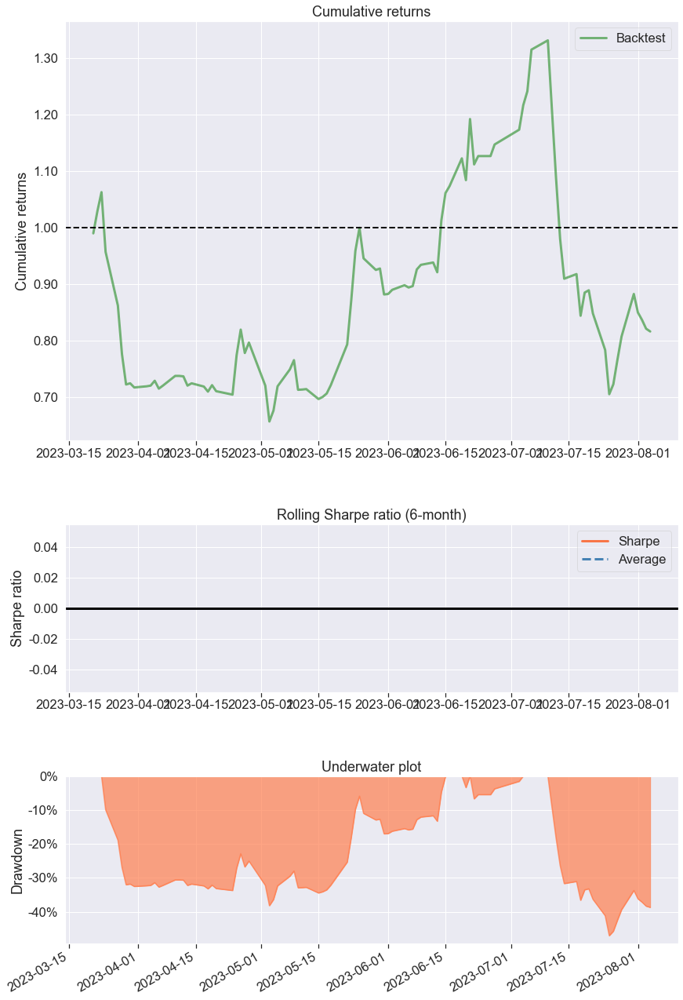

In [ ]:
'''
UTILITY U=002 : MY MANUAL PORTFOLIO_CALCULATOR (li. ==> mypf.)
--------------------------------------------
- READS column of individual assets
- CALCULATES the portfolio value as `li[Portfolio]` appended to df `li`
- CALCULATES daily log returns for every column of li and writes to `rets`
- CALCULATES daily PF Index and writes to `li[Portfolio_Index] and normal daily returns and writes to `li[PF_Returns]`
- PRINTS the tear sheet of varios statistics
'''
import matplotlib.pyplot as plt
import pyfolio as pf
import numpy as np

totals = []
ADD = 0
for i in np.arange(0,count):
    if names[i] == "GC=F":
        ADD +=  mypf[f"{names[i]}"] * mypf["TRY=X"] * Portfolio_Shares[i]
    else:
        ADD +=  mypf[f"{names[i]}"] * Portfolio_Shares[i]
        totals.append(mypf[f"{names[i]}"] * Portfolio_Shares[i])

ADD += Cash_Plus_MFs # FONLARI EKLEDIK
#li = pd.concat([li, ADD], axis=1, ignore_index=False)
mypf['My Portfolio'] = ADD
print(f"Stocks selected = {names}")
print(f"Number of stocks selected = {len(names)}")



# for file in li.columns:
#     a = np.log(li[f"{file}"] / (li[f"{file}"].shift(1)))
#     rets[f"{file}"]= a

for file in mypf.columns:
    a = np.log(mypf[f"{file}"] / (mypf[f"{file}"].shift(1)))
    rets[f"{file}"]= a

print(" My Portfolio", mypf.round(2).tail(195))

print(" Returns", rets.round(5).tail(195))

plt.plot(mypf['My Portfolio'])

# li['Portfolio'] = ADD # cash added
mypf['Index'] = mypf['My Portfolio'] / mypf['My Portfolio'].iloc[0]
mypf['PF_Returns'] = ((mypf['My Portfolio']-mypf['My Portfolio'].shift(1)) / mypf['My Portfolio'].shift(1)).fillna(method="ffill").round(6)


print(f"\n======= PF Weights======================")
print(f"********* PORTFOLIO TEARSHEET *************** ")
pf.create_simple_tear_sheet(mypf['PF_Returns'].dropna())
#pf.create_returns_tear_sheet(li['PF_Returns'].dropna())
print("********* end of TEARSHEET **************\n")
mypf.index = pd.DatetimeIndex(mypf.index)



### ALPHA BETA CALCULATIONS FOR MYPF.csv <a name="alphabeta"></a>

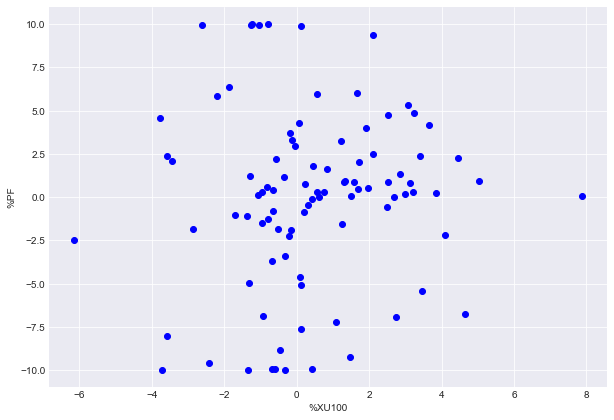

BETA = %XU100   0.170
dtype: float64


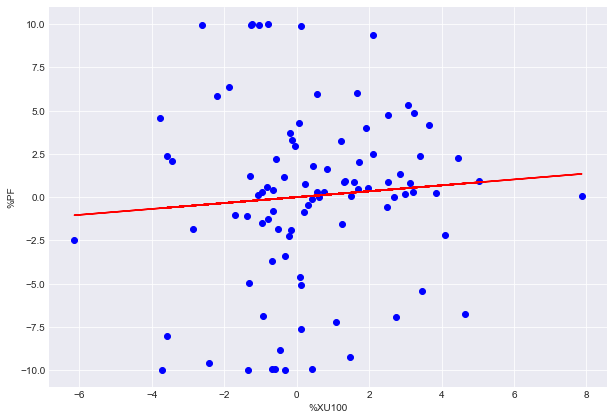

        2023-03-21  2023-03-22  2023-03-23  2023-03-24  2023-03-27  \
%XU100      -1.385       1.926       1.218      -0.593      -0.680   
%PF         -1.065       3.974       3.264      -9.946      -9.932   

        2023-03-28  2023-03-29  2023-03-30  2023-03-31  2023-04-03  ...  \
%XU100      -3.728       2.737      -0.953      -1.699       0.553  ...   
%PF         -9.981      -6.917       0.284      -1.018       0.286  ...   

        2023-07-24  2023-07-25  2023-07-26  2023-07-27  2023-07-28  \
%XU100       0.109      -1.346       2.103       1.664       3.080   
%PF         -7.633      -9.990       2.499       6.009       5.348   

        2023-07-31  2023-08-01  2023-08-02  2023-08-03  2023-08-04  
%XU100       2.118      -0.672       1.255      -0.510       2.480  
%PF          9.340      -3.714      -1.543      -1.861      -0.599  

[2 rows x 93 columns]


In [ ]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
%matplotlib inline
import pandas as pd

import warnings
warnings.simplefilter("ignore")

from data import get_stock_data

start_date = T1_START
end_date = T1_END

data = pd.DataFrame()
data['XU100'] = mypf.XU100
data['PORTFOLIO'] = mypf['My Portfolio']

data

data_pc = data.pct_change().dropna()*100
data_pc.columns = (["%XU100", "%PF"])
data_pc.tail(30)
plt.figure(figsize=(10,7))
plt.scatter(data_pc["%XU100"], data_pc["%PF"],color='b')
plt.ylabel("%PF")
plt.xlabel("%XU100")
plt.show()
import statsmodels.api as sm
model = sm.OLS( data_pc["%PF"], data_pc["%XU100"])
line = model.fit()
beta = line.params[0]
print("BETA =", line.params)
#print(line.t_test([1]))
plt.figure(figsize=(10,7))
plt.scatter(data_pc['%XU100'], data_pc['%PF'],color='b')
x = data_pc['%XU100']
y = data_pc['%PF']
plt.plot(x, beta*x, color='r')
plt.ylabel('%PF')
plt.xlabel('%XU100')
plt.show()
m_x = x.mean()
m_y = y.mean()
s_x = x.std()
s_y = y.std()

Mean = pd.DataFrame([m_x,m_y])
StDev = pd.DataFrame([s_x,s_y])

# print(Mean.T)
# print(StDev.T)

# Zscore calc
# z_x = (x - m_x) / s_x
# print(z_x)
# z_y = (y - m_y) / s_y
# print(z_y)

Z = pd.DataFrame([x,y])
print(Z)

r_xy = data_pc.corr()

r_xy
r_xy.iloc[1,0]
#beta = r_xy.iloc[1,0] * s_y / s_x
alpha = m_y - beta * m_x

MYPF['Alpha'] = alpha
MYPF['Beta'] = beta

In [ ]:
beta

0.17044917712385552

In [ ]:
alpha

-0.16574033035168412

In [ ]:
data[-17:]

,XU100,PORTFOLIO
2023-07-13,"6,368.400","118,595.424"
2023-07-14,"6,437.700","110,067.664"
2023-07-17,"6,600.500","111,059.266"
2023-07-18,"6,365.000","102,134.864"
2023-07-19,"6,571.300","107,092.866"
2023-07-20,"6,682.100","107,588.667"
2023-07-21,"6,687.800","102,630.667"
2023-07-24,"6,695.100","94,797.027"
2023-07-25,"6,605.000","85,327.246"
2023-07-26,"6,743.900","87,459.187"


In [ ]:
os.chdir(out)
# Move last 4 columns to first

temp_cols=mypf.columns.tolist()
new_cols=temp_cols[-4:] + temp_cols[:-4]
mypf=mypf[new_cols]
print(mypf)

               XU100  My Portfolio  Index  PF_Returns  CANTE
2023-03-20 4,975.500   121,074.410  1.000         NaN 24.420
2023-03-21 4,906.600   119,785.329  0.989      -0.011 24.160
2023-03-22 5,001.100   124,545.010  1.029       0.040 25.120
2023-03-23 5,062.000   128,610.571  1.062       0.033 25.940
2023-03-24 5,032.000   115,818.930  0.957      -0.099 23.360
...              ...           ...    ...         ...    ...
2023-07-31 7,217.000   106,795.392  0.882       0.093 21.540
2023-08-01 7,168.500   102,828.992  0.849      -0.037 20.740
2023-08-02 7,258.500   101,242.433  0.836      -0.015 20.420
2023-08-03 7,221.500    99,358.392  0.821      -0.019 20.040
2023-08-04 7,400.600    98,763.434  0.816      -0.006 19.920

[94 rows x 5 columns]


In [ ]:

mypf['Index'] = mypf['My Portfolio'] / mypf['My Portfolio'].iloc[0]
mypf['PF_Returns'] = ((mypf['My Portfolio']-mypf['My Portfolio'].shift(1)) / mypf['My Portfolio'].shift(1)).fillna(method="ffill").round(6)
MDD = (1.0-mypf['My Portfolio']/mypf['My Portfolio'].cummax()).max()
mypf['Max Drawdown'] = MDD

pystats_df = pf.timeseries.perf_stats(mypf['PF_Returns'])




In [ ]:
filename = "DashBoard_MyPF.xlsx"
MYPF['Filename'] = filename_statement
with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
#    df = pd.DataFrame(Current_PF)
#    df.to_excel(writer, sheet_name='Mevcut PF')
    df = pd.DataFrame(mypf)
    df.to_excel(writer, sheet_name='MYPF Close')
#    mypf.to_excel(writer, sheet_name='My PF')
    pystats_df.to_excel(writer, sheet_name = 'MYPF STATS')
    MYPF.to_excel(writer, sheet_name = 'MYPF')



CHATGPT: Act like an accountant who knows Python and works for Markov Markowitz company. Write a python code that takes inputs: Account Name, Account No, Entry PF value, Entry Date, Last Date,	Total Workdays,	Latest PF Value,	Total % Return, Average Daily % return,	PF Revenue, PF Comission and generates the excel worksheet form that will be used as a proforma invoice. Columns widths on the excel worksheet should be 20. Date cells should be in short date format. PF cells should be in Turkish currency format. % cells should be in percentage format. All cells should be right aligned. Leave an empty row at beginning of the excel file. The bitmap at the root directory named MARKOVMAR5.1.jpg should be added to the worksheet at the start of F column. Add graphics at C16 so that y-axis values are between B16 and B114 and x-axis values are between A16 to A114. Cells from A16 to A114 should be in short date format. Cells from B16 to B114 should be in Turkish currency format.

In [ ]:
import openpyxl
from PIL import Image

def Proforma_Invoice(Cash, Account_No, Entry_PF_Value, Entry_Date, Last_Date,
                     Total_Workdays, Latest_PF_Value, Total_Percent_Return,
                     Average_Daily_Percent_Return, PF_Revenue, PF_Commission, data, shortdate):

    wb = openpyxl.load_workbook('proforma_invoice_TEMPLATE.xlsx')
    ws = wb.active

    ws['A2'] = 'Account Name'
    ws['B2'] = Account_Name
    ws['A3'] = 'Account No'
    ws['B3'] = Account_No
    ws['A4'] = 'Entry PF Value'
    ws['B4'] = Entry_PF_Value
    ws['A5'] = 'Entry Date'
    ws['B5'] = Entry_Date
    ws['A6'] = 'Last Date'
    ws['B6'] = Last_Date
    ws['A7'] = 'Total Workdays'
    ws['B7'] = Total_Workdays
    ws['A8'] = 'Latest PF Value'
    ws['B8'] = Latest_PF_Value + Cash
    ws['A9'] = 'Total % Return'
    ws['B9'] = Total_Percent_Return
    ws['A10'] = 'Average Daily % return'
    ws['B10'] = Average_Daily_Percent_Return
    ws['A11'] = 'PF Revenue'
    ws['B11'] = PF_Revenue
    ws['A12'] = 'PF Commission'
    ws['B12'] = PF_Commission
    ws['A15'] = 'Date'
    ws['B15'] = 'Portfolio Daily Value'

    # Set coumn widths
    ws.column_dimensions['A'].width = 20
    ws.column_dimensions['B'].width = 20

    # Set date cells to short date format
    date_cells = ['B5', 'B6']
    for cell in date_cells:
        ws[cell].number_format = 'DD/MM/YYYY'

    # Set PF cells to Turkish currency format
    pf_cells = ['B4', 'B8', 'B11', 'B12']
    for cell in pf_cells:
        ws[cell].number_format = '\₺#,##0.00'

    # Set % cells to percentage format
    percent_cells = ['B9', 'B10']
    for cell in percent_cells:
        ws[cell].number_format = '0.00%'

    # Right align all cells
    for cell in ws['A2:B12']:
        for c in cell:
            c.alignment = openpyxl.styles.Alignment(horizontal='right')

    # Insert image
    img = openpyxl.drawing.image.Image('../MARKOVMAR5.1.png')
    ws.add_image(img, 'D1')


    # Insert data and dates
    for i in range(0,Total_Workdays):
        ws[f"B{i+16}"] = data.iloc[i]

    for i in range(0,Total_Workdays):
        ws[f"A{i+16}"] = shortdate[i]

    # Add graphics at C16
    chart = openpyxl.chart.LineChart()
    chart.title = f"{Account_No} Portfolio Performance"
    chart.style = 13
    chart.y_axis.title = 'PF Value'
    chart.x_axis.title = 'Date'
    # Set y-axis values between B16 and B114
    data = openpyxl.chart.Reference(ws, min_col=2, min_row=16, max_row=16 + Total_Workdays + 1)
    chart.add_data(data, titles_from_data=True)

    # Set x-axis values between A16 to A114
    dates = openpyxl.chart.Reference(ws, min_col=1, min_row=16, max_row=16 + Total_Workdays + 1)
    chart.set_categories(dates)

    # chart.y_axis.majorGridlines = openpyxl.chart.gridlines.Crosses(isAutomatic=True)
    # chart.x_axis.majorGridlines = openpyxl.chart.gridlines.Crosses(isAutomatic=True)

    ws.add_chart(chart, "D16")

    for row in range(16, 115):
        ws['B' + str(row)].number_format = '\₺#,##0.00'

    wb.save(f"Proforma_Invoice_{Account_No}.xlsx")

    return ws

In [ ]:
data

,XU100,PORTFOLIO
2023-03-20,"4,975.500","121,074.410"
2023-03-21,"4,906.600","119,785.329"
2023-03-22,"5,001.100","124,545.010"
2023-03-23,"5,062.000","128,610.571"
2023-03-24,"5,032.000","115,818.930"
...,...,...
2023-07-31,"7,217.000","106,795.392"
2023-08-01,"7,168.500","102,828.992"
2023-08-02,"7,258.500","101,242.433"
2023-08-03,"7,221.500","99,358.392"


### CREATE REPORT FOR PROFORMA INVOICE (BORA) <a name="bora_invoice"></a>

In [ ]:
import openpyxl

Account_Name = "Bora Dikmen"
Account_No = 921685
Total_Workdays =  6
Entry_PF_Value = data.PORTFOLIO[-Total_Workdays]
Entry_Date = "26/12/2022"
Last_Date = "30/12/2022"
Cash = 1500.53
Latest_PF_Value = data.PORTFOLIO[-1] + Cash
PF_Revenue = Latest_PF_Value - Entry_PF_Value
Total_Percent_Return = PF_Revenue / Entry_PF_Value
Average_Daily_Percent_Return = Total_Percent_Return / Total_Workdays
PF_Commission= PF_Revenue / 10


In [ ]:
proforma = Proforma_Invoice(Cash, Account_No, Entry_PF_Value, Entry_Date, Last_Date, Total_Workdays, Latest_PF_Value,
                            Total_Percent_Return, Average_Daily_Percent_Return, PF_Revenue, PF_Commission,
                            data.PORTFOLIO[-Total_Workdays:], data.index[-Total_Workdays:] )

### CREATE REPORT FOR PROFORMA INVOICE (COŞKUN) <a name="coskun_invoice"></a>

In [ ]:
Account_Name = "Coşkun Erşahin"
Account_No = 922162
Entry_PF_Value = 170000
Entry_Date = "09/12/2022"
Last_Date = "10/01/2023"
Total_Workdays =  10
Cash = -18.37
Latest_PF_Value = data.PORTFOLIO[-1] + Cash
PF_Revenue = Latest_PF_Value - Entry_PF_Value
Total_Percent_Return = PF_Revenue / Entry_PF_Value
Average_Daily_Percent_Return = Total_Percent_Return / Total_Workdays
PF_Commission= PF_Revenue / 20


In [ ]:
proforma = Proforma_Invoice(Cash, Account_No, Entry_PF_Value, Entry_Date, Last_Date, Total_Workdays, Latest_PF_Value, Total_Percent_Return,
                            Average_Daily_Percent_Return, PF_Revenue, PF_Commission, data.PORTFOLIO[-Total_Workdays:], data.index[-Total_Workdays:] )

### CREATE REPORT FOR PROFORMA INVOICE (MURAT)<a name="murat_invoice"></a>

In [ ]:
Account_Name = "Murat Özbayoğlu"
Account_No = 920302
Entry_PF_Value = 75000
Entry_Date = "16/12/2022"
Last_Date = "01/01/2023"
Total_Workdays =  12
Cash = 83.89
Latest_PF_Value = data.PORTFOLIO[-1] + Cash
PF_Revenue = Latest_PF_Value - Entry_PF_Value
Total_Percent_Return = PF_Revenue / Entry_PF_Value
Average_Daily_Percent_Return = Total_Percent_Return / Total_Workdays
PF_Commission= PF_Revenue / 10


In [ ]:
proforma = Proforma_Invoice(Cash, Account_No, Entry_PF_Value, Entry_Date, Last_Date, Total_Workdays, Latest_PF_Value, Total_Percent_Return,
                            Average_Daily_Percent_Return, PF_Revenue, PF_Commission, data.PORTFOLIO[-Total_Workdays:], data.index[-Total_Workdays:] )

### CREATE REPORT FOR PROFORMA INVOICE (ALPER)<a name="alper_invoice"></a>

In [ ]:
Account_Name = "Alper Ülkü"
Account_No = 9098005
Total_Workdays = 3
Entry_PF_Value = data.PORTFOLIO[-Total_Workdays]
Entry_Date = "29/12/2022"
Last_Date = "02/01/2023"
Cash = 1402

Latest_PF_Value = data.PORTFOLIO[-1] + Cash
PF_Revenue = Latest_PF_Value - Entry_PF_Value
Total_Percent_Return = PF_Revenue / Entry_PF_Value
Average_Daily_Percent_Return = Total_Percent_Return / Total_Workdays
PF_Commission= PF_Revenue


In [ ]:
proforma = Proforma_Invoice(Cash, Account_No, Entry_PF_Value, Entry_Date, Last_Date, Total_Workdays, Latest_PF_Value, Total_Percent_Return,
                            Average_Daily_Percent_Return, PF_Revenue, PF_Commission, data.PORTFOLIO[-Total_Workdays:], data.index[-Total_Workdays:] )

### Send Ideal PF by Gmail  <a name="send_gmail"></a>

In [ ]:
# '''

# UTILITY U=019 : SEND_EMAIL_THRU_GMAIL
# --------------------------------------------
# - SETS variables for mail server
# - SETS database to be emailed
# - SETS filename to be attached
# - CHANGES directory for writing the excel file
# - FORMS the excel file
# - SETS params for mail and its content with smtp lib
# - ATTACHES file with mimetypes
# - SENDS mail to my own gmail address with ssl library

# '''

# gmail_pass = "rgszqketyguqkivb"  #uwyuympejcjvaikg
# user = "alperulku1970@gmail.com"
# subscribers = "alperulku1970@gmail.com"
# SERVER_ADDRESS = "smtp.gmail.com"
# SERVER_PORT = 587

# #now = datetime.now()
# Final_TEFAS_PF['Max Drawdown %'] = np.round(MaxDrawdown, 4)
# IDEALPF['Max Drawdown'] = np.round(MaxDrawdown, 4)
# Final_TEFAS_PF.to_csv(filename_statement + ".csv")
# filename = filename_statement + ".xlsx"
# shopping_list_file = 'ShoppingList.csv'
# os.chdir(out)




# # with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
# #     #Final_TEFAS_PF.to_excel(writer, sheet_name = 'Yeni Portföy')
# #     #df = pd.DataFrame(Kurallar)
# #     #df.to_excel(writer, sheet_name='Kurallar')
# #     df = pd.DataFrame(Performance)
# #     df.to_excel(writer, sheet_name='İdeal PF Performans')
# #     df = pd.DataFrame(Current_PF)
# #     df.to_excel(writer, sheet_name='Mevcut PF')
# #     IDEALPF.to_excel(writer, sheet_name = 'Ideal PF')
# #     if FW_TEST_PERIOD !=0:
# #         ShoppingList.to_excel(writer, sheet_name='Fark Alış-Satış Listesi')


# with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
#     #Final_TEFAS_PF.to_excel(writer, sheet_name = 'Yeni Portföy')
#     #df = pd.DataFrame(Kurallar)
#     #df.to_excel(writer, sheet_name='Kurallar')
#     df = pd.DataFrame(Performance)
#     df.to_excel(writer, sheet_name='İdeal PF Performans')
#     df = pd.DataFrame(Current_PF)
#     df.to_excel(writer, sheet_name='Mevcut PF')
#     IDEALPF.to_excel(writer, sheet_name = 'Ideal PF')
#     Final_TEFAS_PF.to_excel(writer, sheet_name = 'YF_Ideal PF')
#     if FW_TEST_PERIOD !=0:
#         ShoppingList.to_excel(writer, sheet_name='Fark Alış-Satış Listesi')


#     # worksheet = writer.sheets['Ideal PF']
#     # worksheet.insert_image('C2','RR_Plot_BIST.png')
#     # writer.save()



# import smtplib
# from email.message import EmailMessage

# msg = EmailMessage()

# msg['Subject'] = filename
# msg['From'] = user
# msg['To'] = subscribers

# text = f"Merhaba, bugünün {exchange} piyasası için en iyi Sharpe Oranı'na sahip Portföyü ektedir: {filename} \r\n"
# text+= f"Forward Test süresi = {FW_TEST_PERIOD} gün \r\n"
# text+= f"Backtest Test süresi = {BACKTEST_PERIOD} gün \r\n"
# text+= "Markov Markowitz, Çankaya, Ankara, Türkiye.\r\n"
# text+= "Her hakkı saklıdır. @ Markov Markowitz 2022."

# msg.set_content(text)

# import mimetypes

# #path = f"/Users/alperulku/Desktop/Masaüstü - Alper’s Mac mini/MY BEST PORTFOLIOS/{filename}"
# path = out + "/" + filename

# # Guess the content type based on the file's extension.
# ctype, encoding = mimetypes.guess_type(path)
# if ctype is None or encoding is not None:
#     ctype = 'application/octet-stream'
# maintype, subtype = ctype.split('/', 1)

# with open(path, 'rb') as fp:
#     msg.add_attachment(fp.read(), maintype=maintype, subtype=subtype,
#                        filename=filename)

# path = out + "/" + "YF_IDEAL.csv"
# with open(path, 'rb') as fp:
#     msg.add_attachment(fp.read(), maintype=maintype, subtype=subtype,
#                        filename="YF_IDEAL.csv")


# path = out + "/" + "MPT_v547_PROFORMA_OK.pdf"
# with open(path, 'rb') as fp:
#     msg.add_attachment(fp.read(), maintype=maintype, subtype=subtype,
#                        filename="MPT_v547_PROFORMA_OK.pdf")



# import ssl

# # Create a SSLContext object with default settings.
# context = ssl.create_default_context()

# with smtplib.SMTP(SERVER_ADDRESS, SERVER_PORT) as smtp:
#     smtp.ehlo()  # Say EHLO to server
#     smtp.starttls(context=context)  # Puts the connection in TLS mode.
#     smtp.ehlo()
#     smtp.login(user, gmail_pass)
#     smtp.send_message(msg)  # Auto detects the sender and recipient from header

# print("mail sent with success with attachment")

## NOW APPLICATION OF WQU LESSONS ONWARDS

In [ ]:
# Load libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
from scipy.stats import kurtosis, skewnorm

plt.rcParams["figure.figsize"] = (16, 9)  # Figure size and width

-0.169741847123419

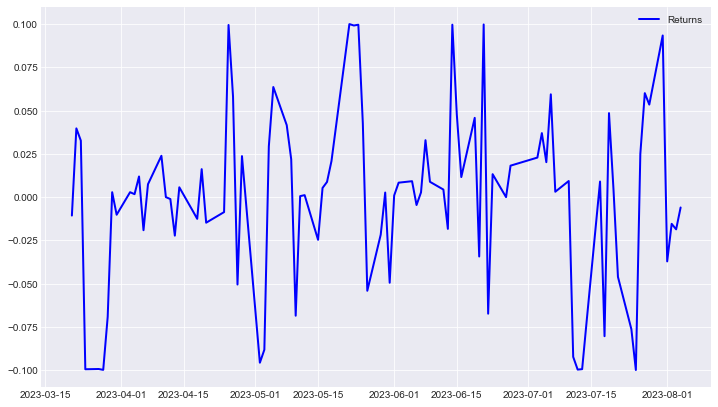

In [ ]:
# Three distributions with different tail shapes
x = np.arange(0,len(mypf['PF_Returns']))

# Plot each distribution
plt.figure(figsize=(12, 7))

plt.plot(mypf['PF_Returns'], lw=2, c="b", label="Returns")
plt.legend()


# plt.hist(mypf['PF_Returns'], bins=30, label="PDF", density=True, alpha=1)  # Histogram
# plt.show()
mypf['PF_Returns'].skew()

In [ ]:
mypf['PF_Returns'].mean()

-0.0008856344086021492

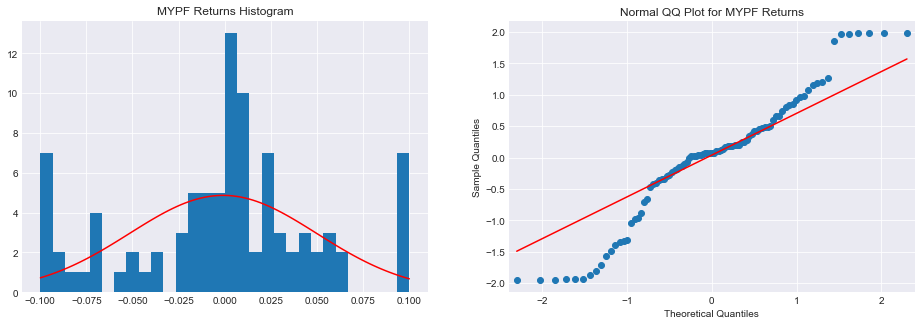

In [ ]:
# Histogram and Normal QQ Plot for Google Stock Returns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
mypf_returns = mypf['PF_Returns'].dropna()

# Histogram with density
x = np.linspace(min(mypf_returns), max(mypf_returns), len(mypf_returns))
(mu, sigma) = stats.norm.fit(mypf_returns)
values, bins, _ = ax1.hist(mypf_returns, bins=30)  # Histogram
ax1.plot(x, stats.norm.pdf(x, mu, sigma) * sum(values * np.diff(bins)), "r")  # Density
ax1.set(title="MYPF Returns Histogram")

# Normal QQ plot
sm.qqplot(mypf_returns, stats.norm, fit=True, line="q", ax=ax2)
ax2.set(title="Normal QQ Plot for MYPF Returns")
plt.show()

### SHAPIRO-WILK test for NORMALITY<a name="shapiro"></a>

In [ ]:
# Shapiro Wilk normality test
shapiro_test = stats.shapiro(mypf_returns)
# print(
#     "Shapiro W: {0} \nShapiro p-value {1}".format(
#         shapiro_test.statistic, shapiro_test.pvalue
#     )
# )

if shapiro_test.pvalue > 0.05:
    print("Distribution is Normal by %", 100*shapiro_test.statistic)
else:
    print("Distribution is Non-Normal")
print(f"skew = {mypf_returns.skew()}")

Distribution is Non-Normal
skew = -0.16974184712341897


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from arch.univariate import ARCH, ConstantMean, Normal
from scipy import stats

plt.rcParams["figure.figsize"] = (16, 9)  # Figure size and width
#ARCH(1) Simulation n=1000, alpha_0=5 and alpha_1=0.5

# simulated process parameters
rs = np.random.RandomState([12345, 77777])

dist = Normal(seed=rs)
vol = ARCH(p=1)
repro_mod = ConstantMean(None, volatility=vol, distribution=dist)


params = pd.Series({"mu": 0.0, "omega": 5, "alpha[1]": 0.5, "beta[1]": 0.0})

# model simulation
arch1_sim = repro_mod.simulate(params, nobs=1000)
params

mu         0.000
omega      5.000
alpha[1]   0.500
beta[1]    0.000
dtype: float64

### ACF and PACF tests for Stationarity<a name="acf_pacf"></a>

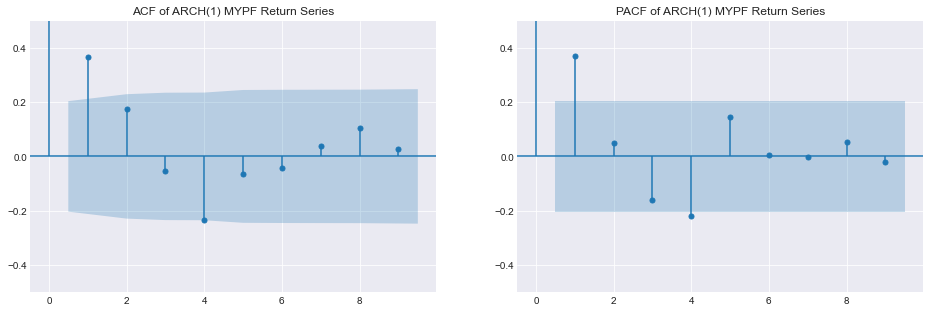

In [ ]:
# ACF and PACF of ARCH(1) Simulated Time Series
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
sm.graphics.tsa.plot_acf(mypf_returns, lags=9, ax=ax1)
ax1.set(title="ACF of ARCH(1) MYPF Return Series")
ax1.set_ylim([-0.5, 0.5])

sm.graphics.tsa.plot_pacf(mypf_returns, lags=9, ax=ax2)
ax2.set(title="PACF of ARCH(1) MYPF Return Series")
ax2.set_ylim([-0.5, 0.5])
plt.show()

In [ ]:
mypf_returns.tail(20)

2023-07-10    0.009
2023-07-11   -0.092
2023-07-12   -0.100
2023-07-13   -0.099
2023-07-14   -0.072
2023-07-17    0.009
2023-07-18   -0.080
2023-07-19    0.049
2023-07-20    0.005
2023-07-21   -0.046
2023-07-24   -0.076
2023-07-25   -0.100
2023-07-26    0.025
2023-07-27    0.060
2023-07-28    0.053
2023-07-31    0.093
2023-08-01   -0.037
2023-08-02   -0.015
2023-08-03   -0.019
2023-08-04   -0.006
Name: PF_Returns, dtype: float64

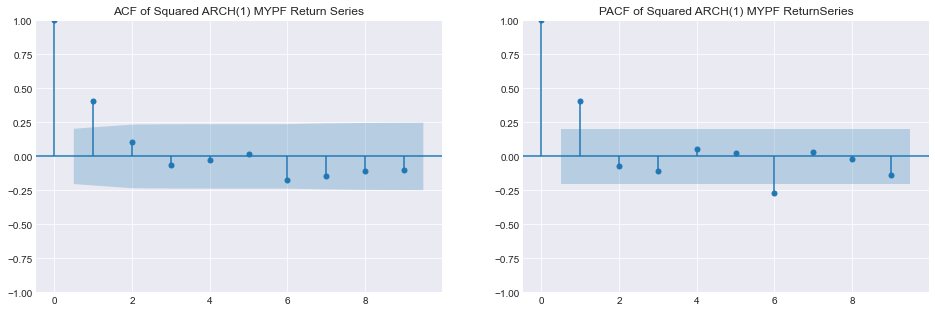

In [ ]:
# ACF and PACF of Squared ARCH(1) Simulated Time Series
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
sm.graphics.tsa.plot_acf(mypf_returns ** 2, lags=9, ax=ax1)
ax1.set(title="ACF of Squared ARCH(1) MYPF Return Series")
ax1.set_ylim([-1, 1])

sm.graphics.tsa.plot_pacf(mypf_returns ** 2, lags=9, ax=ax2)
ax2.set(title="PACF of Squared ARCH(1) MYPF ReturnSeries")
ax2.set_ylim([-1, 1])
plt.show()

### TREND DETECTION AND BUY-SELL SIGNAL GENERATION FOR MYPF <a name="trend_detect"></a>

<AxesSubplot:title={'center':'Portfolio Percentage change'}>

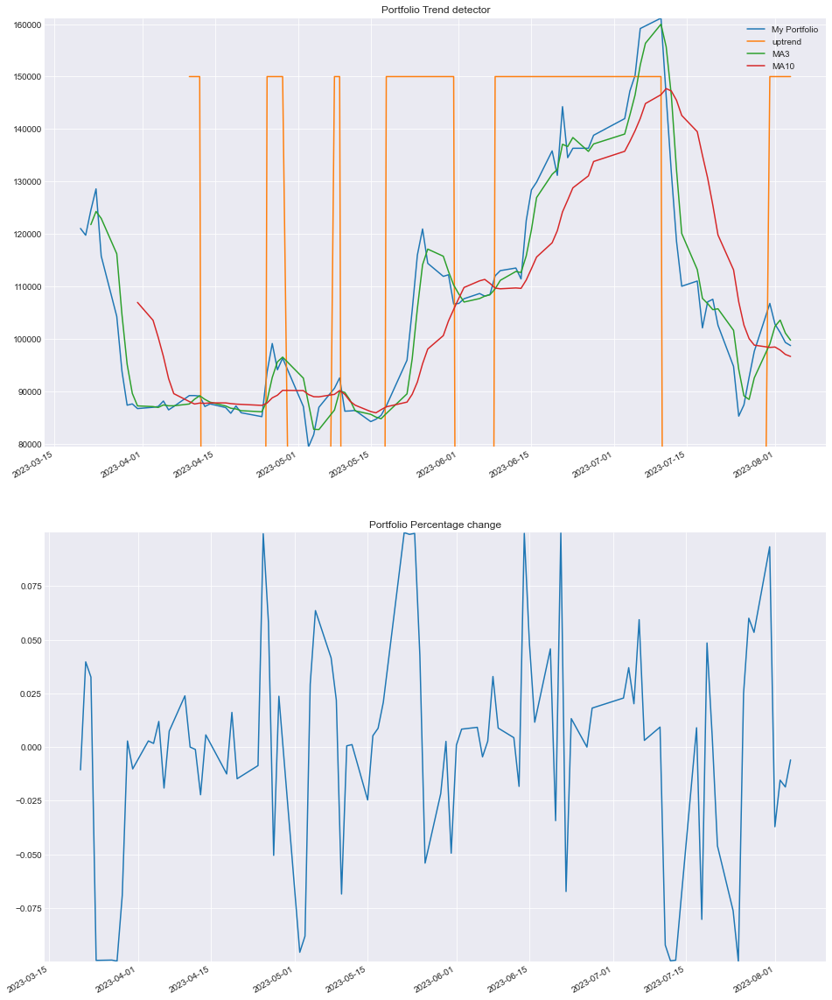

In [ ]:
#TREND DETECTION AND TREND SIGNAL GENERATION FOR MOST VOLATILE ASSET (MVA)

SM = 3
LM = 10

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 22))


mypf['Pct_change'] = mypf['My Portfolio'].pct_change()
# mypf[f'Skew{SM}'] = mypf['Pct_change'].rolling(window=SM).skew()
# mypf[f'Skew{LM}'] = mypf['Pct_change'].rolling(window=LM).skew()
mypf[f'MA{SM}'] = mypf['My Portfolio'].rolling(window=SM).mean()
mypf[f'MA{LM}'] = mypf['My Portfolio'].rolling(window=LM).mean()

mypf['My_PF_lag']   = mypf['My Portfolio'].shift(1)
mypf[f'lag_MA{SM}'] = mypf[f'MA{SM}'].shift(1)
mypf[f'lag_MA{LM}'] = mypf[f'MA{LM}'].shift(1)

buy_mask =    (mypf['My Portfolio'] > mypf[f'MA{LM}'])     & \
              (mypf['My_PF_lag']    < mypf[f'lag_MA{LM}'])

# buy_mask =    ( mypf[f'MA{SM}']       > mypf[f'MA{LM}'])     & \
#               ( mypf[f'lag_MA{SM}']   < mypf[f'lag_MA{LM}'])

sell_mask =   (mypf['My Portfolio'] < mypf[f'MA{LM}'])     & \
              (mypf['My_PF_lag']    > mypf[f'lag_MA{LM}'])


# sell_mask =   ( mypf[f'MA{SM}']       < mypf[f'MA{LM}'])     & \
#               ( mypf[f'lag_MA{SM}']   > mypf[f'lag_MA{LM}'])

mypf['uptrend'] = np.nan
mypf.loc[buy_mask,'uptrend'] = +1
mypf.loc[sell_mask,'uptrend'] = -1
mypf.uptrend = mypf.uptrend.fillna(method="ffill") * 150000

ax1.set(title="Portfolio Trend detector")
ax1.set_ylim([np.min(mypf['My Portfolio']), np.max(mypf['My Portfolio'])])
mypf[['My Portfolio','uptrend',f'MA{SM}', f'MA{LM}']].plot(ax=ax1)

# ax2.set(title="Return Skewness with moving windows")
# ax2.set_ylim([np.min(mypf[f'Skew{LM}']), np.max(mypf[f'Skew{LM}'])])
# mypf[[f'Skew{SM}',f'Skew{LM}']].plot(figsize = (16,22), ax=ax2, grid=True)

# ax2.set(title="BUY-SELL SIGNAL FOR CANTE.IS ASSET")
# ax2.set_ylim([-1,1])
# mypf.signal.plot( ax=ax2)

ax2.set(title="Portfolio Percentage change")
ax2.set_ylim([np.min(mypf['Pct_change']), np.max(mypf['Pct_change'])])
mypf['Pct_change'].plot(figsize = (16,22), ax=ax2, grid=True)




### TIME SERIES STATISTICAL MODELS <a name="time_series"></a>

In [ ]:
# Load libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.arima_process import arma_generate_sample

plt.rcParams["figure.figsize"] = (16, 9)  # Figure size and width
# Detrend
timeTrend = np.linspace(1, len(mypf['My Portfolio']), len(mypf['My Portfolio']))
timeTrend = sm.add_constant(timeTrend)

# Fit OLS
model = sm.OLS(mypf['My Portfolio'], timeTrend)
fit_g = model.fit()
fit_g.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           My Portfolio   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     19.99
Date:                Sun, 06 Aug 2023   Prob (F-statistic):           2.22e-05
Time:                        08:08:11   Log-Likelihood:                -1057.8
No. Observations:                  94   AIC:                             2120.
Df Residuals:                      92   BIC:                             2125.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       9.135e+04   3921.021     23.298      0.000    8.36e+04    9.91e+04
x1           320.4680     71.677      4.471      0.000     178.111     462.825
==============================================================================
Omnibus:                        7.836   Durbin-Watson:                   0.093
Prob(Omnibus):                  0.020   Jarque-Bera (JB):                8.236
Skew:                           0.700   Prob(JB):                       0.0163
Kurtosis:                       2.622   Cond. No.                         110.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
# # Plot residuals
# mypf_res = fit_g.resid
# mypf_res.plot(linewidth=1.3, xlabel="Year", ylabel="Residuals")
# plt.show()

In [ ]:
# # Plot First Difference of Google Stock Price
# mypf['My Portfolio'].diff().plot(
#     linewidth=1.3, xlabel="Year", ylabel="First difference of My Portfolio value")
# plt.show()




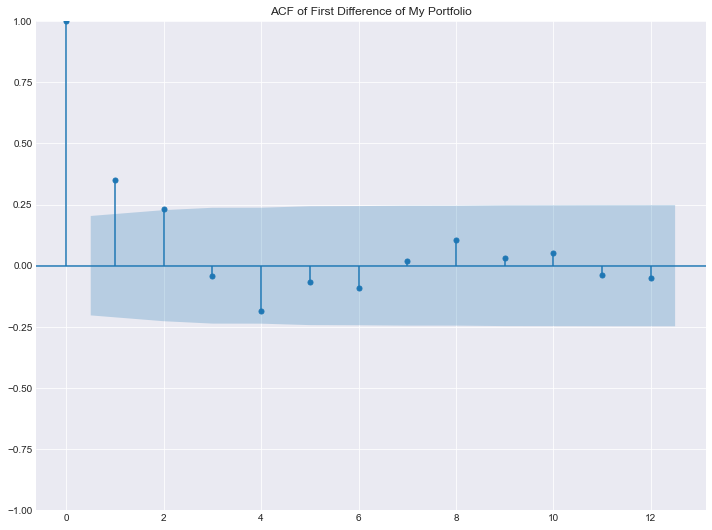

In [ ]:
# ACF of First Difference of Google Stock Price
# (Note: [1:] as we need to skip first element since the model lost one data point)
fig, ax = plt.subplots(figsize=(12, 9))
sm.graphics.tsa.plot_acf(
    mypf['My Portfolio'].diff()[1:],
    title="ACF of First Difference of My Portfolio",
    lags=12,
    ax=ax,
)
plt.show()

In [ ]:
# # Normal white noise ts example
# plt.plot(np.random.normal(0, 3, 300))
# plt.title("Normal White Noise with Mean=0 and Variance=9")
# plt.show()

const       106,577.579
ma.L1             1.401
ma.L2             1.825
ma.L3             1.889
ma.L4             1.794
ma.L5             1.634
ma.L6             1.050
ma.L7             0.501
ma.L8             0.131
ma.L9            -0.319
ma.L10           -0.223
sigma2   25,199,864.047
dtype: float64


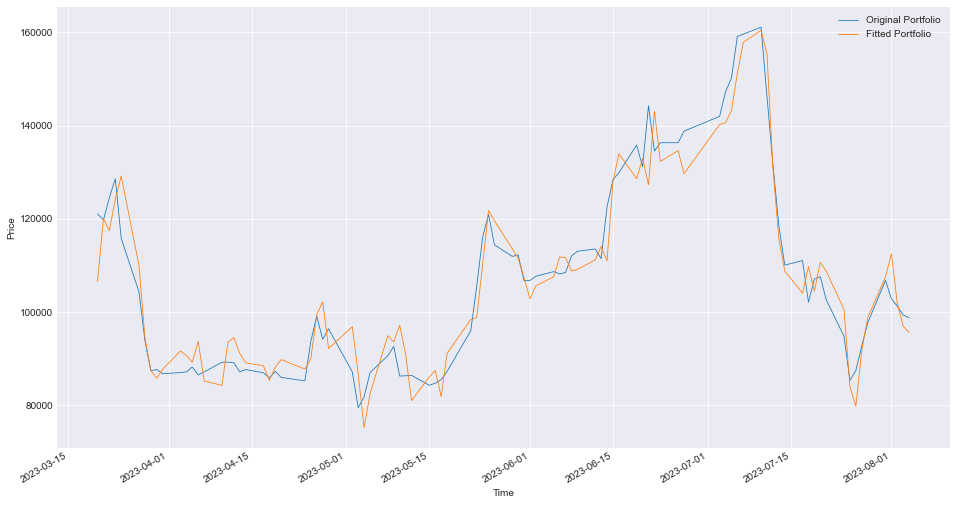

In [ ]:
# MA(1) for Google stock
mypf_ma1 = statsmodels.tsa.arima.model.ARIMA(mypf['My Portfolio'], order=(0, 0, 10)).fit()
print(mypf_ma1.params)
#Plot Google vs fitted Google stock prices
mypf_ma1_res = mypf_ma1.resid
mypf_ma1_fit = mypf['My Portfolio'] - mypf_ma1_res

mypf['My Portfolio'].plot(linewidth=0.8, label="Original Portfolio")
mypf_ma1_fit.plot(linewidth=0.8, label="Fitted Portfolio")
plt.xlabel("Time")
plt.ylabel("Price")
plt.legend()
plt.show()

### AUTOREGRESSIVE MODEL OPS <a name="autoregressive"></a>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

plt.rcParams["figure.figsize"] = (16, 9)  # Figure size and width

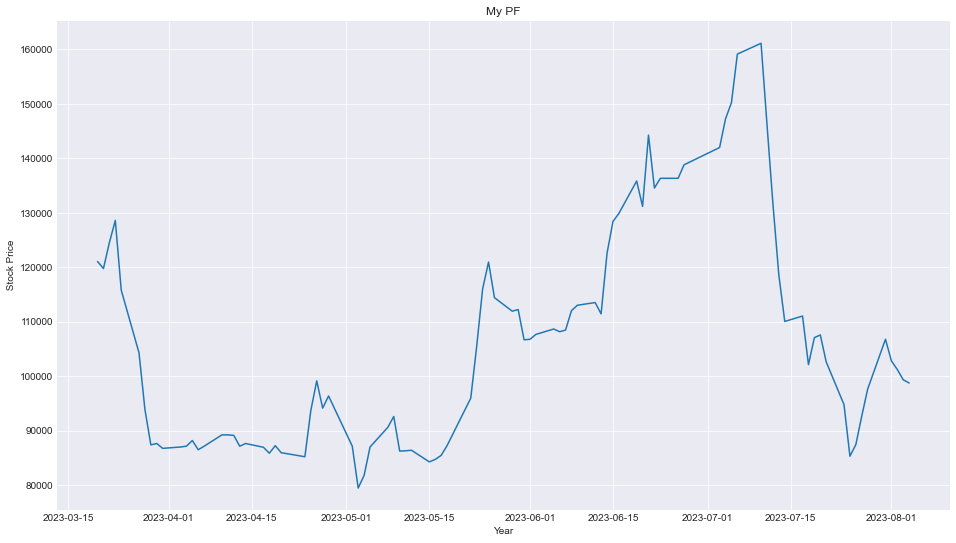

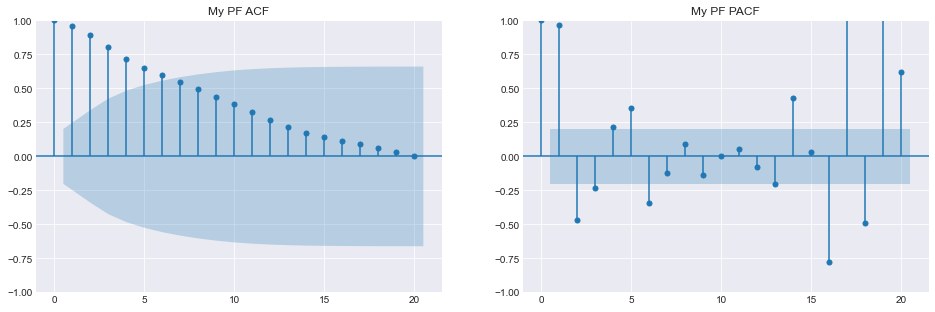

In [ ]:
# Time Series plot of Google stock price with ACF and PACF
mypf['Pct_change'] = mypf['My Portfolio'].pct_change()

# Plot of Google stock price
plt.plot(mypf['My Portfolio'])
plt.title("My PF")
plt.xlabel("Year")
plt.ylabel(" Stock Price")
plt.show()

# plot ACF and PACF
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
sm.graphics.tsa.plot_acf(mypf['My Portfolio'], title="My PF ACF", lags=20, ax=ax1)
sm.graphics.tsa.plot_pacf(mypf['My Portfolio'], title="My PF PACF", lags=20, ax=ax2)
plt.show()

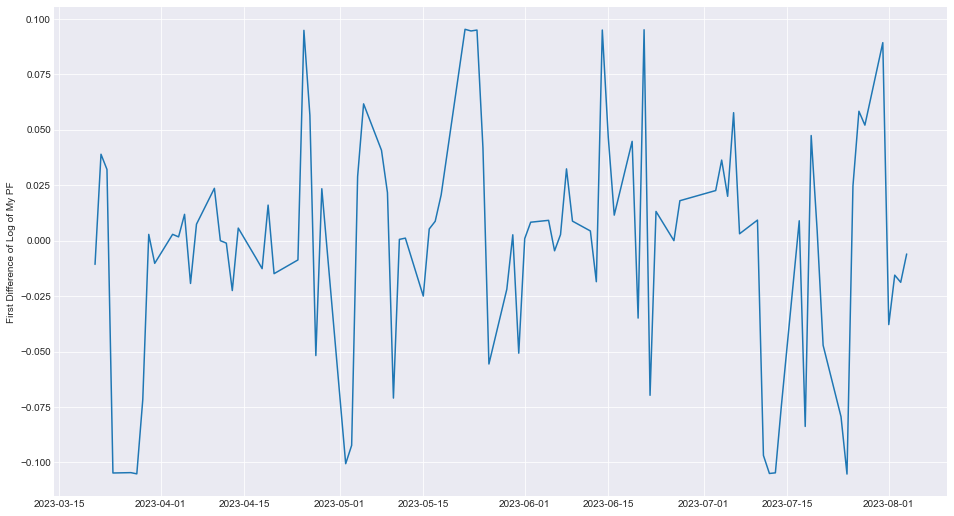

In [ ]:
# Plot of First Differencing of Google Stock Price
# plt.plot(mypf['My Portfolio'].diff().dropna())
# plt.ylabel("First Difference of My PF")
# plt.show()

# Plot First Differencing of Log of Google Stock Price
plt.plot(np.log(mypf['My Portfolio']).diff().dropna())
plt.ylabel("First Difference of Log of My PF")
plt.show()

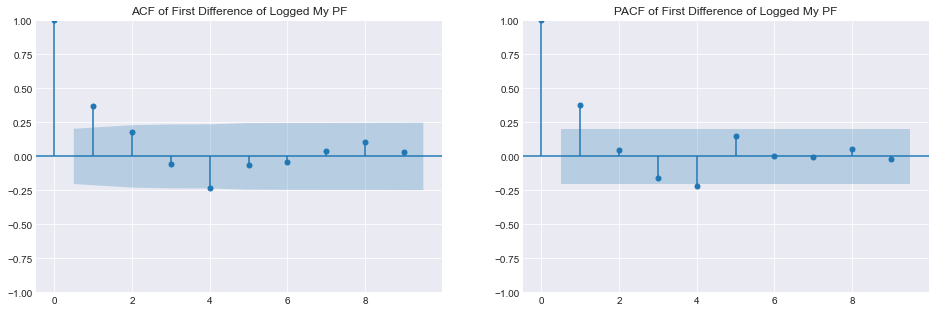

In [ ]:
# ACF and PACF Plots for First Difference of Logged Google Stock Price
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
sm.graphics.tsa.plot_acf(
    np.log(mypf['My Portfolio']).diff().dropna(),
    title="ACF of First Difference of Logged My PF",
    lags=9,
    ax=ax1,
)
sm.graphics.tsa.plot_pacf(
    np.log(mypf['My Portfolio']).diff().dropna(),
    title="PACF of First Difference of Logged My PF",
    lags=9,
    ax=ax2,
)
plt.show()

In [ ]:
# Best ARIMA Model for Google stock price
mod_can_a = ARIMA(
    np.log(mypf['My Portfolio']), order=(0, 1, 1), trend="n"
).fit()  # This is the best model in Python implementation
print(mod_can_a.summary())

                               SARIMAX Results                                
Dep. Variable:           My Portfolio   No. Observations:                   94
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 149.836
Date:                Sun, 06 Aug 2023   AIC                           -295.672
Time:                        08:08:12   BIC                           -290.607
Sample:                             0   HQIC                          -293.627
                                 - 94                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3051      0.085      3.575      0.000       0.138       0.472
sigma2         0.0023      0.000      6.629      0.000       0.002       0.003
Ljung-Box (L1) (Q):                   0.27   Jarque-

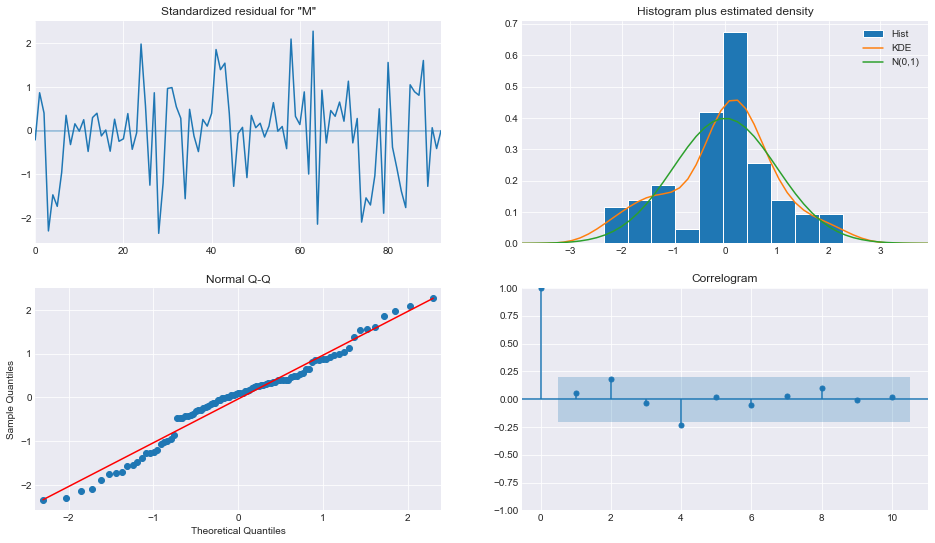

In [ ]:
# Diagnostic Report for ARIMA(1,1,0) Model
mod_can_a.plot_diagnostics()
plt.show()

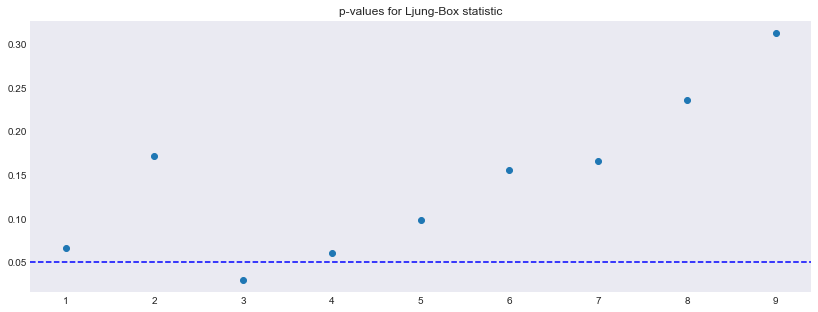

In [ ]:
# Ljung-Box test for no serial correlation of standardized residuals
lb_test = mod_can_a.test_serial_correlation(
    method="ljungbox", df_adjust=True, lags=None
)

# plot Ljung-Box test p-values and 0.05 significance line
plt.figure(figsize=(14, 5))
plt.plot(lb_test[0][1], linestyle="", marker="o")
plt.axhline(y=0.05, color="blue", linestyle="--")
plt.title("p-values for Ljung-Box statistic")
plt.grid()
plt.show()

In the ACF plot for the residuals, the ACFs with p-values above 0.05 are not significant.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

#Efficient ARIMA model Selection
mod_can_auto = auto_arima(
    np.log(mypf['My Portfolio']).dropna(),  # stepwise=False,
    start_p=0,
    start_d=0,
    start_q=0,
    max_p=5,
    max_d=2,
    max_q=5,
    trace=True,
    return_valid_fits=True,
)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-284.860, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-296.527, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-293.790, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-286.690, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-294.716, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-294.626, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-292.940, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=-298.442, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=-296.638, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-296.545, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-295.672, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=-294.862, Time=0.03 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]          
Total fit time: 0.341 seconds


In [ ]:
#input("Check ARIMA parameters below value and continue")



## TIME SERIES ARIMA (p,r,q) MODEL FOR MY PORTFOLIO

sigma2   32,179,308.403
dtype: float64


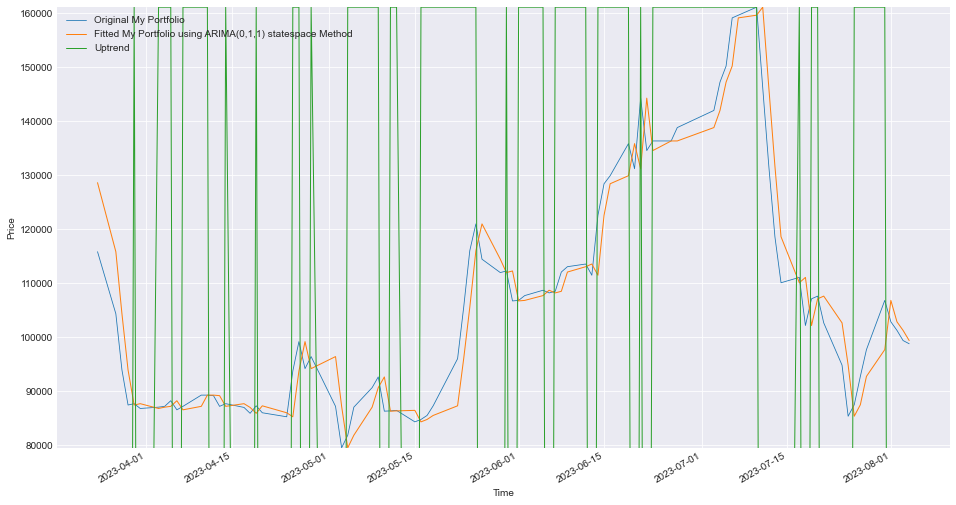

In [ ]:
# MA(1) for first difference of Google stock price

# mypf_ma2 = statsmodels.tsa.arima.model.ARIMA(mypf['My Portfolio'],
#                                              order=(0, 2, 1)).fit()

# mypf_ma2 = statsmodels.tsa.arima.model.ARIMA(mypf['My Portfolio'],
#                                              order=(1, 1, 0)).fit(method= 'statespace')
mypf_ma2 = statsmodels.tsa.arima.model.ARIMA(mypf['My Portfolio'],
                                             order=(0, 1, 0)).fit(method='statespace')

# mypf_ma2 = statsmodels.tsa.arima.model.ARIMA(mypf['My Portfolio'],
#                                              order=(1, 0, 0)).fit(method= 'innovations_mle')
# mypf_ma2 = statsmodels.tsa.arima.model.ARIMA(mypf['My Portfolio'],
#                                              order=(0, 1, 1)).fit(method= 'innovations')



print(mypf_ma2.params)

# Plotting Google vs fitted Google stock prices using first differencing
mypf_ma2_res = mypf_ma2.resid
mypf_ma2_fit = mypf['My Portfolio'] - mypf_ma2_res
mypf_ma2_fit_full = mypf_ma2_fit
mypf_ma2_res = mypf_ma2_res[
    1:
]  # need to skip first element since the model lost one data point
mypf_ma2_fit = mypf_ma2_fit[
    1:
]  # need to skip first element since the model lost one data point

mypf_ma2_fit_full_lag = mypf_ma2_fit_full.shift(1)

# buy_mask =    (mypf['My Portfolio'] > mypf[f'MA{LM}'])     & \
#               (mypf['My_PF_lag']    < mypf[f'lag_MA{LM}'])

buy_mask =    ( mypf['My Portfolio'] > mypf_ma2_fit_full     )    & \
              ( mypf['My_PF_lag']    < mypf_ma2_fit_full_lag )

# sell_mask =   (mypf['My Portfolio'] < mypf[f'MA{LM}'])     & \
#               (mypf['My_PF_lag']    > mypf[f'lag_MA{LM}'])


sell_mask =   ( mypf['My Portfolio'] < mypf_ma2_fit_full     )     & \
              ( mypf['My_PF_lag']    > mypf_ma2_fit_full_lag )


mypf['AR_Uptrend'] = np.nan
mypf.loc[buy_mask,'AR_Uptrend'] = +1
mypf.loc[sell_mask,'AR_Uptrend'] = -1
mypf.AR_Uptrend = mypf.AR_Uptrend.fillna(method="ffill") *np.max(mypf['My Portfolio'])

# ax1.set(title="Portfolio Trend detector")
# ax1.set_ylim([np.min(mypf['My Portfolio']), np.max(mypf['My Portfolio'])])
# mypf[['My Portfolio','AR_Uptrend']].plot(ax=ax1)

mypf['My Portfolio'].tail(90).plot(linewidth=0.8, label="Original My Portfolio")
mypf_ma2_fit.tail(90).plot(
    linewidth=1, label="Fitted My Portfolio using ARIMA(0,1,1) statespace Method"
)
mypf['AR_Uptrend'].tail(90).plot(
    linewidth=1, label="Uptrend")

plt.xlabel("Time")
plt.ylabel("Price")
plt.ylim(np.min(mypf['My Portfolio']), np.max(mypf['My Portfolio']))

os.chdir(root)
plt.savefig("Fig_007_StateSpaceTrend.jpg", format='jpg', dpi=300)
plt.legend()
plt.show()





ARCH and GARCH



In [ ]:
#input("have a look at the trend")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from arch.univariate import ARCH, ConstantMean, Normal
from scipy import stats
from arch import arch_model
from statsmodels.stats.diagnostic import acorr_ljungbox


plt.rcParams["figure.figsize"] = (16, 9)  # Figure size and width

In [ ]:
# Download the dataset

# Convert date variable to date format and set index
#goog = mypf['PF_Returns']

goog = np.log(mypf['My Portfolio']).diff().dropna()



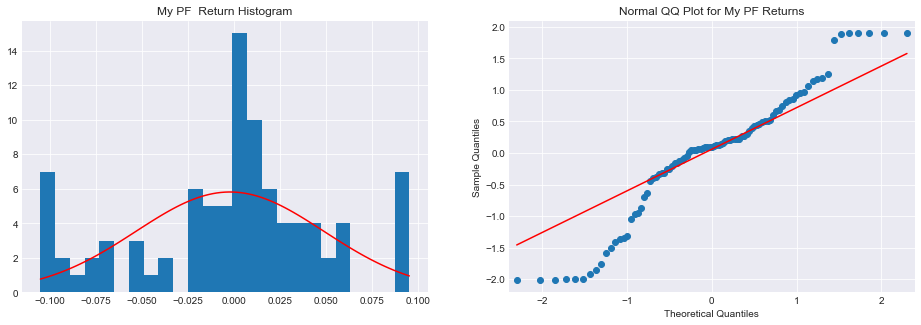

In [ ]:
# Histogram and Normal QQ Plot for Google Stock Returns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
goog_r = goog.dropna()

# Histogram with density
x = np.linspace(min(goog_r), max(goog_r), len(goog_r))
(mu, sigma) = stats.norm.fit(goog_r)
values, bins, _ = ax1.hist(goog_r, bins=25)  # Histogram
ax1.plot(x, stats.norm.pdf(x, mu, sigma) * sum(values * np.diff(bins)), "r")  # Density
ax1.set(title="My PF  Return Histogram")

# Normal QQ plot
sm.qqplot(goog_r, stats.norm, fit=True, line="q", ax=ax2)
ax2.set(title="Normal QQ Plot for My PF Returns")
plt.show()

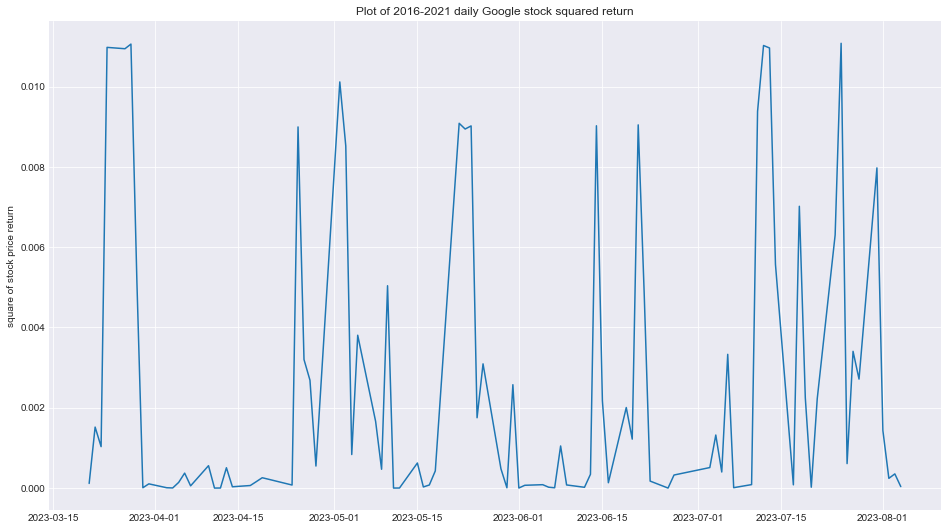

In [ ]:
# Google Stock Squared Returns
plt.plot(goog ** 2)
plt.ylabel("square of stock price return")
plt.title("Plot of 2016-2021 daily Google stock squared return")
plt.show()

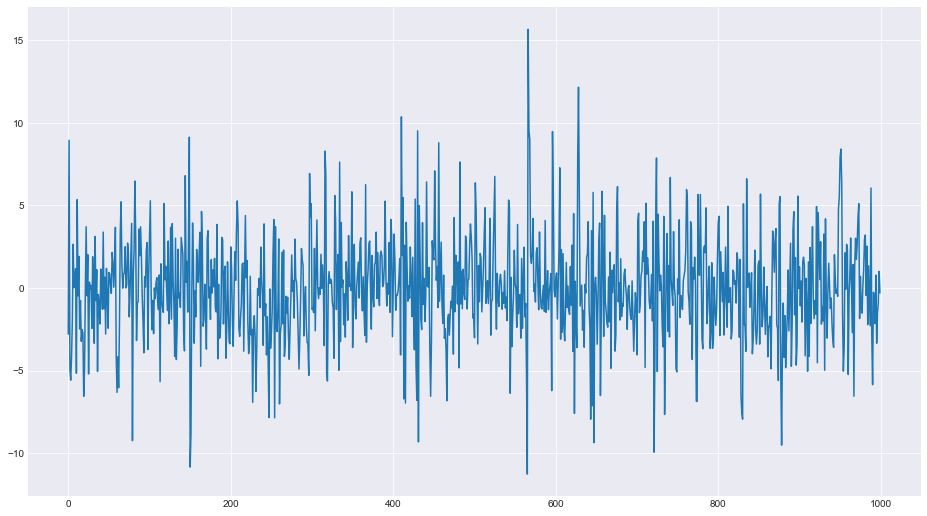

In [ ]:
# ARCH(1) Simulation n=1000, alpha_0=5 and alpha_1=0.5

# simulated process parameters
rs = np.random.RandomState([12345, 77777])
dist = Normal(seed=rs)
vol = ARCH(p=1)
repro_mod = ConstantMean(None, volatility=vol, distribution=dist)
params = pd.Series({"mu": 0.0, "omega": 5, "alpha[1]": 0.5, "beta[1]": 0.0})

# model simulation
arch1_sim = repro_mod.simulate(params, nobs=1000)
plt.plot(arch1_sim.data)
plt.show()

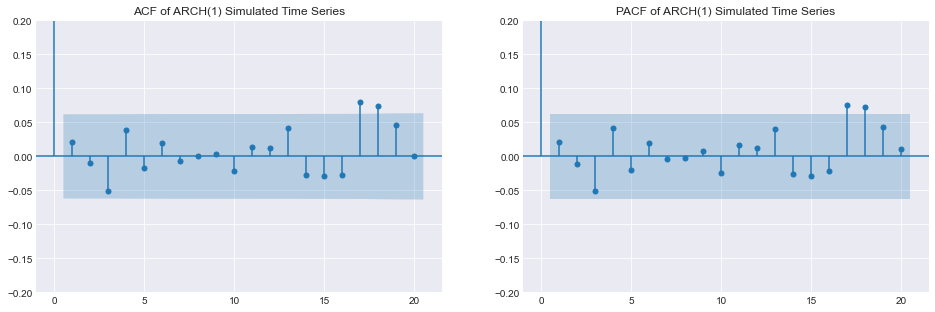

In [ ]:
# ACF and PACF of ARCH(1) Simulated Time Series
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
sm.graphics.tsa.plot_acf(arch1_sim.data.dropna(), lags=20, ax=ax1)
ax1.set(title="ACF of ARCH(1) Simulated Time Series")
ax1.set_ylim([-0.2, 0.2])

sm.graphics.tsa.plot_pacf(arch1_sim.data.dropna(), lags=20, ax=ax2)
ax2.set(title="PACF of ARCH(1) Simulated Time Series")
ax2.set_ylim([-0.2, 0.2])
plt.show()

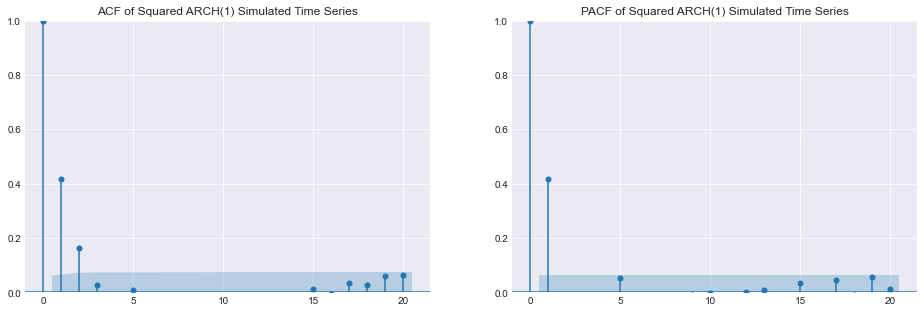

In [ ]:
# ACF and PACF of Squared ARCH(1) Simulated Time Series
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
sm.graphics.tsa.plot_acf(arch1_sim.data.dropna() ** 2, lags=20, ax=ax1)
ax1.set(title="ACF of Squared ARCH(1) Simulated Time Series")
ax1.set_ylim([-0, 1])

sm.graphics.tsa.plot_pacf(arch1_sim.data.dropna() ** 2, lags=20, ax=ax2)
ax2.set(title="PACF of Squared ARCH(1) Simulated Time Series")
ax2.set_ylim([-0, 1])
plt.show()

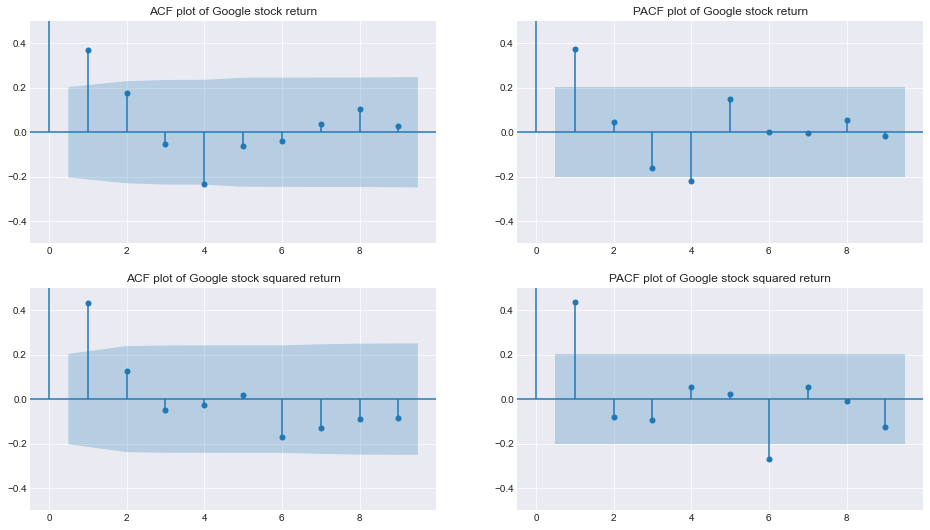

In [ ]:
# ACF and PACF Plots for Google Stock Returns and Squared Returns
fig, ax = plt.subplots(2, 2)

sm.graphics.tsa.plot_acf(goog_r, lags=9, ax=ax[0, 0])
ax[0, 0].set(title="ACF plot of Google stock return")
ax[0, 0].set_ylim([-0.5, 0.5])

sm.graphics.tsa.plot_pacf(goog_r, lags=9, ax=ax[0, 1])
ax[0, 1].set(title="PACF plot of Google stock return")
ax[0, 1].set_ylim([-0.5, 0.5])

sm.graphics.tsa.plot_acf(goog_r ** 2, lags=9, ax=ax[1, 0])
ax[1, 0].set(title="ACF plot of Google stock squared return")
ax[1, 0].set_ylim([-0.5, 0.5])

sm.graphics.tsa.plot_pacf(goog_r ** 2, lags=9, ax=ax[1, 1])
ax[1, 1].set(title="PACF plot of Google stock squared return")
ax[1, 1].set_ylim([-0.5, 0.5])
plt.show()

In [ ]:
garch11_spec = arch_model(
    goog_r,
    vol="GARCH",
    p=1,
    q=1,
    mean="AR",
    dist="Normal",
    rescale=True,
)
garch11_fit = garch11_spec.fit()
garch11_fit.summary()

Iteration:      1,   Func. Count:      6,   Neg. LLF: 497.77932834422535
Iteration:      2,   Func. Count:     14,   Neg. LLF: 62452.87777817746
Iteration:      3,   Func. Count:     20,   Neg. LLF: 980.7367573786801
Iteration:      4,   Func. Count:     27,   Neg. LLF: 72.25786627462954
Iteration:      5,   Func. Count:     33,   Neg. LLF: 64.1374342198008
Iteration:      6,   Func. Count:     38,   Neg. LLF: 64.10153227442021
Iteration:      7,   Func. Count:     43,   Neg. LLF: 64.09721580446337
Iteration:      8,   Func. Count:     48,   Neg. LLF: 64.09568823673725
Iteration:      9,   Func. Count:     53,   Neg. LLF: 64.09564973152861
Iteration:     10,   Func. Count:     58,   Neg. LLF: 64.09564422811233
Iteration:     11,   Func. Count:     62,   Neg. LLF: 64.09564422809639
Optimization terminated successfully    (Exit mode 0)
            Current function value: 64.09564422811233
            Iterations: 11
            Function evaluations: 62
            Gradient evaluations: 11

<class 'statsmodels.iolib.summary.Summary'>
"""
                           AR - GARCH Model Results                           
==============================================================================
Dep. Variable:           My Portfolio   R-squared:                       0.000
Mean Model:                        AR   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -64.0956
Distribution:                  Normal   AIC:                           136.191
Method:            Maximum Likelihood   BIC:                           146.322
                                        No. Observations:                   93
Date:                Sun, Aug 06 2023   Df Residuals:                       92
Time:                        08:08:15   Df Model:                            1
                                Mean Model                               
=========================================================================
                  coef    std err          t      P>|t|  95.0% Conf. Int.
-------------------------------------------------------------------------
Const      -7.7444e-04  5.301e-02 -1.461e-02      0.988 [ -0.105,  0.103]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.1360      0.100      1.354      0.176 [-6.084e-02,  0.333]
alpha[1]       0.3836      0.121      3.162  1.568e-03    [  0.146,  0.621]
beta[1]        0.0944      0.362      0.261      0.794    [ -0.615,  0.804]
===========================================================================

Covariance estimator: robust
"""

In [ ]:
# Diagnostic tests for GARCH(1,1) Model with Normal White Noise
print("GARCH(1,1) Model with Normal White Noise\n")

# Ljung-Box test and the Box-Pierce test
print("Ljung-Box and Box-Pierce tests on stanrdized residuals")
print(acorr_ljungbox(garch11_fit.std_resid, boxpierce=True))

print("\nLjung-Box and Box-Pierce tests on stanrdized squared residuals")
print(acorr_ljungbox(garch11_fit.std_resid ** 2, boxpierce=True))

# ARCH LM test for conditional heteroskedasticity
print("\nARCH LM test for conditional heteroskedasticity")
print(garch11_fit.arch_lm_test(standardized=True))

GARCH(1,1) Model with Normal White Noise

Ljung-Box and Box-Pierce tests on stanrdized residuals
    lb_stat  lb_pvalue  bp_stat  bp_pvalue
1     6.179      0.013    5.984      0.014
2     8.011      0.018    7.739      0.021
3     8.110      0.044    7.833      0.050
4    12.942      0.012   12.360      0.015
5    13.023      0.023   12.435      0.029
6    13.269      0.039   12.660      0.049
7    13.305      0.065   12.692      0.080
8    14.449      0.071   13.716      0.089
9    14.902      0.094   14.117      0.118
10   14.969      0.133   14.175      0.165

Ljung-Box and Box-Pierce tests on stanrdized squared residuals
    lb_stat  lb_pvalue  bp_stat  bp_pvalue
1     0.115      0.735    0.111      0.739
2     0.167      0.920    0.161      0.923
3     0.212      0.976    0.204      0.977
4     0.592      0.964    0.560      0.967
5     1.730      0.885    1.614      0.900
6     3.116      0.794    2.883      0.823
7     3.550      0.830    3.276      0.858
8     4.486      0.811

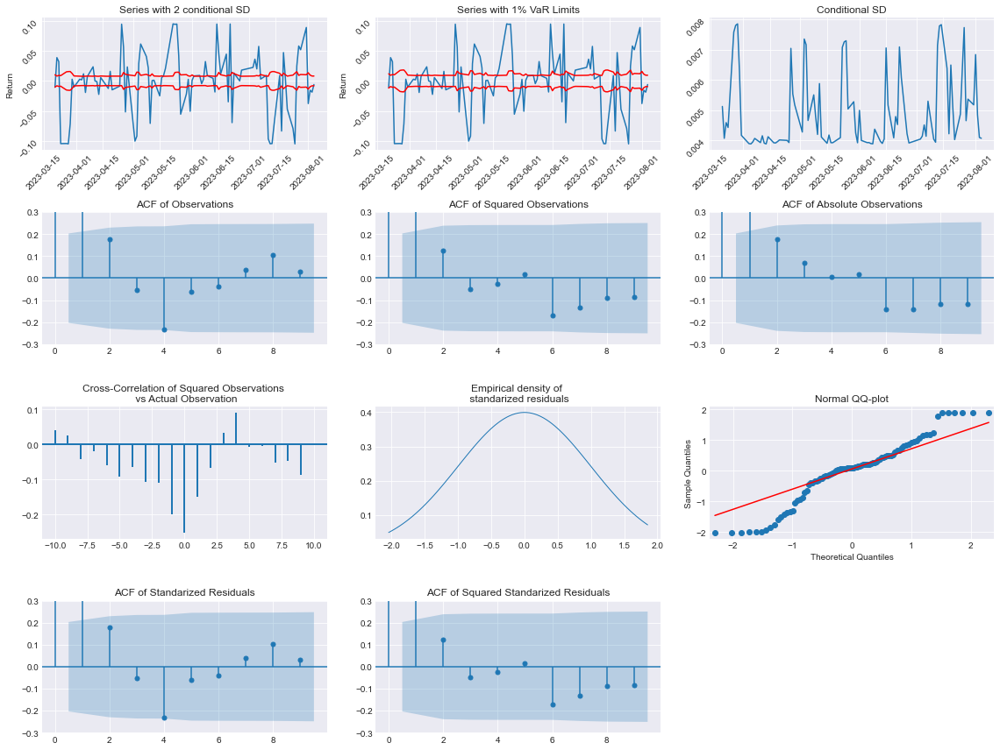

In [ ]:
# Model Diagnostic Plots for the GARCH(1,1) Model with Normal White Noise
fig, ax = plt.subplots(4, 3, figsize=(16, 12))

# Figure Row 1 Column 1
ax[0, 0].plot(goog_r)
ax[0, 0].plot(2.0 * garch11_fit.conditional_volatility / 100.0, c="r")
ax[0, 0].plot(-2.0 * garch11_fit.conditional_volatility / 100.0, c="r")
ax[0, 0].tick_params(labelrotation=45)
ax[0, 0].set_title("Series with 2 conditional SD")
ax[0, 0].set_ylabel("Return")

# Figure Row 1 Column 2
VaR_1 = stats.norm.ppf(0.99)
ax[0, 1].plot(goog_r)
ax[0, 1].plot(VaR_1 * garch11_fit.conditional_volatility / 100.0, c="r")
ax[0, 1].plot(-VaR_1 * garch11_fit.conditional_volatility / 100.0, c="r")
ax[0, 1].tick_params(labelrotation=45)
ax[0, 1].set_title("Series with 1% VaR Limits")
ax[0, 1].set_ylabel("Return")

# Figure Row 1 Column 3
ax[0, 2].plot(garch11_fit.conditional_volatility / 100.0)
ax[0, 2].set_title("Conditional SD")
ax[0, 2].tick_params(labelrotation=45)

# Figure Row 2 Column 1
sm.graphics.tsa.plot_acf(garch11_fit.resid / 100.0, lags=9, ax=ax[1, 0])
ax[1, 0].set_title("ACF of Observations")
ax[1, 0].set_ylim([-0.3, 0.3])

# Figure Row 2 Column 2
sm.graphics.tsa.plot_acf(garch11_fit.resid ** 2, lags=9, ax=ax[1, 1])
ax[1, 1].set_title("ACF of Squared Observations")
ax[1, 1].set_ylim([-0.3, 0.3])

# Figure Row 2 Column 3
sm.graphics.tsa.plot_acf(np.abs(garch11_fit.resid), lags=9, ax=ax[1, 2])
ax[1, 2].set_title("ACF of Absolute Observations")
ax[1, 2].set_ylim([-0.3, 0.3])

# Figure Row 3 Column 1
ax[2, 0].xcorr(
    garch11_fit.resid ** 2,
    garch11_fit.resid,
    usevlines=True,
    maxlags=10,
    normed=True,
    lw=2,
)
ax[2, 0].set_title("Cross-Correlation of Squared Observations \n vs Actual Observation")

# Figure Row 3 Column 2
standaraized_residuals = garch11_fit.resid.dropna() / garch11_fit.resid.dropna().std()
min_val = np.min(standaraized_residuals)
max_val = np.max(standaraized_residuals)
empirical_density = np.linspace(min_val, max_val, len(standaraized_residuals))
ax[2, 1].plot(empirical_density, stats.norm.pdf(empirical_density), lw=1)
ax[2, 1].set_title("Empirical density of \n standarized residuals")

# Figure Row 3 Column 3
sm.qqplot(garch11_fit.resid, stats.norm, fit=True, line="q", ax=ax[2, 2])
ax[2, 2].set_title("Normal QQ-plot")

# Figure Row 4 Column 1
sm.graphics.tsa.plot_acf(
    garch11_fit.resid / garch11_fit.resid.std(), lags=9, ax=ax[3, 0]
)
ax[3, 0].set_title("ACF of Standarized Residuals")
ax[3, 0].set_ylim([-0.3, 0.3])

# Figure Row 4 Column 2
sm.graphics.tsa.plot_acf(
    (garch11_fit.resid / garch11_fit.resid.std()) ** 2, lags=9, ax=ax[3, 1]
)
ax[3, 1].set_title("ACF of Squared Standarized Residuals")
ax[3, 1].set_ylim([-0.3, 0.3])

ax[3, 2].axis("off")
fig.tight_layout()
plt.show()

In [ ]:
# GARCH(1,1) Model with Student's t White Noise
garch11_t_spec = arch_model(
    goog_r,
    vol="GARCH",
    p=1,
    q=1,
    mean="AR",
    dist="StudentsT",  # power=2.0,
    rescale=True,
)
garch11_t_fit = garch11_t_spec.fit()
garch11_t_fit.summary()

Iteration:      1,   Func. Count:      7,   Neg. LLF: 390.4833497057783
Iteration:      2,   Func. Count:     16,   Neg. LLF: 328.0284445843521
Iteration:      3,   Func. Count:     23,   Neg. LLF: 656.5462644123388
Iteration:      4,   Func. Count:     30,   Neg. LLF: 75.39721794055623
Iteration:      5,   Func. Count:     37,   Neg. LLF: 63.65424834374193
Iteration:      6,   Func. Count:     44,   Neg. LLF: 65.81598230958333
Iteration:      7,   Func. Count:     51,   Neg. LLF: 63.390446587337244
Iteration:      8,   Func. Count:     57,   Neg. LLF: 63.3818052032359
Iteration:      9,   Func. Count:     63,   Neg. LLF: 63.37229218094012
Iteration:     10,   Func. Count:     69,   Neg. LLF: 63.35259752042287
Iteration:     11,   Func. Count:     75,   Neg. LLF: 63.250307303432024
Iteration:     12,   Func. Count:     81,   Neg. LLF: 141.1934654129787
Iteration:     13,   Func. Count:     88,   Neg. LLF: 140.76526460315827
Iteration:     14,   Func. Count:     95,   Neg. LLF: 140.5576

<class 'statsmodels.iolib.summary.Summary'>
"""
                              AR - GARCH Model Results                              
====================================================================================
Dep. Variable:                 My Portfolio   R-squared:                       0.000
Mean Model:                              AR   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -62.4036
Distribution:      Standardized Student's t   AIC:                           134.807
Method:                  Maximum Likelihood   BIC:                           147.470
                                              No. Observations:                   93
Date:                      Sun, Aug 06 2023   Df Residuals:                       92
Time:                              08:08:16   Df Model:                            1
                                  Mean Model                                 
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
Const      8.8173e-03  3.946e-02      0.223      0.823 [-6.852e-02,8.616e-02]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.0729  6.241e-02      1.168      0.243 [-4.942e-02,  0.195]
alpha[1]       0.7433      0.323      2.300  2.147e-02    [  0.110,  1.377]
beta[1]        0.2567      0.192      1.336      0.182    [ -0.120,  0.633]
                              Distribution                              
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
nu             3.8753      1.535      2.525  1.156e-02 [  0.868,  6.883]
========================================================================

Covariance estimator: robust
"""

In [ ]:
# Diagnostic tests for GARCH(1,1) Model with Student's t White Noise
print("GARCH(1,1) Model with StudentsT White Noise\n")

# Ljung-Box test and the Box-Pierce test
print("Ljung-Box and Box-Pierce tests on stanrdized residuals")
print(acorr_ljungbox(garch11_t_fit.std_resid, boxpierce=True))

print("\nLjung-Box and Box-Pierce tests on stanrdized squared residuals")
print(acorr_ljungbox(garch11_t_fit.std_resid ** 2, boxpierce=True))

# ARCH LM test for conditional heteroskedasticity
print("\nARCH LM test for conditional heteroskedasticity for")
print(garch11_t_fit.arch_lm_test(standardized=True))

GARCH(1,1) Model with StudentsT White Noise

Ljung-Box and Box-Pierce tests on stanrdized residuals
    lb_stat  lb_pvalue  bp_stat  bp_pvalue
1     3.975      0.046    3.849      0.050
2     5.159      0.076    4.984      0.083
3     5.164      0.160    4.989      0.173
4     9.590      0.048    9.135      0.058
5     9.642      0.086    9.183      0.102
6    10.133      0.119    9.632      0.141
7    10.468      0.164    9.936      0.192
8    11.532      0.173   10.888      0.208
9    12.673      0.178   11.897      0.219
10   12.726      0.239   11.943      0.289

Ljung-Box and Box-Pierce tests on stanrdized squared residuals
    lb_stat  lb_pvalue  bp_stat  bp_pvalue
1     0.224      0.636    0.217      0.641
2     1.025      0.599    0.984      0.611
3     1.351      0.717    1.293      0.731
4     1.549      0.818    1.479      0.830
5     1.862      0.868    1.768      0.880
6     2.781      0.836    2.610      0.856
7     2.866      0.897    2.687      0.912
8     3.778      0.

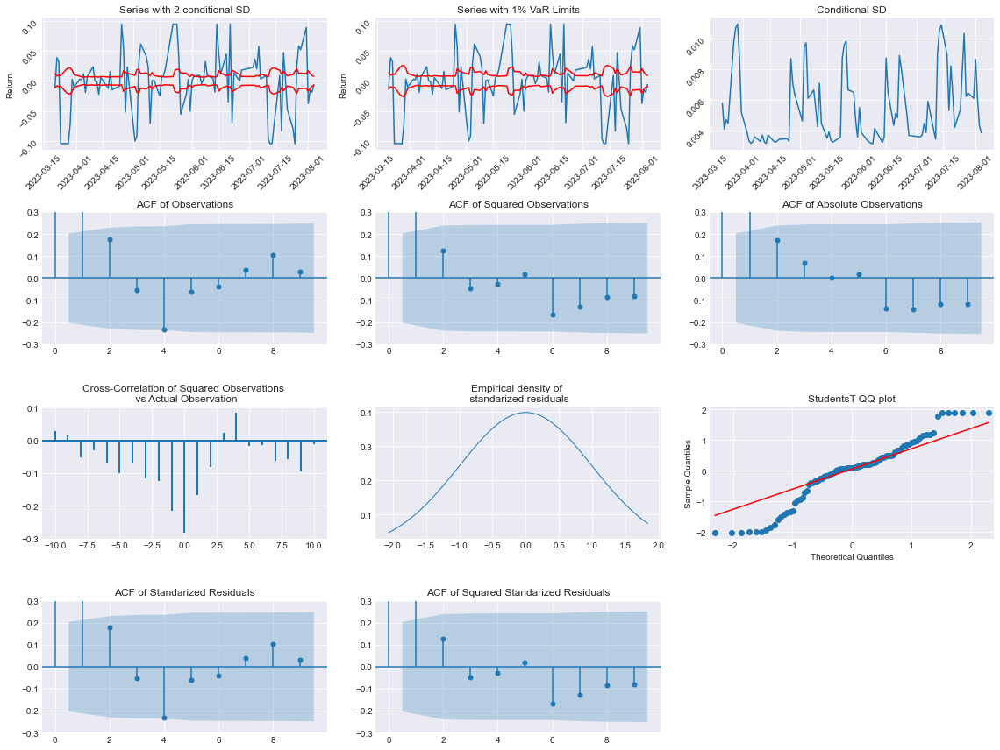

In [ ]:
# Model Diagnostic Plots for the GARCH(1,1) Model with Student's t White Noise
fig, ax = plt.subplots(4, 3, figsize=(16, 12))

# Figure Row 1 Column 1
ax[0, 0].plot(goog_r)
ax[0, 0].plot(2.0 * garch11_t_fit.conditional_volatility / 100.0, c="r")
ax[0, 0].plot(-2.0 * garch11_t_fit.conditional_volatility / 100.0, c="r")
ax[0, 0].tick_params(labelrotation=45)
ax[0, 0].set_title("Series with 2 conditional SD")
ax[0, 0].set_ylabel("Return")

# Figure Row 1 Column 2
VaR_1 = stats.t(df=len(goog_r) - 1).ppf(0.99)
# VaR_1 = stats.norm.ppf(0.99)
ax[0, 1].plot(goog_r)
ax[0, 1].plot(VaR_1 * garch11_t_fit.conditional_volatility / 100.0, c="r")
ax[0, 1].plot(-VaR_1 * garch11_t_fit.conditional_volatility / 100.0, c="r")
ax[0, 1].tick_params(labelrotation=45)
ax[0, 1].set_title("Series with 1% VaR Limits")
ax[0, 1].set_ylabel("Return")

# Figure Row 1 Column 3
ax[0, 2].plot(garch11_t_fit.conditional_volatility / 100.0)
ax[0, 2].set_title("Conditional SD")
ax[0, 2].tick_params(labelrotation=45)

# Figure Row 2 Column 1
sm.graphics.tsa.plot_acf(garch11_t_fit.resid / 100.0, lags=9, ax=ax[1, 0])
ax[1, 0].set_title("ACF of Observations")
ax[1, 0].set_ylim([-0.3, 0.3])

# Figure Row 2 Column 2
sm.graphics.tsa.plot_acf(garch11_t_fit.resid ** 2, lags=9, ax=ax[1, 1])
ax[1, 1].set_title("ACF of Squared Observations")
ax[1, 1].set_ylim([-0.3, 0.3])

# Figure Row 2 Column 3
sm.graphics.tsa.plot_acf(np.abs(garch11_t_fit.resid), lags=9, ax=ax[1, 2])
ax[1, 2].set_title("ACF of Absolute Observations")
ax[1, 2].set_ylim([-0.3, 0.3])

# Figure Row 3 Column 1
ax[2, 0].xcorr(
    garch11_t_fit.resid ** 2,
    garch11_t_fit.resid,
    usevlines=True,
    maxlags=10,
    normed=True,
    lw=2,
)
ax[2, 0].set_title("Cross-Correlation of Squared Observations \n vs Actual Observation")

# Figure Row 3 Column 2
standaraized_residuals = (
    garch11_t_fit.resid.dropna() / garch11_t_fit.resid.dropna().std()
)
min_val = np.min(standaraized_residuals)
max_val = np.max(standaraized_residuals)
empirical_density = np.linspace(min_val, max_val, len(standaraized_residuals))
ax[2, 1].plot(empirical_density, stats.norm.pdf(empirical_density), lw=1)
ax[2, 1].set_title("Empirical density of \n standarized residuals")

# Figure Row 3 Column 3
sm.qqplot(garch11_t_fit.resid, stats.t, fit=True, line="q", ax=ax[2, 2])
ax[2, 2].set_title("StudentsT QQ-plot")

# Figure Row 4 Column 1
sm.graphics.tsa.plot_acf(
    garch11_t_fit.resid / garch11_t_fit.resid.std(), lags=9, ax=ax[3, 0]
)
ax[3, 0].set_title("ACF of Standarized Residuals")
ax[3, 0].set_ylim([-0.3, 0.3])

# Figure Row 4 Column 2
sm.graphics.tsa.plot_acf(
    (garch11_t_fit.resid / garch11_t_fit.resid.std()) ** 2, lags=9, ax=ax[3, 1]
)
ax[3, 1].set_title("ACF of Squared Standarized Residuals")
ax[3, 1].set_ylim([-0.3, 0.3])

ax[3, 2].axis("off")
fig.tight_layout()
plt.show()

In [ ]:
# Diagnostic tests for GARCH(1,1) Model with Student's t White Noise
print("GARCH(1,1) Model with StudentsT White Noise\n")

# Ljung-Box test and the Box-Pierce test
print("Ljung-Box and Box-Pierce tests on stanrdized residuals")
print(acorr_ljungbox(garch11_t_fit.std_resid, boxpierce=True))

print("\nLjung-Box and Box-Pierce tests on stanrdized squared residuals")
print(acorr_ljungbox(garch11_t_fit.std_resid ** 2, boxpierce=True))

# ARCH LM test for conditional heteroskedasticity
print("\nARCH LM test for conditional heteroskedasticity for")
print(garch11_t_fit.arch_lm_test(standardized=True))


GARCH(1,1) Model with StudentsT White Noise

Ljung-Box and Box-Pierce tests on stanrdized residuals
    lb_stat  lb_pvalue  bp_stat  bp_pvalue
1     3.975      0.046    3.849      0.050
2     5.159      0.076    4.984      0.083
3     5.164      0.160    4.989      0.173
4     9.590      0.048    9.135      0.058
5     9.642      0.086    9.183      0.102
6    10.133      0.119    9.632      0.141
7    10.468      0.164    9.936      0.192
8    11.532      0.173   10.888      0.208
9    12.673      0.178   11.897      0.219
10   12.726      0.239   11.943      0.289

Ljung-Box and Box-Pierce tests on stanrdized squared residuals
    lb_stat  lb_pvalue  bp_stat  bp_pvalue
1     0.224      0.636    0.217      0.641
2     1.025      0.599    0.984      0.611
3     1.351      0.717    1.293      0.731
4     1.549      0.818    1.479      0.830
5     1.862      0.868    1.768      0.880
6     2.781      0.836    2.610      0.856
7     2.866      0.897    2.687      0.912
8     3.778      0.

In [ ]:
# # Model Diagnostic Plots for the GARCH(1,1) Model with Student's t White Noise
# fig, ax = plt.subplots(4, 3, figsize=(16, 12))

# # Figure Row 1 Column 1
# ax[0, 0].plot(goog_r)
# ax[0, 0].plot(2.0 * garch11_t_fit.conditional_volatility / 100.0, c="r")
# ax[0, 0].plot(-2.0 * garch11_t_fit.conditional_volatility / 100.0, c="r")
# ax[0, 0].tick_params(labelrotation=45)
# ax[0, 0].set_title("Series with 2 conditional SD")
# ax[0, 0].set_ylabel("Return")

# # Figure Row 1 Column 2
# VaR_1 = stats.t(df=len(goog_r) - 1).ppf(0.99)
# # VaR_1 = stats.norm.ppf(0.99)
# ax[0, 1].plot(goog_r)
# ax[0, 1].plot(VaR_1 * garch11_t_fit.conditional_volatility / 100.0, c="r")
# ax[0, 1].plot(-VaR_1 * garch11_t_fit.conditional_volatility / 100.0, c="r")
# ax[0, 1].tick_params(labelrotation=45)
# ax[0, 1].set_title("Series with 1% VaR Limits")
# ax[0, 1].set_ylabel("Return")

# # Figure Row 1 Column 3
# ax[0, 2].plot(garch11_t_fit.conditional_volatility / 100.0)
# ax[0, 2].set_title("Conditional SD")
# ax[0, 2].tick_params(labelrotation=45)

# # Figure Row 2 Column 1
# sm.graphics.tsa.plot_acf(garch11_t_fit.resid / 100.0, lags=20, ax=ax[1, 0])
# ax[1, 0].set_title("ACF of Observations")
# ax[1, 0].set_ylim([-0.3, 0.3])

# # Figure Row 2 Column 2
# sm.graphics.tsa.plot_acf(garch11_t_fit.resid ** 2, lags=20, ax=ax[1, 1])
# ax[1, 1].set_title("ACF of Squared Observations")
# ax[1, 1].set_ylim([-0.3, 0.3])

# # Figure Row 2 Column 3
# sm.graphics.tsa.plot_acf(np.abs(garch11_t_fit.resid), lags=20, ax=ax[1, 2])
# ax[1, 2].set_title("ACF of Absolute Observations")
# ax[1, 2].set_ylim([-0.3, 0.3])

# # Figure Row 3 Column 1
# ax[2, 0].xcorr(
#     garch11_t_fit.resid ** 2,
#     garch11_t_fit.resid,
#     usevlines=True,
#     maxlags=30,
#     normed=True,
#     lw=2,
# )
# ax[2, 0].set_title("Cross-Correlation of Squared Observations \n vs Actual Observation")

# # Figure Row 3 Column 2
# standaraized_residuals = (
#     garch11_t_fit.resid.dropna() / garch11_t_fit.resid.dropna().std()
# )
# min_val = np.min(standaraized_residuals)
# max_val = np.max(standaraized_residuals)
# empirical_density = np.linspace(min_val, max_val, len(standaraized_residuals))
# ax[2, 1].plot(empirical_density, stats.norm.pdf(empirical_density), lw=1)
# ax[2, 1].set_title("Empirical density of \n standarized residuals")

# # Figure Row 3 Column 3
# sm.qqplot(garch11_t_fit.resid, stats.t, fit=True, line="q", ax=ax[2, 2])
# ax[2, 2].set_title("StudentsT QQ-plot")

# # Figure Row 4 Column 1
# sm.graphics.tsa.plot_acf(
#     garch11_t_fit.resid / garch11_t_fit.resid.std(), lags=20, ax=ax[3, 0]
# )
# ax[3, 0].set_title("ACF of Standarized Residuals")
# ax[3, 0].set_ylim([-0.3, 0.3])

# # Figure Row 4 Column 2
# sm.graphics.tsa.plot_acf(
#     (garch11_t_fit.resid / garch11_t_fit.resid.std()) ** 2, lags=20, ax=ax[3, 1]
# )
# ax[3, 1].set_title("ACF of Squared Standarized Residuals")
# ax[3, 1].set_ylim([-0.3, 0.3])

# ax[3, 2].axis("off")
# fig.tight_layout()
# plt.show()

In [ ]:
# # 20 Steps Ahead Forecast for GARCH(1,1) Model with Student's t White Noise

# # set horizon and forecast
# horizon = 20
# garch_forecast = garch11_t_fit.forecast(
#     reindex=False, horizon=horizon, method="simulation"
# )

# # reindex data
# googr = goog_r.copy()
# googr.index = list(range(len(goog_r) + 1))

# # forecast mean
# forc_mean = pd.Series(garch_forecast.mean.dropna().squeeze())
# forc_mean.index = list(range(len(googr), len(googr) + horizon))

# # volatility forecast
# variance_fct = pd.DataFrame(data={"Forecast": garch_forecast.variance.values[0]})
# variance_fct.index = list(range(len(googr), len(googr) + horizon))
# std_fct = [(variance_fct.values[i] * (i + 1)) ** 0.5 for i in range(len(variance_fct))]
# volatility_fct = pd.DataFrame(np.sqrt(std_fct))

# # upper/lower bands
# upper_band = googr.values[-1] * (1.0 + 2 * volatility_fct)
# upper_band.index = variance_fct.index
# lower_band = googr.values[-1] * (1.0 - 2 * volatility_fct)
# lower_band.index = variance_fct.index

# # Plot
# plt.figure(figsize=(16, 7))
# plt.xlim(1400, len(googr) + 21)
# plt.ylim(-0.05, 0.05)
# googr.plot(ylabel="Google Log Return", title="Forecast Volatility")
# plt.plot((upper_band + lower_band) / 2, "r--")
# plt.fill_between(
#     upper_band.index.tolist(),
#     upper_band.values.T[0],
#     lower_band.values.T[0],
#     color="orange",
#     alpha=0.5,
# )
# plt.show()

In [ ]:
!pip install arch
from arch import arch_model
def realized_volatility_daily(series_log_return):
    """
    Get the daily realized volatility which is calculated as the square root
    of sum of squares of log returns within a specific window interval
    """
    n = len(series_log_return)
    return np.sqrt(np.sum(series_log_return**2)/(n - 1))

def realized_mean_daily(series_log_return):
    """
    Get the daily realized volatility which is calculated as the square root
    of sum of squares of log returns within a specific window interval
    """
    return series_log_return.mean()



INTERVAL_WINDOW = 30
n_future = 7


[notice] A new release of pip is available: 23.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
df = pd.DataFrame()
mypf['logreturns'] = np.log(mypf['My Portfolio']) - np.log(mypf['My Portfolio'].shift(1))

df.index = mypf['logreturns'].index


df['TSLA'] = mypf['logreturns']


df['vol_current'] = df['TSLA'].rolling(window=INTERVAL_WINDOW)\
                                   .apply(realized_volatility_daily)


df['mean_current'] = df['TSLA'].rolling(window=INTERVAL_WINDOW)\
                                   .apply(realized_mean_daily)

# GET FORWARD LOOKING REALIZED VOLATILITY
df['vol_future'] = df['TSLA'].shift(-n_future)\
                                 .rolling(window=INTERVAL_WINDOW)\
                                 .apply(realized_volatility_daily)


df['mean_future'] = df['TSLA'].shift(-n_future)\
                                 .rolling(window=INTERVAL_WINDOW)\
                                 .apply(realized_mean_daily)


# PRE-DETERMINE DESIRED TEST & VALIDATION SIZES
train_size = np.int(len(mypf['logreturns']) * 0.5)
val_size = np.int(len(mypf['logreturns']) * 0.25)
test_size = len(mypf['logreturns']) - train_size - val_size

split_time_1 = train_size
split_time_2 = train_size + val_size

In [ ]:
val_size

23

In [ ]:


# GET CORRESPONDING DATETIME INDICES FOR EACH SET
train_idx = df.index[:split_time_1]
val_idx = df.index[split_time_1:split_time_2]
test_idx = df.index[split_time_2:]

print(f'TRAINING \tFrom: {train_idx[0]} \tto: {train_idx[-1]} \t{len(train_idx)} days')
print(f'VALIDATION \tFrom: {val_idx[0]} \tto: {val_idx[-1]} \t{len(val_idx)} days')
print(f'TEST \t\tFrom: {test_idx[0]} \tto: {test_idx[-1]} \t{len(test_idx)} days')

# SPLIT FORWARD VOLATILITY INTO 3 PARTS
# (this would be the target)
y_train = df.vol_future[train_idx]
y_val = df.vol_future[val_idx]
y_test = df.vol_future[test_idx]

x_train = df.vol_current[train_idx]
x_val = df.vol_current[val_idx]
x_test = df.vol_current[test_idx]

r_train = df['TSLA'][train_idx]
r_val = df['TSLA'] [val_idx].dropna(inplace=True, axis=0)
r_test = df['TSLA'] [test_idx].dropna(inplace=True, axis=0)

print(r_train)

np.random.seed(1234)

TRAINING 	From: 2023-03-20 00:00:00 	to: 2023-05-26 00:00:00 	47 days
VALIDATION 	From: 2023-05-29 00:00:00 	to: 2023-07-03 00:00:00 	23 days
TEST 		From: 2023-07-04 00:00:00 	to: 2023-08-04 00:00:00 	24 days
2023-03-20      NaN
2023-03-21   -0.011
2023-03-22    0.039
2023-03-23    0.032
2023-03-24   -0.105
2023-03-27   -0.105
2023-03-28   -0.105
2023-03-29   -0.072
2023-03-30    0.003
2023-03-31   -0.010
2023-04-03    0.003
2023-04-04    0.002
2023-04-05    0.012
2023-04-06   -0.019
2023-04-07    0.007
2023-04-10    0.024
2023-04-11    0.000
2023-04-12   -0.001
2023-04-13   -0.022
2023-04-14    0.006
2023-04-17   -0.008
2023-04-18   -0.013
2023-04-19    0.016
2023-04-20   -0.015
2023-04-24   -0.009
2023-04-25    0.095
2023-04-26    0.057
2023-04-27   -0.052
2023-04-28    0.023
2023-05-02   -0.101
2023-05-03   -0.092
2023-05-04    0.029
2023-05-05    0.062
2023-05-08    0.041
2023-05-09    0.022
2023-05-10   -0.071
2023-05-11    0.001
2023-05-12    0.001
2023-05-15   -0.025
2023-05-16 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 6111.037466529888
Iteration:      2,   Func. Count:     15,   Neg. LLF: 627.6532759974074
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1998.889146669459
Iteration:      4,   Func. Count:     27,   Neg. LLF: -74.49815116522929
Iteration:      5,   Func. Count:     33,   Neg. LLF: -75.34687294816766
Iteration:      6,   Func. Count:     39,   Neg. LLF: -72.65363946544957
Iteration:      7,   Func. Count:     45,   Neg. LLF: -75.3700271738724
Iteration:      8,   Func. Count:     51,   Neg. LLF: -65.01278570030865
Iteration:      9,   Func. Count:     58,   Neg. LLF: -75.40860280076404
Iteration:     10,   Func. Count:     63,   Neg. LLF: -75.40903764599064
Iteration:     11,   Func. Count:     68,   Neg. LLF: -75.40904287059858
Iteration:     12,   Func. Count:     73,   Neg. LLF: -75.40904383843808

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   TSLA   R-square

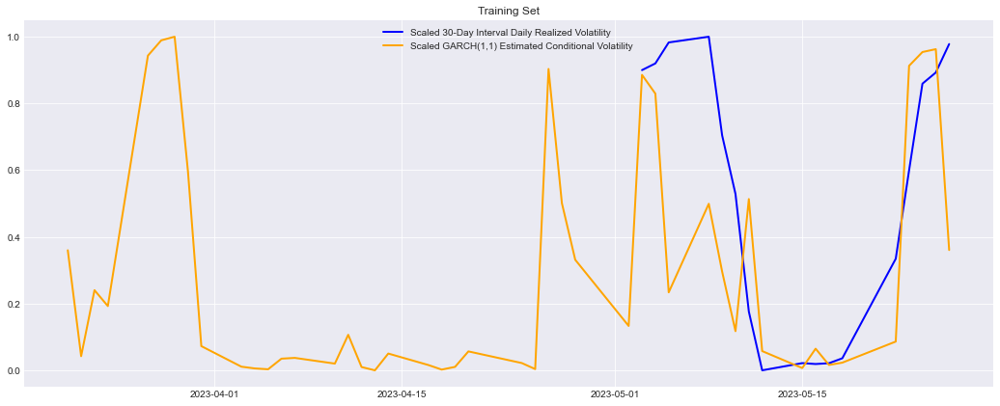

In [ ]:
import yfinance as yf

from datetime import datetime, timedelta
from sklearn.metrics import mean_squared_error as mse
from sklearn.preprocessing import MinMaxScaler
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# GET BACKWARD LOOKING REALIZED VOLATILITY
#df['vol_current'] = df.log_returns.rolling(window=INTERVAL_WINDOW)\
#                                   .apply(realized_volatility_daily)


# CONVERT TO INDICES


gm_1 = arch_model(r_train.dropna(), vol='GARCH', p=1, q=1)
result_1 = gm_1.fit(disp='on')
print()
print(result_1.summary())

def scale_tf_cond_vol(model_result):
    '''
    Scale & Transform Conditional Volatility
    Estimated by GARCH Models
    '''
    # OBTAIN ESTIMATED CONDITIONAL VOLATILITY FROM MODEL RESULT
    cond_vol = model_result.conditional_volatility

    # INITIATE SCALER
    scaler = MinMaxScaler()

    # FIT SCALER TO MODEL'S ESTIMATED CONDITIONAL VOLATILITY
    scaler = scaler.fit(cond_vol.values.reshape(-1,1))

    scaled_cond_vol = transform_volatility_to_scaler(scaler, cond_vol)
    return scaler, scaled_cond_vol

def transform_volatility_to_scaler(scaler, tf_series):
    '''
    Transform a series to a fitted scaler
    '''
    idx = tf_series.index
    output = pd.Series(scaler.transform(tf_series.values.reshape(-1,1))[:,0],
                       index=idx)
    return output

# GET VOLATILITY SCALER & SCALED CONDITIONAL VOLATILITY FROM MODEL RESULT
scaler_garch, scaled_cond_vol = scale_tf_cond_vol(result_1)

# INITIATE SCALER
scaler_vol = MinMaxScaler()

# FIT SCALER TO CURRENT VOLATILITY IN TRAINING SET
scaler_vol = scaler_vol.fit(x_train.values.reshape(-1,1))
x_train_scaled = transform_volatility_to_scaler(scaler_vol, x_train)
y_train_scaled = transform_volatility_to_scaler(scaler_vol, y_train)

# VISUALIZE MODEL'S ESTIMATED CONDITIONAL VOLATILITY
# WITH SCALED vol_current CALCULATED ABOVE
def viz_cond_vol(cond_vol_series, model_name):
    with sns.axes_style("darkgrid"):
        fig, ax = plt.subplots(figsize=(18,7))

        ax.plot(x_train_scaled, color='blue', lw=2,
                label=f'Scaled {INTERVAL_WINDOW}-Day Interval Daily Realized Volatility')
        ax.plot(cond_vol_series, color='orange', lw=2,
                label=f'Scaled {model_name} Estimated Conditional Volatility')
        ax.set_title('Training Set')
        plt.legend()
        plt.show();

viz_cond_vol(scaled_cond_vol, 'GARCH(1,1)')


In [ ]:
mypf

,XU100,My Portfolio,Index,PF_Returns,CANTE,Max Drawdown,Pct_change,MA3,MA10,My_PF_lag,lag_MA3,lag_MA10,uptrend,AR_Uptrend,logreturns
2023-03-20,"4,975.500","121,074.410",1.000,NaN,24.420,0.470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-03-21,"4,906.600","119,785.329",0.989,-0.011,24.160,0.470,-0.011,NaN,NaN,"121,074.410",NaN,NaN,NaN,"-161,135.063",-0.011
2023-03-22,"5,001.100","124,545.010",1.029,0.040,25.120,0.470,0.040,"121,801.583",NaN,"119,785.329",NaN,NaN,NaN,"161,135.063",0.039
2023-03-23,"5,062.000","128,610.571",1.062,0.033,25.940,0.470,0.033,"124,313.637",NaN,"124,545.010","121,801.583",NaN,NaN,"161,135.063",0.032
2023-03-24,"5,032.000","115,818.930",0.957,-0.099,23.360,0.470,-0.099,"122,991.504",NaN,"128,610.571","124,313.637",NaN,NaN,"-161,135.063",-0.105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31,"7,217.000","106,795.392",0.882,0.093,21.540,0.470,0.093,"99,060.910","98,421.325","97,672.671","92,615.509","98,847.713","150,000.000","161,135.063",0.089
2023-08-01,"7,168.500","102,828.992",0.849,-0.037,20.740,0.470,-0.037,"102,432.352","98,490.738","106,795.392","99,060.910","98,421.325","150,000.000","-161,135.063",-0.038
2023-08-02,"7,258.500","101,242.433",0.836,-0.015,20.420,0.470,-0.015,"103,622.272","97,905.695","102,828.992","102,432.352","98,490.738","150,000.000","-161,135.063",-0.016
2023-08-03,"7,221.500","99,358.392",0.821,-0.019,20.040,0.470,-0.019,"101,143.272","97,082.668","101,242.433","103,622.272","97,905.695","150,000.000","-161,135.063",-0.019


In [ ]:
def pct_max_drawdown(df, window=252):
    Roll_Max = df.rolling(window, min_periods=1).max()
    Daily_Drawdown = df/Roll_Max - 1
    Max_Daily_Drawdown = Daily_Drawdown.rolling(window, min_periods=1).min()
    return np.min(Max_Daily_Drawdown)*100



def OptimizationForAMaxDrawDown(DF):

    res = minimize(
      max_drawdown(DF),
      RandWeights(length),
      method = 'SLSQP',
      constraints=[{'type':'eq','fun': lambda x: np.sum(x)-1}],
      bounds=[(P_BOUND_LO, P_BOUND_HI) for i in range(length)]
    )

    return res

print('Percentage Max Drawdown =', pct_max_drawdown(mypf['My Portfolio']))



Percentage Max Drawdown = -47.046133462123365


In [ ]:
# !pip install python-docx

# import python-docx



In [ ]:
# doc = docx.Document()

# mydoc.add_paragraph("This is first paragraph of a MS Word file.")
# mydoc.save("./MM_Report.docx")

### MICROALPHAS TRAINING <a name="microalphas"></a>

In [ ]:
returns = mypf['logreturns']

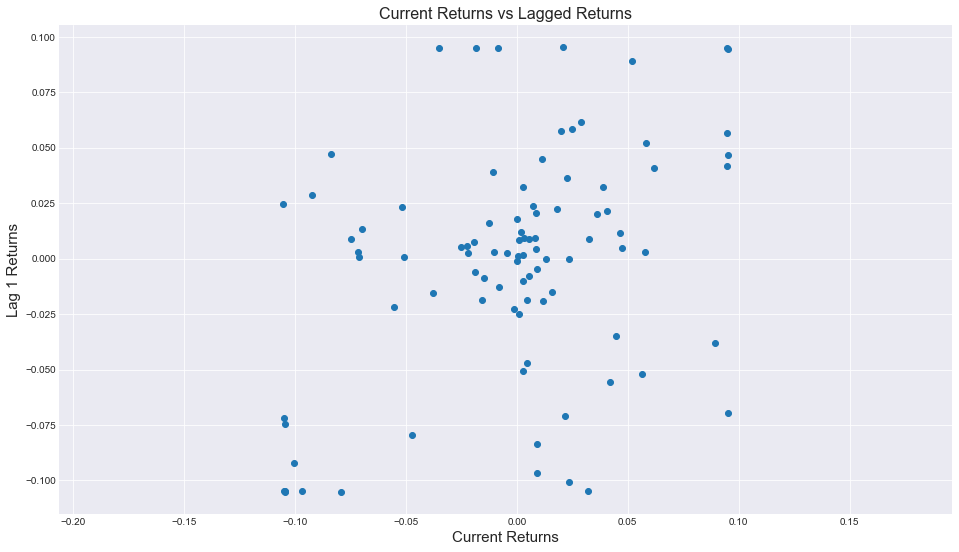

In [ ]:
plt.plot(returns[0:-1], returns[1:], 'o')

# Set the title and labels and their sizes
plt.title('Current Returns vs Lagged Returns', fontsize=16)
plt.axis('equal')
plt.xlabel('Current Returns', fontsize=15)
plt.ylabel('Lag 1 Returns', fontsize=15)
plt.show()

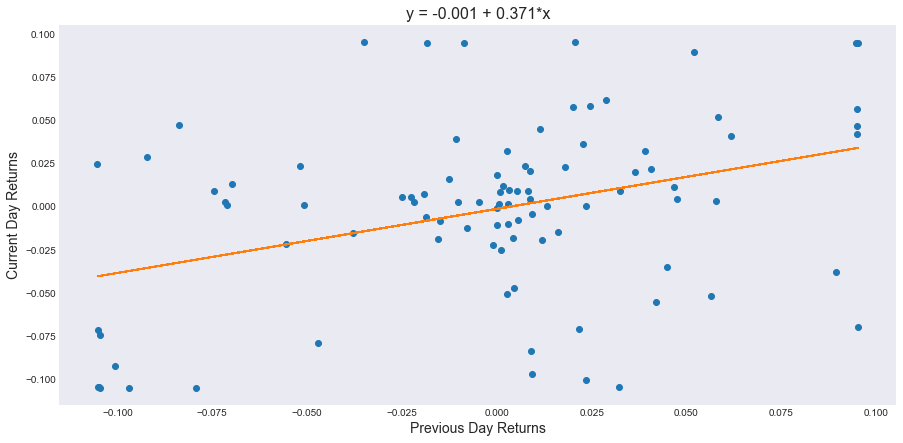

alpha = -0.00140068743311205
beta = 0.3713929777450911


In [ ]:
# Set figure size
plt.figure(figsize=(15, 7))

# Using the SPY price data from earlier, calculate the returns
# Fill invalid data points with zeros
a = returns.fillna(0)
b = a.shift(-1)
plt.plot(a, b, 'o')

# Linear regression
m = np.polyfit(a.values[:-1], b.values[:-1], 1)
xx = a
yy = np.polyval(m, xx)
plt.plot(xx, yy)
plt.grid()

# Set the title and labels and their sizes
plt.title(f'y = {m[1]:.3f} + {m[0]:.3f}*x', fontsize=16)
plt.xlabel('Previous Day Returns', fontsize=14)
plt.ylabel('Current Day Returns', fontsize=14)
plt.show()

print(f"alpha =",m[1])
print(f"beta =",m[0])




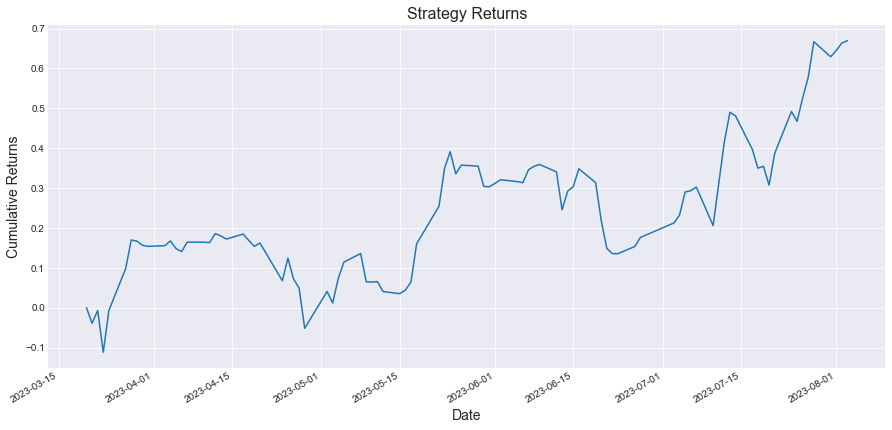

In [ ]:

plt.figure(figsize=(15, 7))

# Backtest of autocorrelated strategy
# in Pandas. Returns are shifted left to overlap current returns
# with past return's direction.
(np.sign(a)*a.shift(-1)).cumsum().plot()

# Set the title and labels and their sizes
plt.title('Strategy Returns', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Cumulative Returns', fontsize=14)
plt.show()

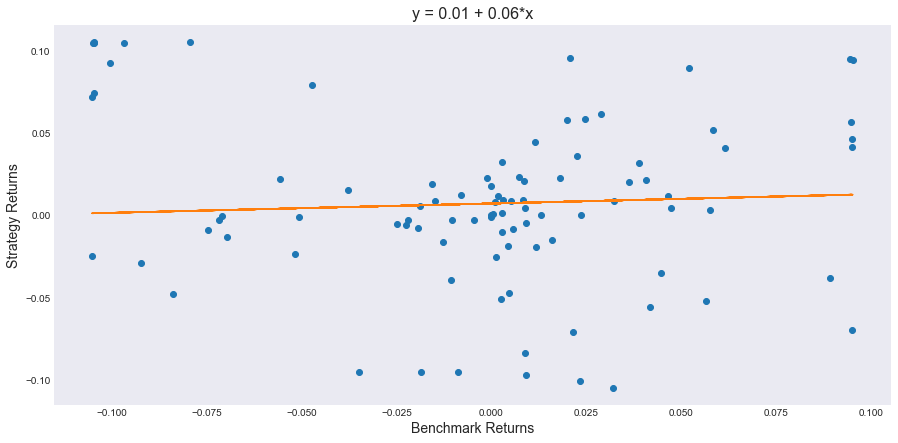

In [ ]:
# Set figure size
plt.figure(figsize=(15, 7))

# Plotting backtest returns
plt.plot(a, np.sign(a)*a.shift(-1), 'o')

# Correlating backtest returns with market returns
m = np.polyfit(a.shift(-1).fillna(0), np.sign(a.fillna(0))
               * a.shift(-1).fillna(0), 1)
xx = a
yy = np.polyval(m, xx)
plt.plot(xx, yy)
plt.grid()

# Set the title and labels and their sizes
# Print the regression equation
plt.title(f'y = {m[1]:.2f} + {m[0]:.2f}*x', fontsize=16)
plt.xlabel('Benchmark Returns', fontsize=14)
plt.ylabel('Strategy Returns', fontsize=14)
plt.show()

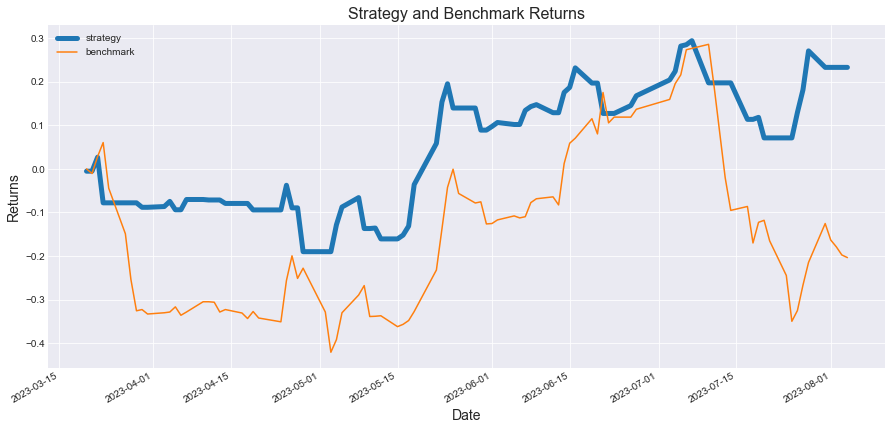

In [ ]:
# Set figure size
plt.figure(figsize=(15, 7))

# Adding benchmark returns and strategy. Division by 2
# because we are dividing the resources
strategy = ((a.shift(-1)+np.sign(a)*a.shift(-1)).fillna(0))/2

# Plotting the combined strategy
(strategy).cumsum().plot(lw=5, label='strategy', legend=True)

# Plotting the benchmark (SPY)
a.cumsum().plot(label='benchmark', legend=True)

# Set the title and labels and their sizes
plt.title('Strategy and Benchmark Returns', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Returns', fontsize=14)
plt.show()

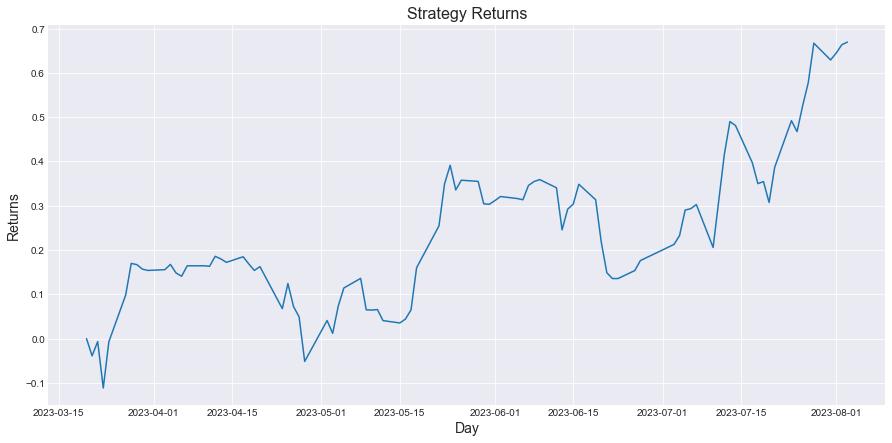

In [ ]:
# Backtesting the autocorrelated data
# by multiplying the direction (sign) of returns
# from the previous day with today's returns
# "If yesterday's returns are up (down), we expect today's returns to be up (down)"
strategy_returns = np.sign(a[0:-1])*np.array(a[1:])

# Set figure size
plt.figure(figsize=(15, 7))

# Plotting the PnL cumulative sum of the returns
plt.plot(np.cumsum(strategy_returns))

# Set the title and labels and their sizes
plt.title('Strategy Returns', fontsize=16)
plt.xlabel('Day', fontsize=14)
plt.ylabel('Returns', fontsize=14)
plt.show()

In [ ]:

rar_strat = np.mean(strategy)/np.std(strategy)*2

# Calculating the risk-adjusted return of the benchmark
rar_bm = np.mean(a)/np.std(a)*2

# Printing the results
print(f'Risk Adj Ret Strategy: {rar_strat:.3f}, Benchmark: {rar_bm:.3f}')

Risk Adj Ret Strategy: 0.134, Benchmark: -0.085


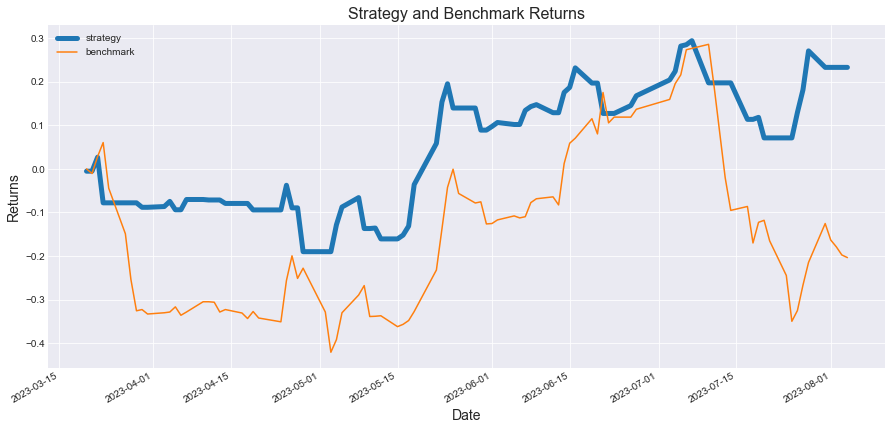

In [ ]:
# Set figure size
plt.figure(figsize=(15, 7))

# Enter the weight in the variable "strategy_weight"
strategy_weight = 0.5
buy_hold_weight = 1 - strategy_weight

# Adding benchmark returns and strategy. Division by 2
# because we are dividing the resources
strategy = ((a.shift(-1)*buy_hold_weight+np.sign(a)*a.shift(-1)*strategy_weight).fillna(0))

# Plotting the combined strategy
(strategy).cumsum().plot(lw=5,label='strategy',legend=True)

# Plotting the benchmark (SPY)
a.cumsum().plot(label='benchmark',legend=True)

# Set the title and labels and their sizes
plt.title('Strategy and Benchmark Returns', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Returns', fontsize=14)
plt.show()

### TA-LIB OPERATIONS <a name="talib_ops"></a>



In [ ]:
import talib

In [ ]:
# spy = pd.read_csv(
#     '../data_modules/spy_daily_1993_2022.csv', index_col=0)

yf_tick = yf.Ticker("CANTE.IS")
spy = yf_tick.history(interval='1d', auto_adjust=True, start=T0_START, end=T0_END, back_adjust = True, rounding=True)



In [ ]:
dir(talib)

['ACOS',
 'AD',
 'ADD',
 'ADOSC',
 'ADX',
 'ADXR',
 'APO',
 'AROON',
 'AROONOSC',
 'ASIN',
 'ATAN',
 'ATR',
 'AVGPRICE',
 'BBANDS',
 'BETA',
 'BOP',
 'CCI',
 'CDL2CROWS',
 'CDL3BLACKCROWS',
 'CDL3INSIDE',
 'CDL3LINESTRIKE',
 'CDL3OUTSIDE',
 'CDL3STARSINSOUTH',
 'CDL3WHITESOLDIERS',
 'CDLABANDONEDBABY',
 'CDLADVANCEBLOCK',
 'CDLBELTHOLD',
 'CDLBREAKAWAY',
 'CDLCLOSINGMARUBOZU',
 'CDLCONCEALBABYSWALL',
 'CDLCOUNTERATTACK',
 'CDLDARKCLOUDCOVER',
 'CDLDOJI',
 'CDLDOJISTAR',
 'CDLDRAGONFLYDOJI',
 'CDLENGULFING',
 'CDLEVENINGDOJISTAR',
 'CDLEVENINGSTAR',
 'CDLGAPSIDESIDEWHITE',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLHARAMI',
 'CDLHARAMICROSS',
 'CDLHIGHWAVE',
 'CDLHIKKAKE',
 'CDLHIKKAKEMOD',
 'CDLHOMINGPIGEON',
 'CDLIDENTICAL3CROWS',
 'CDLINNECK',
 'CDLINVERTEDHAMMER',
 'CDLKICKING',
 'CDLKICKINGBYLENGTH',
 'CDLLADDERBOTTOM',
 'CDLLONGLEGGEDDOJI',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'CDLMATCHINGLOW',
 'CDLMATHOLD',
 'CDLMORNINGDOJISTAR',
 'CDLMORNINGSTAR',
 'CDLONNECK',
 'CD

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-darkgrid')

In [ ]:
signals = {}

# Looping through all TA-Lib functions
for attr in dir(talib):

    # Extraction of chart-pattern functions
    if attr[:3] == 'CDL':

        # Calculation of signals for each chart pattern
        res = getattr(talib, attr)(spy.Open, spy.High, spy.Low, spy.Close)

        # Appending each signal vector to the signals dict
        signals[attr] = res

0:00:01.019713


'CDLXSIDEGAP3METHODS'

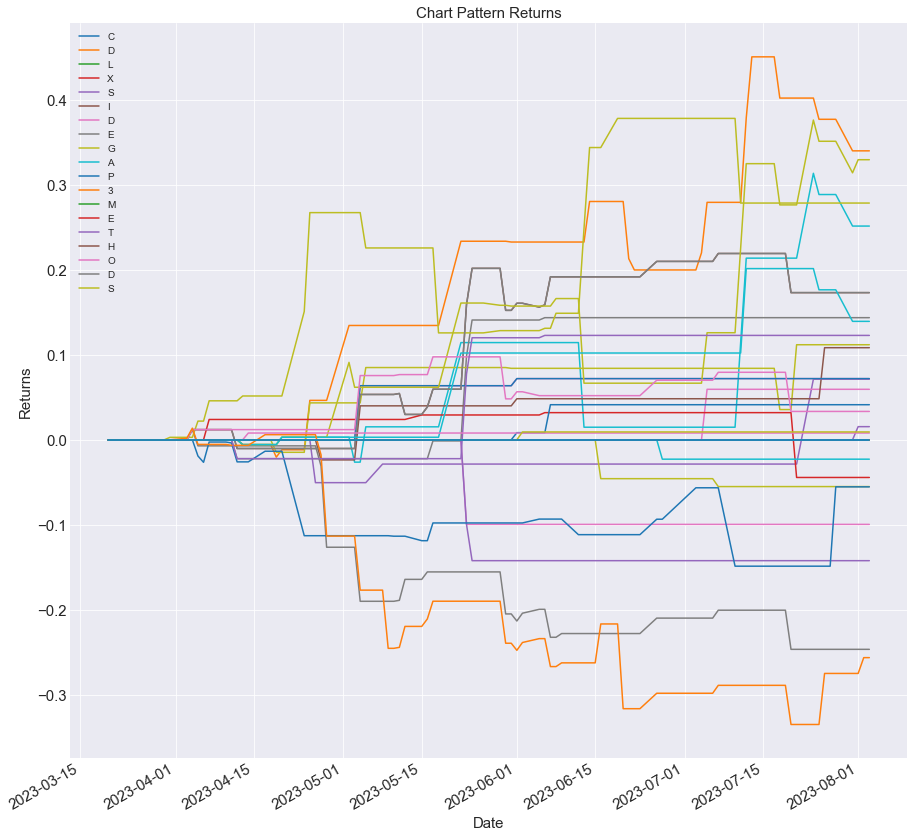

In [ ]:
# Starting the runtime clock
start = datetime.now()

# Looping through the signals for each chart pattern
for pattern in signals:

    # Running the backtest for each chart pattern
    # Signals are -100 and +100, normalise with factor 0.01
    backtest = (0.01*signals[pattern] *
                spy.Close.pct_change().shift(-1)).cumsum()

    # Plotting the backtest for chart pattern
    ax = backtest.plot(figsize=[15, 15], fontsize=15, legend=False)

    # Set the title and labels
    ax.set_ylabel('Returns', fontdict={'fontsize': 15})
    ax.set_xlabel('Date', fontdict={'fontsize': 15})
    ax.set_title('Chart Pattern Returns', fontdict={'fontsize': 15})
    ax.legend(pattern)
    # ax.plot(lw=5, label='strategy', legend=True)

# Print the runtime
print(datetime.now()-start)

pattern

Text(0.5, 1.0, 'Chart Pattern Returns')

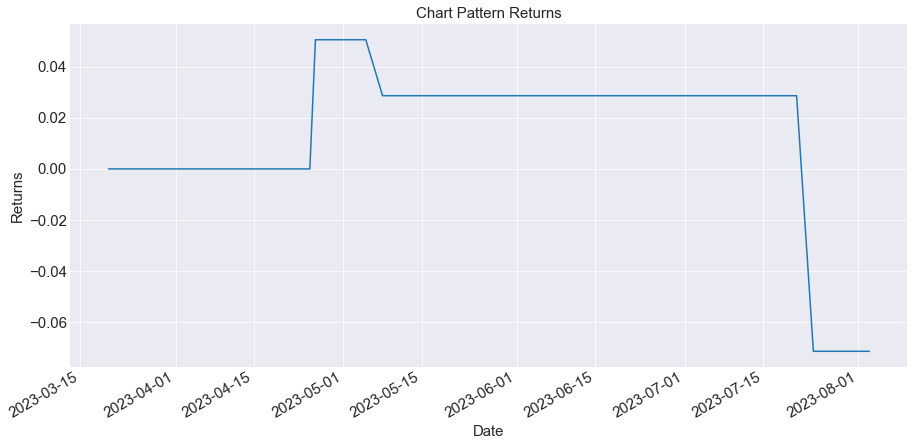

In [ ]:
# Pre-factor is negative because the signal needs to be inverted to be profitable
backtest = (-0.01*(signals['CDL3OUTSIDE'])*spy.Close.pct_change().shift(-1))


# Plot the backtest for an individual chart pattern
ax = backtest.cumsum().plot(figsize=[15, 7], fontsize=15, legend=False)

# Set the title and labels
ax.set_ylabel('Returns', fontdict={'fontsize': 15})
ax.set_xlabel('Date', fontdict={'fontsize': 15})
ax.set_title('Chart Pattern Returns', fontdict={'fontsize': 15})

Text(0.5, 1.0, 'Chart Pattern Returns vs Benchmark Returns')

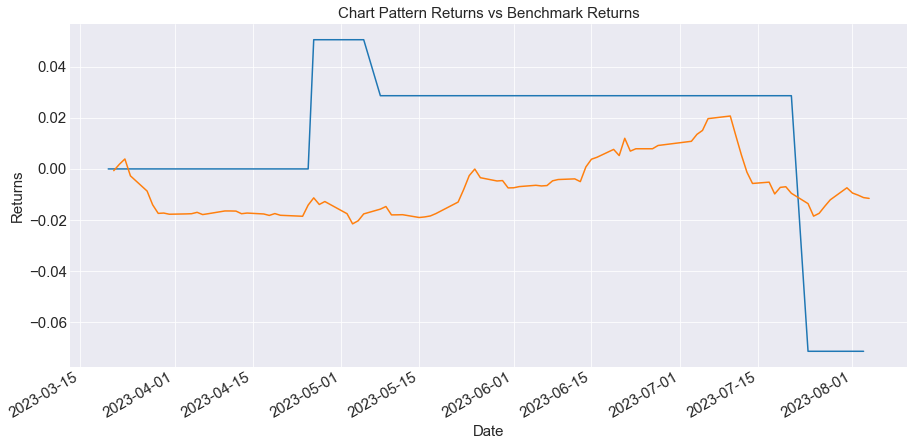

In [ ]:
# Pre-factor is negative because the signal needs to be inverted to be profitable
backtest = (-0.01*(signals['CDL3OUTSIDE'])*spy.Close.pct_change().shift(-1))

# Plot the backtest for an individual chart pattern against the benchmark
ax = backtest.cumsum().plot(figsize=[15, 7], title='Chart Pattern Returns vs Benchmark Returns',
                            xlabel='Date', ylabel='Returns', fontsize=15, legend=False)
((((spy.Close.pct_change()+1).cumprod())-1)/16).plot()

# Set the title and labels
ax.set_ylabel('Returns', fontdict={'fontsize': 15})
ax.set_xlabel('Date', fontdict={'fontsize': 15})
ax.set_title('Chart Pattern Returns vs Benchmark Returns',
             fontdict={'fontsize': 15})

### SQL OPERATIONS <a name="sql_ops"></a>

In [ ]:
!pip install sqlalchemy


[notice] A new release of pip is available: 23.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
from sqlalchemy import create_engine

# create a reference
# for sql library
engine = create_engine('sqlite://', echo = False)

df = pd.DataFrame(SELECTED_EXCHANGE)
df.to_sql('SELECTED_EXCHANGE', con = engine)

df = pd.DataFrame(stock_list)
df.to_sql('stock_list', con = engine)

df = pd.DataFrame(MYPF)
df.to_sql('MYPF', con = engine)

df = pd.DataFrame(IDEALPF)
df.to_sql('IDEALPF', con = engine)


# show the complete data
# from Employee_Data table
print(engine.execute("SELECT * FROM IDEALPF").fetchall())

[('QUAGR.IS', 1195.0, 12.47, 14901.650000000001, 85.0, 101575.0, 35.22493, 38.77433, 581.635926222935, 37871.0, 445.0, -0.18303187999083748, 0.9792486471961117, 'BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON2023-08-07'), ('HEKTS.IS', 2916.0, 4.29, 12509.64, 32.4, 94478.4, 29.57063, 36.06534, 655.2447552447552, 35225.0, 1087.0, -0.18303187999083748, 0.9792486471961117, 'BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON2023-08-07'), ('AKSEN.IS', 1117.0, 11.03, 12320.509999999998, 34.64, 38692.88, 29.12356, 14.77027, 214.05258386219407, 14426.0, 416.0, -0.18303187999083748, 0.9792486471961117, 'BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON2023-08-07'), ('ALARK.IS', 388.0, 6.63, 2572.44, 70.15, 27218.2, 6.0808, 10.39003, 958.0693815987934, 10148.0, 144.0, -0.18303187999083748, 0.9792486471961117, 'BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON2023-08-07'), ('XU100.IS', 1e-05, 3000.0, 0.030000000000000002, 5372.66, 0.053726600000000006, 7e-05, 2e-05, 79.08866666666667, 0.0, 0.0, -0.18303187999083748

In [ ]:
log_returns

,THYAO,GUBRF,HEKTS,ODAS,TOASO,AKSEN,KRDMD,QUAGR,BIMAS,TUPRS,...,ALARK,EKGYO,KOZAA,ENKAI,TURSG,ASELS,TCELL,TAVHL,GARAN,TRY=X
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-21 00:00:00,-0.018,-0.008,-0.003,0.001,0.010,-0.028,-0.029,-0.049,-0.023,-0.004,...,-0.008,-0.036,-0.014,-0.024,0.003,-0.040,-0.015,-0.014,-0.032,0.000
2023-03-22 00:00:00,0.030,0.044,0.017,0.009,0.030,0.039,0.061,-0.023,0.000,0.031,...,0.003,0.020,0.006,0.004,0.016,0.030,0.030,0.017,0.040,0.000
2023-03-23 00:00:00,0.011,-0.002,0.031,0.001,-0.005,0.002,0.017,0.046,0.004,-0.004,...,0.005,0.037,0.031,0.031,0.003,0.028,0.020,0.006,0.047,0.000
2023-03-24 00:00:00,-0.008,0.016,0.011,-0.017,0.018,0.020,-0.018,-0.008,0.004,-0.025,...,-0.014,-0.013,0.021,-0.009,0.019,-0.006,-0.016,-0.015,-0.018,0.000
2023-03-27 00:00:00,-0.026,0.008,-0.043,-0.007,0.027,-0.011,-0.008,0.075,-0.007,-0.020,...,-0.015,-0.004,-0.038,-0.010,0.012,0.005,0.041,-0.011,-0.004,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-31 00:00:00,0.001,-0.005,0.009,0.025,0.099,0.043,0.069,-0.022,-0.001,0.049,...,0.099,0.026,-0.002,0.025,0.023,0.004,-0.005,0.002,0.031,0.000
2023-08-01 00:00:00,-0.017,-0.004,0.034,-0.036,-0.005,-0.025,-0.030,-0.001,-0.009,-0.024,...,0.034,-0.017,-0.041,0.019,0.092,-0.004,-0.027,-0.023,-0.030,0.000
2023-08-02 00:00:00,0.022,-0.000,-0.018,-0.024,-0.004,-0.004,-0.028,-0.000,0.023,0.003,...,-0.013,0.004,-0.014,-0.019,-0.019,0.052,0.025,0.002,0.063,0.000


In [ ]:
# import requests
# from bs4 import BeautifulSoup

# # Yahoo login URL
# login_url = "https://login.yahoo.com/"

# # Yahoo finance page URL
# finance_url = "https://finance.yahoo.com/portfolios"

# # Your Yahoo login credentials
# username = "alperulku@yahoo.com"
# password = "khcmukzrsikoccep"

# selector = "#Col1-0-Portfolios-Proxy > main > table"

# # Create a session to maintain cookies and login information
# session = requests.Session()

# # Send a POST request to the login URL with your credentials
# response = session.post(finance_url, data={'username': username, 'password': password})

# # If the login was successful, the server should redirect you to the finance page
# if response.url == finance_url:
#     print("Login successful!")

#     # Now that you are logged in, you can access the finance page
#     response = session.get(finance_url)

#     # Parse the HTML of the page with Beautiful Soup
#     soup = BeautifulSoup(response.text, 'html.parser')

#     # Find the table using the specified selector
#     table = soup.select_one('#Col1-0-Portfolios-Proxy > main > table')

#     # Print the table HTML
#     print(table)

# else:
#     print("Login failed :(")




In [ ]:
# import requests
# import pandas as pd
# from lxml import html
# import time

# # Yahoo login URL
# login_url = "https://login.yahoo.com/"

# # Yahoo finance page URL
# finance_url = "https://finance.yahoo.com/portfolios"
# # Your Yahoo login credentials
# username = "alperulku@yahoo.com"
# password = "khcmukzrsikoccep"

# # Create a session to maintain cookies and login information
# session = requests.Session()

# # Send a POST request to the login URL with your credentials
# response = session.post(finance_url, data={'username': username, 'password': password})

# # with requests.Session() as s:
# #       ...     s.get('https://httpbin.org/get')


# # If the login was successful, the server should redirect you to the finance page
# if response.url == finance_url:
#     print("Login successful!")

#     # Now that you are logged in, you can access the finance page
#     response = session.get(finance_url)

#     # Wait for the page to fully load
#     time.sleep(5)

#     # Parse the HTML of the page with lxml
#     doc = html.fromstring(response.text)

#     # Find the table using the specified Xpath
#     table_html = doc.xpath('//*[@id="Col1-0-Portfolios-Proxy"]/main/table')

#     # If the table was found, convert it to a Pandas dataframe
#     if table_html:
#         df = pd.read_html(html.tostring(table_html[0]))[0]

#         # Display the dataframe
#         print(df)

#         # Save the dataframe as a CSV file
#         df.to_csv('yahoo_portfolio.csv', index=False)
#     else:
#         print("Table not found :(")

# else:
#     print("Login failed :(")


CHATGPT: info@markovmarkowitz.com
13 / 1

Act like a expert Python programmer. Write a new python program to: go to page https://finance.yahoo.com/portfolios, press Sign In, type username, press next, type password, press next, wait until the page data is fully refreshed then read the table with CSS Selector = table.W\(100\%\) on the web page "https://finance.yahoo.com/portfolios", including the complete data as Portfolio Name, Symbols, Market Value, Day Chg, Day Chg %, Total Chg and Total Chg % columns. Move these data to single dataframe, ignore and delete empty rows, reset the index in the dataframe and save this dataframe as a csv file. Show me comments in your program; show me the most efficient code.

(IMPLICIT WAIT COMMANDS ADDED BY ME)

In [ ]:
df

,Quantity,Purchase Price,Purchased Value,Current Price,Market Value,Start PF %,End PF %,PnL %,Purchase Amount,End Quantity,Alpha,Beta,Filename
Symbol,,,,,,,,,,,,,
QUAGR.IS,"1,195.000",12.470,"14,901.650",85.000,"101,575.000",35.225,38.774,581.636,"37,871.000",445.000,-0.183,0.979,BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON20...
HEKTS.IS,"2,916.000",4.290,"12,509.640",32.400,"94,478.400",29.571,36.065,655.245,"35,225.000","1,087.000",-0.183,0.979,BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON20...
AKSEN.IS,"1,117.000",11.030,"12,320.510",34.640,"38,692.880",29.124,14.770,214.053,"14,426.000",416.000,-0.183,0.979,BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON20...
ALARK.IS,388.000,6.630,"2,572.440",70.150,"27,218.200",6.081,10.390,958.069,"10,148.000",144.000,-0.183,0.979,BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON20...
XU100.IS,0.000,"3,000.000",0.030,"5,372.660",0.054,0.000,0.000,79.089,0.000,0.000,-0.183,0.979,BIST30_v553_HI100_LO0_BK140D-FW0D-SH-0.23-ON20...


In [ ]:
# Convert numeric entries to floating point type
for i in df.columns:
    df[i] = pd.to_numeric(df[i], errors='coerce')


df

,Quantity,Purchase Price,Purchased Value,Current Price,Market Value,Start PF %,End PF %,PnL %,Purchase Amount,End Quantity,Alpha,Beta,Filename
Symbol,,,,,,,,,,,,,
QUAGR.IS,"1,195.000",12.470,"14,901.650",85.000,"101,575.000",35.225,38.774,581.636,"37,871.000",445.000,-0.183,0.979,NaN
HEKTS.IS,"2,916.000",4.290,"12,509.640",32.400,"94,478.400",29.571,36.065,655.245,"35,225.000","1,087.000",-0.183,0.979,NaN
AKSEN.IS,"1,117.000",11.030,"12,320.510",34.640,"38,692.880",29.124,14.770,214.053,"14,426.000",416.000,-0.183,0.979,NaN
ALARK.IS,388.000,6.630,"2,572.440",70.150,"27,218.200",6.081,10.390,958.069,"10,148.000",144.000,-0.183,0.979,NaN
XU100.IS,0.000,"3,000.000",0.030,"5,372.660",0.054,0.000,0.000,79.089,0.000,0.000,-0.183,0.979,NaN


### READ CUSTOMER INFOS FROM EXCEL FILE <a name="read_customers"></a>

In [ ]:
def generate_dataframe(file):
# Read excel file into dataframe
    df = pd.read_excel(file, index_col=None, header=0)
    df.rename(columns={'Hesap Adı': 'Accrount Name', 'Hesap No': 'Account No', 'Pass': 'Pass', 'Başlangıç PF': 'Entry PF Value', 'Başlangıç Tarihi': 'Entry Date', 'Bitiş Tarihi': 'Last Date', 'Toplam İş Günü': 'Total Workdays', 'Son PF': 'Last PF Value', 'Nakit': 'Cash', 'Toplam PF': 'Total PF Value', 'Toplam % Return': 'Total Percent Return', 'Ave Daily % Return': 'Ave Daily Percent Return', 'PF Revenue': 'PF Revenue', 'PF Commission': 'PF Commission', 'YF Web Site': 'YF Web Site'}, inplace=True)
    return df


In [ ]:

Customers_DF = generate_dataframe("Müsteriler_MM.xlsx")
Customers_DF



,Account Name,Account No,Pass,Entry PF Value,Entry Date,Last Date,Total Workdays,Calender Days,Last PF Value,Cash,Total PF Value,Total Percent Return,Ave Daily Percent Return,PF Revenue,PF Comission,YF Web site
0,Murat Özbayoğlu,"920,302.000",Muralp22,"75,000.000",2022-12-16,2023-01-22,26.000,37.000,63313,83.890,"63,396.890",-0.156,-0.006,"-11,687.000","-1,168.700",https://finance.yahoo.com/portfolio/p_275/view
1,Coşkun Erşahin,"922,162.000",Cossen09,"170,000.000",2022-12-09,2023-01-22,31.000,44.000,"156,496.090",-18.370,"156,477.720",-0.079,-0.003,"-13,503.910","-1,350.391",https://finance.yahoo.com/portfolio/p_272/view/v1
2,Bora Dikmen,"921,685.000",Gedik05,"75,838.230",2022-12-08,2022-12-26,13.000,18.000,80690,NaN,"80,690.000",0.064,0.005,"4,851.770",485.177,https://finance.yahoo.com/portfolio/p_271/view/v1
3,Bora Dikmen,"921,685.000",Gedik05,"330,690.000",2022-12-26,2023-01-22,20.000,27.000,"298,850.220","1,493.000","300,343.220",-0.096,-0.005,"-31,839.780","-3,183.978",https://finance.yahoo.com/portfolio/p_271/view/v1
4,Alper Ülkü,"9,098,005.000",423817,"317,735.000",2022-12-29,2023-01-22,17.000,24.000,282372,"1,402.000","283,774.000",-0.111,-0.007,"-35,363.000","-3,536.300",https://finance.yahoo.com/portfolio/p_270/view
5,TOPLAM,NaN,NaN,"969,263.230",2022-11-17,2023-01-22,31.000,44.000,"881,721.310","2,960.520","884,681.830",-0.090,-0.003,"-87,541.920","-8,754.192",NaN
6,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,giris buraya,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Customers_DF.sort_values(by=["Last PF Value"], ascending=[True], inplace = True)
#Customers_DF

### CHECK IF BANNED ASSETS ARE INSIDE CURRENT PF <a name="BAN_CHECK"></a>

In [ ]:
def Find_Yasakli(my_list, yasakli_list):
    new_list = []
    for i in yasakli_list:
        if i in my_list:
            new_list.append(i)
        else:
            continue
    return flatten(new_list)

In [ ]:
# MYPF_Yasakli_Liste = Find_Yasakli(pd.DataFrame(MYPF.index).values,pd.DataFrame(TEDBIRLI_HISSELER).values)

In [ ]:
# MYPF_Yasakli_Liste

In [ ]:
# TEDBIRLI_DF[TEDBIRLI_DF['TEDBİRLİ HİSSE'] == 'RYSAS.IS']

### READ ALL PORTFOLIOS FROM YF PAGE <a name="read_portfolios"></a>

In [ ]:
#!pip install html5lib
# Your Yahoo login credentials

# username = "alperulku@yahoo.com"
# password = "Cold45War+2+"
# import time
# import requests
# import pandas as pd
# from bs4 import BeautifulSoup
# from selenium import webdriver


# # Yahoo finance page URL
# finance_url = "https://finance.yahoo.com/portfolios"


# # Use Selenium to automate a web browser
# driver = webdriver.Firefox()

# # Navigate to the finance page
# driver.get(finance_url)

# # Find the "Sign In" button and click it
# sign_in_button = driver.find_element_by_link_text("Sign In")
# sign_in_button.click()
# time.sleep(5)

# # Find the username field and enter your username
# username_field = driver.find_element_by_id("login-username")
# username_field.send_keys(username)
# time.sleep(5)

# # Find the "Next" button and click it
# next_button = driver.find_element_by_id("login-signin")
# next_button.click()
# time.sleep(5)

# # Find the password field and enter your password
# password_field = driver.find_element_by_id("login-passwd")
# password_field.send_keys(password)
# time.sleep(5)

# # Find the "Next" button and click it
# next_button = driver.find_element_by_id("login-signin")
# next_button.click()
# time.sleep(15)

# # Wait for the page to load


# # Get the HTML of the page
# html = driver.page_source


# # Parse the HTML with Beautiful Soup
# soup = BeautifulSoup(html, 'html.parser')

# # Find the table using the specified CSS selector
# table = soup.select_one('table.W\(100\%\)')
# time.sleep(10)


# ###table = soup.select_one('table.W(100%)')

# # Extract the data from the table
# data = []
# rows = table.find_all('tr')
# for row in rows:
#     cols = row.find_all('td')
#     cols = [ele.text.strip() for ele in cols]
#     data.append([ele for ele in cols if ele])

# # Create a Pandas dataframe from the extracted data
# df = pd.DataFrame(data, columns=['Portfolio Name', 'Symbols', 'Market Value', 'Day Chg', 'Day Chg %', 'Total Chg', 'Total Chg %'])

# #drop spaces and NA


# # Save the dataframe as a CSV file
# df.to_csv("YAHOO_PORTFOLIOS.csv")

# print("Done!")

# # Print the dataframe


# # Close the web browser
# driver.close()

# # Convert the last four columns to floating point numbers
# #df.iloc[:, -4:] = df.iloc[:, -4:].apply(pd.to_numeric)




In [ ]:
# df.dropna(inplace=True)
# df

In [ ]:
# type(table)

### STATISTICAL ARBITRAGE ALGO <a name="stat_arb"></a>

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import coint


TR_ADDITIONS= ["THYAO.IS", "PGSUS.IS"]


yf_tick = yf.Ticker("THYAO.IS")
df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
#df.dropna(how='all', inplace=True)
asset1 = df.Close

yf_tick = yf.Ticker("PGSUS.IS")
df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
#df.dropna(how='all', inplace=True)
asset2 = df.Close

# Test for cointegration
score, pvalue, _ = coint(asset1, asset2)

# Check if assets are cointegrated
if pvalue < 0.05:
    # Calculate the spread between the assets
    spread = asset1 - asset2

    # Generate a z-score for the spread
    mean_spread = spread.mean()
    std_spread = spread.std()
    z_score = (spread - mean_spread) / std_spread

    # Generate BUY/SELL signals based on z-score
    signals = np.where(z_score > 2, "SELL", np.where(z_score < -2, "BUY", "HOLD"))
    print("Assets are cointegrated.")
    print(signals)
else:
    print("Assets are not cointegrated.")


Assets are not cointegrated.


### STATISTICAL ARBITRAGE ALGO with MULTIPLE ASSETS <a name="stat_arb_multiple"></a>

In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import coint
from itertools import combinations

# Function to get the data for an asset from an exchange
def get_data_for_asset(asset_name):
    yf_tick = yf.Ticker(asset_name)
    df = yf_tick.history(interval='1d', auto_adjust=True, start=T1_START, end=T1_END, back_adjust = True, rounding=True)
    #df.dropna(how='all', inplace=True)
    return df.Close

# Function to test for cointegration and generate signals
def pairs_trading(asset_name, data, other_assets):
    base_asset = get_data_for_asset(asset_name)

    cointegrated_assets = []
    for other_asset in other_assets:
        score, pvalue, _ = coint(base_asset, get_data_for_asset(other_asset))
        if pvalue < 0.05:
            cointegrated_assets.append(other_asset)
    if cointegrated_assets:
        print(f"Cointegrated assets with {asset_name} are {cointegrated_assets}")
        for coint_asset in cointegrated_assets:
            spread = base_asset - get_data_for_asset(coint_asset)
            mean_spread = spread.mean()
            std_spread = spread.std()
            z_score = (spread - mean_spread) / std_spread
            signals = np.where(z_score > 2, "SELL", np.where(z_score < -2, "BUY", "HOLD"))
            print(f"BUY/SELL signal for {asset_name} and {coint_asset} is {signals}")
    else:
        print(f"No cointegrated assets found for {asset_name}")

# Get the data for all assets
all_assets = ["KCHOL.IS", "SAHOL.IS", "THYAO.IS", "ASELS.IS"]
# all_assets = [        "AEFES.IS",
#                       "ALARK.IS",
#                       "BTCIM.IS",
#                       "CLEBI.IS",
#                       "DGGYO.IS",
#                       "ESCOM.IS",
#                       "FRIGO.IS",
#                       "MARTI.IS",
#                       "MEPET.IS",
#                       "METUR.IS",
#                       "OZKGY.IS",
#                       "POLHO.IS",
#                       "QUAGR.IS",
#                       "SELEC.IS",
#                       "SONME.IS",
#                       "TGSAS.IS",
#                       "THYAO.IS",
#                       "VAKKO.IS",
#                       "YAPRK.IS",
#              ]


data = {}
for asset in all_assets:
    data[asset] = get_data_for_asset(asset)



In [ ]:
# Get all combinations of assets
asset_combinations = list(combinations(all_assets, 2))
asset_combinations



[('KCHOL.IS', 'SAHOL.IS'),
 ('KCHOL.IS', 'THYAO.IS'),
 ('KCHOL.IS', 'ASELS.IS'),
 ('SAHOL.IS', 'THYAO.IS'),
 ('SAHOL.IS', 'ASELS.IS'),
 ('THYAO.IS', 'ASELS.IS')]

In [ ]:
# Test for cointegration and generate signals for each combination
for asset_pair in asset_combinations:
    pairs_trading(asset_pair[0], data, [asset_pair[1]])

No cointegrated assets found for KCHOL.IS
Cointegrated assets with KCHOL.IS are ['THYAO.IS']
BUY/SELL signal for KCHOL.IS and THYAO.IS is ['HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD' 'HOLD'
 'HOLD' 'HOLD' 'HOLD' 'HOLD']
No cointegrated assets found for KCHOL.IS
No cointegrated assets found for SAHOL.IS
No cointegrated assets found for SAHOL.IS
No cointegrated assets found for THYAO.IS


In [ ]:
# Backtesting loop
# initial_capital = 100000
# portfolio_value = []
# for i in range(len(data[asset_combinations[0][0]])):
#     # Reset portfolio value
#     portfolio_value.append(initial_capital)
#     for asset_pair in asset_combinations:
#         signal = pairs_trading(asset_pair[0], data, [asset_pair[1]])
#         base_asset_data = data[asset_pair[0]][:i+1]
#         coint_asset_data = data[asset_pair[1]][:i+1]
#         spread = base_asset_data - coint_asset_data
#         mean_spread = spread.mean()
#         std_spread = spread.std()
#         z_score = (spread - mean_spread) / std_spread
#         signal = np.where(z_score > 2, "SELL", np.where(z_score < -2, "BUY", "HOLD"))

#         if signal == "SELL":
#             # Sell base asset and buy cointegrated asset
#             shares_base = portfolio_value[-1] / base_asset_data[-1]
#             shares_coint = shares_base
#             portfolio_value.append(portfolio_value[-1] + shares_coint * coint_asset_data[-1] - shares_base * base_asset_data[-1])
#         elif signal == "BUY":
#             # Buy base asset and sell cointegrated asset
#             shares_coint = portfolio_value[-1] / coint_asset_data[-1]
#             shares_base = shares_coint
#             portfolio_value.append(portfolio_value[-1] + shares_base * base_asset_data[-1] - shares_coint * coint_asset_data[-1])
#         else:
#             # Hold
#             portfolio_value.append(portfolio_value[-1])

# # Print final portfolio value
# print(f"Final portfolio value: {portfolio_value[-1]}")







### MARKOV CHAIN MODELLING OF SELECTED ASSET ###

In [ ]:
#!pip install yfinance
import pandas as pd
import numpy as np
import yfinance as yf
from sklearn.cluster import KMeans

# Download historical market data
data = yf.download('BIMAS.IS',T1_START,T1_END)
# Compute daily returns
BIMAS_return = data['Adj Close'].pct_change()
#
# Compute MArkov Probabilities of current portfolio
#ODAS_return  = mypf['ODAS'].pct_change()
#QUAGR_return = mypf['QUAGR'].pct_change()
#AKSEN_return = mypf['AKSEN'].pct_change()
#HEKTS_return = mypf['HEKTS'].pct_change()
PORTFOLIO_return = mypf['My Portfolio'].pct_change()
XU100_return = mypf['XU100'].pct_change()


# Define the states
#state_bins = [-np.inf, -0.035, -0.025, -0.015, -0.005, 0,  0.005, 0.015, 0.025, 0.035, np.inf]

# Drop the first row since it has a NaN return

def PredictNextState(datareturns):
    state_bins = [-np.inf, 0, np.inf]
    datastate = pd.cut(datareturns, bins=state_bins)
    # Calculate the transition matrix
    transition_matrix = pd.crosstab(datastate, datastate.shift(-1), normalize='index')
    # Print the transition matrix
    #print(transition_matrix)
    current_state = datastate.iloc[-1]
    #next_state = np.random.choice(transition_matrix.columns, p=transition_matrix.loc[current_state].values)
    next_state = transition_matrix.loc[current_state].idxmax()
    #print(f'Predicted next state: {next_state}')
    # Print the probabilities of all states
    state_probabilities = datastate.value_counts(normalize=True)
    print("State probabilities:")
    print(state_probabilities)

    return next_state

def PredictNextStateProbability(datareturns):
    state_bins = [-np.inf, 0, np.inf]
    datastate = pd.cut(datareturns, bins=state_bins)
    # Calculate the transition matrix
    transition_matrix = pd.crosstab(datastate, datastate.shift(-1), normalize='index')
    # Print the transition matrix
    #print(transition_matrix)
    current_state = datastate.iloc[-1]
    #next_state = np.random.choice(transition_matrix.columns, p=transition_matrix.loc[current_state].values)
    next_state = transition_matrix.loc[current_state].idxmax()
    #print(f'Predicted next state: {next_state}')
    # Print the probabilities of all states
    state_probabilities = datastate.value_counts(normalize=True)
    print("State probabilities:")
    print(state_probabilities)
    return state_probabilities[0]



print("-------------------------")
print(f"Portfolio return will be: {PredictNextState(PORTFOLIO_return)}")
print("-------------------------")
print(f"BIMAS return will be: {PredictNextState(BIMAS_return)}")
print("-------------------------")
#print(f"AKSEN return will be: {PredictNextState(AKSEN_return)}")
#print(f"QUAGR return will be: {PredictNextState(QUAGR_return)}")
#print(f"HEKTS return will be: {PredictNextState(HEKTS_return)}")
#print(f"ODAS return will be:  {PredictNextState(ODAS_return)}")
print(f"XU100 return will be: {PredictNextState(XU100_return)}")
print("-------------------------")
BIMAS_return



[*********************100%***********************]  1 of 1 completed
-------------------------
State probabilities:
(0.0, inf]    0.602
(-inf, 0.0]   0.398
Name: My Portfolio, dtype: float64
Portfolio return will be: (0.0, inf]
-------------------------
State probabilities:
(0.0, inf]    0.634
(-inf, 0.0]   0.366
Name: Adj Close, dtype: float64
BIMAS return will be: (0.0, inf]
-------------------------
State probabilities:
(0.0, inf]    0.548
(-inf, 0.0]   0.452
Name: XU100, dtype: float64
XU100 return will be: (0.0, inf]
-------------------------


Date
2023-03-20      NaN
2023-03-21   -0.023
2023-03-22    0.001
2023-03-23    0.004
2023-03-24    0.005
              ...  
2023-07-31   -0.005
2023-08-01   -0.006
2023-08-02    0.025
2023-08-03    0.037
2023-08-04    0.011
Name: Adj Close, Length: 94, dtype: float64

In [ ]:
Final_TEFAS_PF


,%,Amount in 97672 TL,sharpe,Std Dev %,Yearly Return %,Weekly Return %
TURSG.IS,52.830,"51,600.120",-0.230,2.278,16.818,0.323
THYAO.IS,29.830,"29,135.560",-0.230,2.278,16.818,0.323
GARAN.IS,17.340,"16,936.320",-0.230,2.278,16.818,0.323


In [ ]:
#input(f"End of MPT_{version}")

This backtesting code will loop through all the possible combinations of assets, test for cointegration, and generate signals for pairs trading. It will then simulate the trades based on the signals and calculate the final portfolio value. Please note that the code above is just an example and should be adapted to the specific data and requirements of your use case.


### GENERATE REPORT IN  PDF FORMAT ###

In [ ]:
# import sys
# !{sys.executable} -m pip install reportlab
# EGER YUKLENEMEYEN BIR KUTUPHANE VARSA BU ŞEKİLDE YÜKLE
# GPT-4 komutu:
# even if I loaded reportlab library by pip it gives error ModuleNotFoundError: No module named 'reportlab'. why can that be ?
os.chdir(root)

from reportlab.lib.pagesizes import A4, A3
from reportlab.platypus import SimpleDocTemplate, PageBreak, Paragraph, Image, Spacer, Frame, PageTemplate, Table, TableStyle
from reportlab.lib.styles import getSampleStyleSheet, ParagraphStyle
from reportlab.lib.units import inch
from reportlab.lib.enums import TA_CENTER
from reportlab.pdfbase import pdfmetrics
from reportlab.pdfbase.ttfonts import TTFont
from reportlab.lib import colors
from reportlab.lib import utils

import csv

Final_TEFAS_PF.to_csv(filename_statement + ".csv")
# Data from CSV
with open(filename_statement + ".csv", "r") as csvfile:
    dataTEFAS = list(csv.reader(csvfile))





style = getSampleStyleSheet()
headingStyle = ParagraphStyle('Heading1',
                           fontName="Helvetica-Bold",
                           fontSize=16,
                           parent=style['Heading2'],
                           alignment=1,
                           spaceAfter=14)


# Register a new font that supports Turkish characters
pdfmetrics.registerFont(TTFont('Times New Roman Bold Italic', 'Times New Roman Bold Italic.ttf'))


# Create a PDF with 'report.pdf' as its name
doc = SimpleDocTemplate(f"MPT_{version}_REPORTLAB.pdf", pagesize=A4)

# Prepare an empty list to store the elements to be added to the PDF
elements = []



styles = getSampleStyleSheet()
# Define a style
style_heading1 = styles['Heading1']
style_subtitle = styles['Heading2']
style_table = styles['Normal']


style_normal = styles['Normal']
style_normal.fontName = 'Times-Roman'

style_title = ParagraphStyle(name="CenteredTitle",
                             parent=styles["Title"],
                             fontName='Times-Roman',
                             fontSize=24,
                             leading=32,
                             spaceAfter=6,
                             alignment=TA_CENTER)

# Title Page
im = Image('MARKOVMAR5.1.png', 5 * inch, 2 * inch)

elements.append(im)

elements.append(Paragraph("Financial Data Report", style_title))

elements.append(Paragraph("""Dear Investor,
                          This report is brought to you by Markov Markowitz company's
                          AI Portfolio Manager""", style_normal))

# Add a space
elements.append(Spacer(1, 12))

# Add table to elements

elements.append(Spacer(1, 12))
3
elements.append(Paragraph("Executive Summary", style_heading1))


summary_text = """


"""

elements.append(Paragraph(summary_text, style_normal))

elements.append(Spacer(1, 12))

# Introduction
intro_text = f"""
1000Portfolios(TM) V{version} AI Portfolio Management System

Artificial Intelligence-Based Portfolio Design & Performance Reporting Software

Markov Markowitz Company @2022 - 2023

Python and Markdown coding: Alper Ülkü

"""
elements.append(Paragraph(intro_text, style_normal))

# Add a space
elements.append(Spacer(1, 12))

# List of your image paths
images = ["Fig_001_BIST30_Selected.jpg",
          "Fig_002_R-R_Map.jpg",
          "Fig_003_Montecarlo.jpg",
          "Fig_004_Coorelations.jpg",
          "Fig_005_RRMAP.jpg",
          "Fig_006_Ret_Tear_sheet.jpg",
          "Fig_007_StateSpaceTrend.jpg"
         ]


# get the image

# Data from CSV


# Title Page
elements.append(Paragraph("Financial Data Report", style_title))

elements.append(Paragraph("Summary", style_heading1))

summary_text = """
    ...  # Existing summary text
"""
elements.append(Paragraph(summary_text, style_normal))

elements.append(Paragraph("Introduction", style_heading1))


text = f"Merhaba, bugünün {exchange} piyasası için en iyi Sharpe Oranı'na sahip Portföyü ektedir: {filename} \r\n"

text+= f"Forward Test süresi = {FW_TEST_PERIOD} gün \r\n"
text+= f"Backtest Test süresi = {BACKTEST_PERIOD} gün \r\n"

text+="==== YARIN ICIN TAHMINLERIMIZ =========\r\n"
text+=f"Portfolio return will be: {PredictNextState(PORTFOLIO_return)}\r\n"
text+=f"BIMAS return will be: {PredictNextState(BIMAS_return)}\r\n"
# text+=f"AKSEN return will be: {PredictNextState(AKSEN_return)}\r\n"
# text+=f"QUAGR return will be: {PredictNextState(QUAGR_return)}\r\n"
# text+=f"HEKTS return will be: {PredictNextState(HEKTS_return)}\r\n"
# text+=f"ODAS return will be:  {PredictNextState(ODAS_return)}\r\n"
text+=f"XU100 return will be: {PredictNextState(XU100_return)}\r\n"

text+= "Markov Markowitz, Çankaya, Ankara, Türkiye.\r\n"
text+= "Her hakkı saklıdır. @ Markov Markowitz 2022."



elements.append(Paragraph(text, style_normal))

elements.append(PageBreak())  # start a new page

#Add a table
table_data = [
    ['Column 1', 'Column 2', 'Column 3'],  # Table header
    ['Data 1', 'Data 2', 'Data 3'],  # First row
    ['Data 4', 'Data 5', 'Data 6'],  # Second row
]



table = Table(table_data)
table.setStyle(TableStyle([('BACKGROUND', (0, 0), (-1, 0), colors.gray),
                           ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
                           ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
                           ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
                           ('FONTSIZE', (0, 0), (-1, 0), 10),
                           ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
                           ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
                           ('GRID', (0, 0), (-1, -1), 1, colors.black)]))
#elements.append(table)

table = Table(dataTEFAS)
table.setStyle(TableStyle([('BACKGROUND', (0, 0), (-1, 0), colors.gray),
                           ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
                           ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
                           ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
                           ('FONTSIZE', (0, 0), (-1, 0), 8),
                           ('BOTTOMPADDING', (0, 0), (-1, 0), 8),
                           ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
                           ('GRID', (0, 0), (-1, -1), 1, colors.black)]))
elements.append(table)



elements.append(Paragraph("Conclusion", style_heading1))
conclusion_text = """
    ...  # Existing conclusion text
"""
elements.append(Paragraph(conclusion_text, style_normal))



for i, image in enumerate(images):
    # Add an image
    elements.append(Image(image, 6*inch, 4.5*inch))

    # Add a paragraph (image title or caption)
    elements.append(Paragraph(f"<u>Figure {i+1}: {image}</u>", style_normal))

    # You could add more paragraphs for a description of the image here
    elements.append(Paragraph("Description for figure {}...".format(i+1), style_normal))

    # Add a space
    elements.append(Spacer(1, 12))


elements.append(PageBreak())  # start a new page

# Register a new page template with an A3 frame
# frame = Frame(0, 0, A3[0], A3[1])
# template = PageTemplate(frames=[frame])
# doc.addPageTemplates([template])

# # Add the large figure
# elements.append(Image("Fig_006_Ret_Tear_sheet.jpg", width=A3[0]-2*inch, height=A3[1]-2*inch))


# Conclusion
conclusion_text = """<para align=center spaceb=3>This report represents a comprehensive
overview of the financial analysis performed based on the available data. Further insights
can be derived with additional data.</para>"""
elements.append(Paragraph(conclusion_text, style_normal))

# def header(canvas, doc):
#     logo = utils.ImageReader('Fig_001_BIST30_Selected.jpg')
#     #logo = utils.ImageReader('MARKOVMAR5.1.png')
#     canvas.saveState()
#     canvas.drawImage(logo, 40, 750, width=120, height=80)
#     canvas.restoreState()


# lista = [Final_TEFAS_PF.index.values.astype(str).tolist()] + Final_TEFAS_PF.values.tolist()
# Final_TEFAS_PF = pd.DataFrame(Final_TEFAS_PF)
# lista = Final_TEFAS_PF.values.tolist()
# #lista = Final_TEFAS_PF.values.tolist()
# ts = [('ALIGN', (1,1), (-1,-1), 'CENTER'),
#      ('LINEABOVE', (0,0), (-1,0), 1, colors.purple),
#      ('LINEBELOW', (0,0), (-1,0), 1, colors.purple),
#      ('FONT', (0,0), (-1,0), 'Times-Bold'),
#      ('LINEABOVE', (0,-1), (-1,-1), 1, colors.purple),
#      ('LINEBELOW', (0,-1), (-1,-1), 0.5, colors.purple, 1, None, None, 4,1),
#      ('LINEBELOW', (0,-1), (-1,-1), 1, colors.red),
#      ('FONT', (0,-1), (-1,-1), 'Times-Bold'),
#      ('BACKGROUND',(1,1),(-2,-2),colors.green),
#      ('TEXTCOLOR',(0,0),(1,-1),colors.red)]

# table = Table(lista, style=ts)
# #table = Table(lista)

# elements.append(table)





# Build the PDF
#doc.build(elements)
doc.build(elements)




State probabilities:
(0.0, inf]    0.602
(-inf, 0.0]   0.398
Name: My Portfolio, dtype: float64
State probabilities:
(0.0, inf]    0.634
(-inf, 0.0]   0.366
Name: Adj Close, dtype: float64
State probabilities:
(0.0, inf]    0.548
(-inf, 0.0]   0.452
Name: XU100, dtype: float64


### SEND_EMAIL_THRU_GMAIL <a name="SEND_GMAIL"></a>

In [ ]:
'''

UTILITY U=019 : SEND_EMAIL_THRU_GMAIL
--------------------------------------------
- SETS variables for mail server
- SETS database to be emailed
- SETS filename to be attached
- CHANGES directory for writing the excel file
- FORMS the excel file
- SETS params for mail and its content with smtp lib
- ATTACHES file with mimetypes
- SENDS mail to my own gmail address with ssl library

'''

gmail_pass = "owypdnplmjxuofwg" #"tinvqeuucaczivic"  #uwyuympejcjvaikg
user = "alperulku1970@gmail.com"
subscribers = "alperulku1970@gmail.com"
SERVER_ADDRESS = "smtp.gmail.com"
SERVER_PORT = 587

#now = datetime.now()
Final_TEFAS_PF['Max Drawdown %'] = np.round(MaxDrawdown, 4)
IDEALPF['Max Drawdown'] = np.round(MaxDrawdown, 4)
Final_TEFAS_PF.to_csv(filename_statement + ".csv")
filename = filename_statement + ".xlsx"
shopping_list_file = 'ShoppingList.csv'
os.chdir(out)




# with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
#     #Final_TEFAS_PF.to_excel(writer, sheet_name = 'Yeni Portföy')
#     #df = pd.DataFrame(Kurallar)
#     #df.to_excel(writer, sheet_name='Kurallar')
#     df = pd.DataFrame(Performance)
#     df.to_excel(writer, sheet_name='İdeal PF Performans')
#     df = pd.DataFrame(Current_PF)
#     df.to_excel(writer, sheet_name='Mevcut PF')
#     IDEALPF.to_excel(writer, sheet_name = 'Ideal PF')
#     if FW_TEST_PERIOD !=0:
#         ShoppingList.to_excel(writer, sheet_name='Fark Alış-Satış Listesi')


with pd.ExcelWriter(filename) as writer:  # doctest: +SKIP
    #Final_TEFAS_PF.to_excel(writer, sheet_name = 'Yeni Portföy')
    #df = pd.DataFrame(Kurallar)
    #df.to_excel(writer, sheet_name='Kurallar')
    df = pd.DataFrame(Performance)
    df.to_excel(writer, sheet_name='İdeal PF Performans')
    df = pd.DataFrame(Current_PF)
    df.to_excel(writer, sheet_name='Mevcut PF')
    IDEALPF.to_excel(writer, sheet_name = 'Ideal PF')
    Final_TEFAS_PF.to_excel(writer, sheet_name = 'YF_Ideal PF')
    if FW_TEST_PERIOD !=0:
        ShoppingList.to_excel(writer, sheet_name='Fark Alış-Satış Listesi')


    # worksheet = writer.sheets['Ideal PF']
    # worksheet.insert_image('C2','RR_Plot_BIST.png')
    # writer.save()


import smtplib
from email.message import EmailMessage

msg = EmailMessage()

msg['Subject'] = filename
msg['From'] = user
msg['To'] = subscribers

text = f"Merhaba, bugünün {exchange} piyasası için en iyi Sharpe Oranı'na sahip Portföyü ektedir: {filename} \r\n"

text+= f"Forward Test süresi = {FW_TEST_PERIOD} gün \r\n"
text+= f"Backtest Test süresi = {BACKTEST_PERIOD} gün \r\n"

text+="==== YARIN ICIN TAHMINLERIMIZ =========\r\n"
text+=f"Portfolio return will be: {PredictNextState(PORTFOLIO_return)}\r\n"
#text+=f"CANTE return will be: {PredictNextState(CANTE_return)}\r\n"
#text+=f"AKSEN return will be: {PredictNextState(AKSEN_return)}\r\n"
#text+=f"QUAGR return will be: {PredictNextState(QUAGR_return)}\r\n"
#text+=f"HEKTS return will be: {PredictNextState(HEKTS_return)}\r\n"
#text+=f"ODAS return will be:  {PredictNextState(ODAS_return)}\r\n"
text+=f"XU100 return will be: {PredictNextState(XU100_return)}\r\n"

text+= "Markov Markowitz, Çankaya, Ankara, Türkiye.\r\n"
text+= "Her hakkı saklıdır. @ Markov Markowitz 2022."


msg.set_content(text)

import mimetypes

#path = f"/Users/alperulku/Desktop/Masaüstü - Alper’s Mac mini/MY BEST PORTFOLIOS/{filename}"
path = out + "/" + filename

# Guess the content type based on the file's extension.
ctype, encoding = mimetypes.guess_type(path)
if ctype is None or encoding is not None:
    ctype = 'application/octet-stream'
maintype, subtype = ctype.split('/', 1)

with open(path, 'rb') as fp:
    msg.add_attachment(fp.read(), maintype=maintype, subtype=subtype,
                       filename=filename)

path = root + "/" + "YF_IDEAL.csv"
with open(path, 'rb') as fp:
    msg.add_attachment(fp.read(), maintype=maintype, subtype=subtype,
                       filename="YF_IDEAL.csv")


path = root + "/" + f"MPT_{version}_REPORTLAB.pdf"
with open(path, 'rb') as fp:
    msg.add_attachment(fp.read(), maintype=maintype, subtype=subtype,
                       filename=f"MPT_{version}_REPORTLAB.pdf")



import ssl

# Create a SSLContext object with default settings.
context = ssl.create_default_context()

with smtplib.SMTP(SERVER_ADDRESS, SERVER_PORT) as smtp:
    smtp.ehlo()  # Say EHLO to server
    smtp.starttls(context=context)  # Puts the connection in TLS mode.
    smtp.ehlo()
    smtp.login(user, gmail_pass)
    smtp.send_message(msg)  # Auto detects the sender and recipient from header

print("mail sent with success with attachment")

State probabilities:
(0.0, inf]    0.602
(-inf, 0.0]   0.398
Name: My Portfolio, dtype: float64
State probabilities:
(0.0, inf]    0.548
(-inf, 0.0]   0.452
Name: XU100, dtype: float64
mail sent with success with attachment


In [ ]:
exchange = BIST30

In [ ]:
#SELECTED_EXCHANGE = SelectExchange(exchange)

In [ ]:
#stock_list = FilterAssetsForSharpe(SELECTED_EXCHANGE)

In [ ]:
# stock_list = AddTRYXToStockList(stock_list)

In [ ]:
# type(stock_list)

In [ ]:
                      # << 1 disinda bir degere sinirlayinca getiri azaliyo

In [ ]:
os.chdir(root)

In [ ]:
import warnings
warnings.simplefilter("ignore")
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
%matplotlib inline
import pandas as pd
import numpy as np
nifty_list = pd.read_csv('ind_nifty50list.csv')
nifty_list

,Company Name,Industry,Symbol,Series,ISIN Code,ROE
0,Adani Ports and Special Economic Zone Ltd.,SERVICES,ADANIPORTS,EQ,INE742F01042,16.300
1,Ambuja Cements Ltd.,CEMENT & CEMENT PRODUCTS,AMBUJACEM,EQ,INE742F01042,10.000
2,Asian Paints Ltd.,CONSUMER GOODS,ASIANPAINT,EQ,INE021A01026,22.700
3,Aurobindo Pharma Ltd.,Pharma,AUROPHARMA,EQ,INE021A01026,20.000
4,Axis Bank Ltd.,FINANCIAL SERVICES,AXISBANK,EQ,INE238A01034,7.000
5,Bajaj Auto Ltd.,AUTOMOBILE,BAJAJ-AUTO,EQ,INE917I01010,21.200
6,Bajaj Finance Ltd.,FINANCIAL SERVICES,BAJFINANCE,EQ,INE296A01024,19.900
7,Bharat Petroleum Corporation Ltd.,ENERGY,BPCL,EQ,INE029A01011,19.400
8,Bharti Airtel Ltd.,TELECOM,BHARTIARTL,EQ,INE397D01024,0.600
9,Indus Towers Ltd,TELECOM,INDUSTOWER,EQ,INE121J01017,17.200


In [ ]:
import pandas as pd
data = pd.read_csv('nifty_stocks_prices.csv',index_col=0)
data.index = pd.to_datetime(data.index)
data.tail(3)

,ADANIPORTS,AMBUJACEM,ASIANPAINT,AUROPHARMA,AXISBANK,BAJAJ-AUTO,BAJFINANCE,BPCL,BHARTIARTL,INDUSTOWER,...,TATAMOTORS,TATASTEEL,TECHM,UPL,ULTRACEMCO,VEDL,WIPRO,YESBANK,ZEEL,^NSEI
Date,,,,,,,,,,,,,,,,,,,,,
2022-03-24,733.450,297.050,"3,025.350",721.150,722.250,"3,583.900","6,997.550",362.600,706.350,213.800,...,433.200,"1,350.550","1,568.550",799.100,"6,351.850",411.150,610.550,12.750,298.900,"17,222.750"
2022-03-25,743.250,297.800,"3,046.950",717.600,721.250,"3,654.350","6,973.500",360.300,709.350,203.100,...,432.100,"1,338.950","1,530.550",798.550,"6,312.700",410.550,603.350,12.700,295.100,"17,153.000"
2022-03-28,735.000,291.800,"3,026.200",706.200,736.900,"3,679.750","7,004.100",359.350,735.400,209.600,...,432.750,"1,338.700","1,525.100",780.900,"6,375.000",413.100,600.400,12.600,290.100,"17,230.250"


## Daily percentage change

In [ ]:
# Calculate the percentage change for each stock
data_pct_change = data.pct_change().dropna()
data_pct_change.tail(3)

,ADANIPORTS,AMBUJACEM,ASIANPAINT,AUROPHARMA,AXISBANK,BAJAJ-AUTO,BAJFINANCE,BPCL,BHARTIARTL,INDUSTOWER,...,TATAMOTORS,TATASTEEL,TECHM,UPL,ULTRACEMCO,VEDL,WIPRO,YESBANK,ZEEL,^NSEI
Date,,,,,,,,,,,,,,,,,,,,,
2022-03-24,-0.000,-0.003,0.003,0.041,-0.006,-0.005,-0.001,-0.011,0.002,-0.000,...,-0.006,0.015,0.017,0.006,0.019,0.006,-0.001,-0.008,0.167,-0.001
2022-03-25,0.013,0.003,0.007,-0.005,-0.001,0.020,-0.003,-0.006,0.004,-0.050,...,-0.003,-0.009,-0.024,-0.001,-0.006,-0.001,-0.012,-0.004,-0.013,-0.004
2022-03-28,-0.011,-0.020,-0.007,-0.016,0.022,0.007,0.004,-0.003,0.037,0.032,...,0.002,-0.000,-0.004,-0.022,0.010,0.006,-0.005,-0.008,-0.017,0.005


---
## Calculate Beta

In [ ]:
import statsmodels.api as sm
def calc_beta(y,x):
    model = sm.OLS(y,x)
    results = model.fit()
    return results.params[0]

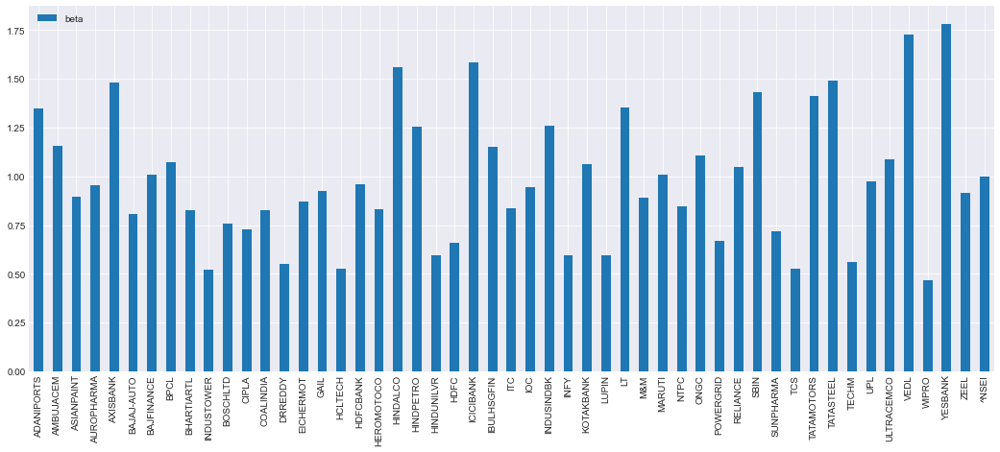

In [ ]:
beta = pd.DataFrame(index=[0])
for ticker in data_pct_change.columns:
    beta[ticker] = calc_beta(data_pct_change.loc[:'2017',ticker],data_pct_change.loc[:'2017','^NSEI'])
beta = beta.T
beta.columns = ['beta']

bar_p = beta.plot.bar(figsize=(18,7))

plt.show()

## Alpha 1: Beta < 0.7

In [ ]:
low_beta = beta[beta.values < 0.7].index
low_beta

Index(['INDUSTOWER', 'DRREDDY', 'HCLTECH', 'HINDUNILVR', 'HDFC', 'INFY',
       'LUPIN', 'POWERGRID', 'TCS', 'TECHM', 'WIPRO'],
      dtype='object')

In [ ]:
def plot_performance(stock_list, strategy_name):
    stk_returns = data_pct_change.loc['2018':, stock_list]
    (stk_returns+1).cumprod().plot(figsize=(15,7),legend="left")
    plt.title(strategy_name)
    plt.show()

    nifty = data_pct_change.loc['2018':, '^NSEI']
    portfolio = stk_returns.mean(axis=1)
    plt.title(strategy_name + ' Portfolio Performance')
    (portfolio+1).cumprod().plot(figsize=(15,7),label=strategy_name, color='purple')
    (nifty+1).cumprod().plot(figsize=(15,7),label='Nifty', color='blue')
    plt.legend()
    plt.show()
    return portfolio

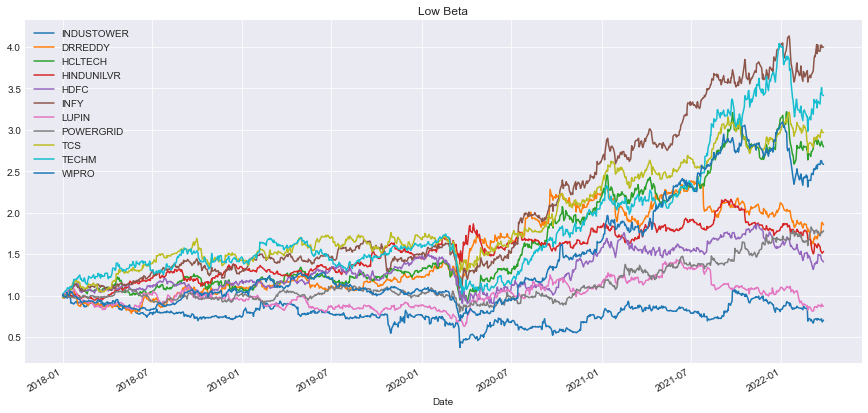

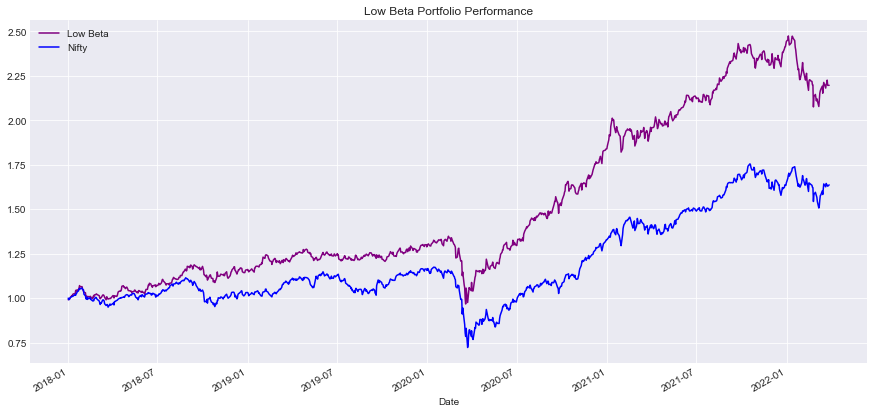

In [ ]:
p = plot_performance(low_beta, 'Low Beta')

---
## Alpha 2: ROE > 18

In [ ]:
high_roe = nifty_list[nifty_list.ROE>18].Symbol.values
high_roe




array(['ASIANPAINT', 'AUROPHARMA', 'BAJAJ-AUTO', 'BAJFINANCE', 'BPCL',
       'COALINDIA', 'EICHERMOT', 'HCLTECH', 'HEROMOTOCO', 'HINDPETRO',
       'HINDUNILVR', 'IBULHSGFIN', 'ITC', 'INFY', 'TCS', 'TECHM'],
      dtype=object)

In [ ]:
filtered_stocks = low_beta & high_roe
filtered_stocks

Index(['HCLTECH', 'HINDUNILVR', 'INFY', 'TCS', 'TECHM'], dtype='object')

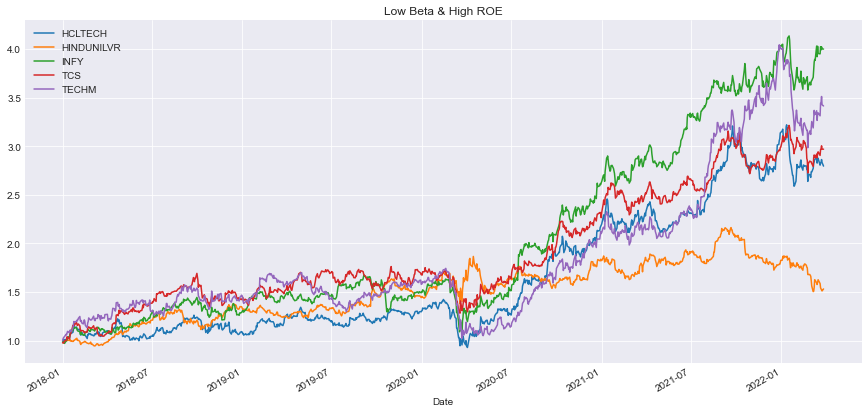

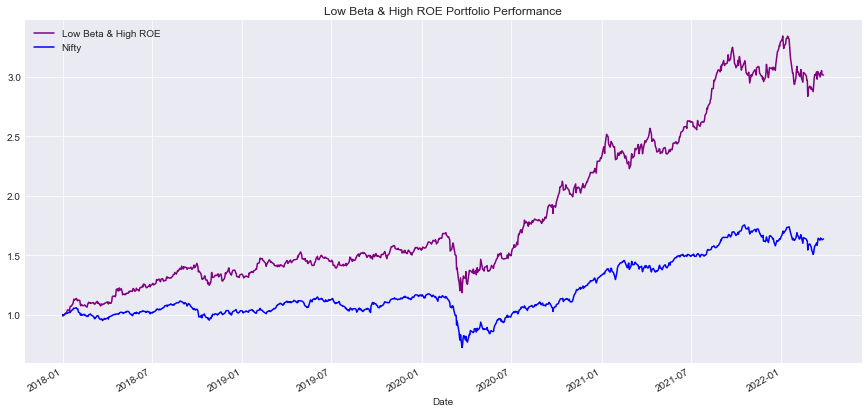

In [ ]:
portfolio = plot_performance(filtered_stocks, 'Low Beta & High ROE')

<div class="alert alert-block alert-danger">
    <b>Pro Tip</b>: Don't try to over optimize the beta and ROE threshold as it will lead to overfitting and reduce the predictive value of your strategy.
</div>

---
## Detailed Performance Analysis

Start date,2018-01-01
End date,2022-03-28
Total months,49
,Backtest
Annual return,30.457%
Cumulative returns,201.497%
Annual volatility,21.593%
Sharpe ratio,1.34
Calmar ratio,1.02
Stability,0.90
Max drawdown,-29.935%


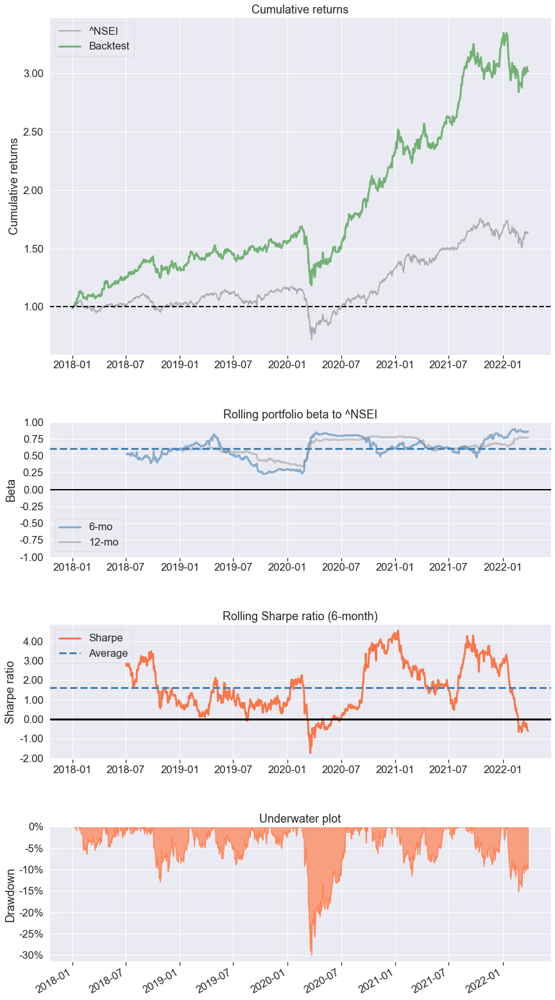

In [ ]:
import pyfolio as pf
pf.create_simple_tear_sheet(portfolio,benchmark_rets=data_pct_change.loc['2018':, '^NSEI'])

<div class="alert alert-block alert-success">
    <h2> Further Improvements </h2><BR>
    1. Rebalance the portfolio on monthly or quarterly basis.<BR>
    2. Backtest the strategy on different markets such as US equities, local equities, bond markets.<BR>
    3. Add more fundamental factors such as ROCE, Debt to Equity to include good quality stocks in your portfolio.
    

## References
1. [Betting Against Beta](https://www.sciencedirect.com/science/article/pii/S0304405X13002675)
2. [Quality Minus Junk](https://link.springer.com/article/10.1007/s11142-018-9470-2)
2. Nifty50 Historical Constituents Data: [Market cap and Weightage Report](https://www1.nseindia.com/products/content/equities/indices/archieve_indices.htm)
3. Screener.in
<BR><BR>

In [ ]:
from datetime import datetime
import lxml
from lxml import html
import requests
import numpy as np
import pandas as pd

symbol = 'BIMAS.IS'

url = 'https://finance.yahoo.com/quote/' + symbol + '/balance-sheet?p=' + symbol

# Set up the request headers that we're going to use, to simulate
# a request by the Chrome browser. Simulating a request from a browser
# is generally good practice when building a scraper
headers = {
    'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3',
    'Accept-Encoding': 'gzip, deflate, br',
    'Accept-Language': 'en-US,en;q=0.9',
    'Cache-Control': 'max-age=0',
    'Connection': 'close',
    'DNT': '1', # Do Not Track Request Header
    'Pragma': 'no-cache',
    'Referrer': 'https://google.com',
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.107 Safari/537.36'
}

# Fetch the page that we're going to parse, using the request headers
# defined above
page = requests.get(url, headers=headers)

# Parse the page with LXML, so that we can start doing some XPATH queries
# to extract the data that we want
tree = html.fromstring(page.content)

# Smoke test that we fetched the page by fetching and displaying the H1 element
tree.xpath("//h1/text()")

['BIM Birlesik Magazalar A.S. (BIMAS.IS)']

In [ ]:
table_rows = tree.xpath("//div[contains(@class, 'D(tbr)')]")

# Ensure that some table rows are found; if none are found, then it's possible
# that Yahoo Finance has changed their page layout, or have detected
# that you're scraping the page.
assert len(table_rows) > 0

parsed_rows = []

for table_row in table_rows:
    parsed_row = []
    el = table_row.xpath("./div")

    none_count = 0

    for rs in el:
        try:
            (text,) = rs.xpath('.//span/text()[1]')
            parsed_row.append(text)
        except ValueError:
            parsed_row.append(np.NaN)
            none_count += 1

    if (none_count < 4):
        parsed_rows.append(parsed_row)

df = pd.DataFrame(parsed_rows)
df

,0,1,2,3,4
0,Breakdown,12/31/2022,12/31/2021,12/31/2020,12/31/2019
1,Total Assets,"64,684,433","30,412,122","23,430,292","15,173,565"
2,Total Liabilities Net Minority Interest,"39,275,030","22,603,050","16,254,605","10,936,275"
3,Total Equity Gross Minority Interest,"25,409,403","7,809,072","7,175,687","4,237,290"
4,Total Capitalization,"25,200,975","7,605,615","7,175,687","4,237,290"
5,Common Stock Equity,"25,200,975","7,605,615","7,175,687","4,237,290"
6,Capital Lease Obligations,"11,910,848","8,040,869","5,961,885","4,264,567"
7,Net Tangible Assets,"25,135,941","7,511,139","7,132,226","4,198,870"
8,Working Capital,"-714,885","-1,853,479","114,998","-1,191,864"
9,Invested Capital,"25,200,975","7,706,790","7,307,108","4,284,620"


In [ ]:
df = pd.DataFrame(parsed_rows)
df = df.set_index(0) # Set the index to the first column: 'Period Ending'.
df = df.transpose() # Transpose the DataFrame, so that our header contains the account names

# Rename the "Breakdown" column to "Date"
cols = list(df.columns)
cols[0] = 'Date'
df = df.set_axis(cols, axis='columns', inplace=False)

df

,Date,Total Assets,Total Liabilities Net Minority Interest,Total Equity Gross Minority Interest,Total Capitalization,Common Stock Equity,Capital Lease Obligations,Net Tangible Assets,Working Capital,Invested Capital,Tangible Book Value,Total Debt,Share Issued,Ordinary Shares Number,Treasury Shares Number
1,12/31/2022,"64,684,433","39,275,030","25,409,403","25,200,975","25,200,975","11,910,848","25,135,941","-714,885","25,200,975","25,135,941","11,910,848","607,200","597,842","9,358"
2,12/31/2021,"30,412,122","22,603,050","7,809,072","7,605,615","7,605,615","8,040,869","7,511,139","-1,853,479","7,706,790","7,511,139","8,142,044","607,200","598,832","8,368"
3,12/31/2020,"23,430,292","16,254,605","7,175,687","7,175,687","7,175,687","5,961,885","7,132,226","114,998","7,307,108","7,132,226","6,093,306","607,200","601,529","5,671"
4,12/31/2019,"15,173,565","10,936,275","4,237,290","4,237,290","4,237,290","4,264,567","4,198,870","-1,191,864","4,284,620","4,198,870","4,311,897","607,200","607,200",NaN


In [ ]:
numeric_columns = list(df.columns)[1::] # Take all columns, except the first (which is the 'Date' column)

for column_name in numeric_columns:
    df[column_name] = df[column_name].str.replace(',', '') # Remove the thousands separator
    df[column_name] = df[column_name].astype(np.float64) # Convert the column to float64

df.dtypes

Date                                        object
Total Assets                               float64
Total Liabilities Net Minority Interest    float64
Total Equity Gross Minority Interest       float64
Total Capitalization                       float64
Common Stock Equity                        float64
Capital Lease Obligations                  float64
Net Tangible Assets                        float64
Working Capital                            float64
Invested Capital                           float64
Tangible Book Value                        float64
Total Debt                                 float64
Share Issued                               float64
Ordinary Shares Number                     float64
Treasury Shares Number                     float64
dtype: object

In [ ]:
from datetime import datetime
import lxml
from lxml import html
import requests
import numpy as np
import pandas as pd

def get_page(url):
    # Set up the request headers that we're going to use, to simulate
    # a request by the Chrome browser. Simulating a request from a browser
    # is generally good practice when building a scraper
    headers = {
        'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3',
        'Accept-Encoding': 'gzip, deflate, br',
        'Accept-Language': 'en-US,en;q=0.9',
        'Cache-Control': 'max-age=0',
        'Connection': 'close',
        'DNT': '1', # Do Not Track Request Header
        'Pragma': 'no-cache',
        'Referrer': 'https://google.com',
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.107 Safari/537.36'
    }

    return requests.get(url, headers=headers)

def parse_rows(table_rows):
    parsed_rows = []

    for table_row in table_rows:
        parsed_row = []
        el = table_row.xpath("./div")

        none_count = 0

        for rs in el:
            try:
                (text,) = rs.xpath('.//span/text()[1]')
                parsed_row.append(text)
            except ValueError:
                parsed_row.append(np.NaN)
                none_count += 1

        if (none_count < 4):
            parsed_rows.append(parsed_row)

    return pd.DataFrame(parsed_rows)

def clean_data(df):
    df = df.set_index(0) # Set the index to the first column: 'Period Ending'.
    df = df.transpose() # Transpose the DataFrame, so that our header contains the account names

    # Rename the "Breakdown" column to "Date"
    cols = list(df.columns)
    cols[0] = 'Date'
    df = df.set_axis(cols, axis='columns', inplace=False)

    numeric_columns = list(df.columns)[1::] # Take all columns, except the first (which is the 'Date' column)

    for column_index in range(1, len(df.columns)): # Take all columns, except the first (which is the 'Date' column)
        df.iloc[:,column_index] = df.iloc[:,column_index].str.replace(',', '') # Remove the thousands separator
        df.iloc[:,column_index] = df.iloc[:,column_index].astype(np.float64) # Convert the column to float64

    return df

def scrape_table(url):
    # Fetch the page that we're going to parse
    page = get_page(url);

    # Parse the page with LXML, so that we can start doing some XPATH queries
    # to extract the data that we want
    tree = html.fromstring(page.content)

    # Fetch all div elements which have class 'D(tbr)'
    table_rows = tree.xpath("//div[contains(@class, 'D(tbr)')]")

    # Ensure that some table rows are found; if none are found, then it's possible
    # that Yahoo Finance has changed their page layout, or have detected
    # that you're scraping the page.
    assert len(table_rows) > 0

    df = parse_rows(table_rows)
    df = clean_data(df)

    return df

In [ ]:
df_income=scrape_table('https://finance.yahoo.com/quote/' + symbol + '/financials?p=' + symbol)

In [ ]:
df_income

,Date,Total Revenue,Cost of Revenue,Gross Profit,Operating Expense,Operating Income,Net Non Operating Interest Income Expense,Pretax Income,Tax Provision,Net Income Common Stockholders,...,Net Interest Income,EBIT,Reconciled Cost of Revenue,Reconciled Depreciation,Net Income from Continuing Operation Net Minority Interest,Total Unusual Items Excluding Goodwill,Total Unusual Items,Normalized EBITDA,Tax Rate for Calcs,Tax Effect of Unusual Items
1,ttm,"122,727,566.000","100,237,240.000","22,490,326.000","15,143,375.000","7,346,951.000","-1,023,541.000","6,963,844.000","1,516,460.000","5,431,760.000",...,"-1,023,541.000","8,023,579.000","100,237,240.000","2,321,166.000","5,431,760.000","-94,138.000","-94,138.000","10,438,883.000",0.000,"-20,500.000"
2,12/31/2022,"147,715,566.000","120,941,907.000","26,773,659.000","17,203,724.000","9,569,935.000","-1,151,891.000","8,798,889.000","640,038.000","8,156,913.000",...,"-1,151,891.000","9,974,764.000","120,941,907.000","2,592,840.000","8,156,913.000","30,944.000","30,944.000","12,536,660.000",0.000,"2,251.000"
3,12/31/2021,"70,526,679.000","57,112,637.000","13,414,042.000","9,260,304.000","4,153,738.000","-794,539.000","3,909,625.000","958,915.000","2,932,482.000",...,"-794,539.000","4,744,271.000","57,112,637.000","1,802,658.000","2,932,482.000","1,234.000","1,234.000","6,545,695.000",0.000,302.664
4,12/31/2020,"55,495,364.000","45,374,131.000","10,121,233.000","6,335,677.000","3,785,556.000","-613,978.000","3,351,658.000","744,843.000","2,606,815.000",...,"-613,978.000","4,078,588.000","45,374,131.000","1,370,073.000","2,606,815.000",NaN,NaN,"5,448,661.000",0.000,0.000
5,12/31/2019,"40,211,942.000","33,226,484.000","6,985,458.000","4,843,158.000","2,142,300.000","-664,171.000","1,590,874.000","365,997.000","1,224,877.000",...,"-664,171.000","2,224,813.000","33,226,484.000","1,082,616.000","1,224,877.000",0.000,0.000,"3,307,429.000",0.000,0.000


In [ ]:
df_income.columns

Index(['Date', 'Total Revenue', 'Cost of Revenue', 'Gross Profit',
       'Operating Expense', 'Operating Income',
       'Net Non Operating Interest Income Expense', 'Pretax Income',
       'Tax Provision', 'Net Income Common Stockholders',
       'Diluted NI Available to Com Stockholders', 'Basic Average Shares',
       'Diluted Average Shares', 'Total Operating Income as Reported',
       'Rent Expense Supplemental', 'Total Expenses',
       'Net Income from Continuing & Discontinued Operation',
       'Normalized Income', 'Interest Income', 'Interest Expense',
       'Net Interest Income', 'EBIT', 'Reconciled Cost of Revenue',
       'Reconciled Depreciation',
       'Net Income from Continuing Operation Net Minority Interest',
       'Total Unusual Items Excluding Goodwill', 'Total Unusual Items',
       'Normalized EBITDA', 'Tax Rate for Calcs',
       'Tax Effect of Unusual Items'],
      dtype='object')

In [ ]:
BS_analysis = df# copy columns of dataframe
BS_analysis

,Date,Total Assets,Total Liabilities Net Minority Interest,Total Equity Gross Minority Interest,Total Capitalization,Common Stock Equity,Capital Lease Obligations,Net Tangible Assets,Working Capital,Invested Capital,Tangible Book Value,Total Debt,Share Issued,Ordinary Shares Number,Treasury Shares Number
1,12/31/2022,"64,684,433.000","39,275,030.000","25,409,403.000","25,200,975.000","25,200,975.000","11,910,848.000","25,135,941.000","-714,885.000","25,200,975.000","25,135,941.000","11,910,848.000","607,200.000","597,842.000","9,358.000"
2,12/31/2021,"30,412,122.000","22,603,050.000","7,809,072.000","7,605,615.000","7,605,615.000","8,040,869.000","7,511,139.000","-1,853,479.000","7,706,790.000","7,511,139.000","8,142,044.000","607,200.000","598,832.000","8,368.000"
3,12/31/2020,"23,430,292.000","16,254,605.000","7,175,687.000","7,175,687.000","7,175,687.000","5,961,885.000","7,132,226.000","114,998.000","7,307,108.000","7,132,226.000","6,093,306.000","607,200.000","601,529.000","5,671.000"
4,12/31/2019,"15,173,565.000","10,936,275.000","4,237,290.000","4,237,290.000","4,237,290.000","4,264,567.000","4,198,870.000","-1,191,864.000","4,284,620.000","4,198,870.000","4,311,897.000","607,200.000","607,200.000",NaN


## Working Capital Per Dollar of Sales = Working Capital ÷ Total Sales
Total Sales is from Income Statement

In [ ]:
current_assets = BS_analysis['Total Assets']
current_liabilities = BS_analysis['Total Liabilities Net Minority Interest']
working_capital = current_assets - current_liabilities
working_capital
total_sales = df_income['Total Revenue']
working_capital_per_dollar_of_sales = working_capital / total_sales
BS_analysis['Working Capital per Dollar of Sales'] = working_capital # copy columns of dataframe
BS_analysis

,Date,Total Assets,Total Liabilities Net Minority Interest,Total Equity Gross Minority Interest,Total Capitalization,Common Stock Equity,Capital Lease Obligations,Net Tangible Assets,Working Capital,Invested Capital,Tangible Book Value,Total Debt,Share Issued,Ordinary Shares Number,Treasury Shares Number,Working Capital per Dollar of Sales
1,12/31/2022,"64,684,433.000","39,275,030.000","25,409,403.000","25,200,975.000","25,200,975.000","11,910,848.000","25,135,941.000","-714,885.000","25,200,975.000","25,135,941.000","11,910,848.000","607,200.000","597,842.000","9,358.000","25,409,403.000"
2,12/31/2021,"30,412,122.000","22,603,050.000","7,809,072.000","7,605,615.000","7,605,615.000","8,040,869.000","7,511,139.000","-1,853,479.000","7,706,790.000","7,511,139.000","8,142,044.000","607,200.000","598,832.000","8,368.000","7,809,072.000"
3,12/31/2020,"23,430,292.000","16,254,605.000","7,175,687.000","7,175,687.000","7,175,687.000","5,961,885.000","7,132,226.000","114,998.000","7,307,108.000","7,132,226.000","6,093,306.000","607,200.000","601,529.000","5,671.000","7,175,687.000"
4,12/31/2019,"15,173,565.000","10,936,275.000","4,237,290.000","4,237,290.000","4,237,290.000","4,264,567.000","4,198,870.000","-1,191,864.000","4,284,620.000","4,198,870.000","4,311,897.000","607,200.000","607,200.000",NaN,"4,237,290.000"


## Current Ratio = Current Assets ÷ Current Liabilities

In [ ]:
current_ratio = current_assets / current_liabilities
BS_analysis['Current Ratio'] = current_ratio
BS_analysis

,Date,Total Assets,Total Liabilities Net Minority Interest,Total Equity Gross Minority Interest,Total Capitalization,Common Stock Equity,Capital Lease Obligations,Net Tangible Assets,Working Capital,Invested Capital,Tangible Book Value,Total Debt,Share Issued,Ordinary Shares Number,Treasury Shares Number,Working Capital per Dollar of Sales,Current Ratio
1,12/31/2022,"64,684,433.000","39,275,030.000","25,409,403.000","25,200,975.000","25,200,975.000","11,910,848.000","25,135,941.000","-714,885.000","25,200,975.000","25,135,941.000","11,910,848.000","607,200.000","597,842.000","9,358.000","25,409,403.000",1.647
2,12/31/2021,"30,412,122.000","22,603,050.000","7,809,072.000","7,605,615.000","7,605,615.000","8,040,869.000","7,511,139.000","-1,853,479.000","7,706,790.000","7,511,139.000","8,142,044.000","607,200.000","598,832.000","8,368.000","7,809,072.000",1.345
3,12/31/2020,"23,430,292.000","16,254,605.000","7,175,687.000","7,175,687.000","7,175,687.000","5,961,885.000","7,132,226.000","114,998.000","7,307,108.000","7,132,226.000","6,093,306.000","607,200.000","601,529.000","5,671.000","7,175,687.000",1.441
4,12/31/2019,"15,173,565.000","10,936,275.000","4,237,290.000","4,237,290.000","4,237,290.000","4,264,567.000","4,198,870.000","-1,191,864.000","4,284,620.000","4,198,870.000","4,311,897.000","607,200.000","607,200.000",NaN,"4,237,290.000",1.387


## debt-to-equity ratio = total liabilities ÷ shareholders' equity

In [ ]:
total_liabilities = df['Total Liabilities Net Minority Interest']
shareholders_equity = df['Common Stock Equity']
debt2equity_ratio = total_liabilities / shareholders_equity
BS_analysis['Debt to Equity Ratio'] = debt2equity_ratio
BS_analysis

,Date,Total Assets,Total Liabilities Net Minority Interest,Total Equity Gross Minority Interest,Total Capitalization,Common Stock Equity,Capital Lease Obligations,Net Tangible Assets,Working Capital,Invested Capital,Tangible Book Value,Total Debt,Share Issued,Ordinary Shares Number,Treasury Shares Number,Working Capital per Dollar of Sales,Current Ratio,Debt to Equity Ratio
1,12/31/2022,"64,684,433.000","39,275,030.000","25,409,403.000","25,200,975.000","25,200,975.000","11,910,848.000","25,135,941.000","-714,885.000","25,200,975.000","25,135,941.000","11,910,848.000","607,200.000","597,842.000","9,358.000","25,409,403.000",1.647,1.558
2,12/31/2021,"30,412,122.000","22,603,050.000","7,809,072.000","7,605,615.000","7,605,615.000","8,040,869.000","7,511,139.000","-1,853,479.000","7,706,790.000","7,511,139.000","8,142,044.000","607,200.000","598,832.000","8,368.000","7,809,072.000",1.345,2.972
3,12/31/2020,"23,430,292.000","16,254,605.000","7,175,687.000","7,175,687.000","7,175,687.000","5,961,885.000","7,132,226.000","114,998.000","7,307,108.000","7,132,226.000","6,093,306.000","607,200.000","601,529.000","5,671.000","7,175,687.000",1.441,2.265
4,12/31/2019,"15,173,565.000","10,936,275.000","4,237,290.000","4,237,290.000","4,237,290.000","4,264,567.000","4,198,870.000","-1,191,864.000","4,284,620.000","4,198,870.000","4,311,897.000","607,200.000","607,200.000",NaN,"4,237,290.000",1.387,2.581


## Receivable Turnover = Net Credit Sales ÷ Average Net Receivables for the Period
Net Credit Sales is from Income Statement

In [ ]:
net_credit_sales = df_income['Net Income from Continuing Operation Net Minority Interest']
average_net_receivables_for_the_period = df['Tangible Book Value']
receivable_turnover = net_credit_sales / average_net_receivables_for_the_period
BS_analysis['Receivable Turnover'] = receivable_turnover
BS_analysis

,Date,Total Assets,Total Liabilities Net Minority Interest,Total Equity Gross Minority Interest,Total Capitalization,Common Stock Equity,Capital Lease Obligations,Net Tangible Assets,Working Capital,Invested Capital,Tangible Book Value,Total Debt,Share Issued,Ordinary Shares Number,Treasury Shares Number,Working Capital per Dollar of Sales,Current Ratio,Debt to Equity Ratio,Receivable Turnover
1,12/31/2022,"64,684,433.000","39,275,030.000","25,409,403.000","25,200,975.000","25,200,975.000","11,910,848.000","25,135,941.000","-714,885.000","25,200,975.000","25,135,941.000","11,910,848.000","607,200.000","597,842.000","9,358.000","25,409,403.000",1.647,1.558,0.216
2,12/31/2021,"30,412,122.000","22,603,050.000","7,809,072.000","7,605,615.000","7,605,615.000","8,040,869.000","7,511,139.000","-1,853,479.000","7,706,790.000","7,511,139.000","8,142,044.000","607,200.000","598,832.000","8,368.000","7,809,072.000",1.345,2.972,1.086
3,12/31/2020,"23,430,292.000","16,254,605.000","7,175,687.000","7,175,687.000","7,175,687.000","5,961,885.000","7,132,226.000","114,998.000","7,307,108.000","7,132,226.000","6,093,306.000","607,200.000","601,529.000","5,671.000","7,175,687.000",1.441,2.265,0.411
4,12/31/2019,"15,173,565.000","10,936,275.000","4,237,290.000","4,237,290.000","4,237,290.000","4,264,567.000","4,198,870.000","-1,191,864.000","4,284,620.000","4,198,870.000","4,311,897.000","607,200.000","607,200.000",NaN,"4,237,290.000",1.387,2.581,0.621


## You can calculate any financial ratios with formulae

Thanks for looking into the Notebook:)


In [ ]:
def ConvertTimeSeriesToReturns(pf_data):

    log_returns = np.log(pf_data/pf_data.shift(1))
    return log_returns



In [ ]:
def ConvertTimeseriesToUSD(p):

    print("Converting data to USD...")
    print(70*'=')

    # new_names = []
    # for i in stock_list:
    #     sl = i.split('.',maxsplit = 1)
    #     new_names.append(sl[0])
    # for i in new_names:
    #         if i != 'GC=F' and i != 'CL=F':
    #             p[i] = pd.Series(p[i] / p['TRY=X'])
    for i in p.columns :
        p[i] = pd.Series(p[i] / p['TRY=X'])
        # p = p[i].astype(float)/p["TRY=X"].astype(float)

    return p


## MARKOV PROCESS FOR INDIVIDUAL STOCK RETURN ANALYSIS


In [ ]:

stock = yf.download('EUPWR.IS',T0_START,T0_END)['Adj Close']
usdtry = yf.download('TRY=X',T0_START,T0_END)['Adj Close']

for i in np.arange(0,len(stock)):
    stock[i] = stock[i]/usdtry[i]


p = np.round(PredictNextStateProbability(stock.pct_change()),4)
p


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
State probabilities:
(0.0, inf]    0.632
(-inf, 0.0]   0.368
Name: Adj Close, dtype: float64


0.6324

In [ ]:
# LIBRARIES WE USE IN THE NOTEBOOK
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import rand, seed
from scipy.stats import norm
# seed random number generator
seed(12345)


TARGET_PURSE = 110
INIT_PURSE = 100

N_STATES = TARGET_PURSE + 1

S = np.zeros((N_STATES, 1))
P = np.zeros((N_STATES, N_STATES))

P[0, 0] = 1.0
P[N_STATES - 1, N_STATES - 1] = 1.0

for ii in range(1, N_STATES - 1):
    for jj in range(0, N_STATES):
        if jj == ii - 1 :
          P[ii, jj] = (1-p)
        if jj == ii + 1 :
          P[ii, jj] = p

print("Transition matrix:\n", np.round(P,2))

Transition matrix:
 [[1.   0.   0.   ... 0.   0.   0.  ]
 [0.37 0.   0.63 ... 0.   0.   0.  ]
 [0.   0.37 0.   ... 0.   0.   0.  ]
 ...
 [0.   0.   0.   ... 0.   0.63 0.  ]
 [0.   0.   0.   ... 0.37 0.   0.63]
 [0.   0.   0.   ... 0.   0.   1.  ]]


In [ ]:
N_HISTORIES = 10000  # number of histories or simulations
LEN_HIST = 100  # Length of each simulation
histories = np.zeros((N_HISTORIES, LEN_HIST))
histories[:, 0] = INIT_PURSE * np.ones(N_HISTORIES)
randarray = rand(N_HISTORIES, LEN_HIST)

for i in range(0, N_HISTORIES):
    for j in range(1, LEN_HIST):
        histories[i, j] = (
            histories[i, j - 1] + (randarray[i, j] >= 1-p) - (randarray[i, j] < 1-p)
        )
        if histories[i, j] == TARGET_PURSE or histories[i, j] < 1:
            histories[i, j + 1 : LEN_HIST + 1] = histories[i, j]  # noQA E203
            break

target_num = np.sum(np.max(histories, axis=1) == TARGET_PURSE)

end_gamble = np.zeros(N_HISTORIES)
end_gamble_sum = 0

for i in range(0, N_HISTORIES):
    if np.max(histories[i, :]) == TARGET_PURSE:
        where_gamble_ends_T = np.where((histories[i, :] == TARGET_PURSE))
        end_gamble[i] = where_gamble_ends_T[0][0]
        end_gamble_sum += 1
    elif np.min(histories[i, :]) < 1:
        where_gamble_ends_0 = np.where((histories[i, :] < 1))
        end_gamble[i] = where_gamble_ends_0[0][0]
        end_gamble_sum += 1
    else:
        end_gamble[i] = 0.0

broke_num = np.sum(np.min(histories, axis=1) < 1)

print(
    "Probability of getting the target:",
    target_num / N_HISTORIES,
    "\nProbability of losing all the money:",
    broke_num / N_HISTORIES,
)
print(
    "Expected time until reaching a stopping result:",
    np.sum(end_gamble) / end_gamble_sum,
    " days.\nTotal number of simulations:",
    end_gamble_sum,
)

Probability of getting the target: 0.9792 
Probability of losing all the money: 0.0
Expected time until reaching a stopping result: 35.75367647058823  days.
Total number of simulations: 9792


In [ ]:
#input("Sonuna geldik")

In [ ]:
def GetTransitionProbability(ticker, start, end):
    stock = yf.download(ticker,start,end)['Adj Close']
    usdtry = yf.download('TRY=X',start,end)['Adj Close']
    for i in np.arange(0,len(stock)):
        stock[i] = stock[i]/usdtry[i]
    rets = stock.pct_change()
    mean = 100*np.round(rets.mean(),4)
    p = np.round(PredictNextStateProbability(rets),4)
    return p,mean


In [ ]:
stock_list = ['THYAO.IS', 'EUPWR.IS', "CANTE.IS", "QUAGR.IS",  'KRDMD.IS']
for tick in stock_list:
    print("---------------------------------------------")
    p,m = GetTransitionProbability(tick, T0_START, T0_END);
    print(f"\nticker={tick}, Tr.Prob.= {p}, MeanR= {m}% ")
    print("---------------------------------------------")





---------------------------------------------
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
State probabilities:
(-inf, 0.0]   0.505
(0.0, inf]    0.495
Name: Adj Close, dtype: float64

ticker=THYAO.IS, Tr.Prob.= 0.5054, MeanR= 0.4% 
---------------------------------------------
---------------------------------------------
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
State probabilities:
(0.0, inf]    0.632
(-inf, 0.0]   0.368
Name: Adj Close, dtype: float64

ticker=EUPWR.IS, Tr.Prob.= 0.6324, MeanR= 2.04% 
---------------------------------------------
---------------------------------------------
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
State probabilities:
(0.0, inf]    0.527
(-inf, 0.0]   0.473
Name: Adj 

MARKOV REGIME CHANGE DETECTION


[notice] A new release of pip is available: 23.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Date
2018-12-31      NaN
2019-01-02    0.001
2019-01-03   -0.105
2019-01-04    0.042
2019-01-07   -0.002
              ...  
2022-12-23   -0.003
2022-12-27   -0.014
2022-12-28   -0.031
2022-12-29    0.028
2022-12-30    0.002
Name: Adj Close, Length: 1009, dtype: float64
Date
2018-12-31      NaN
2019-01-01    0.027
2019-01-02    0.026
2019-01-03   -0.027
2019-01-04    0.005
              ...  
2022-12-26    0.005
2022-12-27   -0.012
2022-12-28   -0.010
2022-12-29    0.005
2022-12-30   -0.002
Name: 

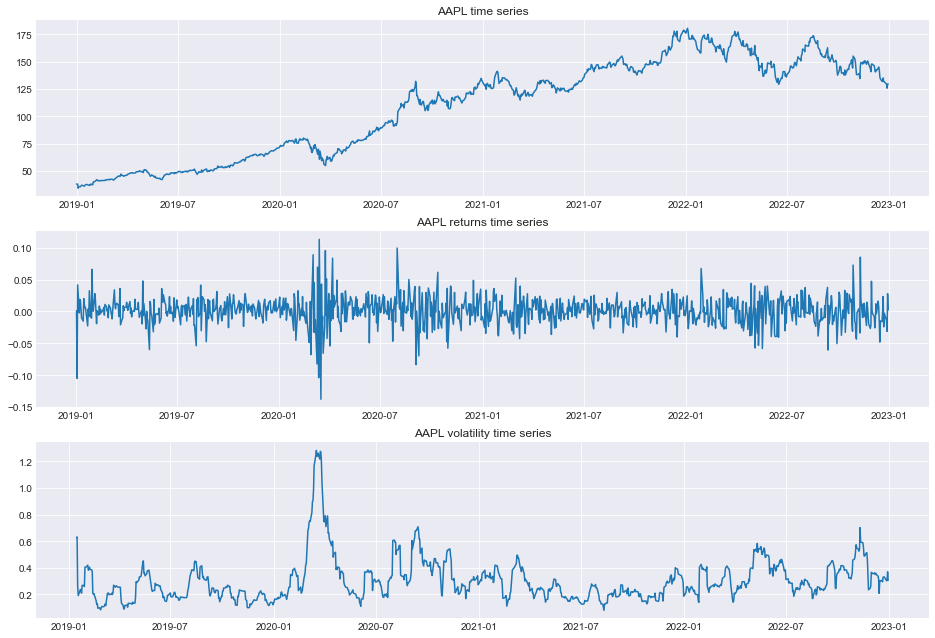

In [ ]:
!pip3 install statsmodels
!pip3 install pmdarima

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
from pandas_datareader import data as pdr
import yfinance as yf
from scipy.stats import norm
yf.pdr_override()
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa
from pmdarima.arima import auto_arima


START = '2019-01-01'
END = '2022-12-31'

aapl = pdr.get_data_yahoo("AAPL", start= START, end=END)
btcusd = pdr.get_data_yahoo("BTC-USD", start=START, end=END)
tsla = pdr.get_data_yahoo("TSLA", start=START, end=END)
vix = pdr.get_data_yahoo("^VIX", start=START, end=END)

aapl_close = aapl['Adj Close']
aapl_log_returns = aapl_close.pct_change().apply(lambda x: np.log(1+x))
print(aapl_log_returns)

btcusd_close = btcusd['Adj Close']
btcusd_log_returns = btcusd_close.pct_change().apply(lambda x: np.log(1+x))
print(btcusd_log_returns)

tsla_close = tsla['Adj Close']
tsla_log_returns = tsla_close.pct_change().apply(lambda x: np.log(1+x))
print(tsla_log_returns)


df = pd.DataFrame()
df["aapl"] = aapl_log_returns
df["btc"] = btcusd_log_returns
df["tsla"] = tsla_log_returns
df["vix"] = vix['Adj Close']


window = 10 # mean days for calculating volatility

# defining volatility for each log returns data
df["aapl.vlt"] = df["aapl"].rolling(window).std()*(252**0.5)
df["btc.vlt"] = df["btc"].rolling(window).std()*(252**0.5)
df["tsla.vlt"] = df["tsla"].rolling(window).std()*(252**0.5)
df["vix.vlt"] = df["vix"]/100

print(df)

plt.subplot(3, 1, 1)
plt.plot(aapl_close)
plt.title("AAPL time series")

plt.subplot(3, 1, 2)
plt.plot(df["aapl"])
plt.title("AAPL returns time series")


plt.subplot(3, 1, 3)
plt.plot(df["aapl.vlt"])

plt.title("AAPL volatility time series")

fig = plt.gcf()
fig.set_size_inches(16, 11)
plt.show()


In [ ]:
# Estimation of model with changes in volatility regimes

# Estimation of model with changes in volatility regimes
# Build function that performs the E step
# Likelihood of an observation


def likelihood(xi_prob, mu, sigma, y):
    phi = norm.pdf((y - mu) / sigma)
    y_like = np.dot(xi_prob, phi)

    return y_like


# Hamilton filtering
def forward_alg(pi_hat0, N, T, P, mu, sigma, Y):
    xi_prob_t = np.zeros((T, N))
    xi_prob_t1 = np.zeros((T, N))

    # Case t=1
    y_like = likelihood(pi_hat0, mu, sigma, Y[0])
    for ss in range(0, N):
        phi = np.zeros((N))
        for ss2 in range(0, N):
            phi[ss2] = norm.pdf((Y[0] - mu[ss2]) / sigma[ss2])
    xi_prob_t[0, :] = np.multiply(pi_hat0, phi) / y_like
    for ss in range(0, N):
        xi_prob_t1[0, ss] = np.dot(P[:, ss], xi_prob_t[0, :])

    for tt in range(1, T):
        y_like = likelihood(xi_prob_t1[tt - 1, :], mu, sigma, Y[tt])
        for ss in range(0, N):
            phi = np.zeros((N))
            for ss2 in range(0, N):
                phi[ss2] = norm.pdf((Y[tt] - mu[ss2]) / sigma[ss2])
        xi_prob_t[tt, :] = np.multiply(xi_prob_t1[tt - 1, :], phi) / y_like
        for ss in range(0, N):
            xi_prob_t1[tt, ss] = np.dot(P[:, ss], xi_prob_t[tt, :])

    return xi_prob_t, xi_prob_t1


# Kim filtering
def backward_alg(xi_prob_t, xi_prob_t1, N, T, P, mu, sigma, Y):
    xi_prob_T = np.zeros((T, N))
    xi_prob_T[T - 1, :] = xi_prob_t[T - 1, :]

    for tt in range(T - 2, -1, -1):
        xi_T_xi = np.divide(xi_prob_T[tt + 1, :], xi_prob_t1[tt, :])
        for ss in range(0, N):
            xi_prob_T[tt, ss] = xi_prob_t[tt, ss] * np.dot(P[ss, :], xi_T_xi)

    return xi_prob_T  # , xi_prob_T1


def M_step_func(xi_prob, P, N, T, Y):  #
    mu_hat = np.zeros((N))
    sigma_hat = np.zeros((N))
    P_hat = np.zeros((N, N))
    pi_hat = np.zeros((N))

    for ss in range(0, N):
        xi_y = np.dot(xi_prob[:, ss], Y)
        mu_hat[ss] = xi_y / np.sum(xi_prob[:, ss])

        xi_y_mu2 = np.dot(xi_prob[:, ss], (Y - mu_hat[ss]) ** 2)
        sigma_hat[ss] = (xi_y_mu2 / np.sum(xi_prob[:, ss])) ** 0.5

        for ss2 in range(0, N):
            P_hat[ss, ss2] = np.sum(P[ss, ss2, 1:]) / np.sum(
                P[ss, :, 1:]
            )  # /np.sum(xi_prob[0:T-1,ss]) #np.sum(P[ss,:,1:T])
            # print( np.sum(xi_prob[0:T-1,ss]), np.sum(P[ss,:,1:T]))

        pi_hat[ss] = xi_prob[0, ss]

    return mu_hat, sigma_hat, P_hat, pi_hat

In [ ]:
## Read data for VIX
print (vix)
YDatapd = vix['Adj Close']

YData = YDatapd.to_numpy()
YData = np.log(YData)

             Open   High    Low  Close  Adj Close  Volume
Date                                                     
2018-12-31 27.590 27.640 25.330 25.420     25.420       0
2019-01-02 27.540 28.530 23.050 23.220     23.220       0
2019-01-03 25.680 26.600 24.050 25.450     25.450       0
2019-01-04 24.360 24.480 21.190 21.380     21.380       0
2019-01-07 22.060 22.710 20.910 21.400     21.400       0
...           ...    ...    ...    ...        ...     ...
2022-12-23 22.170 22.640 20.780 20.870     20.870       0
2022-12-27 21.670 22.800 21.590 21.650     21.650       0
2022-12-28 21.470 22.260 20.960 22.140     22.140       0
2022-12-29 22.250 22.310 21.360 21.440     21.440       0
2022-12-30 21.830 22.400 21.590 21.670     21.670       0

[1009 rows x 6 columns]



mu_hat0 = [2.5 3.  3.5], 
sigma_hat0 = [0.3 0.4 0.5], 
P_hat0 = 
[[0.85  0.075 0.075]
 [0.05  0.9   0.05 ]
 [0.15  0.15  0.7  ]], 
pi_hat0 = [0.3333 0.5    0.1667]



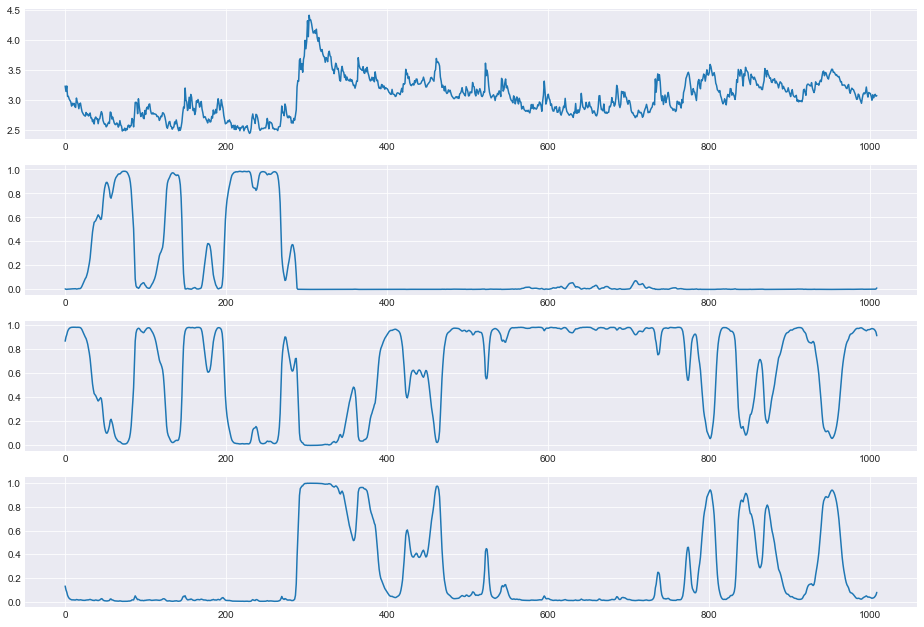


ite=0, max(diff) = 13.900214832064828

mu_hat0 = [2.6101 3.0157 3.458 ], 
sigma_hat0 = [0.0974 0.2009 0.278 ], 
P_hat0 = 
[[0.9393 0.0494 0.0112]
 [0.0116 0.9571 0.0313]
 [0.0065 0.0918 0.9017]], 
pi_hat0 = [0.0042 0.8641 0.1318]



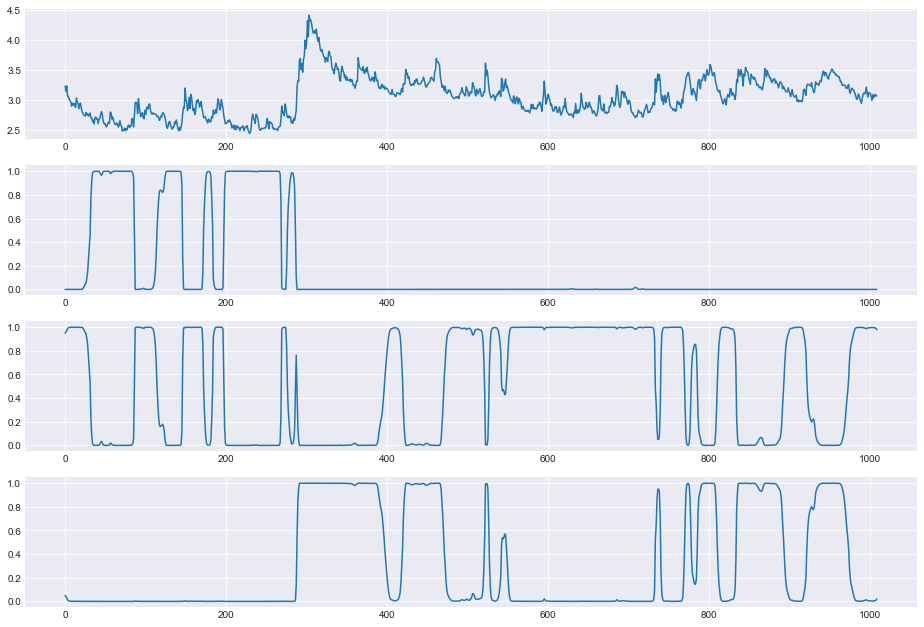


ite=1, max(diff) = 39.990520488338596

mu_hat0 = [2.615  2.9767 3.4223], 
sigma_hat0 = [0.0838 0.1489 0.2323], 
P_hat0 = 
[[0.9705 0.0283 0.0012]
 [0.0102 0.9704 0.0195]
 [0.     0.032  0.9679]], 
pi_hat0 = [0.     0.9494 0.0506]



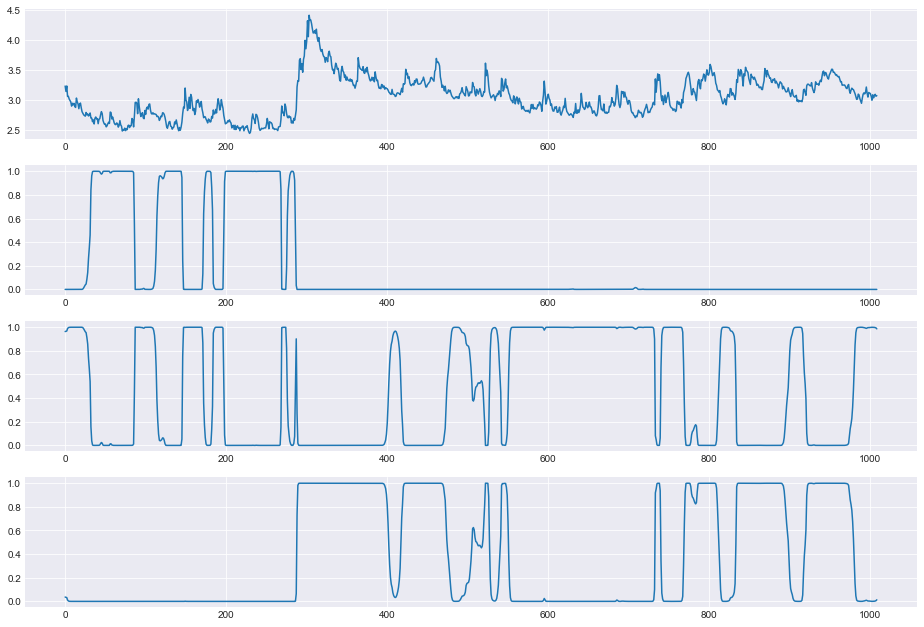


ite=2, max(diff) = 280.42037544010117

mu_hat0 = [2.6164 2.9534 3.3867], 
sigma_hat0 = [0.0839 0.135  0.2323], 
P_hat0 = 
[[9.714e-01 2.820e-02 4.000e-04]
 [1.130e-02 9.697e-01 1.900e-02]
 [0.000e+00 2.330e-02 9.767e-01]], 
pi_hat0 = [0.     0.9634 0.0366]



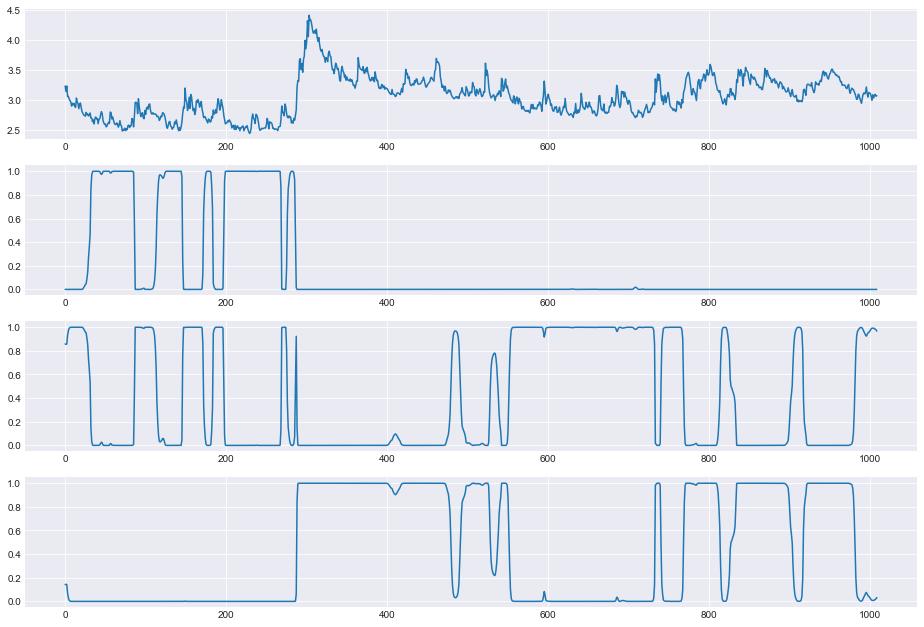


ite=3, max(diff) = 2095.2268527034707

mu_hat0 = [2.6165 2.9275 3.3503], 
sigma_hat0 = [0.0839 0.1241 0.2348], 
P_hat0 = 
[[9.714e-01 2.840e-02 2.000e-04]
 [1.310e-02 9.683e-01 1.860e-02]
 [0.000e+00 1.720e-02 9.828e-01]], 
pi_hat0 = [0.     0.8586 0.1414]



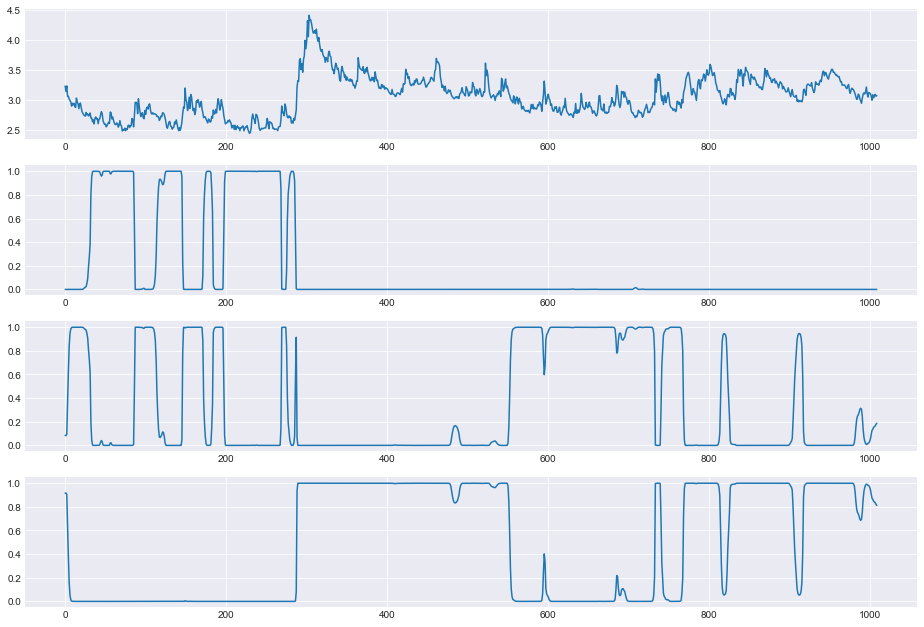


ite=4, max(diff) = 15495.115082059687

mu_hat0 = [2.6153 2.8972 3.3169], 
sigma_hat0 = [0.0833 0.1102 0.2376], 
P_hat0 = 
[[9.709e-01 2.900e-02 1.000e-04]
 [1.560e-02 9.657e-01 1.880e-02]
 [0.000e+00 1.290e-02 9.871e-01]], 
pi_hat0 = [0.     0.0839 0.9161]



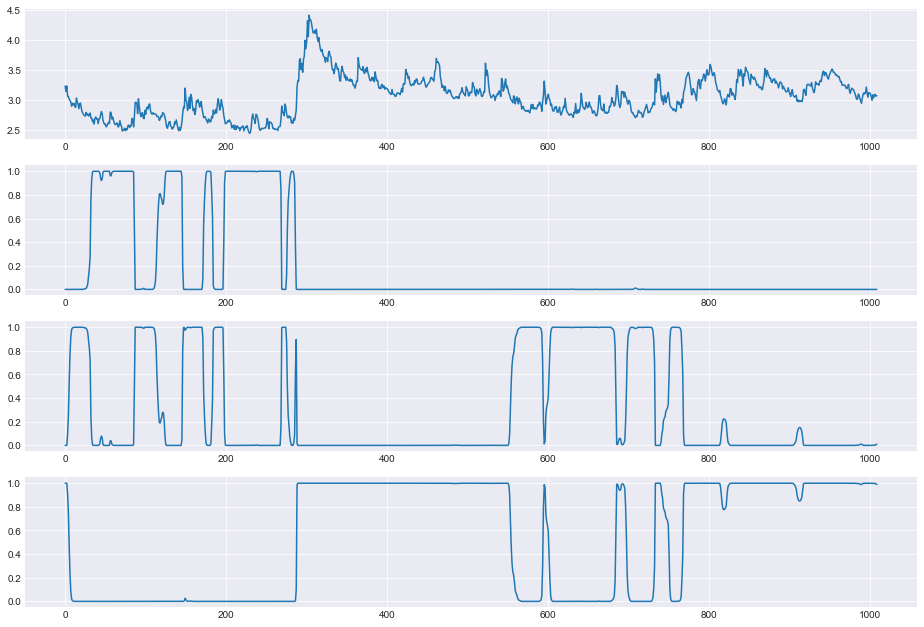


ite=5, max(diff) = 1676.8743456738782

mu_hat0 = [2.6131 2.8706 3.2912], 
sigma_hat0 = [0.0822 0.0952 0.2415], 
P_hat0 = 
[[9.697e-01 3.010e-02 1.000e-04]
 [1.850e-02 9.621e-01 1.930e-02]
 [0.000e+00 1.020e-02 9.898e-01]], 
pi_hat0 = [0. 0. 1.]



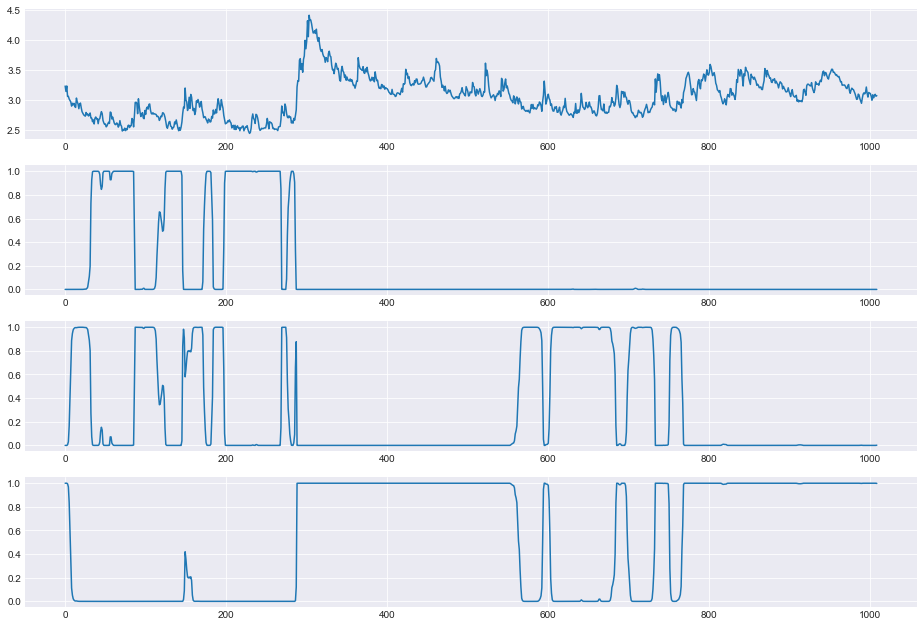


ite=6, max(diff) = 119.42284227266887

mu_hat0 = [2.6107 2.8569 3.2787], 
sigma_hat0 = [0.0809 0.0884 0.2438], 
P_hat0 = 
[[9.681e-01 3.180e-02 1.000e-04]
 [2.070e-02 9.583e-01 2.090e-02]
 [0.000e+00 9.700e-03 9.903e-01]], 
pi_hat0 = [0. 0. 1.]



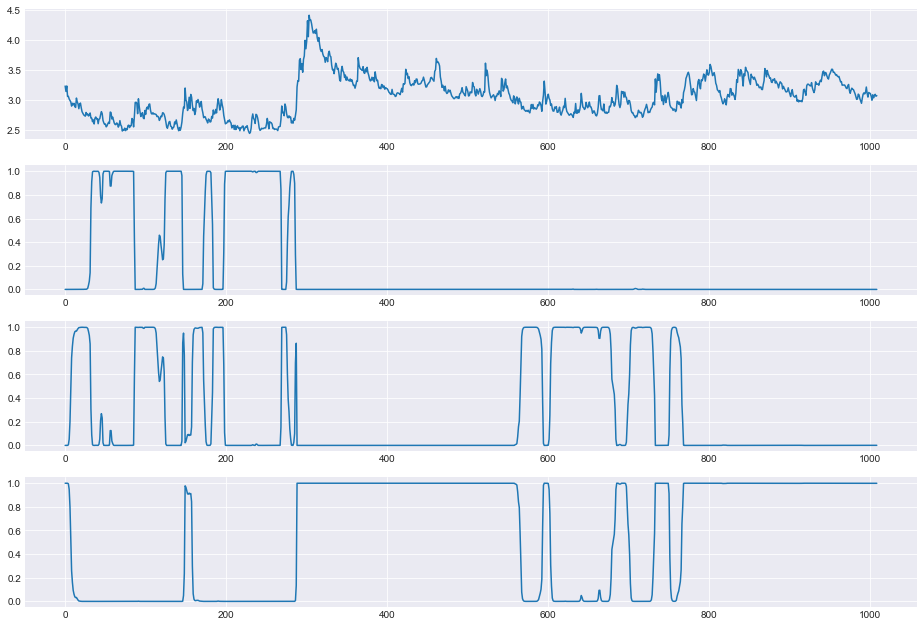


ite=7, max(diff) = 166.16989807196174

mu_hat0 = [2.6079 2.848  3.2706], 
sigma_hat0 = [0.0793 0.084  0.2459], 
P_hat0 = 
[[9.661e-01 3.380e-02 1.000e-04]
 [2.260e-02 9.529e-01 2.450e-02]
 [0.000e+00 1.060e-02 9.894e-01]], 
pi_hat0 = [0. 0. 1.]



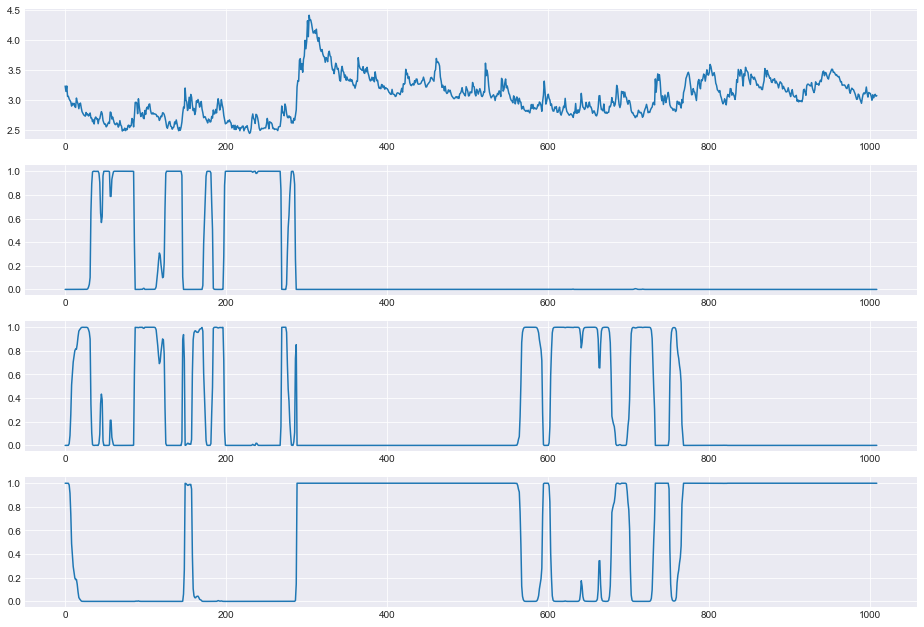


ite=8, max(diff) = 139.72236464378562

mu_hat0 = [2.6053 2.8421 3.2652], 
sigma_hat0 = [0.0777 0.0822 0.2474], 
P_hat0 = 
[[9.638e-01 3.610e-02 1.000e-04]
 [2.430e-02 9.487e-01 2.700e-02]
 [0.000e+00 1.110e-02 9.889e-01]], 
pi_hat0 = [0. 0. 1.]



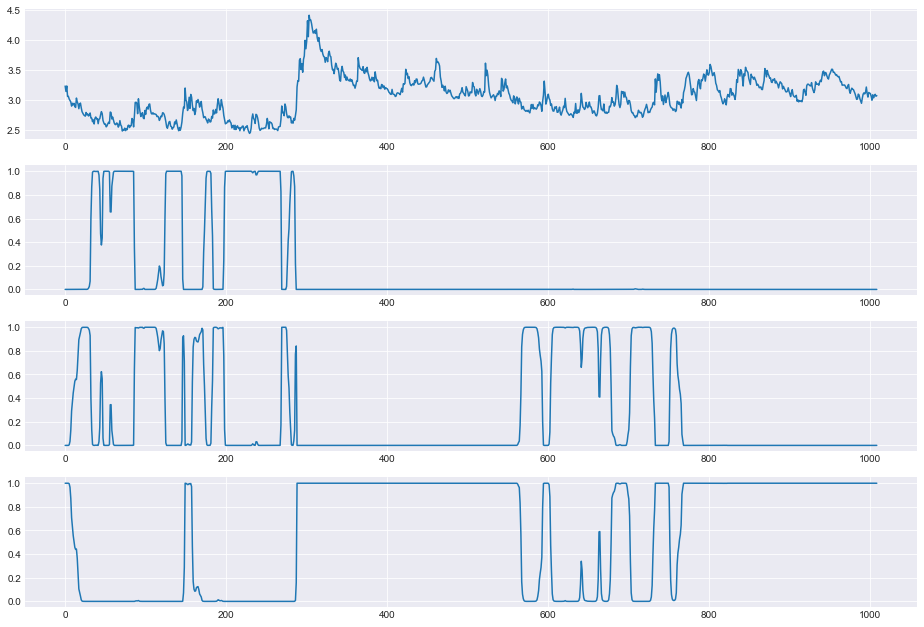


ite=9, max(diff) = 149.7380924186348

mu_hat0 = [2.6027 2.837  3.2607], 
sigma_hat0 = [0.0759 0.0806 0.2486], 
P_hat0 = 
[[0.9613 0.0387 0.    ]
 [0.0261 0.9444 0.0295]
 [0.     0.0118 0.9882]], 
pi_hat0 = [0. 0. 1.]



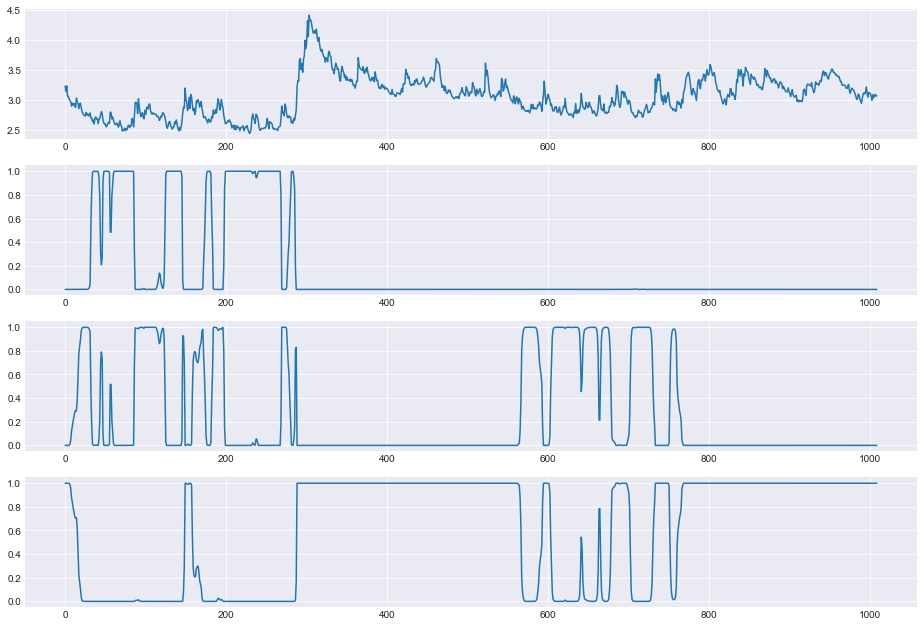


ite=10, max(diff) = 166.96808929514887

mu_hat0 = [2.6003 2.832  3.2561], 
sigma_hat0 = [0.0742 0.0788 0.2499], 
P_hat0 = 
[[0.9585 0.0415 0.    ]
 [0.0281 0.9394 0.0324]
 [0.     0.0124 0.9876]], 
pi_hat0 = [0. 0. 1.]



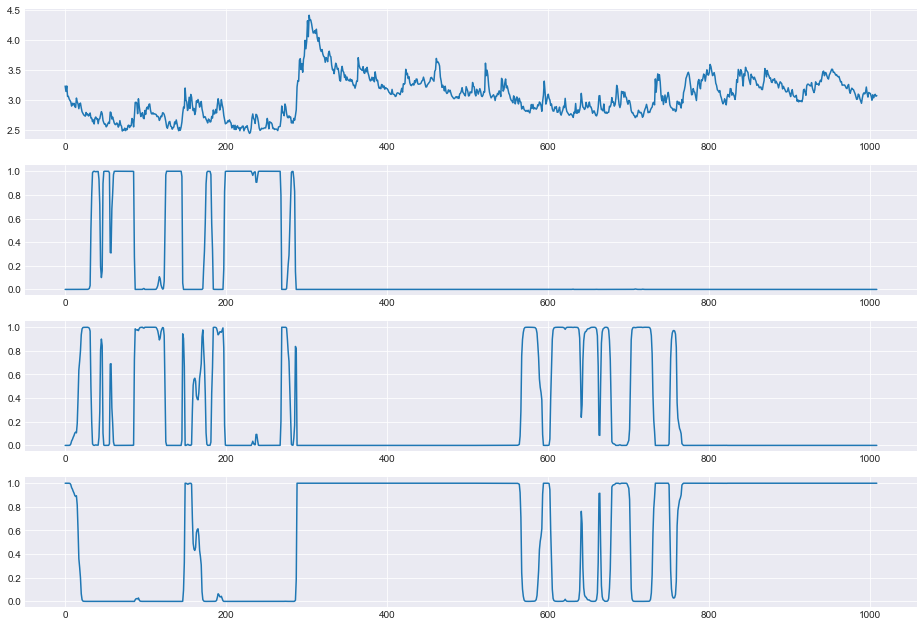


ite=11, max(diff) = 176.41557628714148

mu_hat0 = [2.5981 2.8266 3.251 ], 
sigma_hat0 = [0.0726 0.0766 0.2513], 
P_hat0 = 
[[0.9559 0.0441 0.    ]
 [0.0304 0.9339 0.0357]
 [0.     0.013  0.987 ]], 
pi_hat0 = [0. 0. 1.]



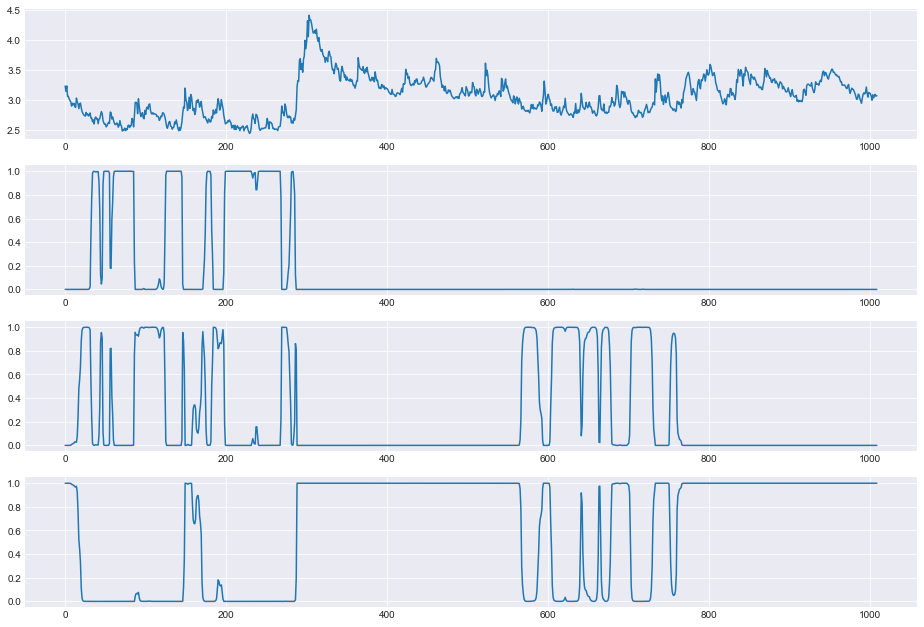


ite=12, max(diff) = 167.71445169286892

mu_hat0 = [2.5964 2.8214 3.2458], 
sigma_hat0 = [0.0712 0.0742 0.2528], 
P_hat0 = 
[[0.9536 0.0464 0.    ]
 [0.0327 0.9283 0.039 ]
 [0.     0.0135 0.9865]], 
pi_hat0 = [0. 0. 1.]



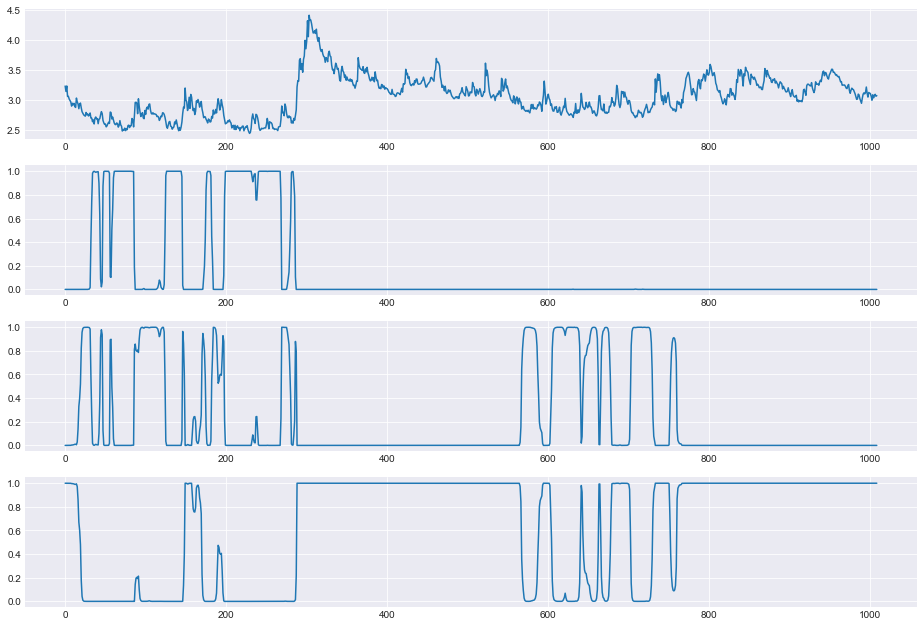


ite=13, max(diff) = 173.70470854446214

mu_hat0 = [2.5949 2.8163 3.2407], 
sigma_hat0 = [0.0702 0.072  0.2543], 
P_hat0 = 
[[0.9518 0.0482 0.    ]
 [0.0349 0.922  0.0431]
 [0.     0.0141 0.9859]], 
pi_hat0 = [0. 0. 1.]



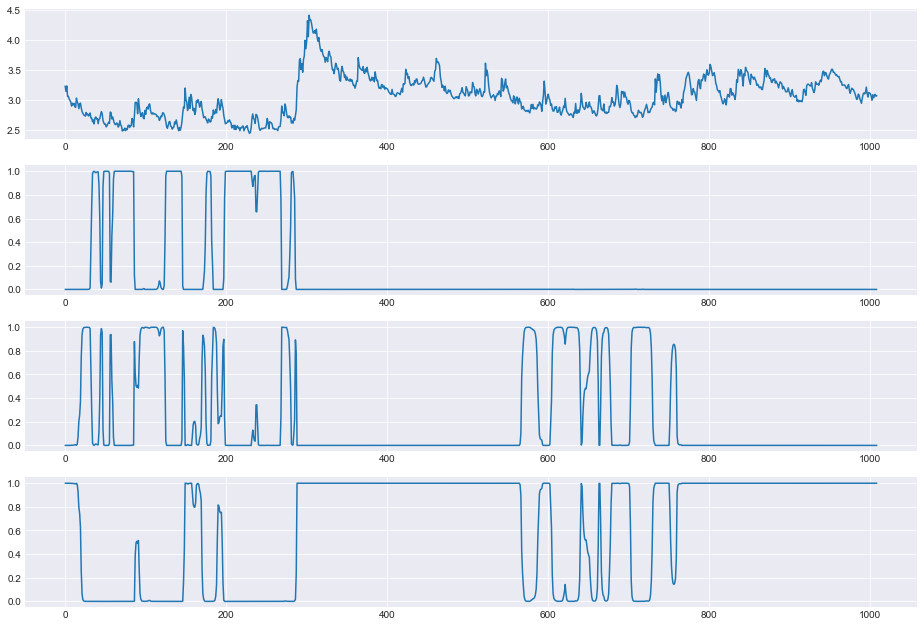


ite=14, max(diff) = 211.63109689412713

mu_hat0 = [2.5937 2.8104 3.235 ], 
sigma_hat0 = [0.0693 0.0691 0.2559], 
P_hat0 = 
[[0.9502 0.0498 0.    ]
 [0.0375 0.9139 0.0486]
 [0.     0.0149 0.9851]], 
pi_hat0 = [0. 0. 1.]



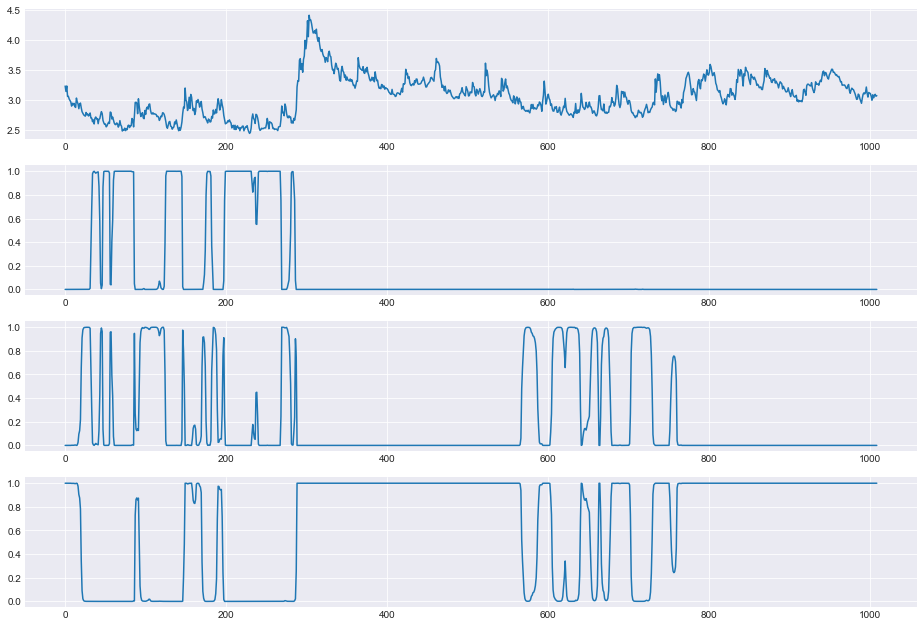


ite=15, max(diff) = 232.08897504138628

mu_hat0 = [2.5926 2.8038 3.2285], 
sigma_hat0 = [0.0685 0.0653 0.2577], 
P_hat0 = 
[[0.9486 0.0514 0.    ]
 [0.0407 0.9045 0.0548]
 [0.     0.0156 0.9844]], 
pi_hat0 = [0. 0. 1.]



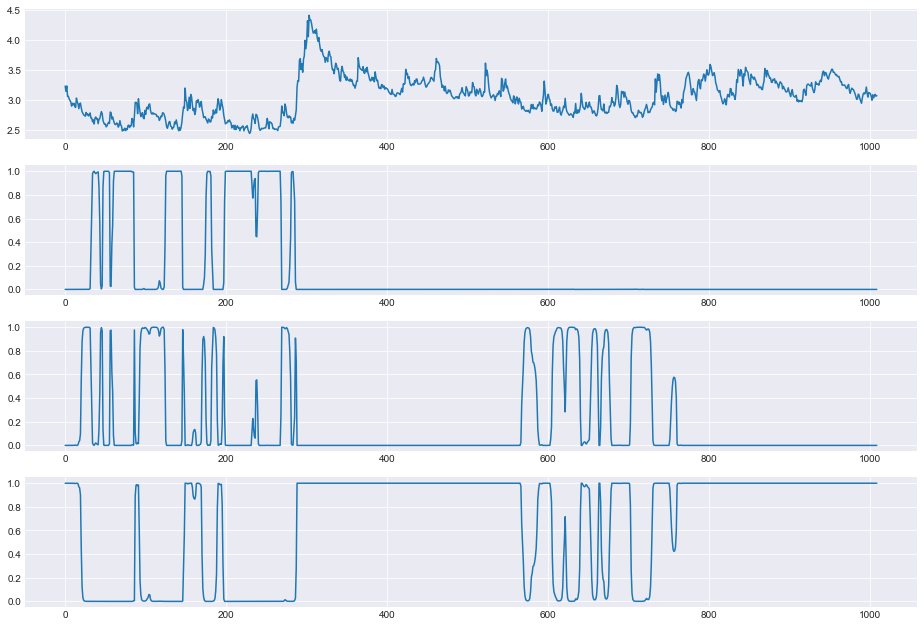


ite=16, max(diff) = 210.6699876903758

mu_hat0 = [2.5918 2.7979 3.2224], 
sigma_hat0 = [0.0678 0.0623 0.2595], 
P_hat0 = 
[[0.9472 0.0528 0.    ]
 [0.0442 0.8956 0.0602]
 [0.     0.0158 0.9842]], 
pi_hat0 = [0. 0. 1.]



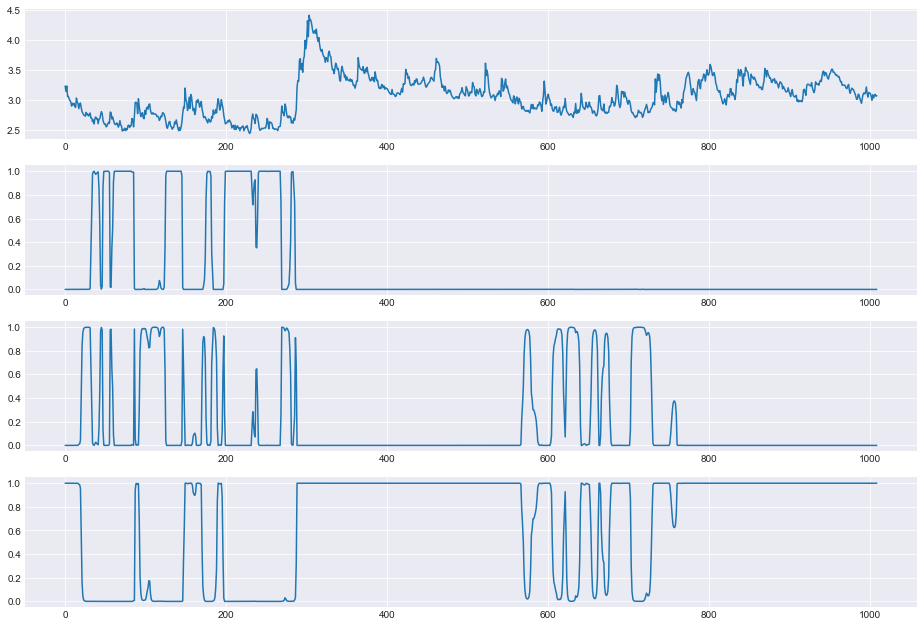


ite=17, max(diff) = 200.24971490668037

mu_hat0 = [2.5909 2.7924 3.2163], 
sigma_hat0 = [0.0671 0.06   0.2615], 
P_hat0 = 
[[0.9457 0.0542 0.    ]
 [0.0481 0.8871 0.0648]
 [0.     0.0157 0.9843]], 
pi_hat0 = [0. 0. 1.]



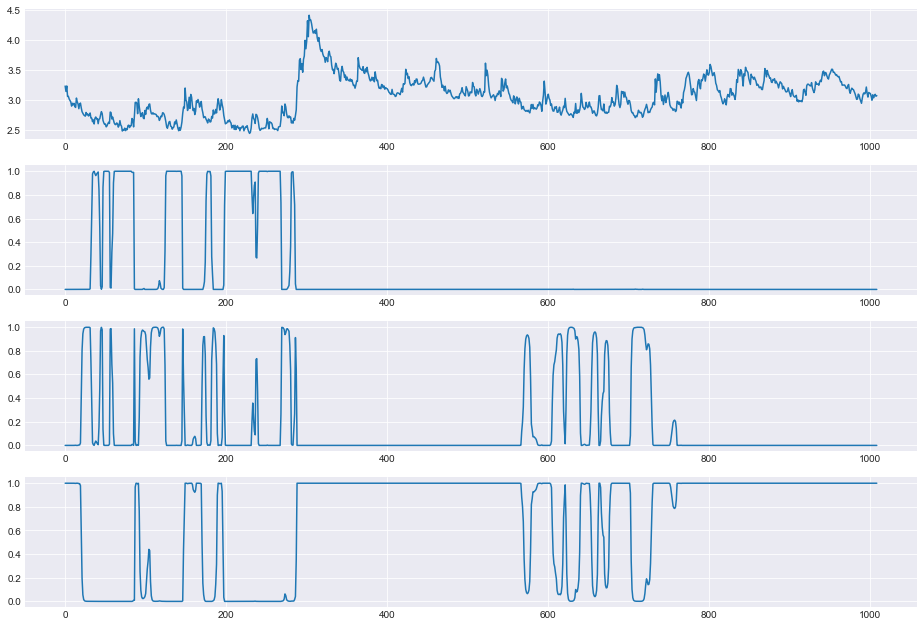


ite=18, max(diff) = 217.67518498625896

mu_hat0 = [2.59   2.7869 3.2102], 
sigma_hat0 = [0.0665 0.058  0.2634], 
P_hat0 = 
[[0.9443 0.0557 0.    ]
 [0.0524 0.8779 0.0697]
 [0.     0.0155 0.9845]], 
pi_hat0 = [0. 0. 1.]



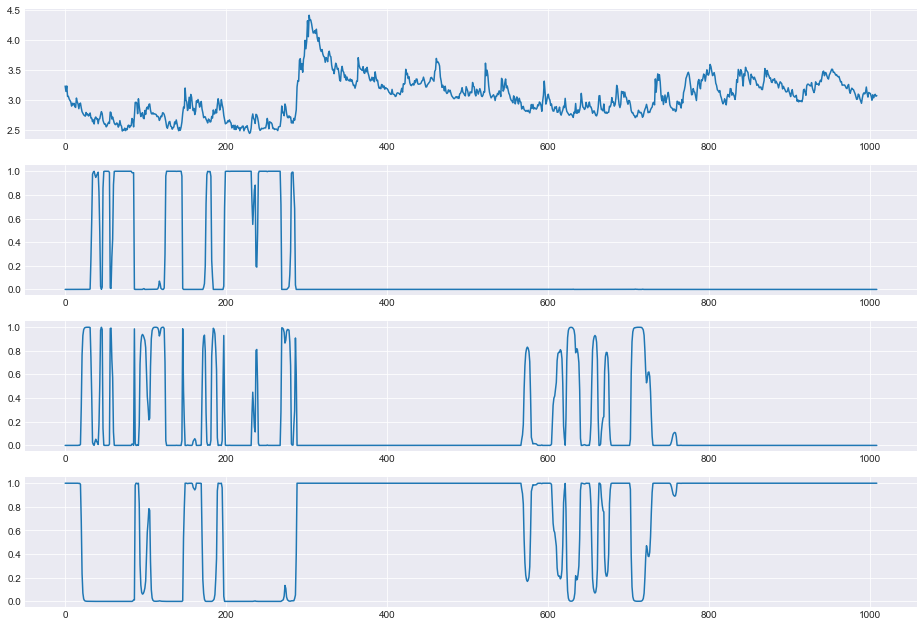


ite=19, max(diff) = 285.1996219406074

mu_hat0 = [2.589  2.7803 3.2029], 
sigma_hat0 = [0.0657 0.0554 0.2658], 
P_hat0 = 
[[0.9427 0.0573 0.    ]
 [0.0584 0.8655 0.0762]
 [0.     0.0152 0.9848]], 
pi_hat0 = [0. 0. 1.]



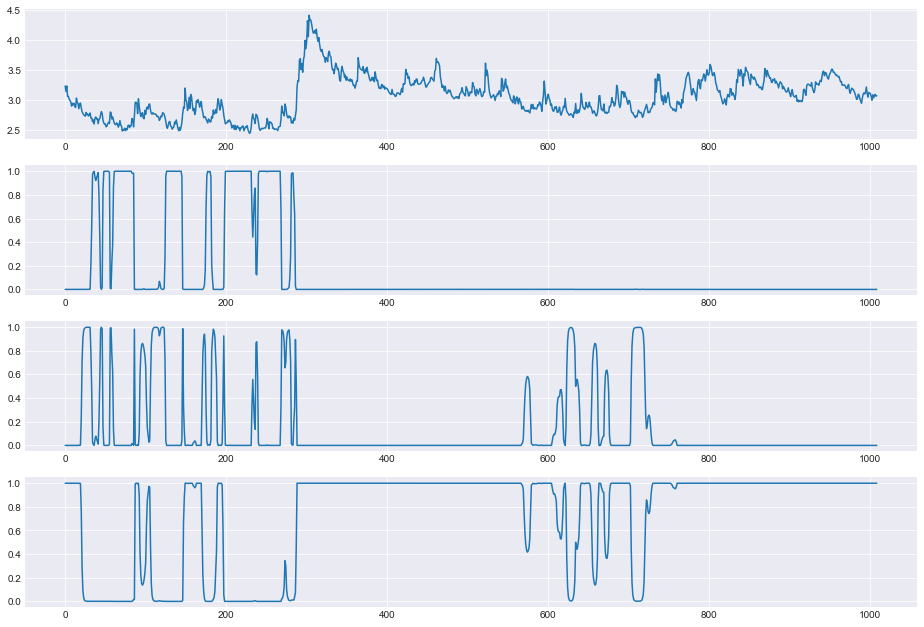


ite=20, max(diff) = 390.4253402748363

mu_hat0 = [2.5879 2.7712 3.1933], 
sigma_hat0 = [0.0649 0.0513 0.269 ], 
P_hat0 = 
[[0.941  0.059  0.    ]
 [0.0681 0.8487 0.0832]
 [0.     0.0141 0.9859]], 
pi_hat0 = [0. 0. 1.]



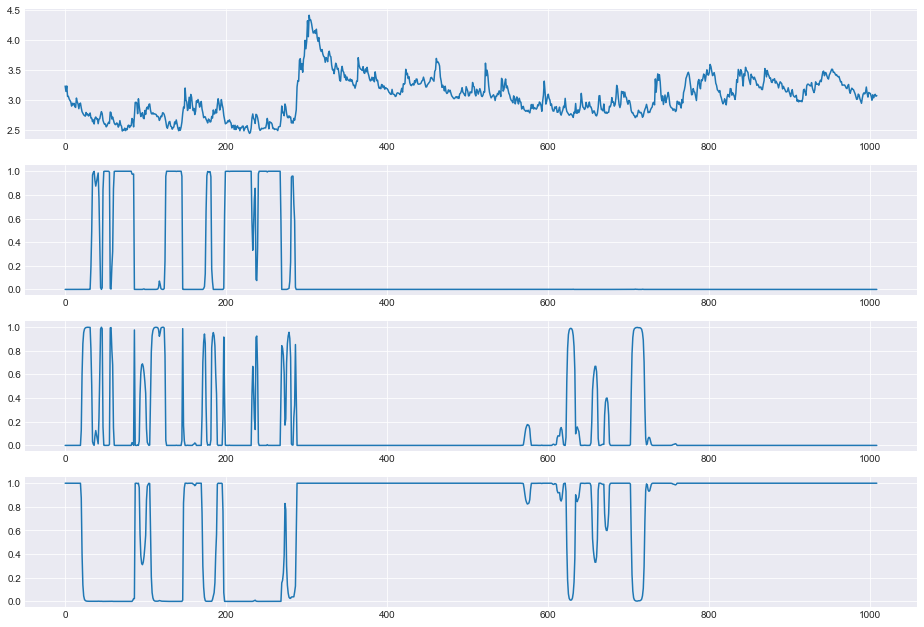


ite=21, max(diff) = 464.72674016725875

mu_hat0 = [2.5866 2.7612 3.183 ], 
sigma_hat0 = [0.064  0.0457 0.2724], 
P_hat0 = 
[[0.9391 0.0609 0.    ]
 [0.0821 0.8291 0.0887]
 [0.     0.0124 0.9876]], 
pi_hat0 = [0. 0. 1.]



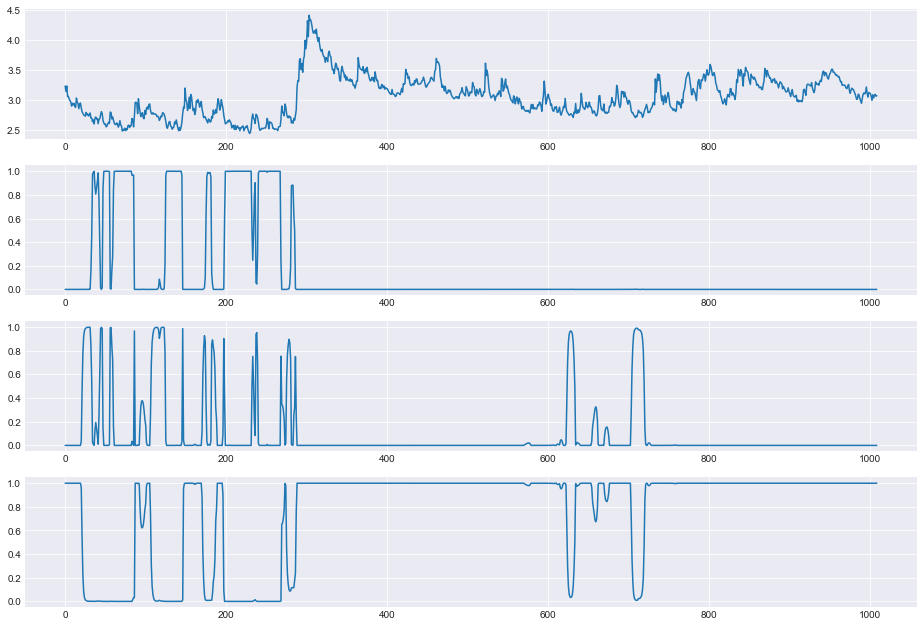


ite=22, max(diff) = 409.8033881083851

mu_hat0 = [2.5854 2.7538 3.1745], 
sigma_hat0 = [0.0632 0.0412 0.2755], 
P_hat0 = 
[[9.372e-01 6.270e-02 1.000e-04]
 [9.780e-02 8.124e-01 8.980e-02]
 [0.000e+00 1.050e-02 9.895e-01]], 
pi_hat0 = [0. 0. 1.]



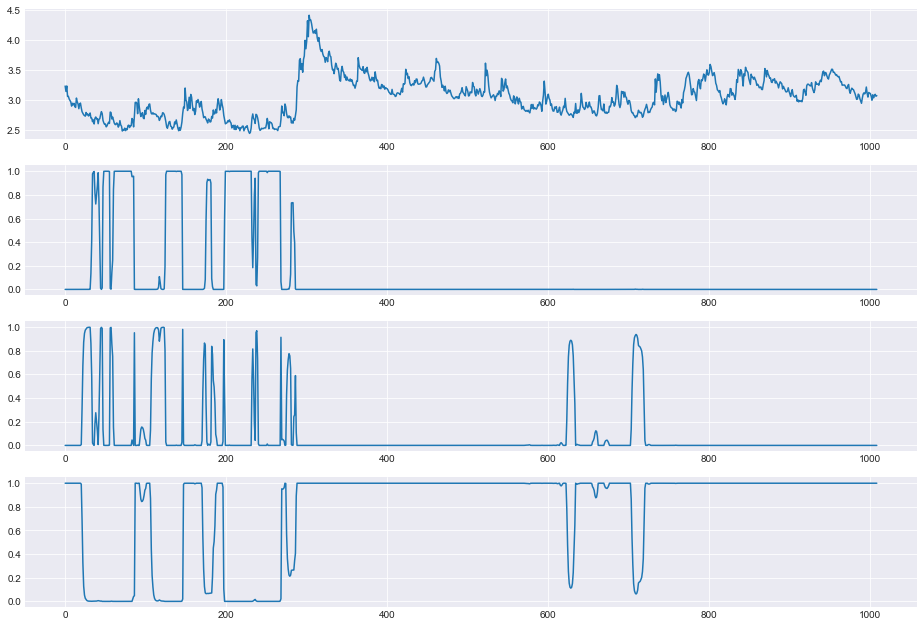


ite=23, max(diff) = 338.4648390581775

mu_hat0 = [2.584  2.7495 3.1677], 
sigma_hat0 = [0.0625 0.0387 0.2782], 
P_hat0 = 
[[9.361e-01 6.330e-02 6.000e-04]
 [1.121e-01 7.979e-01 8.990e-02]
 [0.000e+00 9.200e-03 9.908e-01]], 
pi_hat0 = [0. 0. 1.]



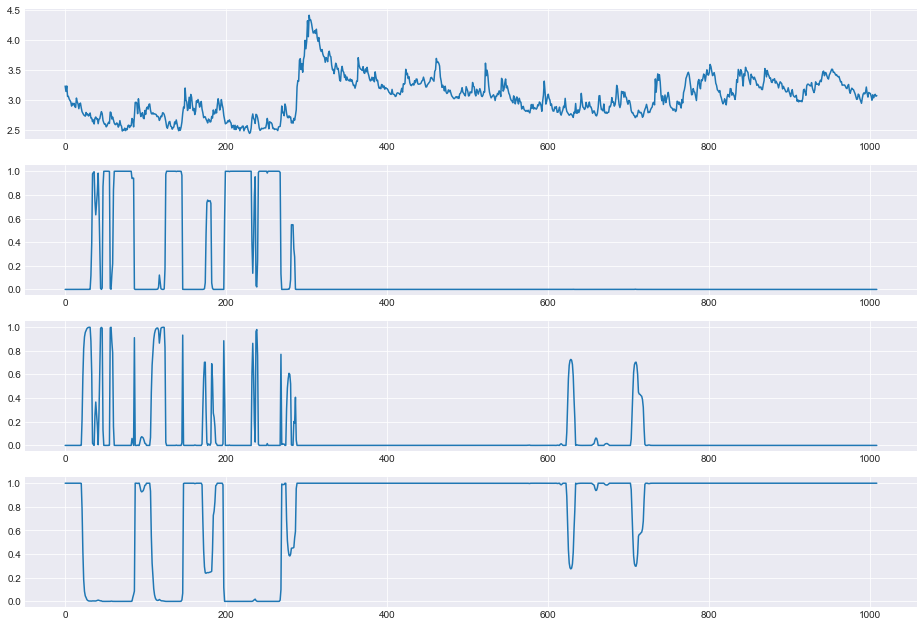


ite=24, max(diff) = 392.18242387265235

mu_hat0 = [2.5824 2.7464 3.1602], 
sigma_hat0 = [0.0617 0.0375 0.2813], 
P_hat0 = 
[[0.9362 0.0612 0.0026]
 [0.1283 0.7839 0.0877]
 [0.     0.0079 0.9921]], 
pi_hat0 = [0. 0. 1.]



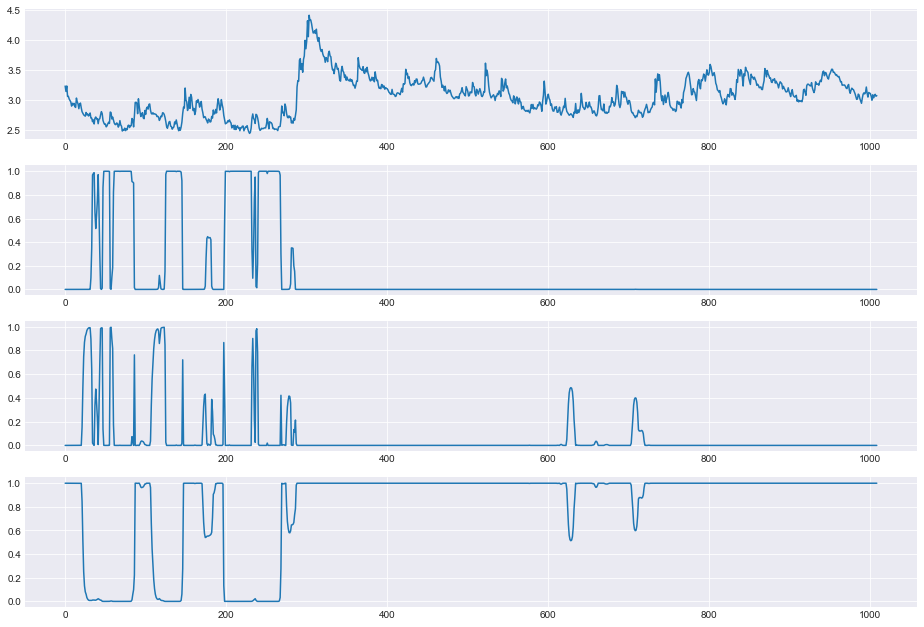


ite=25, max(diff) = 540.3285641638563

mu_hat0 = [2.58   2.7441 3.1523], 
sigma_hat0 = [0.0607 0.0371 0.2847], 
P_hat0 = 
[[0.937  0.0545 0.0084]
 [0.1472 0.7811 0.0717]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



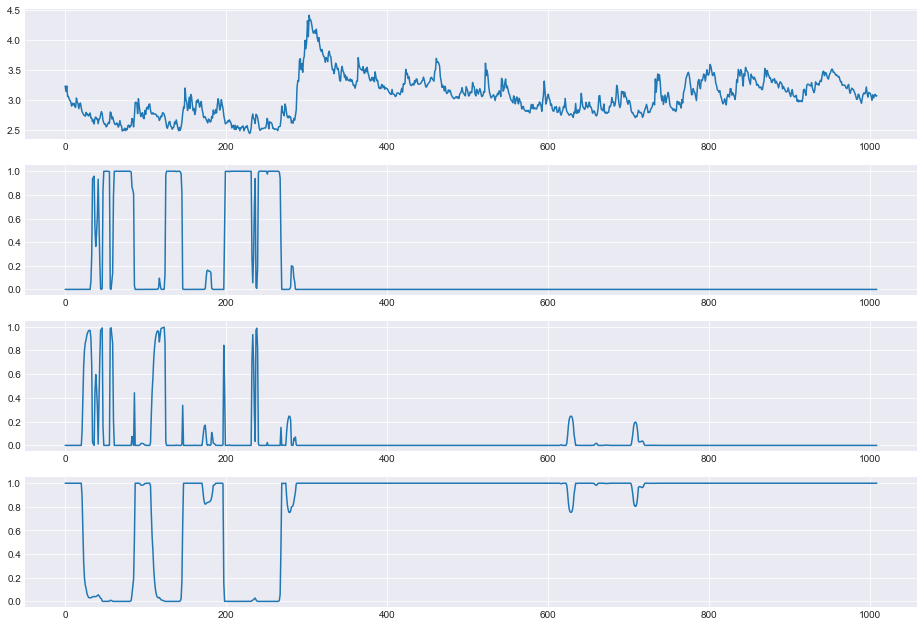


ite=26, max(diff) = 818.2186006595276

mu_hat0 = [2.5772 2.7423 3.146 ], 
sigma_hat0 = [0.0594 0.0377 0.2874], 
P_hat0 = 
[[0.9376 0.0454 0.017 ]
 [0.164  0.7948 0.0412]
 [0.     0.005  0.995 ]], 
pi_hat0 = [0. 0. 1.]



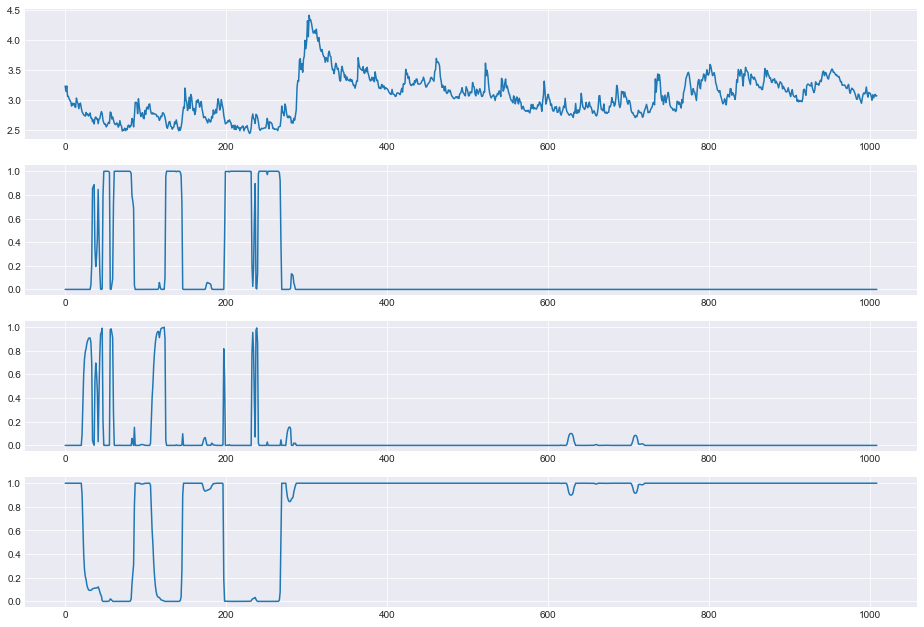


ite=27, max(diff) = 622.2287025248354

mu_hat0 = [2.5746 2.7401 3.1423], 
sigma_hat0 = [0.0578 0.0389 0.2889], 
P_hat0 = 
[[0.9375 0.0394 0.0231]
 [0.1723 0.8108 0.0169]
 [0.     0.0044 0.9956]], 
pi_hat0 = [0. 0. 1.]



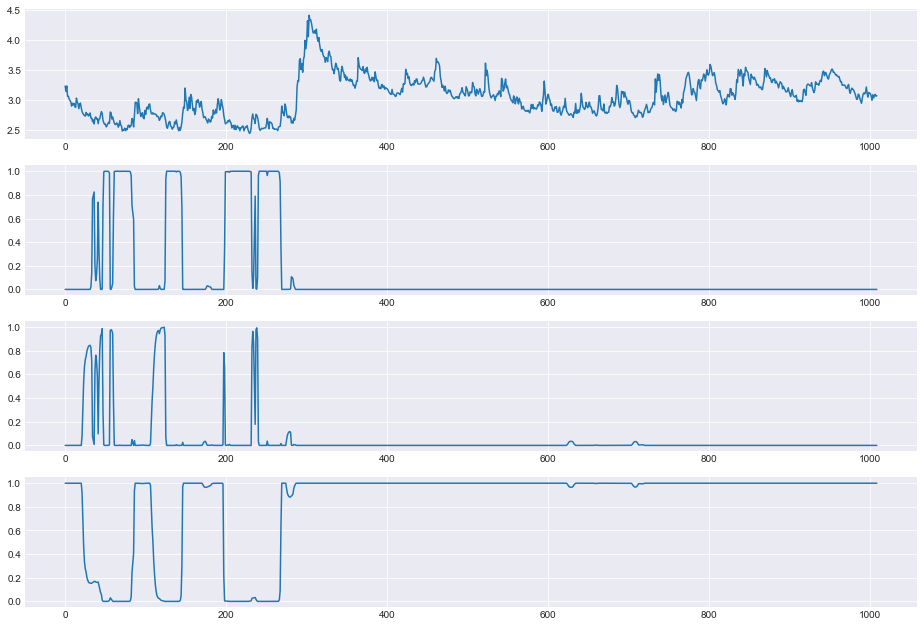


ite=28, max(diff) = 326.01538145860474

mu_hat0 = [2.5724 2.7373 3.1405], 
sigma_hat0 = [0.0562 0.0407 0.2896], 
P_hat0 = 
[[0.9378 0.0366 0.0257]
 [0.1701 0.824  0.0059]
 [0.     0.004  0.996 ]], 
pi_hat0 = [0. 0. 1.]



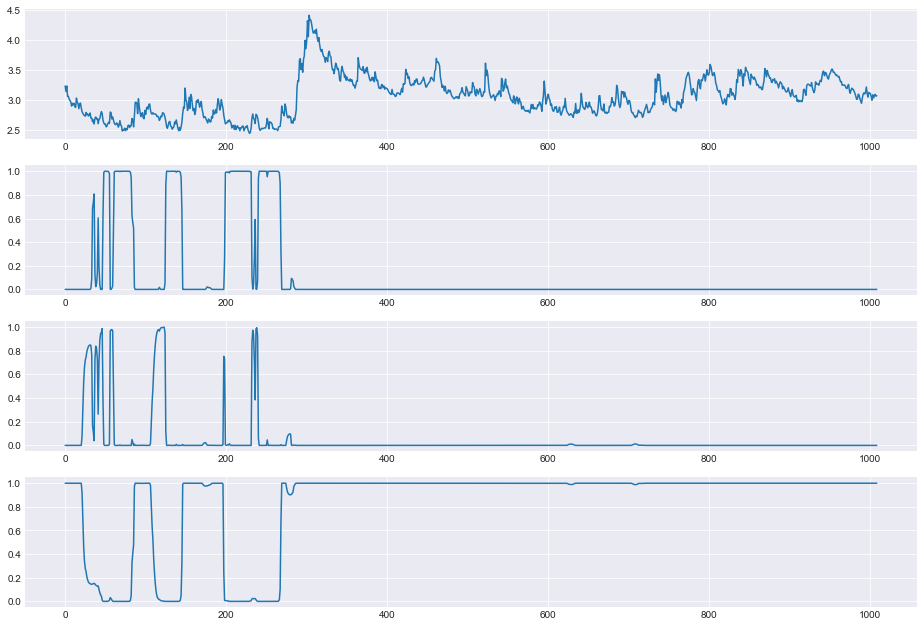


ite=29, max(diff) = 375.67417896687

mu_hat0 = [2.5706 2.734  3.1401], 
sigma_hat0 = [0.0551 0.0431 0.2898], 
P_hat0 = 
[[0.9391 0.0344 0.0265]
 [0.1577 0.8404 0.0019]
 [0.     0.0039 0.9961]], 
pi_hat0 = [0. 0. 1.]



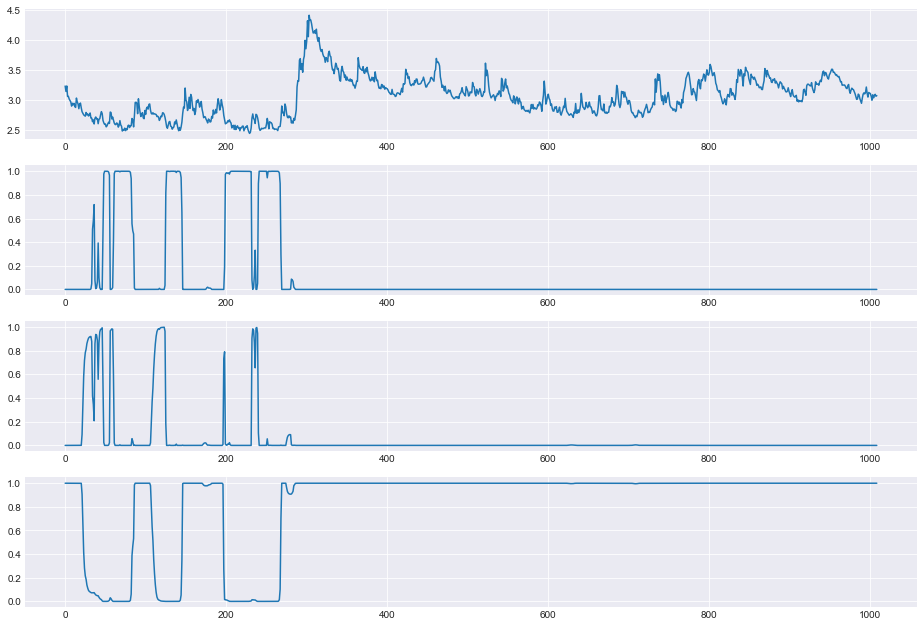


ite=30, max(diff) = 538.5110301419999

mu_hat0 = [2.569  2.73   3.1407], 
sigma_hat0 = [0.0541 0.0462 0.2896], 
P_hat0 = 
[[9.424e-01 3.070e-02 2.700e-02]
 [1.359e-01 8.635e-01 6.000e-04]
 [0.000e+00 3.800e-03 9.962e-01]], 
pi_hat0 = [0. 0. 1.]



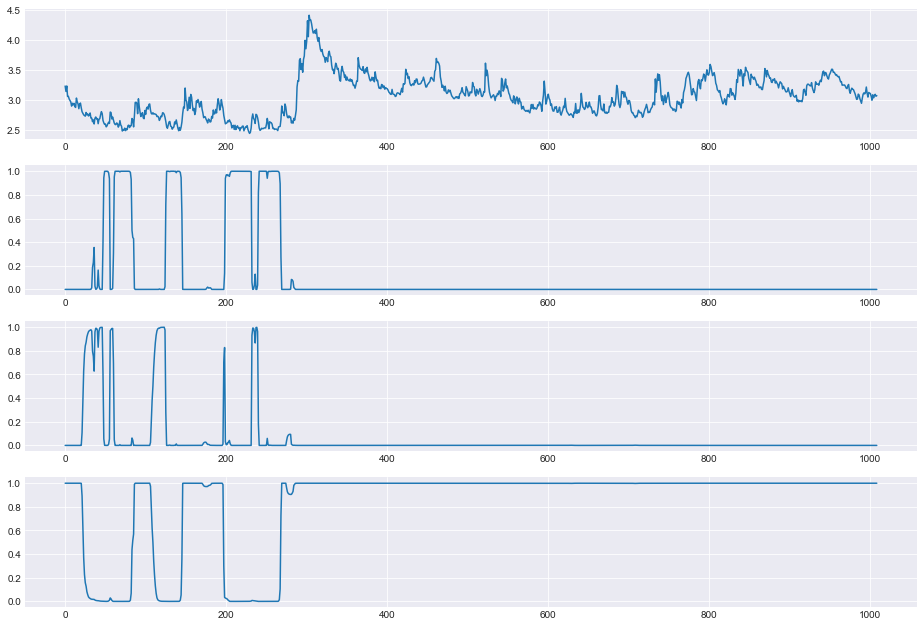


ite=31, max(diff) = 605.9006021493553

mu_hat0 = [2.5672 2.7257 3.1412], 
sigma_hat0 = [0.0532 0.0493 0.2894], 
P_hat0 = 
[[9.477e-01 2.470e-02 2.760e-02]
 [1.119e-01 8.879e-01 2.000e-04]
 [0.000e+00 3.800e-03 9.962e-01]], 
pi_hat0 = [0. 0. 1.]



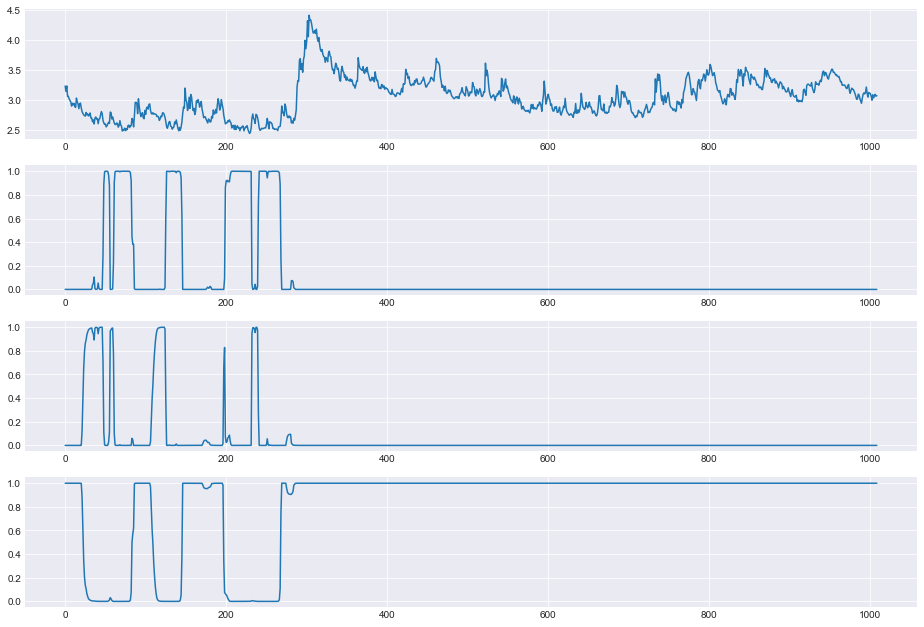


ite=32, max(diff) = 320.1350191522612

mu_hat0 = [2.5658 2.7229 3.1413], 
sigma_hat0 = [0.0526 0.0512 0.2894], 
P_hat0 = 
[[9.506e-01 2.120e-02 2.830e-02]
 [9.960e-02 9.003e-01 1.000e-04]
 [0.000e+00 3.800e-03 9.962e-01]], 
pi_hat0 = [0. 0. 1.]



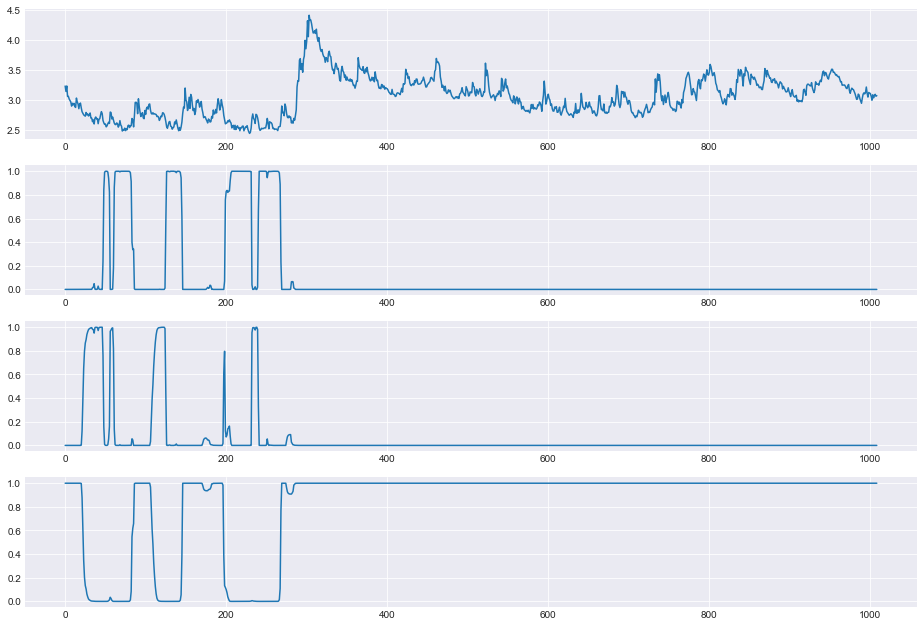


ite=33, max(diff) = 87.43258838261067

mu_hat0 = [2.565  2.7212 3.1411], 
sigma_hat0 = [0.0522 0.0522 0.2895], 
P_hat0 = 
[[9.508e-01 2.050e-02 2.880e-02]
 [9.590e-02 9.039e-01 1.000e-04]
 [0.000e+00 3.800e-03 9.962e-01]], 
pi_hat0 = [0. 0. 1.]



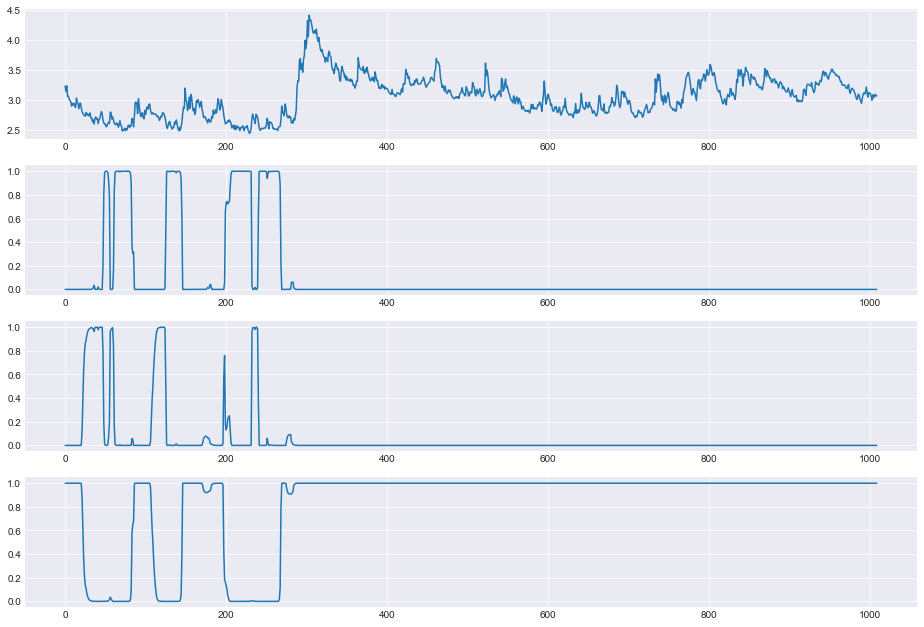


ite=34, max(diff) = 37.546904832188865

mu_hat0 = [2.5642 2.7199 3.141 ], 
sigma_hat0 = [0.0518 0.0528 0.2896], 
P_hat0 = 
[[9.502e-01 2.060e-02 2.920e-02]
 [9.460e-02 9.052e-01 2.000e-04]
 [0.000e+00 3.800e-03 9.962e-01]], 
pi_hat0 = [0. 0. 1.]



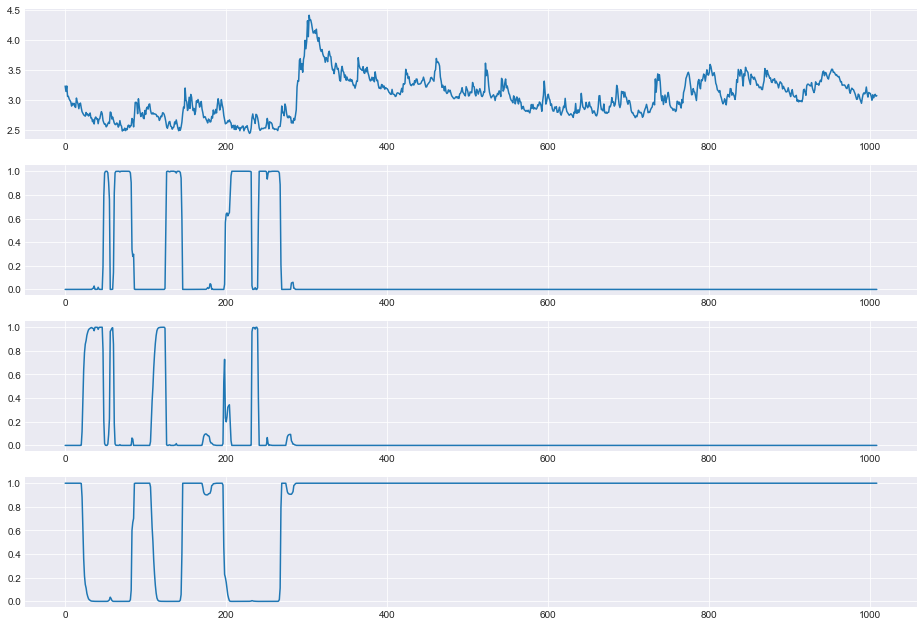


ite=35, max(diff) = 34.982524272045396

mu_hat0 = [2.5636 2.7185 3.1409], 
sigma_hat0 = [0.0515 0.0534 0.2896], 
P_hat0 = 
[[9.496e-01 2.090e-02 2.950e-02]
 [9.350e-02 9.060e-01 5.000e-04]
 [0.000e+00 3.900e-03 9.961e-01]], 
pi_hat0 = [0. 0. 1.]



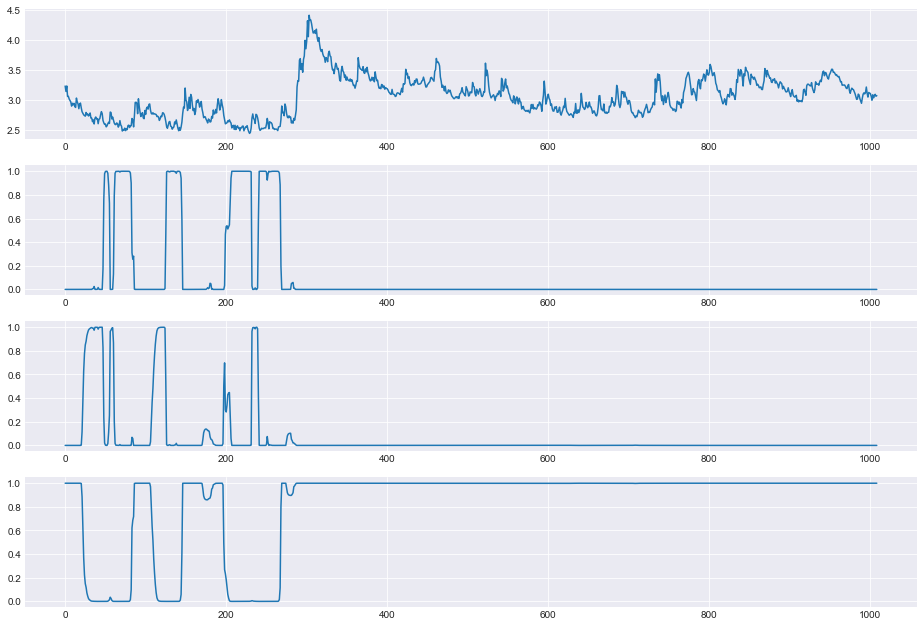


ite=36, max(diff) = 48.56968563197965

mu_hat0 = [2.5629 2.7169 3.1411], 
sigma_hat0 = [0.0512 0.054  0.2896], 
P_hat0 = 
[[0.9489 0.0213 0.0298]
 [0.0919 0.9068 0.0013]
 [0.     0.0039 0.9961]], 
pi_hat0 = [0. 0. 1.]



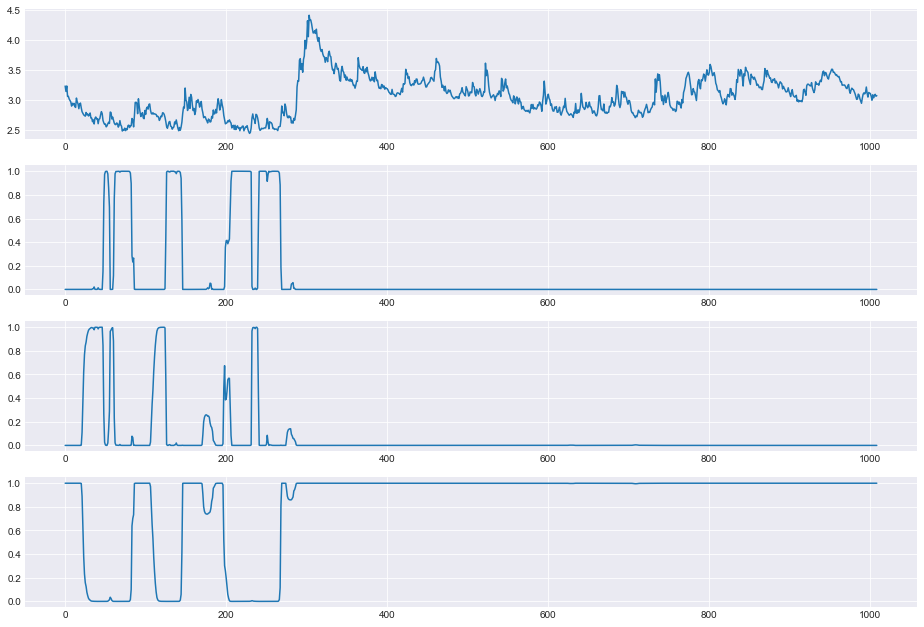


ite=37, max(diff) = 94.1896350330964

mu_hat0 = [2.562  2.7146 3.1419], 
sigma_hat0 = [0.0508 0.0547 0.2892], 
P_hat0 = 
[[0.9481 0.0218 0.0301]
 [0.0881 0.9078 0.0041]
 [0.     0.0041 0.9959]], 
pi_hat0 = [0. 0. 1.]



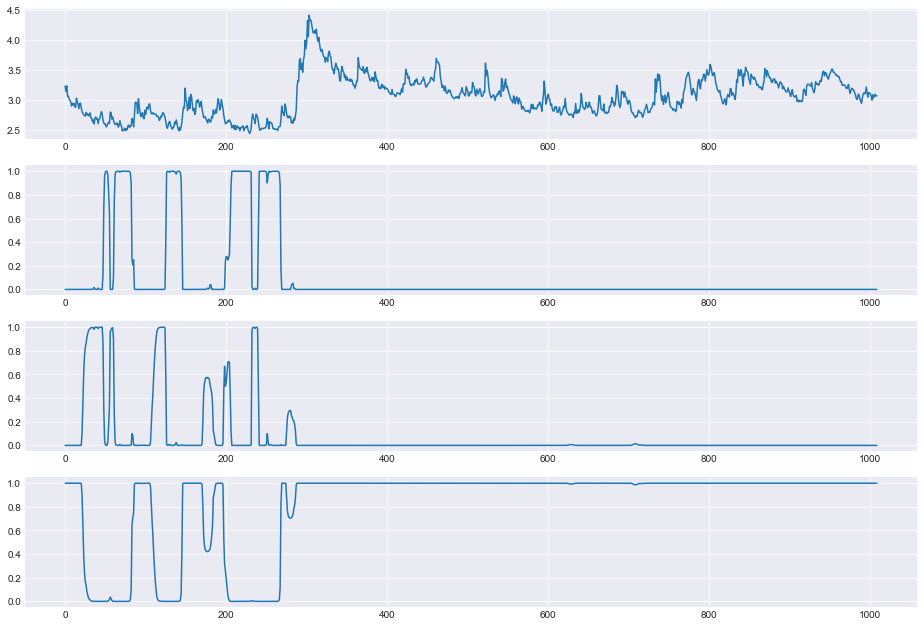


ite=38, max(diff) = 201.5495243627502

mu_hat0 = [2.561  2.7109 3.1448], 
sigma_hat0 = [0.0503 0.0551 0.2878], 
P_hat0 = 
[[0.9475 0.0225 0.03  ]
 [0.0794 0.909  0.0116]
 [0.     0.0048 0.9952]], 
pi_hat0 = [0. 0. 1.]



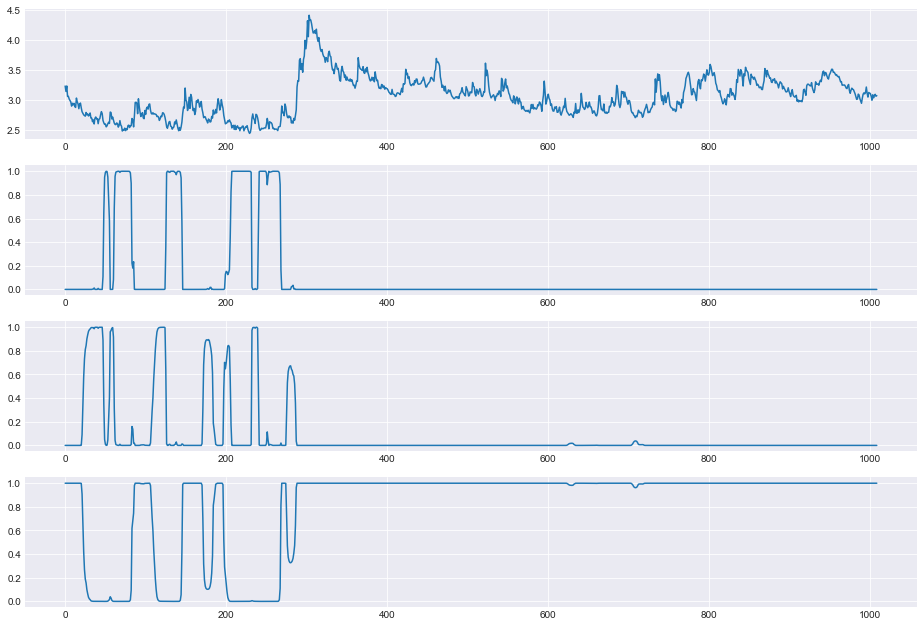


ite=39, max(diff) = 252.27599932111576

mu_hat0 = [2.5599 2.7069 3.1493], 
sigma_hat0 = [0.0497 0.0552 0.2855], 
P_hat0 = 
[[0.9473 0.0238 0.0289]
 [0.069  0.9093 0.0217]
 [0.     0.0057 0.9943]], 
pi_hat0 = [0. 0. 1.]



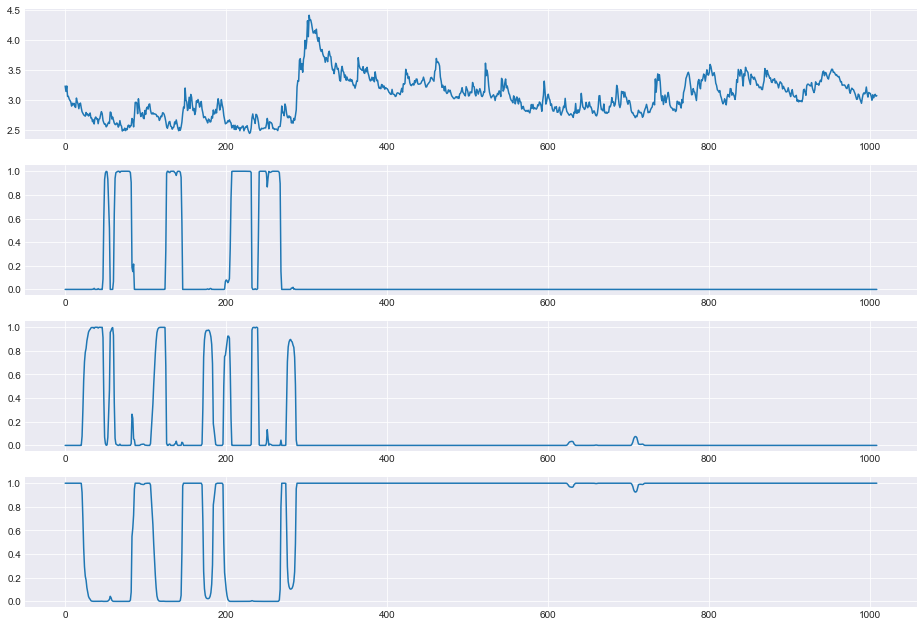


ite=40, max(diff) = 156.19753157281116

mu_hat0 = [2.5589 2.7046 3.1515], 
sigma_hat0 = [0.0492 0.0553 0.2844], 
P_hat0 = 
[[0.947  0.0256 0.0275]
 [0.0645 0.9083 0.0272]
 [0.     0.0062 0.9938]], 
pi_hat0 = [0. 0. 1.]



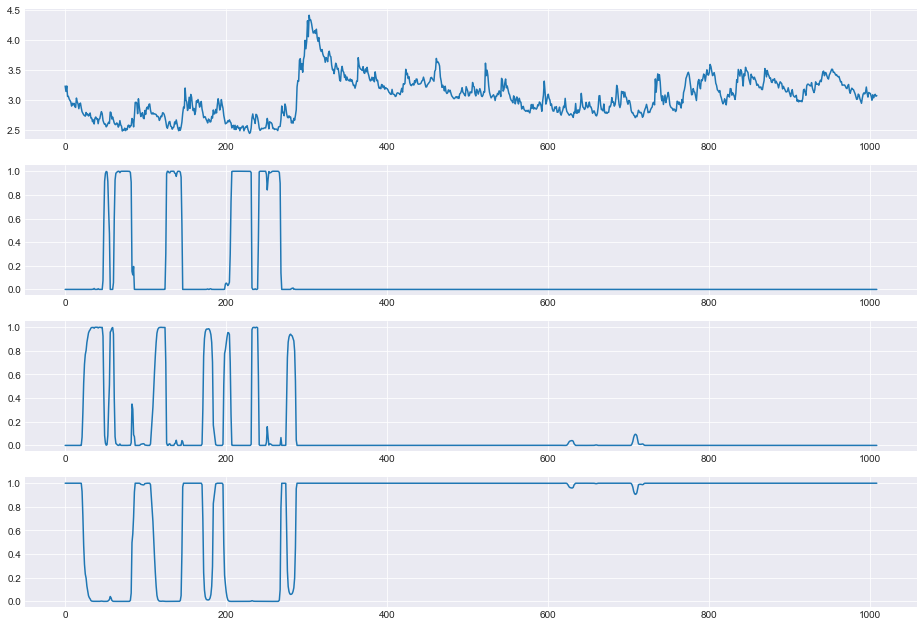


ite=41, max(diff) = 82.74500459223133

mu_hat0 = [2.5584 2.7036 3.1519], 
sigma_hat0 = [0.0489 0.0554 0.2841], 
P_hat0 = 
[[0.9464 0.0274 0.0263]
 [0.0636 0.9069 0.0295]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



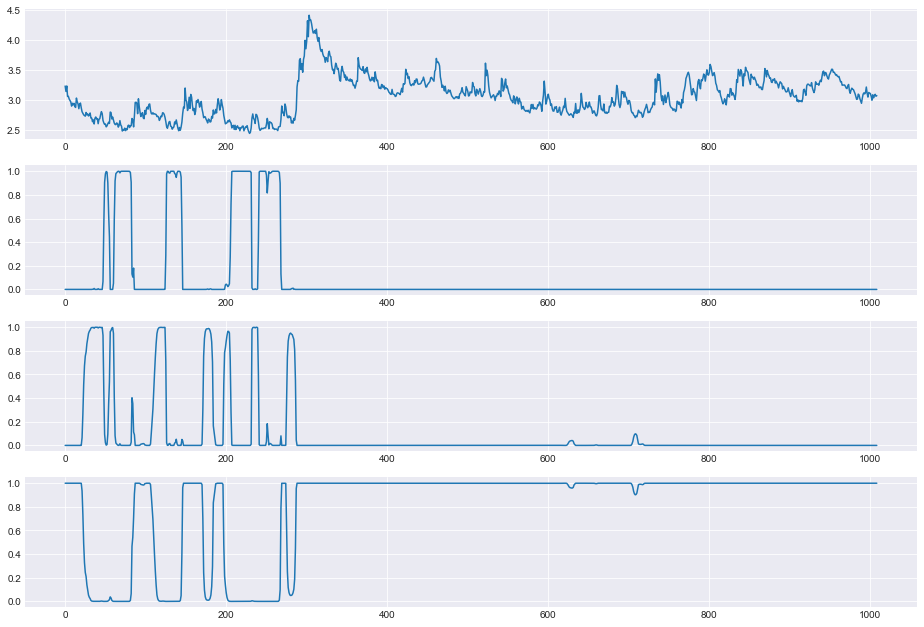


ite=42, max(diff) = 49.798806554666726

mu_hat0 = [2.5581 2.703  3.152 ], 
sigma_hat0 = [0.0487 0.0555 0.2841], 
P_hat0 = 
[[0.9457 0.0287 0.0255]
 [0.0637 0.9058 0.0305]
 [0.     0.0064 0.9936]], 
pi_hat0 = [0. 0. 1.]



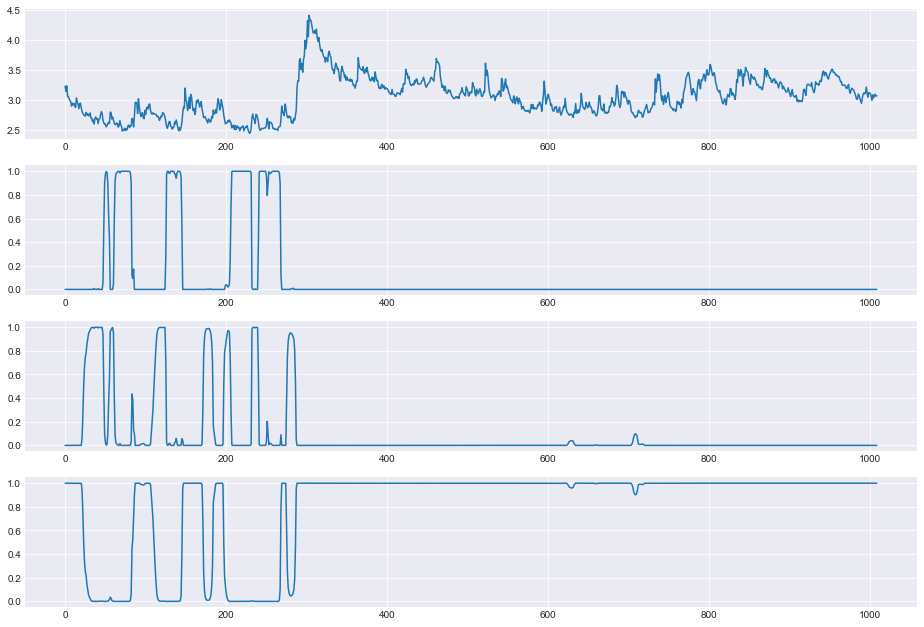


ite=43, max(diff) = 35.13470350916446

mu_hat0 = [2.5578 2.7026 3.152 ], 
sigma_hat0 = [0.0486 0.0555 0.284 ], 
P_hat0 = 
[[0.9452 0.0297 0.0251]
 [0.0639 0.905  0.031 ]
 [0.     0.0064 0.9936]], 
pi_hat0 = [0. 0. 1.]



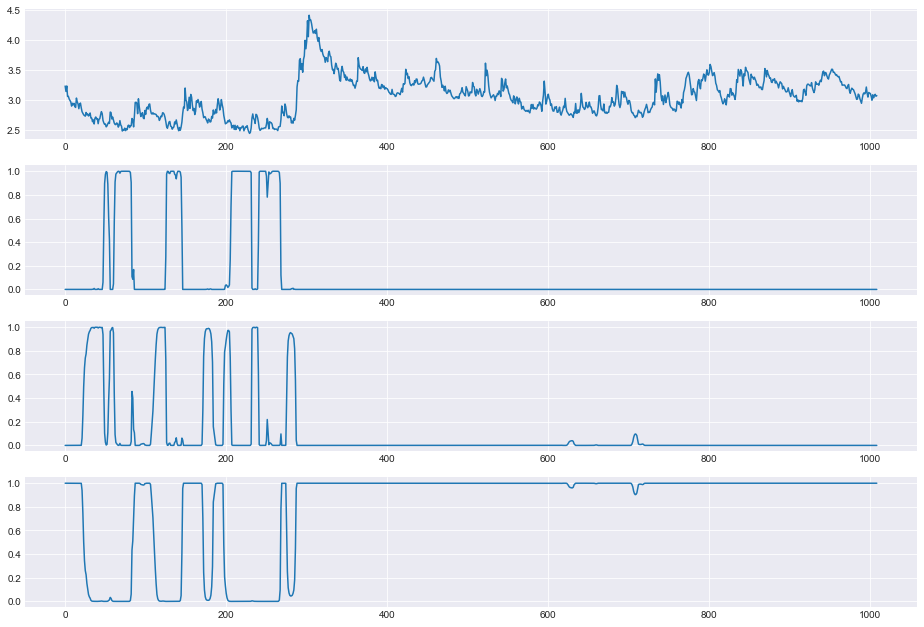


ite=44, max(diff) = 24.41897670944702

mu_hat0 = [2.5577 2.7023 3.1519], 
sigma_hat0 = [0.0485 0.0556 0.284 ], 
P_hat0 = 
[[0.9449 0.0303 0.0248]
 [0.0642 0.9045 0.0314]
 [0.     0.0064 0.9936]], 
pi_hat0 = [0. 0. 1.]



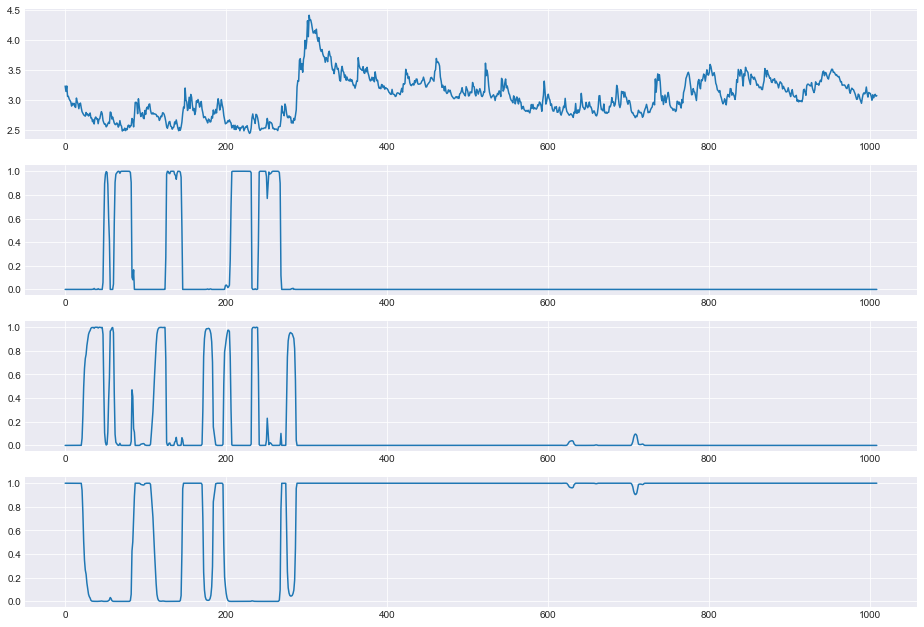


ite=45, max(diff) = 16.92547879509127

mu_hat0 = [2.5576 2.7021 3.1519], 
sigma_hat0 = [0.0484 0.0556 0.284 ], 
P_hat0 = 
[[0.9446 0.0308 0.0246]
 [0.0643 0.9041 0.0316]
 [0.     0.0064 0.9936]], 
pi_hat0 = [0. 0. 1.]



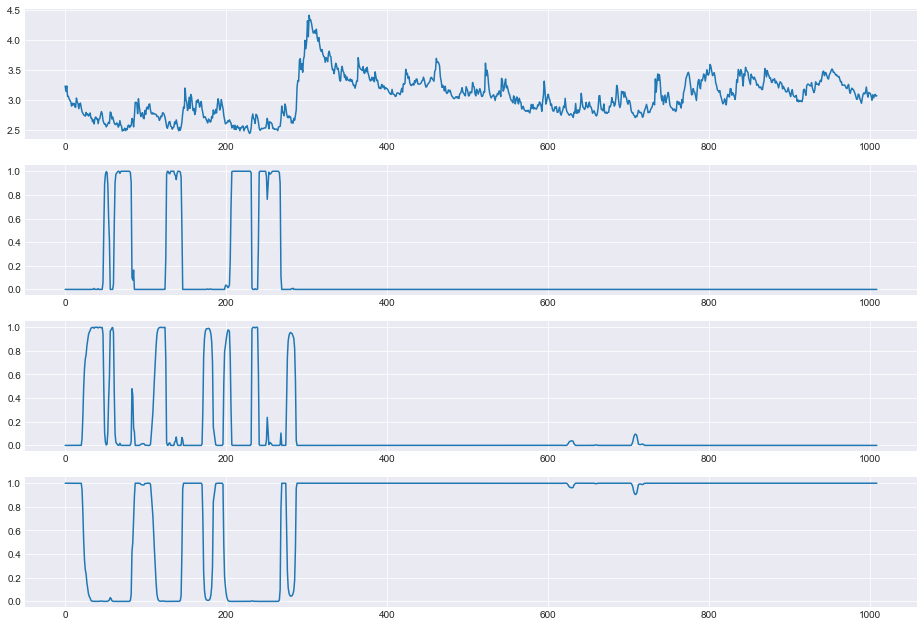


ite=46, max(diff) = 11.762750521964408

mu_hat0 = [2.5575 2.702  3.1519], 
sigma_hat0 = [0.0484 0.0556 0.284 ], 
P_hat0 = 
[[0.9444 0.0311 0.0244]
 [0.0644 0.9038 0.0318]
 [0.     0.0064 0.9936]], 
pi_hat0 = [0. 0. 1.]



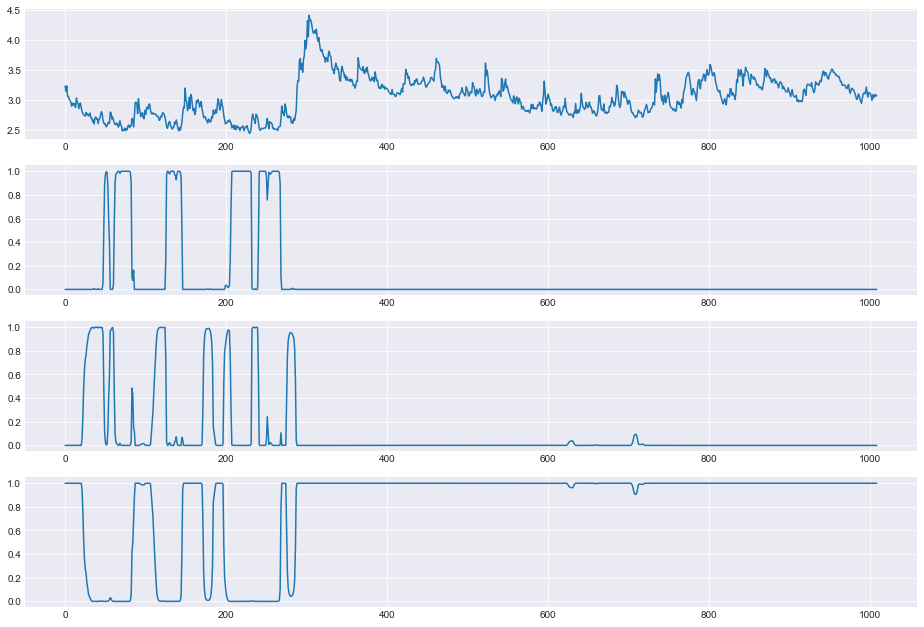


ite=47, max(diff) = 8.205764638975175

mu_hat0 = [2.5575 2.7019 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.9443 0.0314 0.0244]
 [0.0645 0.9036 0.0319]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



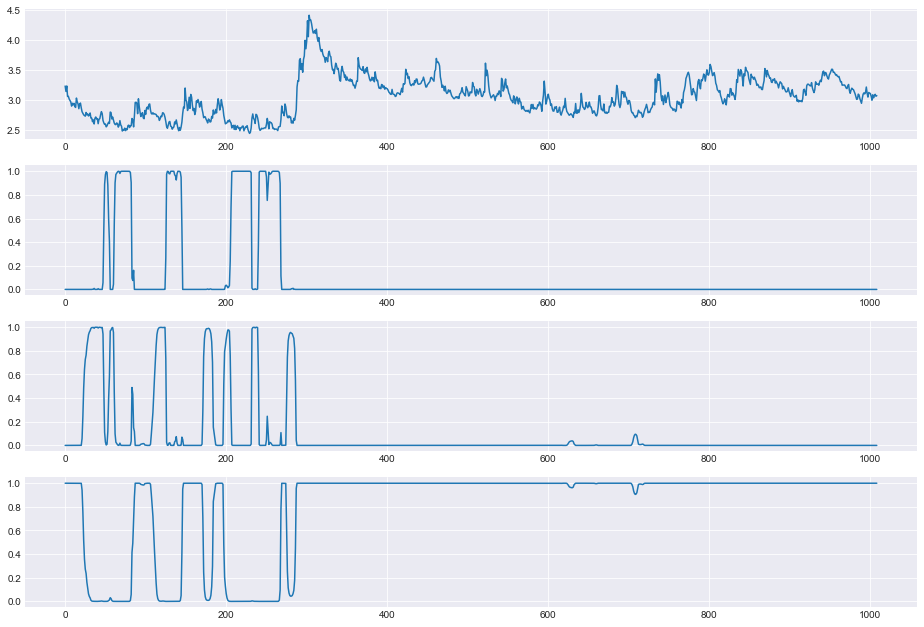


ite=48, max(diff) = 5.743449833437988

mu_hat0 = [2.5575 2.7019 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.9442 0.0315 0.0243]
 [0.0646 0.9035 0.0319]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



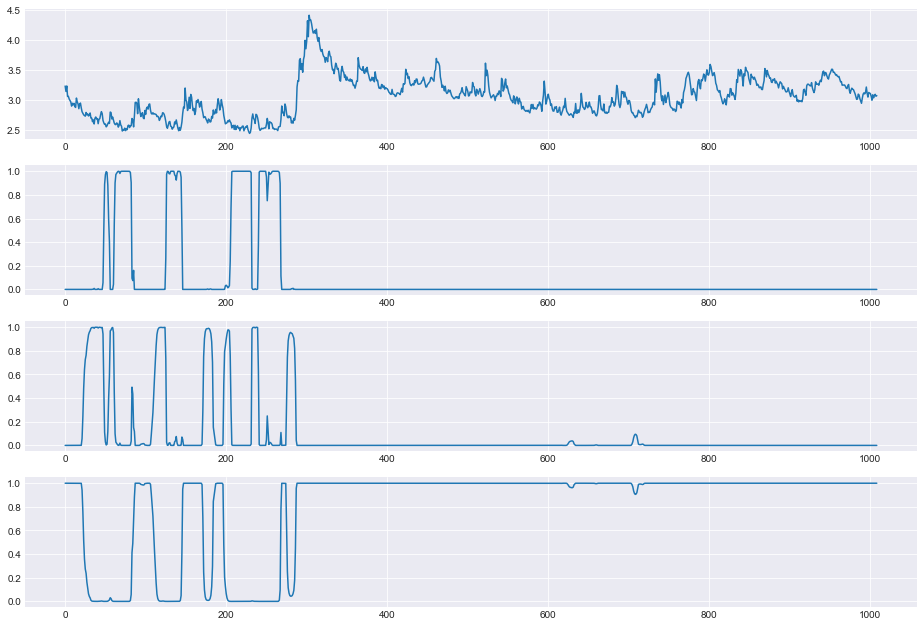


ite=49, max(diff) = 4.030290136376917

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.9441 0.0316 0.0242]
 [0.0646 0.9034 0.032 ]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



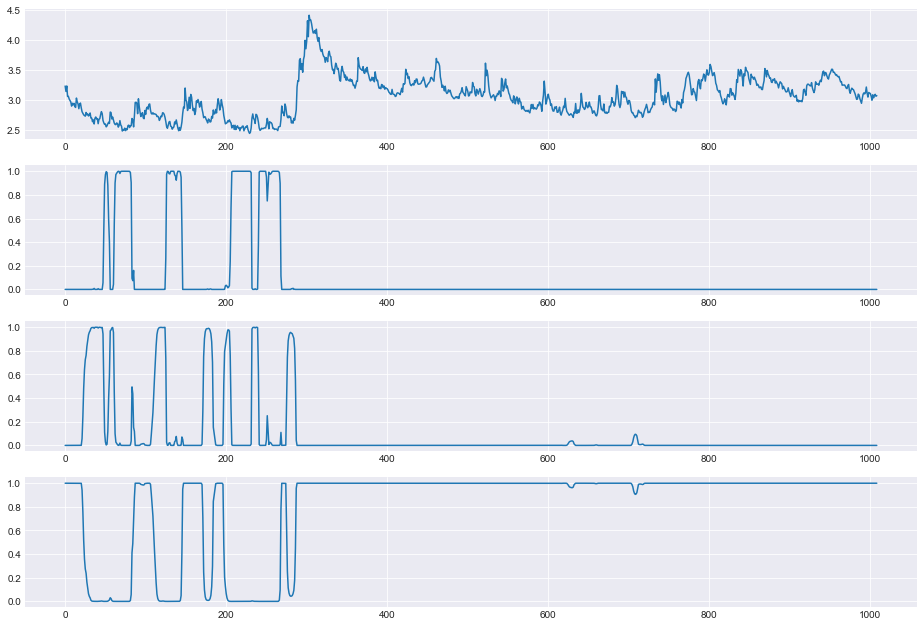


ite=50, max(diff) = 2.833375939075228

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.9441 0.0317 0.0242]
 [0.0647 0.9033 0.032 ]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



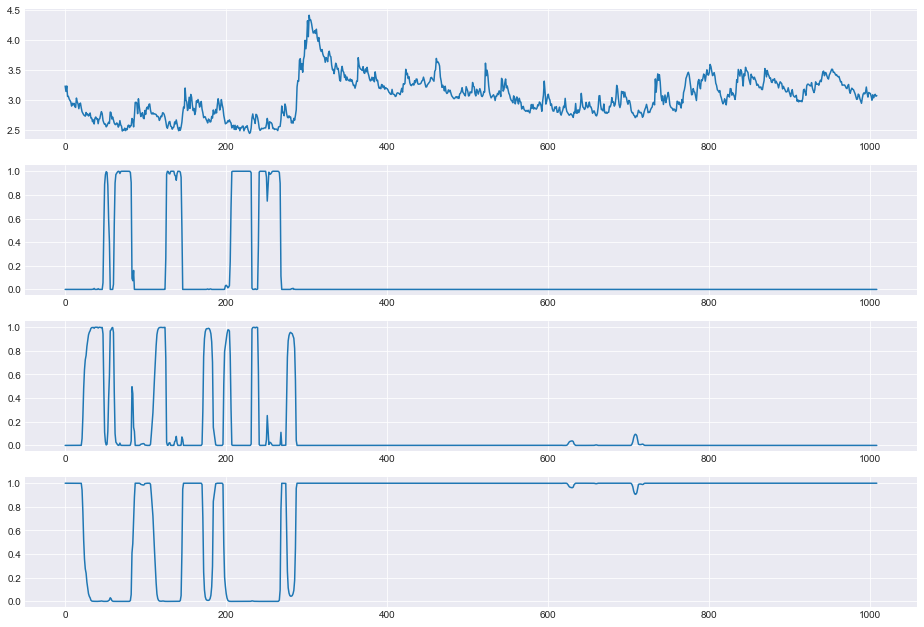


ite=51, max(diff) = 1.9945124672166112

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.9441 0.0318 0.0242]
 [0.0647 0.9033 0.032 ]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



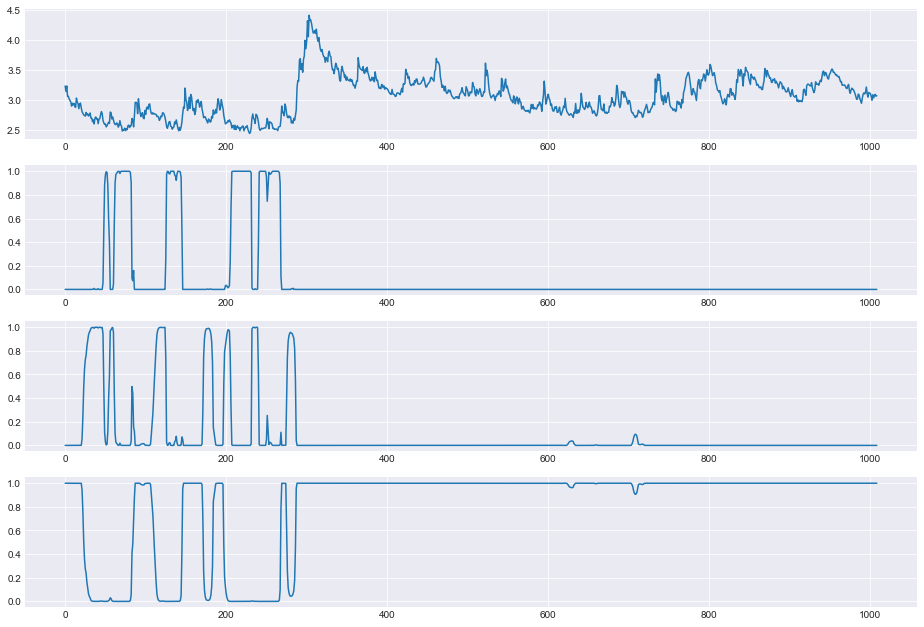


ite=52, max(diff) = 1.4052624147239783

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0318 0.0242]
 [0.0647 0.9033 0.032 ]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



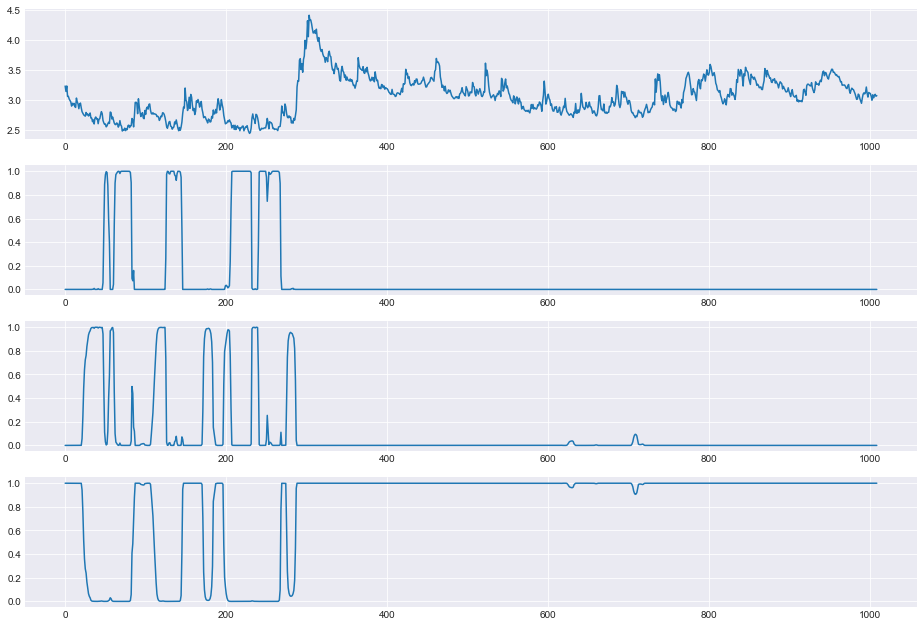


ite=53, max(diff) = 0.9906964664300327

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0318 0.0242]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



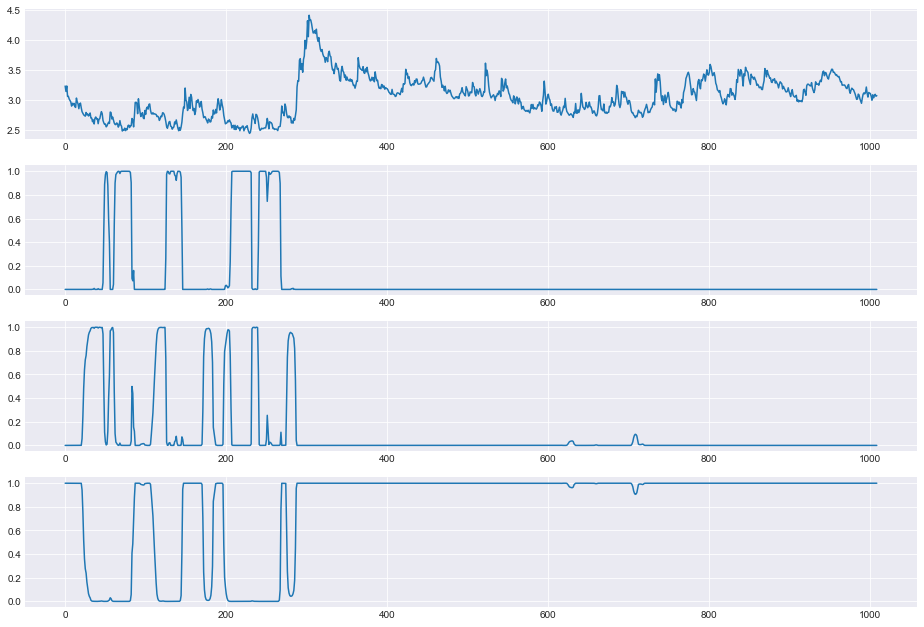


ite=54, max(diff) = 0.6987130413930315

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0318 0.0242]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



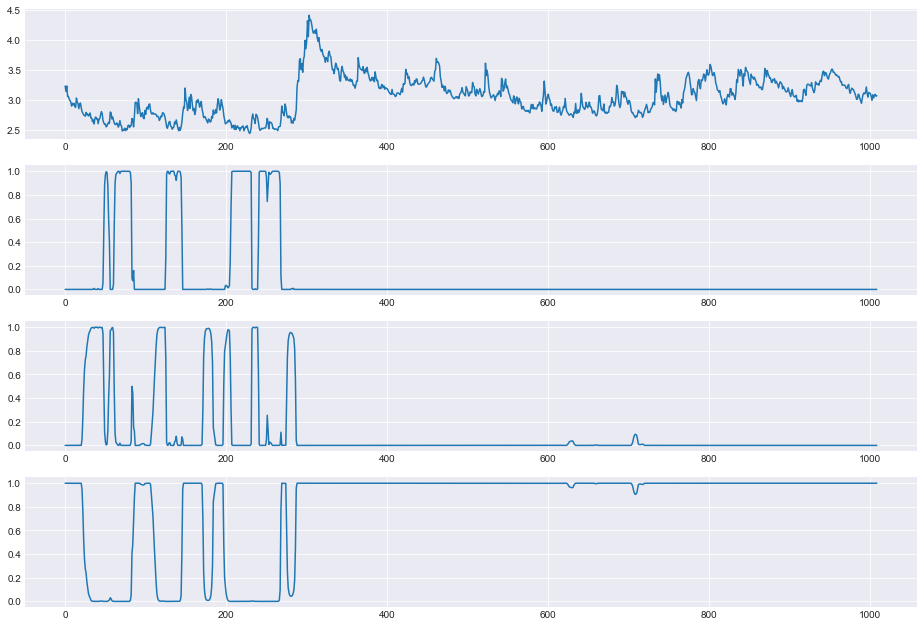


ite=55, max(diff) = 0.49291520036730607

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0318 0.0242]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



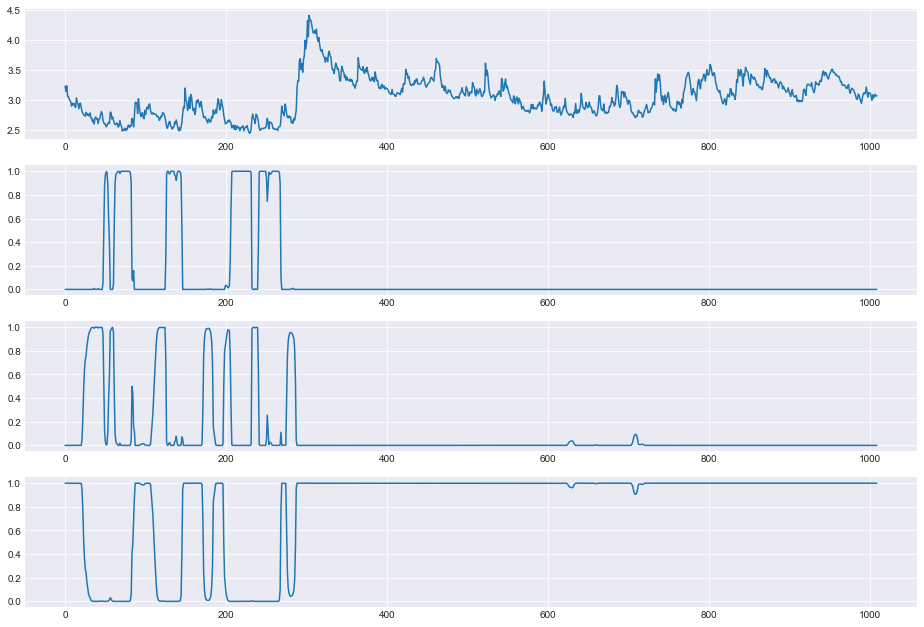


ite=56, max(diff) = 0.34779247190733564

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0242]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



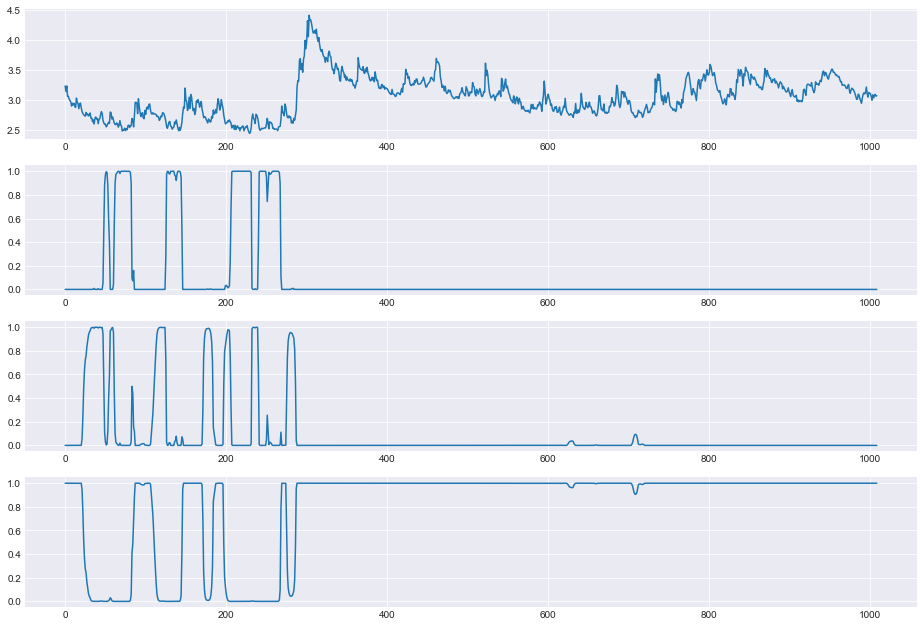


ite=57, max(diff) = 0.2454232375403119

mu_hat0 = [2.5574 2.7018 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



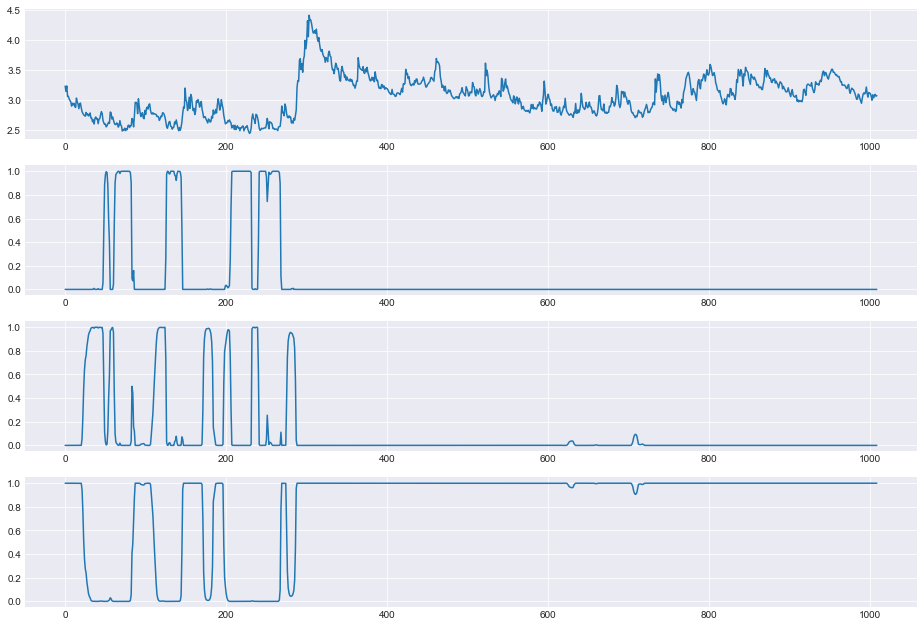


ite=58, max(diff) = 0.17319719793859079

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



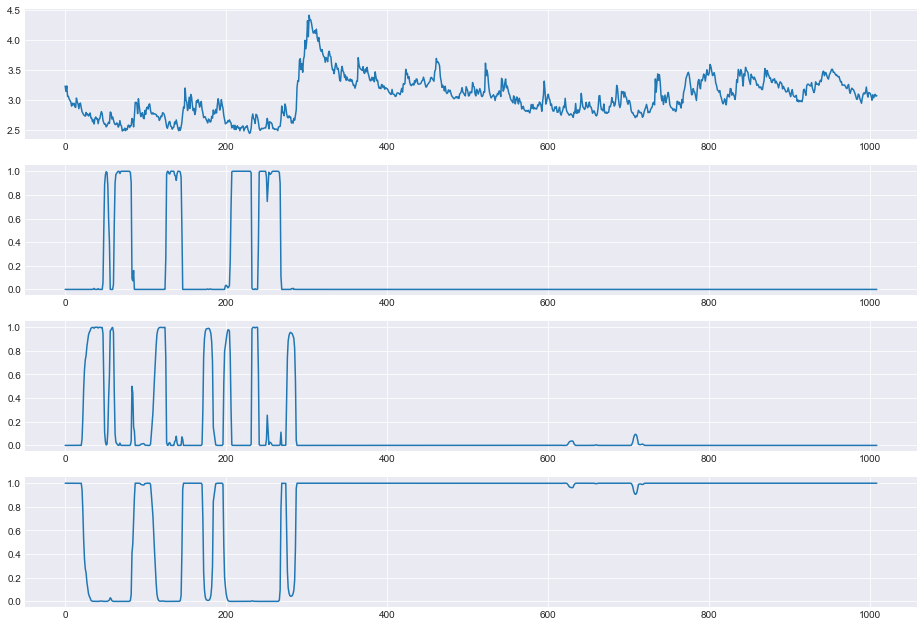


ite=59, max(diff) = 0.1222317665493678

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



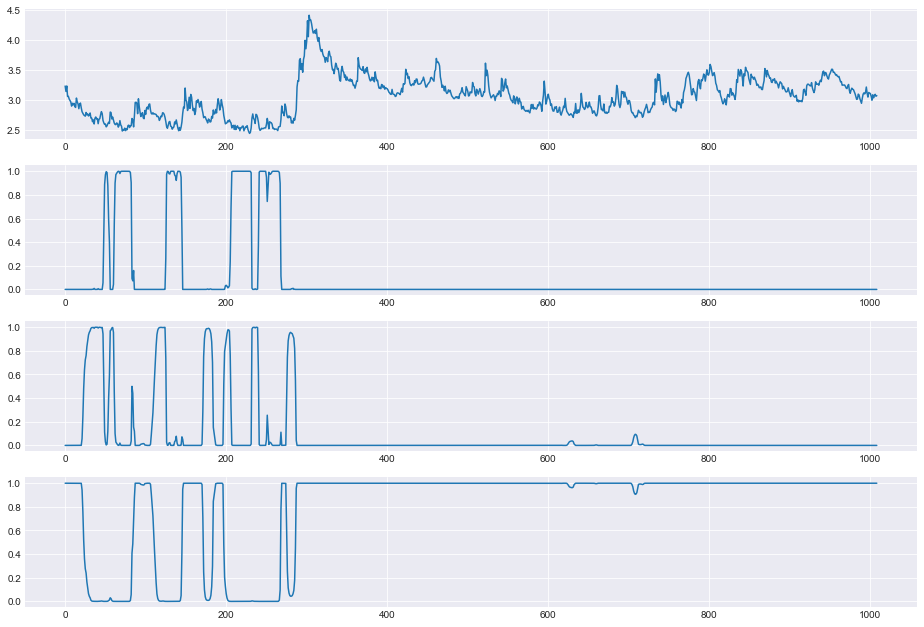


ite=60, max(diff) = 0.08626565006436028

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



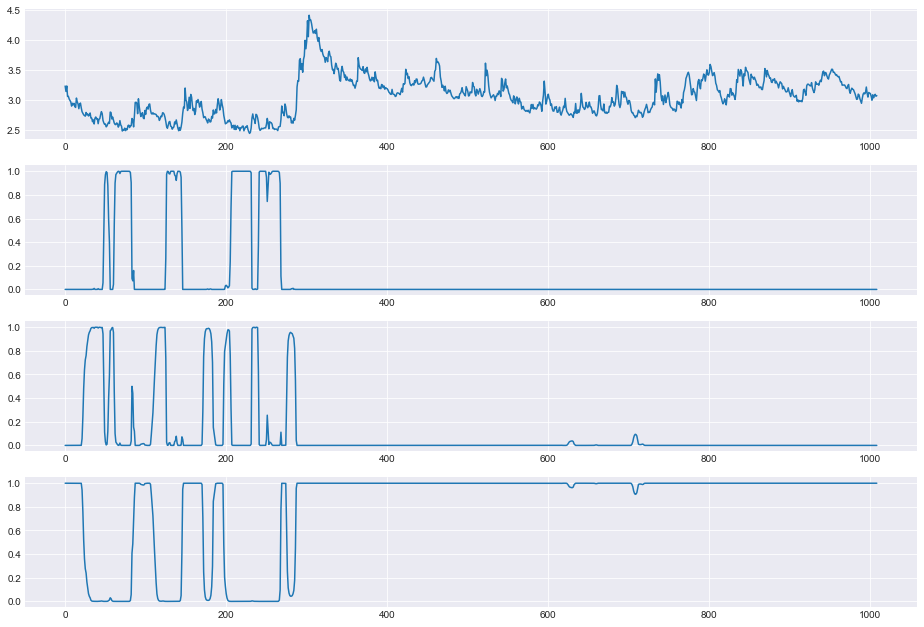


ite=61, max(diff) = 0.0608832167943614

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



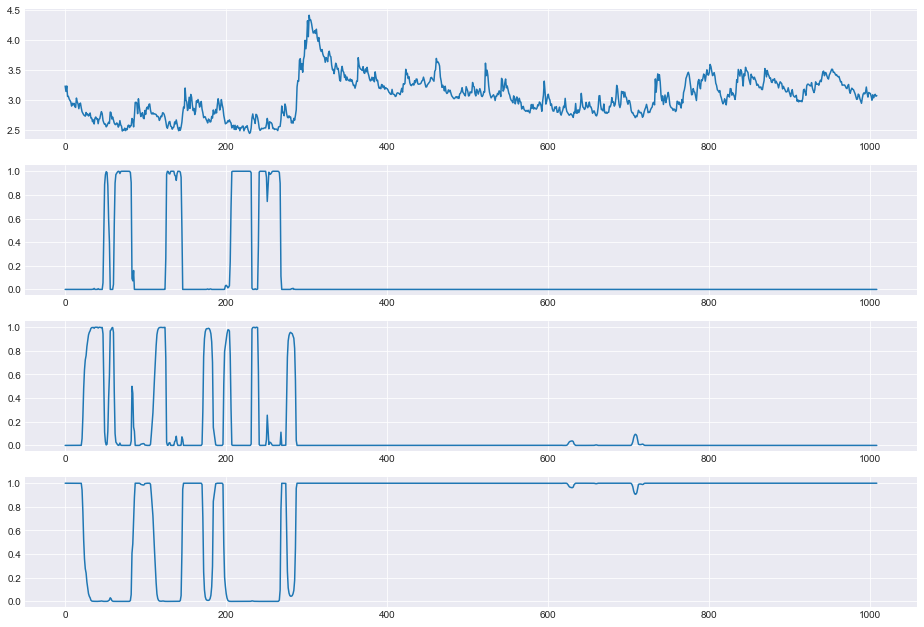


ite=62, max(diff) = 0.04296949648226363

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



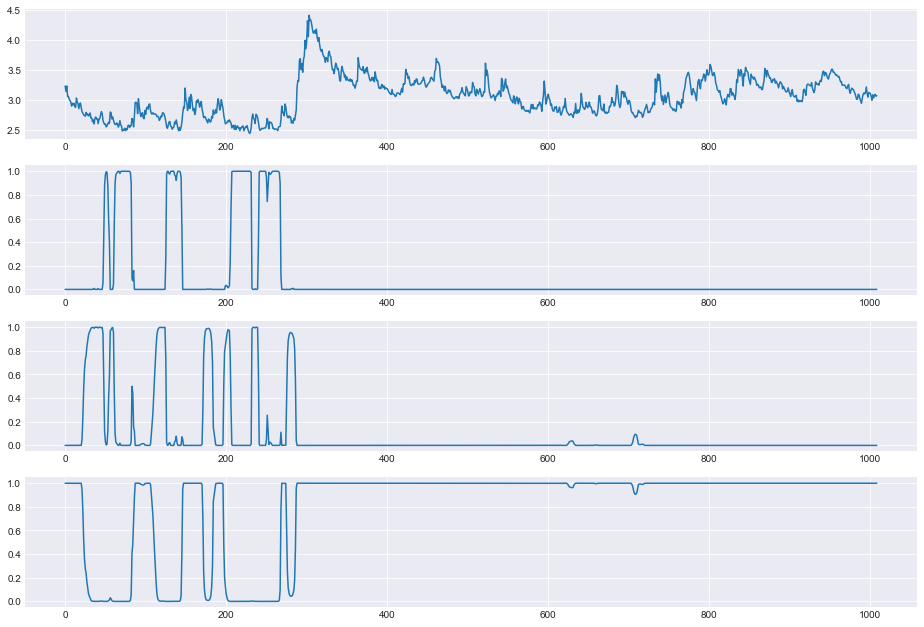


ite=63, max(diff) = 0.030326632412614254

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



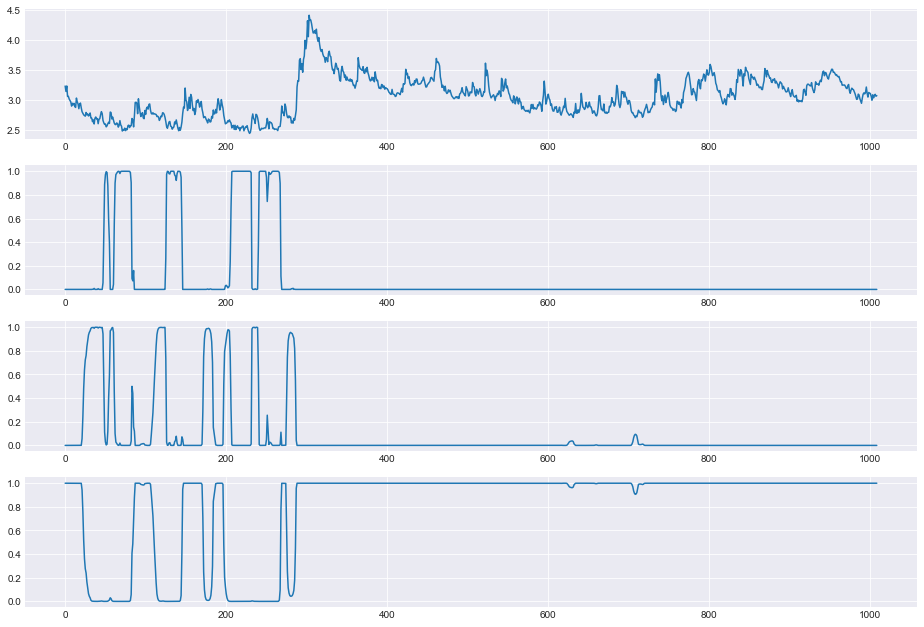


ite=64, max(diff) = 0.021403675883454806

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



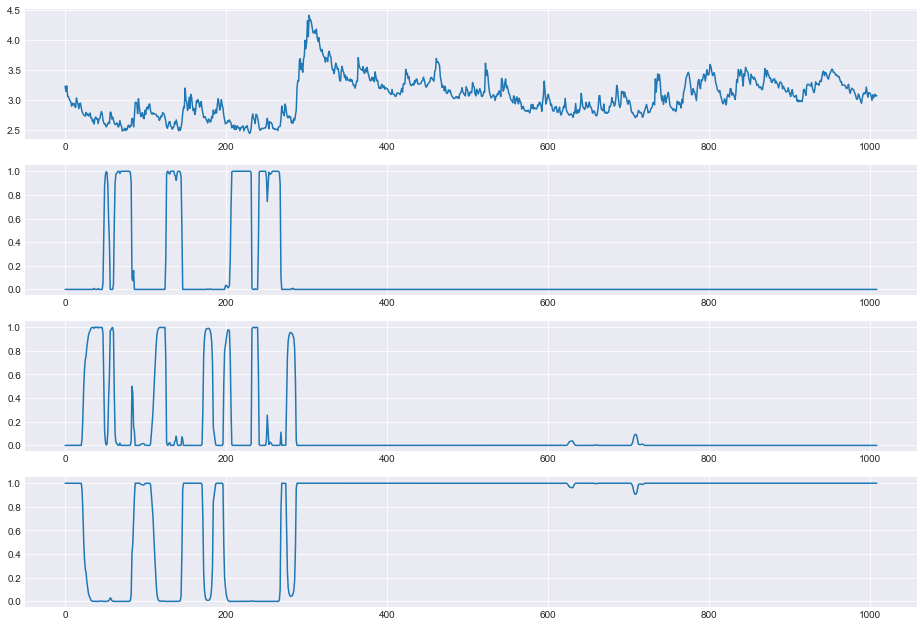


ite=65, max(diff) = 0.015106096964354054

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



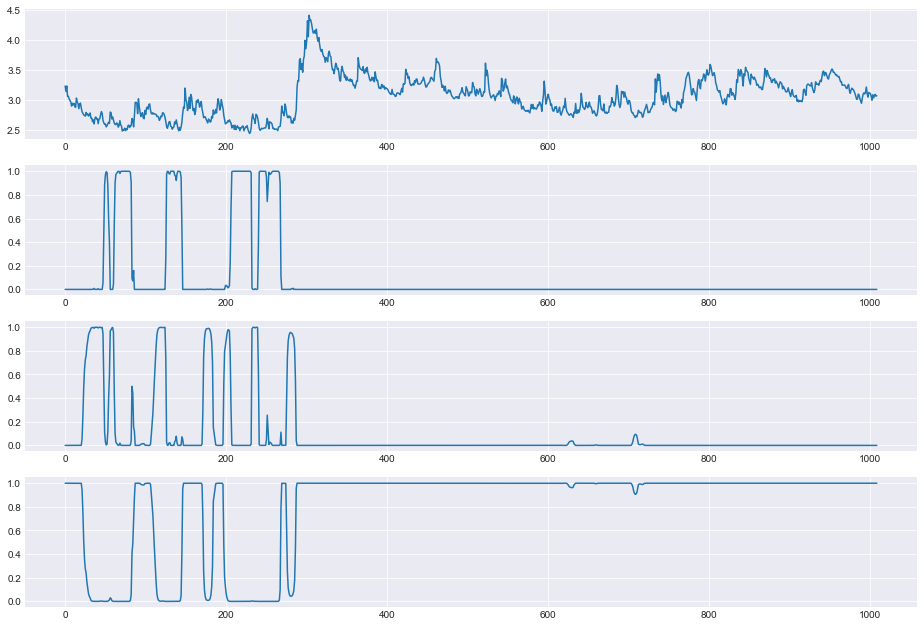


ite=66, max(diff) = 0.010661434563458486

mu_hat0 = [2.5574 2.7017 3.1519], 
sigma_hat0 = [0.0483 0.0556 0.284 ], 
P_hat0 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat0 = [0. 0. 1.]



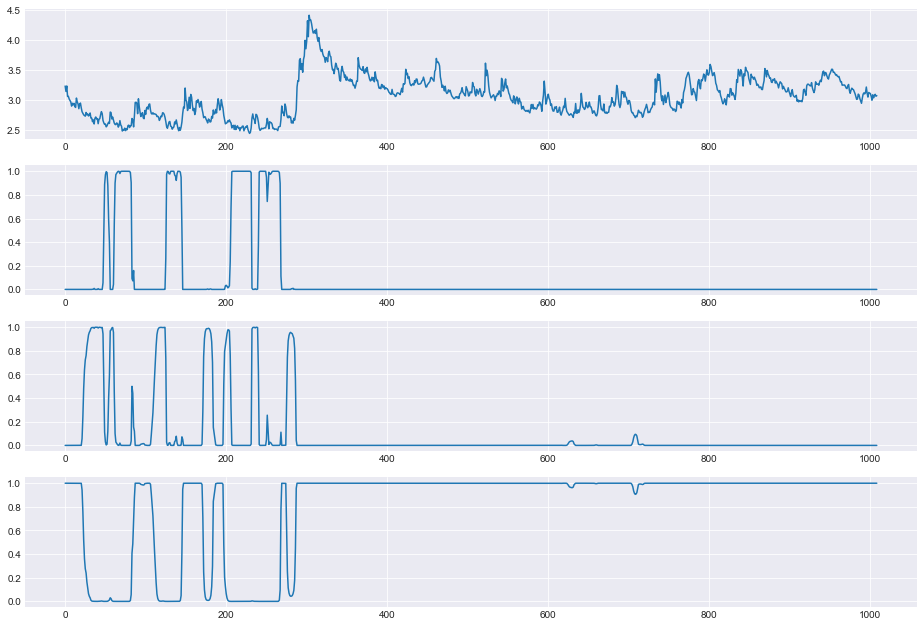


ite=67, max(diff) = 0.0075245131353051525

mu_hat1 = [2.5574 2.7017 3.1519], 
sigma_hat1 = [0.0483 0.0556 0.284 ], 
P_hat1 = 
[[0.944  0.0319 0.0241]
 [0.0647 0.9032 0.0321]
 [0.     0.0063 0.9937]], 
pi_hat1 = [0. 0. 1.]


In [ ]:


# Initialize parameters
T = len(YData)
N = 3

# SET INITIAL GUESSES

mu_hat0 = [2.5, 3, 3.5] * np.ones((N))
sigma_hat0 = [0.3, 0.4, 0.5] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = (1 - P_hat0[0, 0])/2
P_hat0[0, 2] = (1 - P_hat0[0, 0])/2

P_hat0[1, 1] = 0.90
P_hat0[1, 0] = (1 - P_hat0[1, 1])/2
P_hat0[1, 2] = (1 - P_hat0[1, 1])/2

P_hat0[2, 2] = 0.70
P_hat0[2, 0] = (1 - P_hat0[2, 2])/2
P_hat0[2, 1] = (1 - P_hat0[2, 2])/2



pi_hat0 = [0.5, 0.25, 0.25] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {np.round(mu_hat0,4)}, \nsigma_hat0 = {np.round(sigma_hat0,4)}, \nP_hat0 = \n{np.round(P_hat0,4)}, \npi_hat0 = {np.round(pi_hat0,4)}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(4, 1, 1)
    plt.plot(YData)
    plt.subplot(4, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(4, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    plt.subplot(4, 1, 4)
    plt.plot(xi_prob_T[:, 2])
    fig = plt.gcf()
    fig.set_size_inches(16, 11)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {np.round(mu_hat1,4)}, \nsigma_hat1 = {np.round(sigma_hat1,4)}, \nP_hat1 = \n{np.round(P_hat1,4)}, \npi_hat1 = {np.round(pi_hat1,4)}")
        break
